# **Stock Predictions**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import yfinance as yf
import pandas as pd

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense
import warnings
warnings.filterwarnings("ignore")
from IPython.display import display

## **1) Apple Inc. (AAPL)**

In [ ]:
aapl_stock = yf.download("AAPL", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
aapl_stock

[*********************100%***********************]  1 of 1 completed


Ticker,AAPL
Date,
2013-01-02,16.628313
2013-01-03,16.418434
2013-01-04,15.961096
2013-01-07,15.867213
2013-01-08,15.909910
...,...
2024-12-20,253.589783
2024-12-23,254.367020
2024-12-24,257.286682


In [ ]:
aapl_stock = aapl_stock.reset_index()  # Move Date from index to column
aapl_stock.columns = ['Date', 'Adj Close']  # Renaming columns
aapl_stock['Stock Name'] = 'Apple'
aapl_stock.to_csv('Stocks Data/Apple_stock.csv', index=False)
aapl_stock

,Date,Adj Close,Stock Name
0,2013-01-02,16.628313,Apple
1,2013-01-03,16.418434,Apple
2,2013-01-04,15.961096,Apple
3,2013-01-07,15.867213,Apple
4,2013-01-08,15.909910,Apple
...,...,...,...
3013,2024-12-20,253.589783,Apple
3014,2024-12-23,254.367020,Apple
3015,2024-12-24,257.286682,Apple
3016,2024-12-26,258.103729,Apple


## **Apple 3 Months**

In [ ]:
three_months_stock1 = yf.download("AAPL", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock1 = three_months_stock1.reset_index()  # Move Date from index to column
three_months_stock1.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock1['Stock Name'] = 'Apple_3Months'
three_months_stock1.to_csv('Stocks Data/Apple3Months_Stock.csv', index=False)
three_months_stock1

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,242.987427,Apple_3Months
1,2025-01-03,242.499161,Apple_3Months
2,2025-01-06,244.133347,Apple_3Months
3,2025-01-07,241.353210,Apple_3Months
4,2025-01-08,241.841476,Apple_3Months
5,2025-01-10,236.012192,Apple_3Months
6,2025-01-13,233.570847,Apple_3Months
7,2025-01-14,232.454803,Apple_3Months
8,2025-01-15,237.028564,Apple_3Months
9,2025-01-16,227.452560,Apple_3Months


## **2) Microsoft Corporation (MSFT)**

In [ ]:
msft_stock = yf.download("MSFT", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
msft_stock = msft_stock.reset_index()  # Move Date from index to column
msft_stock.columns = ['Date', 'Adj Close']  # Renaming columns
msft_stock['Stock Name'] = 'MSFT'
msft_stock.to_csv('Stocks Data/Microsoft_stock.csv', index=False)
msft_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,22.321144,MSFT
1,2013-01-03,22.022131,MSFT
2,2013-01-04,21.609970,MSFT
3,2013-01-07,21.569561,MSFT
4,2013-01-08,21.456429,MSFT
...,...,...,...
3013,2024-12-20,434.927856,MSFT
3014,2024-12-23,433.583038,MSFT
3015,2024-12-24,437.647369,MSFT
3016,2024-12-26,436.432068,MSFT


## **Microsoft 3 Months**

In [ ]:
three_months_stock2 = yf.download("MSFT", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock2 = three_months_stock2.reset_index()  # Move Date from index to column
three_months_stock2.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock2['Stock Name'] = 'MSFT_3Months'
three_months_stock2.to_csv('Stocks Data/Microsoft3Months_Stock.csv', index=False)
three_months_stock2

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,416.976868,MSFT_3Months
1,2025-01-03,421.728607,MSFT_3Months
2,2025-01-06,426.211365,MSFT_3Months
3,2025-01-07,420.752350,MSFT_3Months
4,2025-01-08,422.933990,MSFT_3Months
5,2025-01-10,417.345459,MSFT_3Months
6,2025-01-13,415.592194,MSFT_3Months
7,2025-01-14,414.078033,MSFT_3Months
8,2025-01-15,424.677277,MSFT_3Months
9,2025-01-16,422.953857,MSFT_3Months


## **3) Alphabet Inc. (GOOGL)**

In [ ]:
googl_stock = yf.download("GOOGL", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
googl_stock = googl_stock.reset_index()  # Move Date from index to column
googl_stock.columns = ['Date', 'Adj Close']  # Renaming columns
googl_stock['Stock Name'] = 'Google'
googl_stock.to_csv('Stocks Data/ALPHABET_stock.csv', index=False)
googl_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,17.991446,Google
1,2013-01-03,18.001896,Google
2,2013-01-04,18.357622,Google
3,2013-01-07,18.277519,Google
4,2013-01-08,18.241453,Google
...,...,...,...
3013,2024-12-20,190.958633,Google
3014,2024-12-23,194.171036,Google
3015,2024-12-24,195.647552,Google
3016,2024-12-26,195.138748,Google


## **Google 3 Months**

In [ ]:
three_months_stock3 = yf.download("GOOGL", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock3 = three_months_stock3.reset_index()  # Move Date from index to column
three_months_stock3.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock3['Stock Name'] = 'Google_3Months'
three_months_stock3.to_csv('Stocks Data/Google3Months_Stock.csv', index=False)
three_months_stock3

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,188.983292,Google_3Months
1,2025-01-03,191.337738,Google_3Months
2,2025-01-06,196.405762,Google_3Months
3,2025-01-07,195.029022,Google_3Months
4,2025-01-08,193.492645,Google_3Months
5,2025-01-10,191.587143,Google_3Months
6,2025-01-13,190.559570,Google_3Months
7,2025-01-14,189.212753,Google_3Months
8,2025-01-15,195.088867,Google_3Months
9,2025-01-16,192.455093,Google_3Months


## **4) Exxon Mobil Corporation (XOM)**

In [ ]:
xom_stock = yf.download("XOM", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
xom_stock = xom_stock.reset_index()  # Move Date from index to column
xom_stock.columns = ['Date', 'Adj Close']  # Renaming columns
xom_stock['Stock Name'] = 'XOM'
xom_stock.to_csv('Stocks Data/EXXON_stock.csv', index=False)
xom_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,53.340271,XOM
1,2013-01-03,53.244072,XOM
2,2013-01-04,53.490604,XOM
3,2013-01-07,52.871269,XOM
4,2013-01-08,53.201984,XOM
...,...,...,...
3013,2024-12-20,103.973801,XOM
3014,2024-12-23,104.396103,XOM
3015,2024-12-24,104.494308,XOM
3016,2024-12-26,104.582695,XOM


## **XOM 3 Months**

In [ ]:
three_months_stock4 = yf.download("XOM", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock4 = three_months_stock4.reset_index()  # Move Date from index to column
three_months_stock4.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock4['Stock Name'] = 'XOM_3Months'
three_months_stock4.to_csv('Stocks Data/XOM3Months_Stock.csv', index=False)
three_months_stock4

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,105.388008,XOM_3Months
1,2025-01-03,105.928162,XOM_3Months
2,2025-01-06,105.810303,XOM_3Months
3,2025-01-07,106.802223,XOM_3Months
4,2025-01-08,105.014816,XOM_3Months
5,2025-01-10,104.631805,XOM_3Months
6,2025-01-13,107.332550,XOM_3Months
7,2025-01-14,107.754852,XOM_3Months
8,2025-01-15,109.512794,XOM_3Months
9,2025-01-16,109.326187,XOM_3Months


## **5) Diamondback Energy, Inc. (FANG)**

In [ ]:
fang_stock = yf.download("FANG", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
fang_stock = fang_stock.reset_index()  # Move Date from index to column
fang_stock.columns = ['Date', 'Adj Close']  # Renaming columns
fang_stock['Stock Name'] = 'FANG'
fang_stock.to_csv('Stocks Data/Diamondback_stock.csv', index=False)
fang_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,15.088324,FANG
1,2013-01-03,15.009900,FANG
2,2013-01-04,15.723536,FANG
3,2013-01-07,16.288174,FANG
4,2013-01-08,16.154861,FANG
...,...,...,...
3013,2024-12-20,152.791840,FANG
3014,2024-12-23,153.935760,FANG
3015,2024-12-24,155.582611,FANG
3016,2024-12-26,155.839005,FANG


## **FANG 3 Months**

In [ ]:
three_months_stock5 = yf.download("FANG", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock5 = three_months_stock5.reset_index()  # Move Date from index to column
three_months_stock5.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock5['Stock Name'] = 'FANG_3Months'
three_months_stock5.to_csv('Stocks Data/FANG3Months_Stock.csv', index=False)
three_months_stock5

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,164.467682,FANG_3Months
1,2025-01-03,168.589737,FANG_3Months
2,2025-01-06,167.288040,FANG_3Months
3,2025-01-07,170.029495,FANG_3Months
4,2025-01-08,168.619324,FANG_3Months
5,2025-01-10,172.346924,FANG_3Months
6,2025-01-13,175.147522,FANG_3Months
7,2025-01-14,175.216553,FANG_3Months
8,2025-01-15,177.070496,FANG_3Months
9,2025-01-16,176.636597,FANG_3Months


## **6) Walmart Inc. (WMT)**

In [ ]:
wmt_stock = yf.download("WMT", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
wmt_stock = wmt_stock.reset_index()  # Move Date from index to column
wmt_stock.columns = ['Date', 'Adj Close']  # Renaming columns
wmt_stock['Stock Name'] = 'WMT'
wmt_stock.to_csv('Stocks Data/Walmart_stock.csv', index=False)
wmt_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,17.898834,WMT
1,2013-01-03,17.785095,WMT
2,2013-01-04,17.852306,WMT
3,2013-01-07,17.681686,WMT
4,2013-01-08,17.730803,WMT
...,...,...,...
3013,2024-12-20,91.765518,WMT
3014,2024-12-23,89.885246,WMT
3015,2024-12-24,92.203255,WMT
3016,2024-12-26,92.312698,WMT


## **Wallmart 3 Months**

In [ ]:
three_months_stock6 = yf.download("WMT", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock6 = three_months_stock6.reset_index()  # Move Date from index to column
three_months_stock6.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock6['Stock Name'] = 'WMT_3Months'
three_months_stock6.to_csv('Stocks Data/WMT3Months_Stock.csv', index=False)
three_months_stock6

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,89.537041,WMT_3Months
1,2025-01-03,90.313034,WMT_3Months
2,2025-01-06,90.959686,WMT_3Months
3,2025-01-07,90.342873,WMT_3Months
4,2025-01-08,91.327789,WMT_3Months
5,2025-01-10,92.521614,WMT_3Months
6,2025-01-13,91.059174,WMT_3Months
7,2025-01-14,90.322983,WMT_3Months
8,2025-01-15,90.870148,WMT_3Months
9,2025-01-16,90.830360,WMT_3Months


## **7) Dollar General Corporation (DG)**

In [ ]:
dg_stock = yf.download("DG", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
dg_stock = dg_stock.reset_index()  # Move Date from index to column
dg_stock.columns = ['Date', 'Adj Close']  # Renaming columns
dg_stock['Stock Name'] = 'DG'
dg_stock.to_csv('Stocks Data/DG_stock.csv', index=False)
dg_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,37.553761,DG
1,2013-01-03,37.037525,DG
2,2013-01-04,39.023708,DG
3,2013-01-07,38.253735,DG
4,2013-01-08,37.938747,DG
...,...,...,...
3013,2024-12-20,74.937576,DG
3014,2024-12-23,73.191650,DG
3015,2024-12-24,73.211266,DG
3016,2024-12-26,74.182312,DG


## **DG 3 Months**

In [ ]:
three_months_stock7 = yf.download("DG", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock7 = three_months_stock7.reset_index()  # Move Date from index to column
three_months_stock7.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock7['Stock Name'] = 'DG_3Months'
three_months_stock7.to_csv('Stocks Data/DG3Months_Stock.csv', index=False)
three_months_stock7

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,74.182320,DG_3Months
1,2025-01-03,73.240685,DG_3Months
2,2025-01-06,74.398102,DG_3Months
3,2025-01-07,73.320587,DG_3Months
4,2025-01-08,70.799797,DG_3Months
5,2025-01-10,70.542770,DG_3Months
6,2025-01-13,70.770134,DG_3Months
7,2025-01-14,68.585442,DG_3Months
8,2025-01-15,67.784721,DG_3Months
9,2025-01-16,68.466820,DG_3Months


## **8) Johnson & Johnson (JNJ)**

In [ ]:
jnj_stock = yf.download("JNJ", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
jnj_stock = jnj_stock.reset_index()  # Move Date from index to column
jnj_stock.columns = ['Date', 'Adj Close']  # Renaming columns
jnj_stock['Stock Name'] = 'JNJ'
jnj_stock.to_csv('Stocks Data/Johnson&Johnson_stock.csv', index=False)
jnj_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,49.931343,JNJ
1,2013-01-03,49.860851,JNJ
2,2013-01-04,50.431789,JNJ
3,2013-01-07,50.326050,JNJ
4,2013-01-08,50.333092,JNJ
...,...,...,...
3013,2024-12-20,142.104507,JNJ
3014,2024-12-23,142.891418,JNJ
3015,2024-12-24,143.461914,JNJ
3016,2024-12-26,143.196320,JNJ


## **JNJ 3 Months**

In [ ]:
three_months_stock8 = yf.download("JNJ", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock8 = three_months_stock8.reset_index()  # Move Date from index to column
three_months_stock8.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock8['Stock Name'] = 'JNJ_3Months'
three_months_stock8.to_csv('Stocks Data/JNJ3Months_Stock.csv', index=False)
three_months_stock8

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,141.661880,JNJ_3Months
1,2025-01-03,141.829102,JNJ_3Months
2,2025-01-06,141.307770,JNJ_3Months
3,2025-01-07,143.835678,JNJ_3Months
4,2025-01-08,139.940536,JNJ_3Months
5,2025-01-10,139.733963,JNJ_3Months
6,2025-01-13,142.104507,JNJ_3Months
7,2025-01-14,142.379913,JNJ_3Months
8,2025-01-15,142.596329,JNJ_3Months
9,2025-01-16,145.350479,JNJ_3Months


## **9) JPMorgan Chase & Co. (JPM)**

In [ ]:
jpm_stock = yf.download("JPM", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
jpm_stock = jpm_stock.reset_index()  # Move Date from index to column
jpm_stock.columns = ['Date', 'Adj Close']  # Renaming columns
jpm_stock['Stock Name'] = 'JPM'
jpm_stock.to_csv('Stocks Data/JPMorgan_stock.csv', index=False)
jpm_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,31.797243,JPM
1,2013-01-03,31.733149,JPM
2,2013-01-04,32.295635,JPM
3,2013-01-07,32.331223,JPM
4,2013-01-08,32.395309,JPM
...,...,...,...
3013,2024-12-20,233.805740,JPM
3014,2024-12-23,234.583099,JPM
3015,2024-12-24,238.440506,JPM
3016,2024-12-26,239.257263,JPM


## **JPM 3 Months**

In [ ]:
three_months_stock9 = yf.download("JPM", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock9 = three_months_stock9.reset_index()  # Move Date from index to column
three_months_stock9.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock9['Stock Name'] = 'JPM_3Months'
three_months_stock9.to_csv('Stocks Data/JPM3Months_Stock.csv', index=False)
three_months_stock9

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,236.167404,JPM_3Months
1,2025-01-03,239.395020,JPM_3Months
2,2025-01-06,238.227859,JPM_3Months
3,2025-01-07,240.522598,JPM_3Months
4,2025-01-08,240.483047,JPM_3Months
5,2025-01-10,237.258530,JPM_3Months
6,2025-01-13,241.551300,JPM_3Months
7,2025-01-14,244.775787,JPM_3Months
8,2025-01-15,249.602676,JPM_3Months
9,2025-01-16,251.501770,JPM_3Months


## **10) Citizens Financial Group, Inc. (CFG)**

In [ ]:
cfg_stock = yf.download("CFG", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
cfg_stock = cfg_stock.reset_index()  # Move Date from index to column
cfg_stock.columns = ['Date', 'Adj Close']  # Renaming columns
cfg_stock['Stock Name'] = 'CFG'
cfg_stock.to_csv('Stocks Data/CitizensFinancialGroup_stock.csv', index=False)
cfg_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2014-09-24,15.768383,CFG
1,2014-09-25,15.747890,CFG
2,2014-09-26,15.884528,CFG
3,2014-09-29,15.870865,CFG
4,2014-09-30,16.000677,CFG
...,...,...,...
2578,2024-12-20,42.223480,CFG
2579,2024-12-23,42.340096,CFG
2580,2024-12-24,42.757957,CFG
2581,2024-12-26,42.660778,CFG


## **CFG 3 Months**

In [ ]:
three_months_stock10 = yf.download("CFG", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock10 = three_months_stock10.reset_index()  # Move Date from index to column
three_months_stock10.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock10['Stock Name'] = 'CFG_3Months'
three_months_stock10.to_csv('Stocks Data/CFG3Months_Stock.csv', index=False)
three_months_stock10

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,42.369247,CFG_3Months
1,2025-01-03,43.302151,CFG_3Months
2,2025-01-06,43.535374,CFG_3Months
3,2025-01-07,43.438198,CFG_3Months
4,2025-01-08,43.515934,CFG_3Months
5,2025-01-10,42.077717,CFG_3Months
6,2025-01-13,42.913441,CFG_3Months
7,2025-01-14,44.409969,CFG_3Months
8,2025-01-15,45.751015,CFG_3Months
9,2025-01-16,45.478916,CFG_3Months


## **11) Quantumscape Corp (QS)**

In [ ]:
quantumscape_stock = yf.download("QS", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
quantumscape_stock = quantumscape_stock.reset_index()  # Move Date from index to column
quantumscape_stock.columns = ['Date', 'Adj Close']  # Renaming columns
quantumscape_stock['Stock Name'] = 'QS'
quantumscape_stock.to_csv('Stocks Data/QS_Stock.csv', index=False)
quantumscape_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2020-08-17,9.900,QS
1,2020-08-18,9.860,QS
2,2020-08-19,9.820,QS
3,2020-08-20,9.880,QS
4,2020-08-21,9.793,QS
...,...,...,...
1094,2024-12-20,5.020,QS
1095,2024-12-23,5.150,QS
1096,2024-12-24,5.370,QS
1097,2024-12-26,6.140,QS


## **QS 3 Months**

In [ ]:
three_months_stock_qs = yf.download("QS", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_qs = three_months_stock_qs.reset_index()  # Move Date from index to column
three_months_stock_qs.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_qs['Stock Name'] = 'QS_3Months'
three_months_stock_qs.to_csv('Stocks Data/QS3Months_Stock.csv', index=False)
three_months_stock_qs

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,5.54,QS_3Months
1,2025-01-03,6.00,QS_3Months
2,2025-01-06,6.58,QS_3Months
3,2025-01-07,6.29,QS_3Months
4,2025-01-08,5.72,QS_3Months
5,2025-01-10,5.61,QS_3Months
6,2025-01-13,5.39,QS_3Months
7,2025-01-14,5.25,QS_3Months
8,2025-01-15,5.31,QS_3Months
9,2025-01-16,5.26,QS_3Months


## **12) BigBear.ai Holdings Inc (BBAI)**

In [ ]:
bigbear_stock = yf.download("BBAI", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
bigbear_stock = bigbear_stock.reset_index()  # Move Date from index to column
bigbear_stock.columns = ['Date', 'Adj Close']  # Renaming columns
bigbear_stock['Stock Name'] = 'BBAI'
bigbear_stock.to_csv('Stocks Data/BBAI_Stock.csv', index=False)
bigbear_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2021-04-05,9.83,BBAI
1,2021-04-06,9.71,BBAI
2,2021-04-07,9.62,BBAI
3,2021-04-08,9.62,BBAI
4,2021-04-09,9.62,BBAI
...,...,...,...
936,2024-12-20,3.11,BBAI
937,2024-12-23,3.19,BBAI
938,2024-12-24,3.73,BBAI
939,2024-12-26,4.45,BBAI


## **BigBear.ai Holdings Inc (BBAI) 3 Months**

In [ ]:
three_months_stock_bbai = yf.download("BBAI", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_bbai = three_months_stock_bbai.reset_index()  # Move Date from index to column
three_months_stock_bbai.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_bbai['Stock Name'] = 'BBAI_3Months'
three_months_stock_bbai.to_csv('Stocks Data/BBAI3Months_Stock.csv', index=False)
three_months_stock_bbai

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,4.11,BBAI_3Months
1,2025-01-03,4.53,BBAI_3Months
2,2025-01-06,4.30,BBAI_3Months
3,2025-01-07,3.96,BBAI_3Months
4,2025-01-08,3.32,BBAI_3Months
5,2025-01-10,3.24,BBAI_3Months
6,2025-01-13,2.98,BBAI_3Months
7,2025-01-14,3.18,BBAI_3Months
8,2025-01-15,3.39,BBAI_3Months
9,2025-01-16,4.15,BBAI_3Months


## **13) Nu Holdings Ltd (NU)**

In [ ]:
nu_stock = yf.download("NU", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
nu_stock = nu_stock.reset_index()  # Move Date from index to column
nu_stock.columns = ['Date', 'Adj Close']  # Renaming columns
nu_stock['Stock Name'] = 'NU'
nu_stock.to_csv('Stocks Data/NU_Stock.csv', index=False)
nu_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2021-12-09,10.33,NU
1,2021-12-10,11.85,NU
2,2021-12-13,10.81,NU
3,2021-12-14,9.92,NU
4,2021-12-15,10.01,NU
...,...,...,...
762,2024-12-20,10.38,NU
763,2024-12-23,10.24,NU
764,2024-12-24,10.37,NU
765,2024-12-26,10.36,NU


## **Nu Holdings Ltd (NU) 3 Months**

In [ ]:
three_months_stock_nu = yf.download("NU", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_nu = three_months_stock_nu.reset_index()  # Move Date from index to column
three_months_stock_nu.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_nu['Stock Name'] = 'NU_3Months'
three_months_stock_nu.to_csv('Stocks Data/NU3Months_Stock.csv', index=False)
three_months_stock_nu

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,10.63,NU_3Months
1,2025-01-03,10.97,NU_3Months
2,2025-01-06,11.15,NU_3Months
3,2025-01-07,11.16,NU_3Months
4,2025-01-08,11.14,NU_3Months
5,2025-01-10,10.95,NU_3Months
6,2025-01-13,11.08,NU_3Months
7,2025-01-14,10.91,NU_3Months
8,2025-01-15,11.41,NU_3Months
9,2025-01-16,11.28,NU_3Months


## **14) Nio Inc – ADR (NIO)**

In [ ]:
nio_stock = yf.download("NIO", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
nio_stock = nio_stock.reset_index()  # Move Date from index to column
nio_stock.columns = ['Date', 'Adj Close']  # Renaming columns
nio_stock['Stock Name'] = 'NIO'
nio_stock.to_csv('Stocks Data/NIO_Stock.csv', index=False)
nio_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2018-09-12,6.60,NIO
1,2018-09-13,11.60,NIO
2,2018-09-14,9.90,NIO
3,2018-09-17,8.50,NIO
4,2018-09-18,7.68,NIO
...,...,...,...
1579,2024-12-20,4.54,NIO
1580,2024-12-23,4.48,NIO
1581,2024-12-24,4.62,NIO
1582,2024-12-26,4.69,NIO


## **Nio Inc – ADR (NIO) 3 Months**

In [ ]:
three_months_stock_nio = yf.download("QS", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_nio = three_months_stock_nio.reset_index()  # Move Date from index to column
three_months_stock_nio.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_nio['Stock Name'] = 'NIO_3Months'
three_months_stock_nio.to_csv('Stocks Data/NIO3Months_Stock.csv', index=False)
three_months_stock_nio

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,5.54,NIO_3Months
1,2025-01-03,6.00,NIO_3Months
2,2025-01-06,6.58,NIO_3Months
3,2025-01-07,6.29,NIO_3Months
4,2025-01-08,5.72,NIO_3Months
5,2025-01-10,5.61,NIO_3Months
6,2025-01-13,5.39,NIO_3Months
7,2025-01-14,5.25,NIO_3Months
8,2025-01-15,5.31,NIO_3Months
9,2025-01-16,5.26,NIO_3Months


## **15) Ford Motor Co (F)**

In [ ]:
ford_stock = yf.download("F", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
ford_stock = ford_stock.reset_index()  # Move Date from index to column
ford_stock.columns = ['Date', 'Adj Close']  # Renaming columns
ford_stock['Stock Name'] = 'Ford'
ford_stock.to_csv('Stocks Data/FORD_Stock.csv', index=False)
ford_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,6.996020,Ford
1,2013-01-03,7.133820,Ford
2,2013-01-04,7.192123,Ford
3,2013-01-07,7.117921,Ford
4,2013-01-08,7.075520,Ford
...,...,...,...
3013,2024-12-20,9.304796,Ford
3014,2024-12-23,9.323631,Ford
3015,2024-12-24,9.436646,Ford
3016,2024-12-26,9.483734,Ford


## **Ford Motor Co (F) 3 Months**

In [ ]:
three_months_stock_ford = yf.download("F", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_ford = three_months_stock_ford.reset_index()  # Move Date from index to column
three_months_stock_ford.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_ford['Stock Name'] = 'Ford_3Months'
three_months_stock_ford.to_csv('Stocks Data/FORD3Months_Stock.csv', index=False)
three_months_stock_ford

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,9.088185,Ford_3Months
1,2025-01-03,9.304796,Ford_3Months
2,2025-01-06,9.342466,Ford_3Months
3,2025-01-07,9.191782,Ford_3Months
4,2025-01-08,9.172945,Ford_3Months
5,2025-01-10,9.088185,Ford_3Months
6,2025-01-13,9.144692,Ford_3Months
7,2025-01-14,9.210617,Ford_3Months
8,2025-01-15,9.370719,Ford_3Months
9,2025-01-16,9.427227,Ford_3Months


## **16) Oscar Health Inc (OSCR)**

In [ ]:
oscar_stock = yf.download("OSCR", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
oscar_stock = oscar_stock.reset_index()  # Move Date from index to column
oscar_stock.columns = ['Date', 'Adj Close']  # Renaming columns
oscar_stock['Stock Name'] = 'OSCR'
oscar_stock.to_csv('Stocks Data/OSCR_Stock.csv', index=False)
oscar_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2021-03-03,34.799999,OSCR
1,2021-03-04,32.070000,OSCR
2,2021-03-05,31.000000,OSCR
3,2021-03-08,31.900000,OSCR
4,2021-03-09,34.730000,OSCR
...,...,...,...
958,2024-12-20,14.090000,OSCR
959,2024-12-23,13.600000,OSCR
960,2024-12-24,13.400000,OSCR
961,2024-12-26,14.190000,OSCR


## **Oscar Health Inc (OSCR) 3 Months**

In [ ]:
three_months_stock_oscr = yf.download("OSCR", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_oscr = three_months_stock_oscr.reset_index()  # Move Date from index to column
three_months_stock_oscr.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_oscr['Stock Name'] = 'OSCR_3Months'
three_months_stock_oscr.to_csv('Stocks Data/OSCR3Months_Stock.csv', index=False)
three_months_stock_oscr

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,13.550000,OSCR_3Months
1,2025-01-03,14.350000,OSCR_3Months
2,2025-01-06,14.720000,OSCR_3Months
3,2025-01-07,14.390000,OSCR_3Months
4,2025-01-08,15.290000,OSCR_3Months
5,2025-01-10,14.180000,OSCR_3Months
6,2025-01-13,14.170000,OSCR_3Months
7,2025-01-14,14.930000,OSCR_3Months
8,2025-01-15,15.380000,OSCR_3Months
9,2025-01-16,14.950000,OSCR_3Months


## **17)Joby Aviation Inc (JOBY)**

In [ ]:
joby_stock = yf.download("JOBY", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
joby_stock = joby_stock.reset_index()  # Move Date from index to column
joby_stock.columns = ['Date', 'Adj Close']  # Renaming columns
joby_stock['Stock Name'] = 'JOBY'
joby_stock.to_csv('Stocks Data/JOBY_Stock.csv', index=False)
joby_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2020-11-09,10.50,JOBY
1,2020-11-10,10.79,JOBY
2,2020-11-11,10.99,JOBY
3,2020-11-12,10.62,JOBY
4,2020-11-13,10.71,JOBY
...,...,...,...
1035,2024-12-20,7.69,JOBY
1036,2024-12-23,7.62,JOBY
1037,2024-12-24,8.26,JOBY
1038,2024-12-26,9.16,JOBY


## **Joby Aviation Inc (JOBY) 3 Months**

In [ ]:
three_months_stock_joby = yf.download("JOBY", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_joby = three_months_stock_joby.reset_index()  # Move Date from index to column
three_months_stock_joby.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_joby['Stock Name'] = 'JOBY_3Months'
three_months_stock_joby.to_csv('Stocks Data/JOBY3Months_Stock.csv', index=False)
three_months_stock_joby

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,8.09,JOBY_3Months
1,2025-01-03,9.77,JOBY_3Months
2,2025-01-06,9.83,JOBY_3Months
3,2025-01-07,10.27,JOBY_3Months
4,2025-01-08,9.49,JOBY_3Months
5,2025-01-10,8.74,JOBY_3Months
6,2025-01-13,7.96,JOBY_3Months
7,2025-01-14,7.86,JOBY_3Months
8,2025-01-15,8.10,JOBY_3Months
9,2025-01-16,8.37,JOBY_3Months


## **18) Archer Aviation Inc (ACHR)**

In [ ]:
archer_stock = yf.download("ACHR", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
archer_stock = archer_stock.reset_index()  # Move Date from index to column
archer_stock.columns = ['Date', 'Adj Close']  # Renaming columns
archer_stock['Stock Name'] = 'ACHR'
archer_stock.to_csv('Stocks Data/ACHR_Stock.csv', index=False)
archer_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2020-12-18,9.97,ACHR
1,2020-12-21,10.07,ACHR
2,2020-12-22,10.02,ACHR
3,2020-12-23,10.06,ACHR
4,2020-12-24,10.03,ACHR
...,...,...,...
1007,2024-12-20,9.49,ACHR
1008,2024-12-23,9.38,ACHR
1009,2024-12-24,10.80,ACHR
1010,2024-12-26,11.33,ACHR


## **Archer Aviation Inc (ACHR) 3 Months**

In [ ]:
three_months_stock_achr = yf.download("ACHR", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_achr = three_months_stock_achr.reset_index()  # Move Date from index to column
three_months_stock_achr.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_achr['Stock Name'] = 'ACHR_3Months'
three_months_stock_achr.to_csv('Stocks Data/ACHR3Months_Stock.csv', index=False)
three_months_stock_achr

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,9.57,ACHR_3Months
1,2025-01-03,11.51,ACHR_3Months
2,2025-01-06,11.45,ACHR_3Months
3,2025-01-07,11.14,ACHR_3Months
4,2025-01-08,10.48,ACHR_3Months
5,2025-01-10,8.97,ACHR_3Months
6,2025-01-13,8.23,ACHR_3Months
7,2025-01-14,8.22,ACHR_3Months
8,2025-01-15,8.79,ACHR_3Months
9,2025-01-16,9.09,ACHR_3Months


## **19) D-Wave Quantum Inc (QBTS)**

In [ ]:
dwave_stock = yf.download("QBTS", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
dwave_stock = dwave_stock.reset_index()  # Move Date from index to column
dwave_stock.columns = ['Date', 'Adj Close']  # Renaming columns
dwave_stock['Stock Name'] = 'QBTS'
dwave_stock.to_csv('Stocks Data/QBTS_Stock.csv', index=False)
dwave_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2020-12-11,10.15,QBTS
1,2020-12-14,10.16,QBTS
2,2020-12-15,10.11,QBTS
3,2020-12-16,10.14,QBTS
4,2020-12-17,10.20,QBTS
...,...,...,...
1012,2024-12-20,6.44,QBTS
1013,2024-12-23,8.15,QBTS
1014,2024-12-24,7.95,QBTS
1015,2024-12-26,9.90,QBTS


## **D-Wave Quantum Inc (QBTS) 3 Months**

In [ ]:
three_months_stock_qbts = yf.download("QBTS", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_qbts = three_months_stock_qbts.reset_index()  # Move Date from index to column
three_months_stock_qbts.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_qbts['Stock Name'] = 'QBTS_3Months'
three_months_stock_qbts.to_csv('Stocks Data/QBTS3Months_Stock.csv', index=False)
three_months_stock_qbts

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,9.61,QBTS_3Months
1,2025-01-03,9.14,QBTS_3Months
2,2025-01-06,10.21,QBTS_3Months
3,2025-01-07,9.55,QBTS_3Months
4,2025-01-08,6.10,QBTS_3Months
5,2025-01-10,5.77,QBTS_3Months
6,2025-01-13,3.83,QBTS_3Months
7,2025-01-14,4.73,QBTS_3Months
8,2025-01-15,5.79,QBTS_3Months
9,2025-01-16,5.81,QBTS_3Months


## **20) Bank of America Corp (BAC)**

In [ ]:
bankAmerica_stock = yf.download("BAC", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
bankAmerica_stock = bankAmerica_stock.reset_index()  # Move Date from index to column
bankAmerica_stock.columns = ['Date', 'Adj Close']  # Renaming columns
bankAmerica_stock['Stock Name'] = 'BAC'
bankAmerica_stock.to_csv('Stocks Data/BAC_Stock.csv', index=False)
bankAmerica_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,9.550552,BAC
1,2013-01-03,9.494986,BAC
2,2013-01-04,9.614067,BAC
3,2013-01-07,9.598189,BAC
4,2013-01-08,9.510863,BAC
...,...,...,...
3013,2024-12-20,43.635857,BAC
3014,2024-12-23,43.359245,BAC
3015,2024-12-24,43.843319,BAC
3016,2024-12-26,44.011265,BAC


## **Bank of America Corp (BAC) 3 Months**

In [ ]:
three_months_stock_bac = yf.download("BAC", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_bac = three_months_stock_bac.reset_index()  # Move Date from index to column
three_months_stock_bac.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_bac['Stock Name'] = 'BAC_3Months'
three_months_stock_bac.to_csv('Stocks Data/BAC3Months_Stock.csv', index=False)
three_months_stock_bac

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,43.754410,BAC_3Months
1,2025-01-03,44.268120,BAC_3Months
2,2025-01-06,44.850983,BAC_3Months
3,2025-01-07,45.522762,BAC_3Months
4,2025-01-08,45.651188,BAC_3Months
5,2025-01-10,44.564491,BAC_3Months
6,2025-01-13,44.515095,BAC_3Months
7,2025-01-14,45.226387,BAC_3Months
8,2025-01-15,46.530422,BAC_3Months
9,2025-01-16,46.075989,BAC_3Months


## **21) Chevron Corp (CVX)**

In [ ]:
chevron_stock = yf.download("CVX", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
chevron_stock = chevron_stock.reset_index()  # Move Date from index to column
chevron_stock.columns = ['Date', 'Adj Close']  # Renaming columns
chevron_stock['Stock Name'] = 'CVX'
chevron_stock.to_csv('Stocks Data/CVX_Stock.csv', index=False)
chevron_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,65.798874,CVX
1,2013-01-03,65.518723,CVX
2,2013-01-04,65.864449,CVX
3,2013-01-07,65.417389,CVX
4,2013-01-08,65.125336,CVX
...,...,...,...
3013,2024-12-20,139.582779,CVX
3014,2024-12-23,139.700027,CVX
3015,2024-12-24,140.550125,CVX
3016,2024-12-26,140.686920,CVX


## **Chevron Corp (CVX) 3 Months**

In [ ]:
three_months_stock_cvx = yf.download("CVX", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_cvx = three_months_stock_cvx.reset_index()  # Move Date from index to column
three_months_stock_cvx.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_cvx['Stock Name'] = 'CVX_3Months'
three_months_stock_cvx.to_csv('Stocks Data/CVX3Months_Stock.csv', index=False)
three_months_stock_cvx

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,143.354492,CVX_3Months
1,2025-01-03,144.468414,CVX_3Months
2,2025-01-06,143.891891,CVX_3Months
3,2025-01-07,146.168610,CVX_3Months
4,2025-01-08,146.862381,CVX_3Months
5,2025-01-10,149.637421,CVX_3Months
6,2025-01-13,151.796875,CVX_3Months
7,2025-01-14,153.311417,CVX_3Months
8,2025-01-15,154.708725,CVX_3Months
9,2025-01-16,155.734711,CVX_3Months


## **22) NVIDIA Corporation (NVDA)**

In [ ]:
circle_stock = yf.download("NVDA", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
circle_stock = circle_stock.reset_index()  # Move Date from index to column
circle_stock.columns = ['Date', 'Adj Close']  # Renaming columns
circle_stock['Stock Name'] = 'NVDA'
circle_stock.to_csv('Stocks Data/NVDA_Stock.csv', index=False)
circle_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,0.293467,NVDA
1,2013-01-03,0.293698,NVDA
2,2013-01-04,0.303388,NVDA
3,2013-01-07,0.294621,NVDA
4,2013-01-08,0.288161,NVDA
...,...,...,...
3013,2024-12-20,134.678253,NVDA
3014,2024-12-23,139.647446,NVDA
3015,2024-12-24,140.197372,NVDA
3016,2024-12-26,139.907410,NVDA


## **NVIDIA Corporation (NVDA) 3 Months**

In [ ]:
three_months_stock_nvda = yf.download("NVDA", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_nvda = three_months_stock_nvda.reset_index()  # Move Date from index to column
three_months_stock_nvda.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_nvda['Stock Name'] = 'NVDA_3Months'
three_months_stock_nvda.to_csv('Stocks Data/NVDA3Months_Stock.csv', index=False)
three_months_stock_nvda

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,138.287674,NVDA_3Months
1,2025-01-03,144.446686,NVDA_3Months
2,2025-01-06,149.405869,NVDA_3Months
3,2025-01-07,140.117371,NVDA_3Months
4,2025-01-08,140.087387,NVDA_3Months
5,2025-01-10,135.888077,NVDA_3Months
6,2025-01-13,133.208496,NVDA_3Months
7,2025-01-14,131.738724,NVDA_3Months
8,2025-01-15,136.218018,NVDA_3Months
9,2025-01-16,133.548447,NVDA_3Months


## **23) Pfizer Inc (PFE)**

In [ ]:
pfe_stock = yf.download("PFE", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
pfe_stock = pfe_stock.reset_index()  # Move Date from index to column
pfe_stock.columns = ['Date', 'Adj Close']  # Renaming columns
pfe_stock['Stock Name'] = 'PFE'
pfe_stock.to_csv('Stocks Data/PFE_Stock.csv', index=False)
pfe_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,14.702475,PFE
1,2013-01-03,14.668426,PFE
2,2013-01-04,14.730848,PFE
3,2013-01-07,14.742197,PFE
4,2013-01-08,14.764888,PFE
...,...,...,...
3013,2024-12-20,25.014238,PFE
3014,2024-12-23,25.346369,PFE
3015,2024-12-24,25.374836,PFE
3016,2024-12-26,25.204027,PFE


## **Pfizer Inc (PFE) 3 Months**

In [ ]:
three_months_stock_pfe = yf.download("PFE", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_pfe = three_months_stock_pfe.reset_index()  # Move Date from index to column
three_months_stock_pfe.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_pfe['Stock Name'] = 'PFE_3Months'
three_months_stock_pfe.to_csv('Stocks Data/PFE3Months_Stock.csv', index=False)
three_months_stock_pfe

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,25.251474,PFE_3Months
1,2025-01-03,25.232496,PFE_3Months
2,2025-01-06,25.517179,PFE_3Months
3,2025-01-07,25.744926,PFE_3Months
4,2025-01-08,25.488712,PFE_3Months
5,2025-01-10,25.355860,PFE_3Months
6,2025-01-13,25.431774,PFE_3Months
7,2025-01-14,25.061684,PFE_3Months
8,2025-01-15,24.881384,PFE_3Months
9,2025-01-16,25.137602,PFE_3Months


## **24) Invesco Ltd (IVZ)**

In [ ]:
invesco_stock = yf.download("IVZ", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
invesco_stock = invesco_stock.reset_index()  # Move Date from index to column
invesco_stock.columns = ['Date', 'Adj Close']  # Renaming columns
invesco_stock['Stock Name'] = 'IVZ'
invesco_stock.to_csv('Stocks Data/IVZ_Stock.csv', index=False)
invesco_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,16.057920,IVZ
1,2013-01-03,16.087708,IVZ
2,2013-01-04,16.415293,IVZ
3,2013-01-07,16.367643,IVZ
4,2013-01-08,16.218739,IVZ
...,...,...,...
3013,2024-12-20,16.907175,IVZ
3014,2024-12-23,17.053514,IVZ
3015,2024-12-24,17.316927,IVZ
3016,2024-12-26,17.434000,IVZ


## **Invesco Ltd (IVZ) 3 Months**

In [ ]:
three_months_stock_ivz = yf.download("IVZ", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_ivz = three_months_stock_ivz.reset_index()  # Move Date from index to column
three_months_stock_ivz.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_ivz['Stock Name'] = 'IVZ_3Months'
three_months_stock_ivz.to_csv('Stocks Data/IVZ3Months_Stock.csv', index=False)
three_months_stock_ivz

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,17.219368,IVZ_3Months
1,2025-01-03,17.316927,IVZ_3Months
2,2025-01-06,16.975468,IVZ_3Months
3,2025-01-07,16.731565,IVZ_3Months
4,2025-01-08,16.702299,IVZ_3Months
5,2025-01-10,15.960843,IVZ_3Months
6,2025-01-13,16.019379,IVZ_3Months
7,2025-01-14,16.175474,IVZ_3Months
8,2025-01-15,16.634007,IVZ_3Months
9,2025-01-16,16.458399,IVZ_3Months


## **25) Vale SA (VALE)**

In [ ]:
vale_stock = yf.download("VALE", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
vale_stock = vale_stock.reset_index()  # Move Date from index to column
vale_stock.columns = ['Date', 'Adj Close']  # Renaming columns
vale_stock['Stock Name'] = 'VALE'
vale_stock.to_csv('Stocks Data/VALE_Stock.csv', index=False)
vale_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,10.503579,VALE
1,2013-01-03,10.386274,VALE
2,2013-01-04,10.298298,VALE
3,2013-01-07,10.107682,VALE
4,2013-01-08,9.956162,VALE
...,...,...,...
3013,2024-12-20,8.564676,VALE
3014,2024-12-23,8.603169,VALE
3015,2024-12-24,8.603169,VALE
3016,2024-12-26,8.622416,VALE


## **Vale SA (VALE) 3 Months**

In [ ]:
three_months_stock_vale = yf.download("VALE", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_vale = three_months_stock_vale.reset_index()  # Move Date from index to column
three_months_stock_vale.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_vale['Stock Name'] = 'VALE_3Months'
three_months_stock_vale.to_csv('Stocks Data/VALE3Months_Stock.csv', index=False)
three_months_stock_vale

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,8.545430,VALE_3Months
1,2025-01-03,8.304850,VALE_3Months
2,2025-01-06,8.295226,VALE_3Months
3,2025-01-07,8.237488,VALE_3Months
4,2025-01-08,8.179748,VALE_3Months
5,2025-01-10,8.179748,VALE_3Months
6,2025-01-13,8.189371,VALE_3Months
7,2025-01-14,8.295226,VALE_3Months
8,2025-01-15,8.429952,VALE_3Months
9,2025-01-16,8.439575,VALE_3Months


## **26) Schlumberger NV (SLB)**

In [ ]:
schlumberger_stock = yf.download("SLB", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
schlumberger_stock = schlumberger_stock.reset_index()  # Move Date from index to column
schlumberger_stock.columns = ['Date', 'Adj Close']  # Renaming columns
schlumberger_stock['Stock Name'] = 'SLB'
schlumberger_stock.to_csv('Stocks Data/SLB_Stock.csv', index=False)
schlumberger_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,51.578747,SLB
1,2013-01-03,51.231983,SLB
2,2013-01-04,52.019402,SLB
3,2013-01-07,52.163868,SLB
4,2013-01-08,52.380600,SLB
...,...,...,...
3013,2024-12-20,36.269753,SLB
3014,2024-12-23,36.693214,SLB
3015,2024-12-24,37.156063,SLB
3016,2024-12-26,37.156063,SLB


## **Schlumberger NV (SLB) 3 Months**

In [ ]:
three_months_stock_slb = yf.download("SLB", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_slb = three_months_stock_slb.reset_index()  # Move Date from index to column
three_months_stock_slb.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_slb['Stock Name'] = 'SLB_3Months'
three_months_stock_slb.to_csv('Stocks Data/SLB3Months_Stock.csv', index=False)
three_months_stock_slb

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,37.815872,SLB_3Months
1,2025-01-03,38.002983,SLB_3Months
2,2025-01-06,38.170395,SLB_3Months
3,2025-01-07,38.771114,SLB_3Months
4,2025-01-08,38.219635,SLB_3Months
5,2025-01-10,38.032524,SLB_3Months
6,2025-01-13,39.243813,SLB_3Months
7,2025-01-14,39.263512,SLB_3Months
8,2025-01-15,40.021797,SLB_3Months
9,2025-01-16,40.464951,SLB_3Months


## **27) Banco Bradesco SA (BBD)**

In [ ]:
banco_stock = yf.download("BBD", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
banco_stock = banco_stock.reset_index()  # Move Date from index to column
banco_stock.columns = ['Date', 'Adj Close']  # Renaming columns
banco_stock['Stock Name'] = 'BBD'
banco_stock.to_csv('Stocks Data/BBD_Stock.csv', index=False)
banco_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,5.129478,BBD
1,2013-01-03,5.369198,BBD
2,2013-01-04,5.311431,BBD
3,2013-01-07,5.308546,BBD
4,2013-01-08,5.305658,BBD
...,...,...,...
3013,2024-12-20,1.798528,BBD
3014,2024-12-23,1.770571,BBD
3015,2024-12-24,1.798528,BBD
3016,2024-12-26,1.789209,BBD


## **Banco Bradesco SA (BBD) 3 Months**

In [ ]:
three_months_stock_bbd = yf.download("BBD", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_bbd = three_months_stock_bbd.reset_index()  # Move Date from index to column
three_months_stock_bbd.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_bbd['Stock Name'] = 'BBD_3Months'
three_months_stock_bbd.to_csv('Stocks Data/BBD3Months_Stock.csv', index=False)
three_months_stock_bbd

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,1.826484,BBD_3Months
1,2025-01-03,1.767257,BBD_3Months
2,2025-01-06,1.808401,BBD_3Months
3,2025-01-07,1.865810,BBD_3Months
4,2025-01-08,1.827537,BBD_3Months
5,2025-01-10,1.798832,BBD_3Months
6,2025-01-13,1.808401,BBD_3Months
7,2025-01-14,1.846674,BBD_3Months
8,2025-01-15,1.923220,BBD_3Months
9,2025-01-16,1.894515,BBD_3Months


## **28) KeyCorp (KEY)**

In [ ]:
key_stock = yf.download("KEY", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
key_stock = key_stock.reset_index()  # Move Date from index to column
key_stock.columns = ['Date', 'Adj Close']  # Renaming columns
key_stock['Stock Name'] = 'KEY'
key_stock.to_csv('Stocks Data/KEY_Stock.csv', index=False)
key_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,5.614725,KEY
1,2013-01-03,5.653094,KEY
2,2013-01-04,5.723439,KEY
3,2013-01-07,5.736228,KEY
4,2013-01-08,5.729834,KEY
...,...,...,...
3013,2024-12-20,16.662514,KEY
3014,2024-12-23,16.789259,KEY
3015,2024-12-24,16.935509,KEY
3016,2024-12-26,16.955008,KEY


## **KeyCorp (KEY) 3 Months**

In [ ]:
three_months_stock_key = yf.download("KEY", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_key = three_months_stock_key.reset_index()  # Move Date from index to column
three_months_stock_key.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_key['Stock Name'] = 'KEY_3Months'
three_months_stock_key.to_csv('Stocks Data/KEY3Months_Stock.csv', index=False)
three_months_stock_key

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,16.555264,KEY_3Months
1,2025-01-03,16.857510,KEY_3Months
2,2025-01-06,16.945257,KEY_3Months
3,2025-01-07,16.760012,KEY_3Months
4,2025-01-08,16.682013,KEY_3Months
5,2025-01-10,16.301767,KEY_3Months
6,2025-01-13,16.594263,KEY_3Months
7,2025-01-14,17.042755,KEY_3Months
8,2025-01-15,17.686247,KEY_3Months
9,2025-01-16,17.393751,KEY_3Months


## **29) Itau Unibanco Holding SA ADR (ITUB)**

In [ ]:
itau_stock = yf.download("ITUB", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
itau_stock = itau_stock.reset_index()  # Move Date from index to column
itau_stock.columns = ['Date', 'Adj Close']  # Renaming columns
itau_stock['Stock Name'] = 'ITUB'
itau_stock.to_csv('Stocks Data/ITUB_Stock.csv', index=False)
itau_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,3.476723,ITUB
1,2013-01-03,3.585885,ITUB
2,2013-01-04,3.571469,ITUB
3,2013-01-07,3.532335,ITUB
4,2013-01-08,3.526155,ITUB
...,...,...,...
3013,2024-12-20,4.342573,ITUB
3014,2024-12-23,4.256920,ITUB
3015,2024-12-24,4.274052,ITUB
3016,2024-12-26,4.282616,ITUB


## **Itau Unibanco Holding SA ADR (ITUB) 3 Months**

In [ ]:
three_months_stock_itau = yf.download("QS", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_itau = three_months_stock_itau.reset_index()  # Move Date from index to column
three_months_stock_itau.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_itau['Stock Name'] = 'ITUB_3Months'
three_months_stock_itau.to_csv('Stocks Data/ITUB3Months_Stock.csv', index=False)
three_months_stock_itau

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,5.54,ITUB_3Months
1,2025-01-03,6.00,ITUB_3Months
2,2025-01-06,6.58,ITUB_3Months
3,2025-01-07,6.29,ITUB_3Months
4,2025-01-08,5.72,ITUB_3Months
5,2025-01-10,5.61,ITUB_3Months
6,2025-01-13,5.39,ITUB_3Months
7,2025-01-14,5.25,ITUB_3Months
8,2025-01-15,5.31,ITUB_3Months
9,2025-01-16,5.26,ITUB_3Months


## **30) MP Materials Corp (MP)**

In [ ]:
mp_stock = yf.download("MP", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
mp_stock = mp_stock.reset_index()  # Move Date from index to column
mp_stock.columns = ['Date', 'Adj Close']  # Renaming columns
mp_stock['Stock Name'] = 'MP'
mp_stock.to_csv('Stocks Data/MP_Stock.csv', index=False)
mp_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2020-06-22,10.000000,MP
1,2020-06-23,9.910000,MP
2,2020-06-24,9.780000,MP
3,2020-06-25,9.900000,MP
4,2020-06-26,9.940000,MP
...,...,...,...
1133,2024-12-20,15.840000,MP
1134,2024-12-23,16.290001,MP
1135,2024-12-24,16.540001,MP
1136,2024-12-26,16.840000,MP


## **MP Materials Corp (MP) 3 Months**

In [ ]:
three_months_stock_mp = yf.download("MP", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_mp = three_months_stock_mp.reset_index()  # Move Date from index to column
three_months_stock_mp.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_mp['Stock Name'] = 'MP_3Months'
three_months_stock_mp.to_csv('Stocks Data/MP3Months_Stock.csv', index=False)
three_months_stock_mp

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,16.389999,MP_3Months
1,2025-01-03,18.200001,MP_3Months
2,2025-01-06,20.459999,MP_3Months
3,2025-01-07,20.580000,MP_3Months
4,2025-01-08,19.379999,MP_3Months
5,2025-01-10,19.750000,MP_3Months
6,2025-01-13,19.530001,MP_3Months
7,2025-01-14,19.389999,MP_3Months
8,2025-01-15,20.610001,MP_3Months
9,2025-01-16,21.170000,MP_3Months


## **31) Petroleo Brasileiro ADR (PBR)**

In [ ]:
petroleo_stock = yf.download("PBR", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
petroleo_stock = petroleo_stock.reset_index()  # Move Date from index to column
petroleo_stock.columns = ['Date', 'Adj Close']  # Renaming columns
petroleo_stock['Stock Name'] = 'PBR'
petroleo_stock.to_csv('Stocks Data/PBR_Stock.csv', index=False)
petroleo_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,5.776876,PBR
1,2013-01-03,5.885929,PBR
2,2013-01-04,6.003824,PBR
3,2013-01-07,5.950772,PBR
4,2013-01-08,5.794560,PBR
...,...,...,...
3013,2024-12-20,12.231508,PBR
3014,2024-12-23,12.128328,PBR
3015,2024-12-24,12.222128,PBR
3016,2024-12-26,12.278408,PBR


## **Petroleo Brasileiro ADR (PBR) 3 Months**

In [ ]:
three_months_stock_pbr = yf.download("PBR", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_pbr = three_months_stock_pbr.reset_index()  # Move Date from index to column
three_months_stock_pbr.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_pbr['Stock Name'] = 'PBR_3Months'
three_months_stock_pbr.to_csv('Stocks Data/PBR3Months_Stock.csv', index=False)
three_months_stock_pbr

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,12.874485,PBR_3Months
1,2025-01-03,12.660560,PBR_3Months
2,2025-01-06,12.767522,PBR_3Months
3,2025-01-07,13.117583,PBR_3Months
4,2025-01-08,13.030067,PBR_3Months
5,2025-01-10,13.107860,PBR_3Months
6,2025-01-13,13.146756,PBR_3Months
7,2025-01-14,13.185652,PBR_3Months
8,2025-01-15,13.419025,PBR_3Months
9,2025-01-16,13.399577,PBR_3Months


## **32) Snap Inc (SNAP)**

In [ ]:
snap_stock = yf.download("SNAP", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
snap_stock = snap_stock.reset_index()  # Move Date from index to column
snap_stock.columns = ['Date', 'Adj Close']  # Renaming columns
snap_stock['Stock Name'] = 'SNAP'
snap_stock.to_csv('Stocks Data/SNAP_Stock.csv', index=False)
snap_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2017-03-02,24.480000,SNAP
1,2017-03-03,27.090000,SNAP
2,2017-03-06,23.770000,SNAP
3,2017-03-07,21.440001,SNAP
4,2017-03-08,22.809999,SNAP
...,...,...,...
1965,2024-12-20,11.400000,SNAP
1966,2024-12-23,11.260000,SNAP
1967,2024-12-24,11.180000,SNAP
1968,2024-12-26,11.200000,SNAP


## **Snap Inc (SNAP) 3 Months**

In [ ]:
three_months_stock_snap = yf.download("SNAP", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_snap = three_months_stock_snap.reset_index()  # Move Date from index to column
three_months_stock_snap.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_snap['Stock Name'] = 'SNAP_3Months'
three_months_stock_snap.to_csv('Stocks Data/SNAP3Months_Stock.csv', index=False)
three_months_stock_snap

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,11.24,SNAP_3Months
1,2025-01-03,11.97,SNAP_3Months
2,2025-01-06,12.57,SNAP_3Months
3,2025-01-07,12.55,SNAP_3Months
4,2025-01-08,12.04,SNAP_3Months
5,2025-01-10,12.47,SNAP_3Months
6,2025-01-13,12.15,SNAP_3Months
7,2025-01-14,11.34,SNAP_3Months
8,2025-01-15,11.84,SNAP_3Months
9,2025-01-16,11.22,SNAP_3Months


## **33) AT&T Inc (T)**

In [ ]:
at_stock = yf.download("T", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
at_stock = at_stock.reset_index()  # Move Date from index to column
at_stock.columns = ['Date', 'Adj Close']  # Renaming columns
at_stock['Stock Name'] = 'T'
at_stock.to_csv('Stocks Data/T_Stock.csv', index=False)
at_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,10.622285,T
1,2013-01-03,10.628352,T
2,2013-01-04,10.692088,T
3,2013-01-07,10.740645,T
4,2013-01-08,10.603523,T
...,...,...,...
3013,2024-12-20,22.009005,T
3014,2024-12-23,22.096073,T
3015,2024-12-24,22.202492,T
3016,2024-12-26,22.212164,T


## **AT&T Inc (T) 3 Months**

In [ ]:
three_months_stock_at = yf.download("T", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_at = three_months_stock_at.reset_index()  # Move Date from index to column
three_months_stock_at.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_at['Stock Name'] = 'T_3Months'
three_months_stock_at.to_csv('Stocks Data/T3Months_Stock.csv', index=False)
three_months_stock_at

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,22.086399,T_3Months
1,2025-01-03,21.931610,T_3Months
2,2025-01-06,21.863890,T_3Months
3,2025-01-07,21.476919,T_3Months
4,2025-01-08,21.457569,T_3Months
5,2025-01-10,21.249872,T_3Months
6,2025-01-13,21.122509,T_3Months
7,2025-01-14,21.357637,T_3Months
8,2025-01-15,21.465406,T_3Months
9,2025-01-16,21.573175,T_3Months


## **34) IONQ (IONQ), Inc.**

In [ ]:
ionq_stock = yf.download("IONQ", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
ionq_stock = ionq_stock.reset_index()  # Move Date from index to column
ionq_stock.columns = ['Date', 'Adj Close']  # Renaming columns
ionq_stock['Stock Name'] = 'IONQ'
ionq_stock.to_csv('Stocks Data/IONQ_Stock.csv', index=False)
ionq_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2021-01-04,10.800000,IONQ
1,2021-01-05,11.110000,IONQ
2,2021-01-06,11.050000,IONQ
3,2021-01-07,11.110000,IONQ
4,2021-01-08,11.010000,IONQ
...,...,...,...
998,2024-12-20,44.419998,IONQ
999,2024-12-23,41.320000,IONQ
1000,2024-12-24,44.580002,IONQ
1001,2024-12-26,48.240002,IONQ


## **IONQ (IONQ), Inc. 3 Months**

In [ ]:
three_months_stock_ionq = yf.download("IONQ", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_ionq = three_months_stock_ionq.reset_index()  # Move Date from index to column
three_months_stock_ionq.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_ionq['Stock Name'] = 'IONQ_3Months'
three_months_stock_ionq.to_csv('Stocks Data/IONQ3Months_Stock.csv', index=False)
three_months_stock_ionq

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,43.099998,IONQ_3Months
1,2025-01-03,47.770000,IONQ_3Months
2,2025-01-06,51.070000,IONQ_3Months
3,2025-01-07,49.590000,IONQ_3Months
4,2025-01-08,30.250000,IONQ_3Months
5,2025-01-10,32.330002,IONQ_3Months
6,2025-01-13,27.860001,IONQ_3Months
7,2025-01-14,29.510000,IONQ_3Months
8,2025-01-15,39.389999,IONQ_3Months
9,2025-01-16,41.549999,IONQ_3Months


## **35) Transocean Ltd. (RIG)**

In [ ]:
rig_stock = yf.download("RIG", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
rig_stock = rig_stock.reset_index()  # Move Date from index to column
rig_stock.columns = ['Date', 'Adj Close']  # Renaming columns
rig_stock['Stock Name'] = 'RIG'
rig_stock.to_csv('Stocks Data/RIG_Stock.csv', index=False)
rig_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,39.067749,RIG
1,2013-01-03,41.568626,RIG
2,2013-01-04,43.782238,RIG
3,2013-01-07,44.365215,RIG
4,2013-01-08,44.238480,RIG
...,...,...,...
3013,2024-12-20,3.530000,RIG
3014,2024-12-23,3.470000,RIG
3015,2024-12-24,3.530000,RIG
3016,2024-12-26,3.570000,RIG


## **Transocean Ltd. (RIG) 3 Months**

In [ ]:
three_months_stock_rig = yf.download("RIG", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_rig = three_months_stock_rig.reset_index()  # Move Date from index to column
three_months_stock_rig.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_rig['Stock Name'] = 'RIG_3Months'
three_months_stock_rig.to_csv('Stocks Data/RIG3Months_Stock.csv', index=False)
three_months_stock_rig

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,3.95,RIG_3Months
1,2025-01-03,3.96,RIG_3Months
2,2025-01-06,3.98,RIG_3Months
3,2025-01-07,4.16,RIG_3Months
4,2025-01-08,3.99,RIG_3Months
5,2025-01-10,4.03,RIG_3Months
6,2025-01-13,4.09,RIG_3Months
7,2025-01-14,4.07,RIG_3Months
8,2025-01-15,4.28,RIG_3Months
9,2025-01-16,4.10,RIG_3Months


## **36) Cleveland‑Cliffs Inc. (CLF)**

In [ ]:
clf_stock = yf.download("CLF", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
clf_stock = clf_stock.reset_index()  # Move Date from index to column
clf_stock.columns = ['Date', 'Adj Close']  # Renaming columns
clf_stock['Stock Name'] = 'CLF'
clf_stock.to_csv('Stocks Data/CLF_Stock.csv', index=False)
clf_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,34.538006,CLF
1,2013-01-03,33.968460,CLF
2,2013-01-04,33.363312,CLF
3,2013-01-07,33.692574,CLF
4,2013-01-08,33.834965,CLF
...,...,...,...
3013,2024-12-20,9.380000,CLF
3014,2024-12-23,9.370000,CLF
3015,2024-12-24,9.460000,CLF
3016,2024-12-26,9.350000,CLF


## **Cleveland‑Cliffs Inc. (CLF) 3 Months**

In [ ]:
three_months_stock_clf = yf.download("CLF", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_clf = three_months_stock_clf.reset_index()  # Move Date from index to column
three_months_stock_clf.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_clf['Stock Name'] = 'CLF_3Months'
three_months_stock_clf.to_csv('Stocks Data/CLF3Months_Stock.csv', index=False)
three_months_stock_clf

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,9.54,CLF_3Months
1,2025-01-03,9.50,CLF_3Months
2,2025-01-06,9.90,CLF_3Months
3,2025-01-07,10.05,CLF_3Months
4,2025-01-08,9.75,CLF_3Months
5,2025-01-10,9.90,CLF_3Months
6,2025-01-13,10.49,CLF_3Months
7,2025-01-14,10.22,CLF_3Months
8,2025-01-15,10.24,CLF_3Months
9,2025-01-16,10.42,CLF_3Months


## **37) PG&E Corp. (PCG)**

In [ ]:
pcg_stock = yf.download("PCG", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
pcg_stock = pcg_stock.reset_index()  # Move Date from index to column
pcg_stock.columns = ['Date', 'Adj Close']  # Renaming columns
pcg_stock['Stock Name'] = 'PCG'
pcg_stock.to_csv('Stocks Data/PCG_Stock.csv', index=False)
pcg_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,34.201744,PCG
1,2013-01-03,34.126400,PCG
2,2013-01-04,34.469658,PCG
3,2013-01-07,33.883587,PCG
4,2013-01-08,34.051033,PCG
...,...,...,...
3013,2024-12-20,19.730953,PCG
3014,2024-12-23,19.900187,PCG
3015,2024-12-24,20.129154,PCG
3016,2024-12-26,20.119200,PCG


## **PG&E Corp. (PCG) 3 Months**

In [ ]:
three_months_stock_pcg = yf.download("PCG", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_pcg = three_months_stock_pcg.reset_index()  # Move Date from index to column
three_months_stock_pcg.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_pcg['Stock Name'] = 'PCG_3Months'
three_months_stock_pcg.to_csv('Stocks Data/PCG3Months_Stock.csv', index=False)
three_months_stock_pcg

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,19.944868,PCG_3Months
1,2025-01-03,20.333599,PCG_3Months
2,2025-01-06,19.795357,PCG_3Months
3,2025-01-07,19.914965,PCG_3Months
4,2025-01-08,19.187342,PCG_3Months
5,2025-01-10,17.114113,PCG_3Months
6,2025-01-13,16.167204,PCG_3Months
7,2025-01-14,16.167204,PCG_3Months
8,2025-01-15,16.815090,PCG_3Months
9,2025-01-16,16.894831,PCG_3Months


## **38) Barclays PLC (BCS)**

In [ ]:
bcs_stock = yf.download("BCS", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
bcs_stock = bcs_stock.reset_index()  # Move Date from index to column
bcs_stock.columns = ['Date', 'Adj Close']  # Renaming columns
bcs_stock['Stock Name'] = 'BCS'
bcs_stock.to_csv('Stocks Data/BCS_Stock.csv', index=False)
bcs_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,11.222055,BCS
1,2013-01-03,11.065847,BCS
2,2013-01-04,11.147078,BCS
3,2013-01-07,11.528223,BCS
4,2013-01-08,11.540723,BCS
...,...,...,...
3013,2024-12-20,12.747465,BCS
3014,2024-12-23,12.854668,BCS
3015,2024-12-24,13.108059,BCS
3016,2024-12-26,13.088568,BCS


## **Barclays PLC (BCS) 3 Months**

In [ ]:
three_months_stock_bcs = yf.download("BCS", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_stock_bcs = three_months_stock_bcs.reset_index()  # Move Date from index to column
three_months_stock_bcs.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_stock_bcs['Stock Name'] = 'BCS_3Months'
three_months_stock_bcs.to_csv('Stocks Data/BCS3Months_Stock.csv', index=False)
three_months_stock_bcs

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,12.796194,BCS_3Months
1,2025-01-03,12.961872,BCS_3Months
2,2025-01-06,13.263991,BCS_3Months
3,2025-01-07,12.913143,BCS_3Months
4,2025-01-08,12.854669,BCS_3Months
5,2025-01-10,12.367379,BCS_3Months
6,2025-01-13,12.503821,BCS_3Months
7,2025-01-14,12.698737,BCS_3Months
8,2025-01-15,13.683060,BCS_3Months
9,2025-01-16,13.634330,BCS_3Months


## **39) Tesla Inc.**

In [ ]:
tesla_stock = yf.download("TSLA", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
tesla_stock = tesla_stock.reset_index()  # Move Date from index to column
tesla_stock.columns = ['Date', 'Adj Close']  # Renaming columns
tesla_stock['Stock Name'] = 'TSLA'
tesla_stock.to_csv('Stocks Data/TSLA_Stock.csv', index=False)
tesla_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2013-01-02,2.357333,TSLA
1,2013-01-03,2.318000,TSLA
2,2013-01-04,2.293333,TSLA
3,2013-01-07,2.289333,TSLA
4,2013-01-08,2.245333,TSLA
...,...,...,...
3013,2024-12-20,421.059998,TSLA
3014,2024-12-23,430.600006,TSLA
3015,2024-12-24,462.279999,TSLA
3016,2024-12-26,454.130005,TSLA


## **Tesla Inc. 3 Months**

In [ ]:
three_months_tesla = yf.download("TSLA", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_tesla = three_months_tesla.reset_index()  # Move Date from index to column
three_months_tesla.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_tesla['Stock Name'] = 'TSLA_3Months'
three_months_tesla.to_csv('Stocks Data/TSLA3Months_Stock.csv', index=False)
three_months_tesla

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,379.279999,TSLA_3Months
1,2025-01-03,410.440002,TSLA_3Months
2,2025-01-06,411.049988,TSLA_3Months
3,2025-01-07,394.359985,TSLA_3Months
4,2025-01-08,394.940002,TSLA_3Months
5,2025-01-10,394.739990,TSLA_3Months
6,2025-01-13,403.309998,TSLA_3Months
7,2025-01-14,396.359985,TSLA_3Months
8,2025-01-15,428.220001,TSLA_3Months
9,2025-01-16,413.820007,TSLA_3Months


## **40) Lucid Group Inc. (LCID)**

In [ ]:
lucid_stock = yf.download("LCID", start="2013-01-01", end="2024-12-30", auto_adjust=False)['Adj Close']
lucid_stock = lucid_stock.reset_index()  # Move Date from index to column
lucid_stock.columns = ['Date', 'Adj Close']  # Renaming columns
lucid_stock['Stock Name'] = 'LCID'
lucid_stock.to_csv('Stocks Data/LCID_Stock.csv', index=False)
lucid_stock

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2020-09-18,9.89,LCID
1,2020-09-21,9.86,LCID
2,2020-09-22,9.88,LCID
3,2020-09-23,9.85,LCID
4,2020-09-24,9.77,LCID
...,...,...,...
1071,2024-12-20,3.02,LCID
1072,2024-12-23,3.10,LCID
1073,2024-12-24,3.20,LCID
1074,2024-12-26,3.30,LCID


## **Lucid Group Inc. (LCID) 3 Months**

In [ ]:
three_months_lcid = yf.download("LCID", start="2025-01-01", end="2025-03-31", auto_adjust=False)['Adj Close']
three_months_lcid = three_months_lcid.reset_index()  # Move Date from index to column
three_months_lcid.columns = ['Date', 'Adj Close']  # Renaming columns
three_months_lcid['Stock Name'] = 'LCID_3Months'
three_months_lcid.to_csv('Stocks Data/LCID3Months_Stock.csv', index=False)
three_months_lcid

[*********************100%***********************]  1 of 1 completed


,Date,Adj Close,Stock Name
0,2025-01-02,3.030,LCID_3Months
1,2025-01-03,3.290,LCID_3Months
2,2025-01-06,3.330,LCID_3Months
3,2025-01-07,3.180,LCID_3Months
4,2025-01-08,2.980,LCID_3Months
5,2025-01-10,3.020,LCID_3Months
6,2025-01-13,3.010,LCID_3Months
7,2025-01-14,2.960,LCID_3Months
8,2025-01-15,3.040,LCID_3Months
9,2025-01-16,3.080,LCID_3Months


## **2-Apple Stock Predictions**

In [ ]:
app_stock = pd.read_csv('Stocks Data/Apple_stock.csv')

# Checking with Apple Stock
print("Checking with Apple Stock:\n")
app_stock

Checking with Apple Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,16.628313,Apple
1,2013-01-03,16.418434,Apple
2,2013-01-04,15.961096,Apple
3,2013-01-07,15.867213,Apple
4,2013-01-08,15.909910,Apple
...,...,...,...
3013,2024-12-20,253.589783,Apple
3014,2024-12-23,254.367020,Apple
3015,2024-12-24,257.286682,Apple
3016,2024-12-26,258.103729,Apple


### **Evaluation of Apple Stock with 80% Training and 20% Testing**

In [ ]:
app_stock['Date'] = pd.to_datetime(app_stock['Date'])
app_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
apple_prices = app_stock['Adj Close'].values
train_size = int(len(apple_prices) * 0.8)
train, test = apple_prices[:train_size], apple_prices[train_size:]

print(f"80% of Apple Training Stocks size: {len(train)}")
print(f"20% of Apple Testing Stocks  size: {len(test)}")

80% of Apple Training Stocks size: 2414
20% of Apple Testing Stocks  size: 604


In [ ]:
train

array([ 16.62831306,  16.41843414,  15.96109581, ..., 158.77957153,
       157.30491638, 163.32147217])

In [ ]:
test

array([163.00686646, 162.78044128, 162.30787659, 162.3571167 ,
       166.61000061, 165.87165833, 169.42555237, 170.49864197,
       170.34109497, 171.83746338, 171.44369507, 168.85453796,
       164.96594238, 164.6312561 , 164.92655945, 167.38774109,
       161.07733154, 158.87213135, 156.44052124, 154.77676392,
       155.5052948 , 153.38870239, 152.12858582, 153.53639221,
       152.05967712, 154.92446899, 160.89027405, 151.44929504,
       152.89645386, 150.00215149, 148.35809326, 152.07936096,
       154.46174622, 151.33117676, 150.3664093 , 148.09230042,
       148.42701721, 149.4016571 , 147.51145935, 140.26582336,
       136.05233765, 140.23632812, 143.82958984, 144.12493896,
       143.16998291, 137.91299438, 138.237854  , 136.82023621,
       136.19015503, 140.76791382, 136.22953796, 140.19691467,
       141.51609802, 141.62440491, 141.16169739, 144.98139954,
       147.12750244, 149.97261047, 147.02906799, 142.54980469,
       153.31980896, 150.9571228 , 148.30888367, 142.77

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: 0.8245
p-value: 0.9920
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -8.9329
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

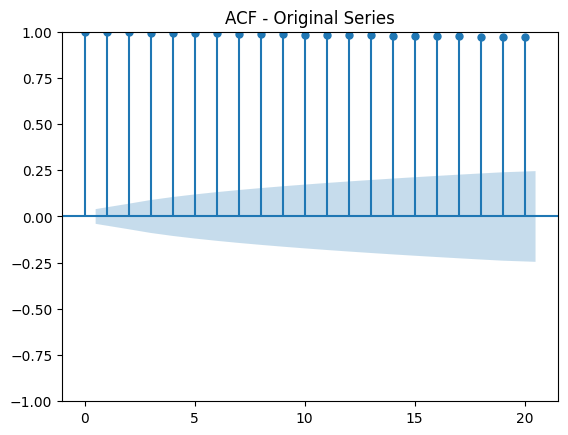

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

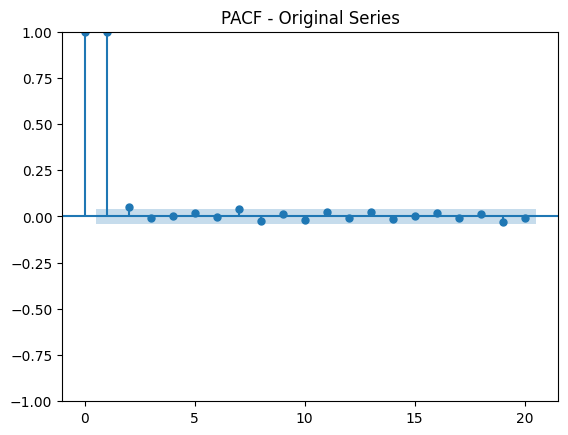

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

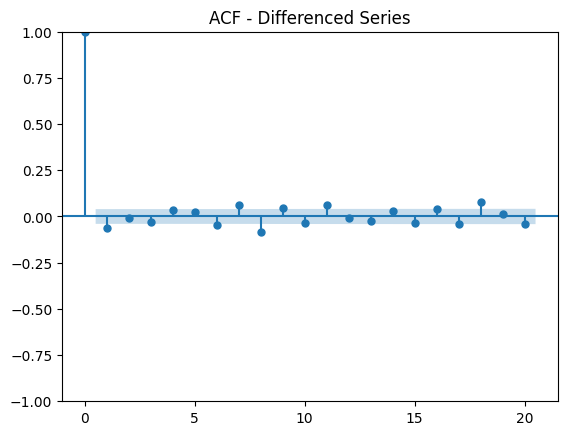

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

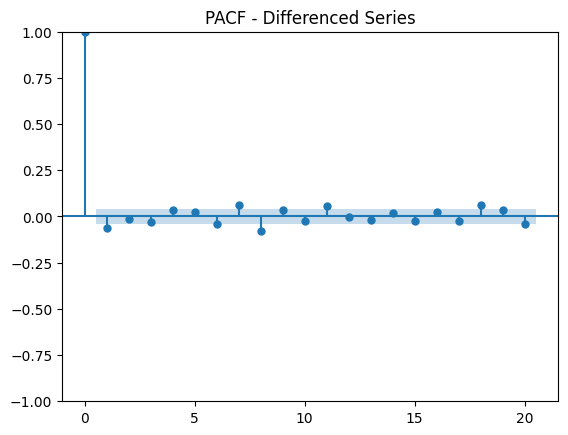

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9919| MAE: 2.0031| MSE: 7.3255| RMSE: 2.7066

Evaluating ARIMA(2, 1, 2)...

Evaluating ARIMA(0, 1, 1)...
R²: 0.9919| MAE: 2.0011| MSE: 7.3203| RMSE: 2.7056

Evaluating ARIMA(1, 1, 0)...
R²: 0.9919| MAE: 2.0010| MSE: 7.3191| RMSE: 2.7054

Evaluating ARIMA(5, 1, 0)...
R²: 0.9919| MAE: 2.0093| MSE: 7.3485| RMSE: 2.7108

Evaluating ARIMA(0, 1, 5)...
R²: 0.9918| MAE: 2.0091| MSE: 7.3522| RMSE: 2.7115

Best model: ARIMA(1, 1, 0) with R²: 0.9919


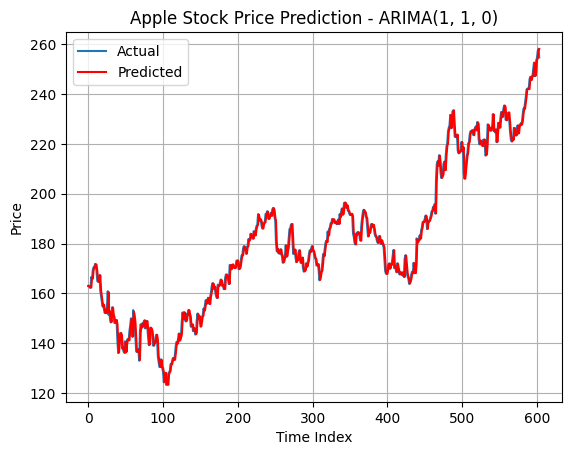

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'Apple Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (1, 1, 0)
ARIMA - R² Score: 0.9919
ARIMA - MAE     : 2.0010
ARIMA - MSE     : 7.3191
ARIMA - RMSE    : 2.7054


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 163.01, Predicted = 162.97
Day 2: Actual = 162.78, Predicted = 163.03
Day 3: Actual = 162.31, Predicted = 162.79
Day 4: Actual = 162.36, Predicted = 162.34
Day 5: Actual = 166.61, Predicted = 162.35
Day 6: Actual = 165.87, Predicted = 166.36
Day 7: Actual = 169.43, Predicted = 165.91
Day 8: Actual = 170.50, Predicted = 169.22
Day 9: Actual = 170.34, Predicted = 170.44
Day 10: Actual = 171.84, Predicted = 170.35


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9777
LSTM - MAE     : 3.5381
LSTM - MSE     : 20.3349
LSTM - RMSE    : 4.5094


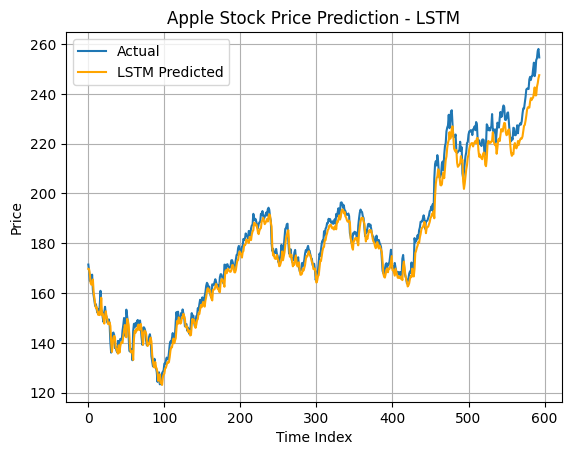


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 171.44, Predicted = 169.72
Day 2: Actual = 168.85, Predicted = 169.61
Day 3: Actual = 164.97, Predicted = 167.50
Day 4: Actual = 164.63, Predicted = 164.06
Day 5: Actual = 164.93, Predicted = 163.35
Day 6: Actual = 167.39, Predicted = 163.45
Day 7: Actual = 161.08, Predicted = 165.42
Day 8: Actual = 158.87, Predicted = 160.30
Day 9: Actual = 156.44, Predicted = 157.98
Day 10: Actual = 154.78, Predicted = 155.68


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('Apple Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9914
GRU - MAE     : 2.0761
GRU - MSE     : 7.8134
GRU - RMSE    : 2.7952


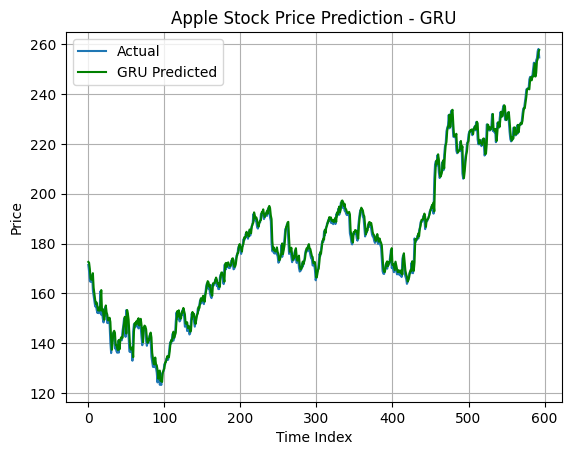


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 171.44, Predicted = 172.64
Day 2: Actual = 168.85, Predicted = 172.34
Day 3: Actual = 164.97, Predicted = 169.86
Day 4: Actual = 164.63, Predicted = 166.00
Day 5: Actual = 164.93, Predicted = 165.47
Day 6: Actual = 167.39, Predicted = 165.75
Day 7: Actual = 161.08, Predicted = 168.12
Day 8: Actual = 158.87, Predicted = 162.32
Day 9: Actual = 156.44, Predicted = 159.86
Day 10: Actual = 154.78, Predicted = 157.43


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('Apple Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9919, MAE: 2.0091, RMSE: 2.7115
LSTM  → R²: 0.9777, MAE: 3.5381, RMSE: 4.5094
GRU   → R²: 0.9914, MAE: 2.0761, RMSE: 2.7952


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
app_stock = pd.read_csv('Stocks Data/Apple_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/Apple3Months_Stock.csv')

print("10 years Apple Stock for Training:", app_stock.shape)
print("3 months Apple Stock for Testing :", three_months_stock.shape)

10 years Apple Stock for Training: (3018, 3)
3 months Apple Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,242.987427,Apple_3Months
1,2025-01-03,242.499161,Apple_3Months
2,2025-01-06,244.133347,Apple_3Months
3,2025-01-07,241.353210,Apple_3Months
4,2025-01-08,241.841476,Apple_3Months
5,2025-01-10,236.012192,Apple_3Months
6,2025-01-13,233.570847,Apple_3Months
7,2025-01-14,232.454803,Apple_3Months
8,2025-01-15,237.028564,Apple_3Months
9,2025-01-16,227.452560,Apple_3Months


In [ ]:
# Date Conversion
app_stock['Date'] = pd.to_datetime(app_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
app_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_app = app_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values

three_months_dates = three_months_stock['Date'].values

In [ ]:
train_app

array([ 16.62831306,  16.41843414,  15.96109581, ..., 257.28668213,
       258.10372925, 254.68586731])

In [ ]:
three_months_test

array([242.98742676, 242.49916077, 244.13334656, 241.35321045,
       241.84147644, 236.01219177, 233.57084656, 232.45480347,
       237.02856445, 227.45256042, 229.16647339, 221.85243225,
       223.03823853, 222.86883545, 221.99194336, 229.04690552,
       237.41719055, 238.51329041, 236.7495575 , 235.16519165,
       227.20344543, 231.97651672, 231.6476593 , 232.39501953,
       226.82479858, 227.09411621, 232.05198669, 236.29161072,
       240.94023132, 244.00274658, 243.87306213, 244.27207947,
       245.22975159, 244.95042419, 246.49664307, 246.43678284,
       239.77310181, 236.7205658 , 241.2494812 , 237.44877625,
       235.35391235, 235.16438293, 234.75538635, 238.48625183,
       226.92454529, 220.30075073, 216.45018005, 209.16799927,
       212.96870422, 213.47746277, 212.17066956, 214.71443176,
       213.57722473, 217.73704529, 220.19102478, 223.20365906,
       220.98907471, 223.30342102, 217.36793518])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (1, 1, 0)

# Walk-forward forecast for next 3 months
history = list(train_app)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.8163 | MAE: 3.3056 | MSE: 19.3253 | RMSE: 4.3961


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months Apple Stock - Actual vs Predicted:")
results.head()

3 Months Apple Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,242.987427,254.729048,0.000000,0.000000
1,2025-01-03,242.499161,243.084953,-0.200943,-4.571169
2,2025-01-06,244.133347,242.502878,0.471596,-4.799676
3,2025-01-07,241.353210,244.120767,-0.672552,-4.164535
4,2025-01-08,241.841476,241.375938,-0.471609,-5.242084


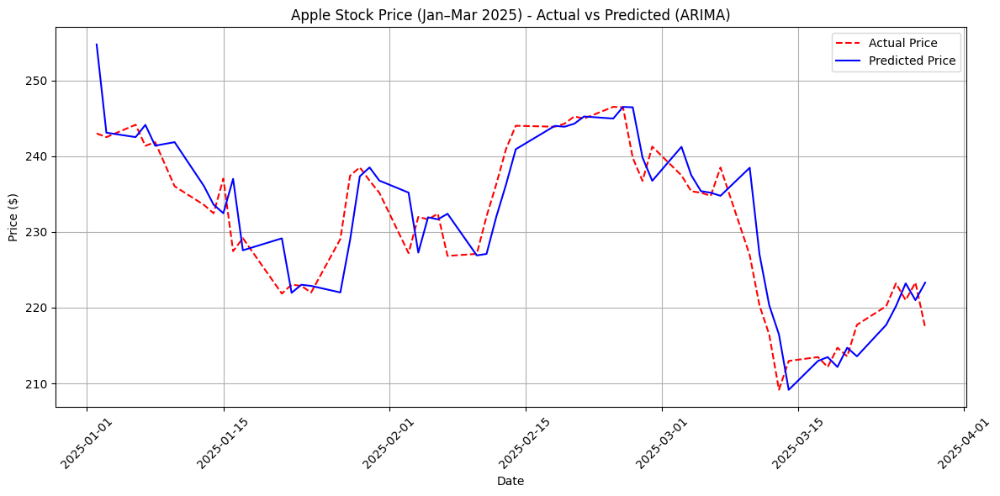

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('Apple Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = app_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.24736075],
        [-0.24914733],
        [-0.25304039],
        ...,
        [-0.25476777],
        [-0.25955013],
        [-0.26363133]],

       [[-0.24914733],
        [-0.25304039],
        [-0.25383955],
        ...,
        [-0.25955013],
        [-0.26363133],
        [-0.25843128]],

       [[-0.25304039],
        [-0.25383955],
        [-0.2534761 ],
        ...,
        [-0.26363133],
        [-0.25843128],
        [-0.25931042]],

       ...,

       [[ 1.71275543],
        [ 1.70189811],
        [ 1.71436696],
        ...,
        [ 1.72988965],
        [ 1.76975658],
        [ 1.77637275]],

       [[ 1.70189811],
        [ 1.71436696],
        [ 1.71580899],
        ...,
        [ 1.76975658],
        [ 1.77637275],
        [ 1.80122617]],

       [[ 1.71436696],
        [ 1.71580899],
        [ 1.74049251],
        ...,
        [ 1.77637275],
        [ 1.80122617],
        [ 1.80818122]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


Apple LSTM Evaluation:
R²: 0.0670 | MAE: 8.3889 | MSE: 98.1256 | RMSE: 9.9058


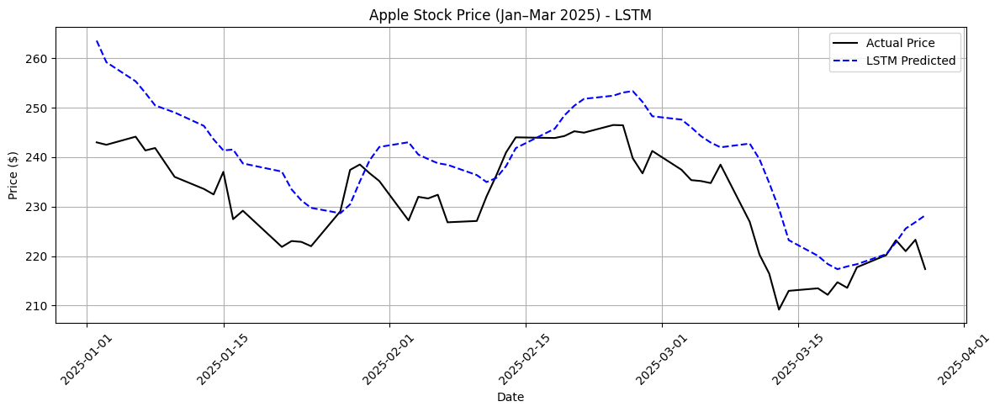


Apple LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,242.987427,263.552734,0.000000,0.000000
1,2025-01-03,242.499161,259.186768,-0.200943,-1.656580
2,2025-01-06,244.133347,255.335022,0.471596,-3.118050
3,2025-01-07,241.353210,252.986526,-0.672552,-4.009146
4,2025-01-08,241.841476,250.452194,-0.471609,-4.970747


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nApple LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('Apple Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nApple LSTM Model - Actual vs Predicted:")
lstm_results.head()

In [ ]:
for i in range(len(test_dates)):
    date = test_dates[i]
    actual_price = test_series.flatten()[i]
    predicted_price = lstm_predicted_prices[i]
    sequence_unscaled = scaler.inverse_transform(input_sequences[i].reshape(-1, 1)).flatten()

    print(f"\nDate: {date}")
    print(f"Sequence (Apple - Last 10 Days Before Prediction): {sequence_unscaled}")
    print(f"Input (Last Timestep Value): {sequence_unscaled[-1]:.2f}")
    print(f"Actual Price (Apple): {actual_price:.2f}")
    print(f"Predicted Price: {predicted_price:.2f}")


Date: 2025-01-02T00:00:00.000000000
Sequence (Apple - Last 10 Days Before Prediction): [247.25227356 250.15197754 252.58334351 247.17256165 248.90640259
 253.58978271 254.36701965 257.28668213 258.10372925 254.68586731]
Input (Last Timestep Value): 254.69
Actual Price (Apple): 242.99
Predicted Price: 263.55

Date: 2025-01-03T00:00:00.000000000
Sequence (Apple - Last 10 Days Before Prediction): [250.15197754 252.58334351 247.17256165 248.90640259 253.58978271
 254.36701965 257.28668213 258.10372925 254.68586731 242.98742676]
Input (Last Timestep Value): 242.99
Actual Price (Apple): 242.50
Predicted Price: 259.19

Date: 2025-01-06T00:00:00.000000000
Sequence (Apple - Last 10 Days Before Prediction): [252.58334351 247.17256165 248.90640259 253.58978271 254.36701965
 257.28668213 258.10372925 254.68586731 242.98742676 242.49916077]
Input (Last Timestep Value): 242.50
Actual Price (Apple): 244.13
Predicted Price: 255.34

Date: 2025-01-07T00:00:00.000000000
Sequence (Apple - Last 10 Days Be

### GRU Model for 3 months Prediction


Apple GRU Evaluation:
R²: 0.8120 | MAE: 3.4588 | MSE: 19.7722 | RMSE: 4.4466


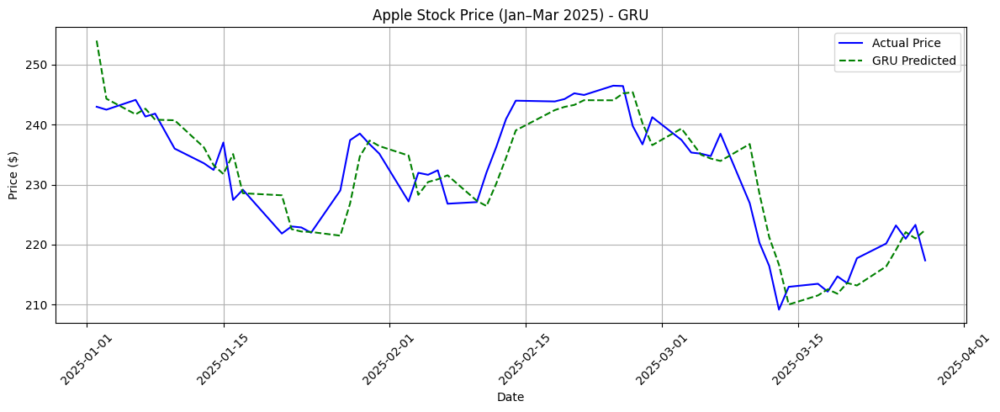


Apple GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,242.987427,254.008072,0.000000,0.000000
1,2025-01-03,242.499161,244.327652,-0.200943,-3.811067
2,2025-01-06,244.133347,241.725861,0.471596,-4.835361
3,2025-01-07,241.353210,242.666687,-0.672552,-4.464972
4,2025-01-08,241.841476,240.829941,-0.471609,-5.188078


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nApple GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('Apple Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nApple GRU Model - Actual vs Predicted:")
gru_results.head()

## **3-Microsoft Stock Predictions**

In [ ]:
msft_stock = pd.read_csv('Stocks Data/Microsoft_stock.csv')

# Checking with Microsoft Stock
print("Checking with Microsoft Stock:\n")
msft_stock

Checking with Microsoft Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,22.321144,MSFT
1,2013-01-03,22.022131,MSFT
2,2013-01-04,21.609970,MSFT
3,2013-01-07,21.569561,MSFT
4,2013-01-08,21.456429,MSFT
...,...,...,...
3013,2024-12-20,434.927856,MSFT
3014,2024-12-23,433.583038,MSFT
3015,2024-12-24,437.647369,MSFT
3016,2024-12-26,436.432068,MSFT


### Evaluation of Microsoft Stock with 80% Training and 20% Testing

In [ ]:
msft_stock['Date'] = pd.to_datetime(msft_stock['Date'])
msft_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
msft_prices = msft_stock['Adj Close'].values
train_size = int(len(msft_prices) * 0.8)
train, test = msft_prices[:train_size], msft_prices[train_size:]

print(f"80% of Microsoft Training Stocks size: {len(train)}")
print(f"20% of Microsoft Testing Stocks  size: {len(test)}")

80% of Microsoft Training Stocks size: 2414
20% of Microsoft Testing Stocks  size: 604


In [ ]:
train

array([ 22.3211441 ,  22.02213097,  21.60997009, ..., 271.13244629,
       268.02139282, 275.48208618])

In [ ]:
test

array([276.63287354, 275.91125488, 273.38528442, 275.31625366,
       282.00662231, 279.91952515, 284.68856812, 286.20996094,
       285.46871948, 284.71624756, 283.59228516, 279.6633606 ,
       271.45385742, 270.17352295, 269.53826904, 272.52883911,
       262.01281738, 259.21762085, 257.0088501 , 255.54289246,
       254.49708557, 250.25549316, 247.50920105, 252.23947144,
       252.65971375, 258.46508789, 260.60546875, 246.27775574,
       246.5025177 , 239.81761169, 239.19212341, 238.9770813 ,
       236.95401001, 233.53335571, 235.51734924, 232.52670288,
       232.06736755, 231.0509491 , 235.6053009 , 232.11624146,
       227.62049866, 235.28277588, 243.23826599, 243.55102539,
       241.19563293, 228.93016052, 224.05323792, 220.30029297,
       220.63256836, 228.93016052, 223.37886047, 232.14555359,
       233.09356689, 231.11936951, 230.79685974, 236.63150024,
       241.64520264, 244.97793579, 226.07632446, 221.6098938 ,
       230.52319336, 226.8679657 , 222.99772644, 215.11

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: 0.6612
p-value: 0.9890
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -14.1380
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

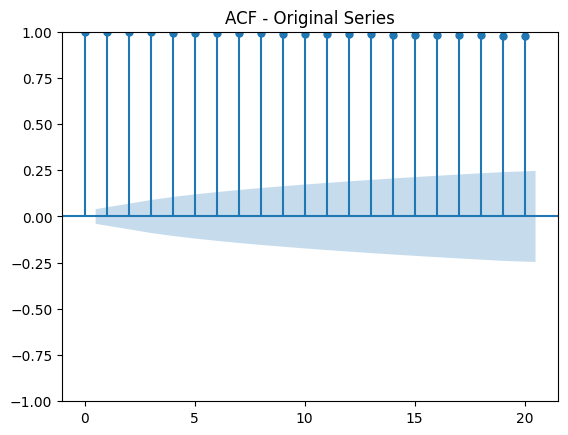

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

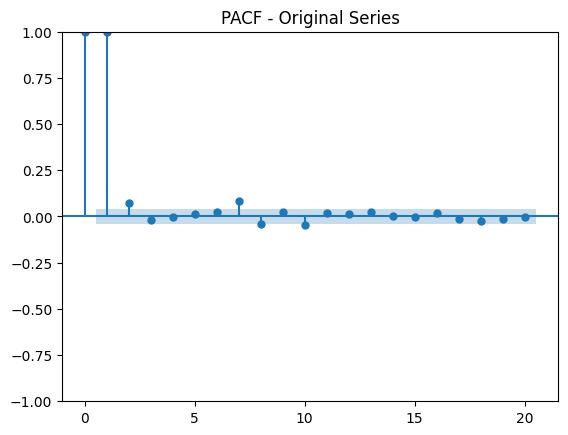

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

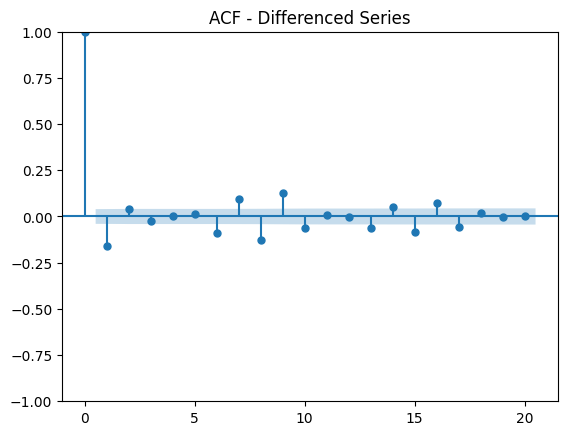

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

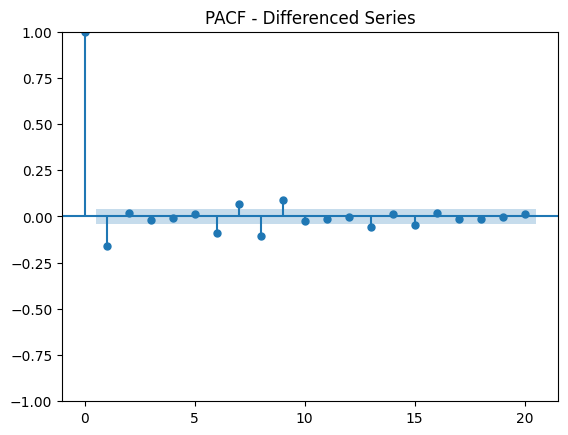

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9952| MAE: 3.8462| MSE: 25.7596| RMSE: 5.0754

Evaluating ARIMA(2, 1, 2)...
R²: 0.9951| MAE: 3.8544| MSE: 25.9112| RMSE: 5.0903

Evaluating ARIMA(0, 1, 1)...
R²: 0.9952| MAE: 3.8443| MSE: 25.7368| RMSE: 5.0731

Evaluating ARIMA(1, 1, 0)...
R²: 0.9952| MAE: 3.8489| MSE: 25.7995| RMSE: 5.0793

Evaluating ARIMA(5, 1, 0)...
R²: 0.9952| MAE: 3.8423| MSE: 25.7712| RMSE: 5.0765

Evaluating ARIMA(0, 1, 5)...
R²: 0.9951| MAE: 3.8457| MSE: 25.8137| RMSE: 5.0807

Best model: ARIMA(0, 1, 1) with R²: 0.9952


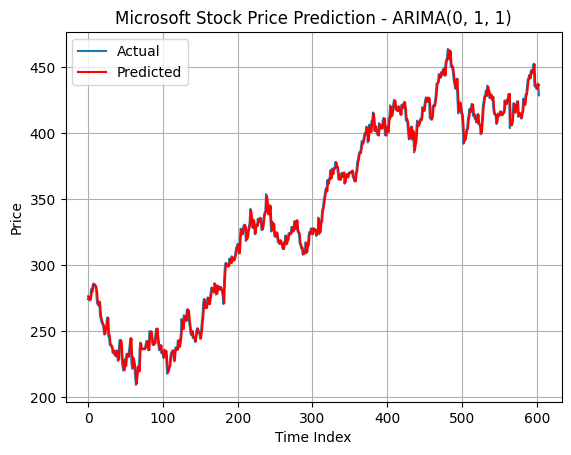

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'Microsoft Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (0, 1, 1)
ARIMA - R² Score: 0.9952
ARIMA - MAE     : 3.8443
ARIMA - MSE     : 25.7368
ARIMA - RMSE    : 5.0731


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 276.63, Predicted = 274.45
Day 2: Actual = 275.91, Predicted = 276.31
Day 3: Actual = 273.39, Predicted = 275.97
Day 4: Actual = 275.32, Predicted = 273.77
Day 5: Actual = 282.01, Predicted = 275.09
Day 6: Actual = 279.92, Predicted = 280.99
Day 7: Actual = 284.69, Predicted = 280.08
Day 8: Actual = 286.21, Predicted = 284.01
Day 9: Actual = 285.47, Predicted = 285.89
Day 10: Actual = 284.72, Predicted = 285.53


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9846
LSTM - MAE     : 7.1600
LSTM - MSE     : 82.4030
LSTM - RMSE    : 9.0776


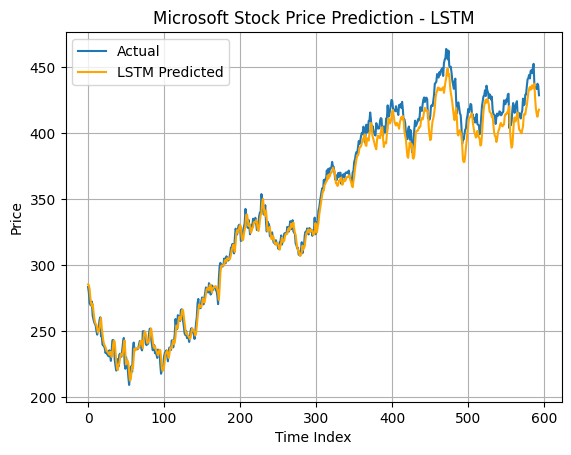


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 283.59, Predicted = 285.61
Day 2: Actual = 279.66, Predicted = 284.86
Day 3: Actual = 271.45, Predicted = 282.10
Day 4: Actual = 270.17, Predicted = 275.43
Day 5: Actual = 269.54, Predicted = 270.94
Day 6: Actual = 272.53, Predicted = 269.16
Day 7: Actual = 262.01, Predicted = 270.94
Day 8: Actual = 259.22, Predicted = 266.03
Day 9: Actual = 257.01, Predicted = 260.67
Day 10: Actual = 255.54, Predicted = 257.18


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('Microsoft Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9853
GRU - MAE     : 7.5249
GRU - MSE     : 78.4832
GRU - RMSE    : 8.8591


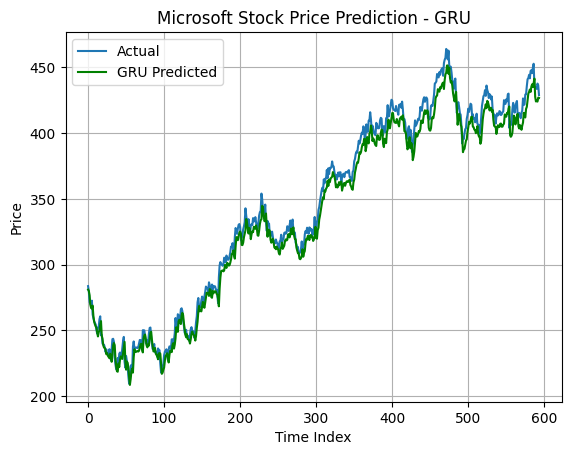


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 283.59, Predicted = 280.95
Day 2: Actual = 279.66, Predicted = 279.96
Day 3: Actual = 271.45, Predicted = 276.64
Day 4: Actual = 270.17, Predicted = 269.37
Day 5: Actual = 269.54, Predicted = 266.98
Day 6: Actual = 272.53, Predicted = 266.45
Day 7: Actual = 262.01, Predicted = 268.78
Day 8: Actual = 259.22, Predicted = 260.82
Day 9: Actual = 257.01, Predicted = 256.56
Day 10: Actual = 255.54, Predicted = 254.50


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('Microsoft Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9952, MAE: 3.8457, RMSE: 5.0807
LSTM  → R²: 0.9846, MAE: 7.1600, RMSE: 9.0776
GRU   → R²: 0.9853, MAE: 7.5249, RMSE: 8.8591


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
msft_stock = pd.read_csv('Stocks Data/Microsoft_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/Microsoft3Months_Stock.csv')

print("10 years Microsoft Stock for Training:", msft_stock.shape)
print("3 months Microsoft Stock for Testing :", three_months_stock.shape)

10 years Microsoft Stock for Training: (3018, 3)
3 months Microsoft Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,416.976868,MSFT_3Months
1,2025-01-03,421.728607,MSFT_3Months
2,2025-01-06,426.211365,MSFT_3Months
3,2025-01-07,420.752350,MSFT_3Months
4,2025-01-08,422.933990,MSFT_3Months
5,2025-01-10,417.345459,MSFT_3Months
6,2025-01-13,415.592194,MSFT_3Months
7,2025-01-14,414.078033,MSFT_3Months
8,2025-01-15,424.677277,MSFT_3Months
9,2025-01-16,422.953857,MSFT_3Months


In [ ]:
# Date Conversion
msft_stock['Date'] = pd.to_datetime(msft_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
msft_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_msft = msft_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_msft

array([ 22.3211441 ,  22.02213097,  21.60997009, ..., 437.64736938,
       436.43206787, 428.88110352])

In [ ]:
three_months_test

array([416.97686768, 421.72860718, 426.21136475, 420.75234985,
       422.93399048, 417.34545898, 415.5921936 , 414.07803345,
       424.67727661, 422.95385742, 427.38687134, 426.8588562 ,
       444.49111938, 444.99911499, 442.35928345, 432.8956604 ,
       445.48727417, 440.63589478, 413.40060425, 413.47036743,
       409.34622192, 410.79064941, 411.70715332, 414.22744751,
       408.18069458, 410.64123535, 409.86422729, 407.47341919,
       408.96768188, 406.86572266, 408.07113647, 413.18145752,
       415.36746216, 407.46194458, 403.25967407, 397.1708374 ,
       398.99749756, 391.81069946, 396.26251221, 387.77807617,
       387.89785767, 400.28512573, 396.16271973, 392.58926392,
       379.46337891, 379.75283813, 382.56765747, 378.07589722,
       387.84796143, 387.98773193, 382.81719971, 387.10934448,
       386.13110352, 390.54302979, 392.35968018, 394.43588257,
       389.25540161, 389.86425781, 378.10583496])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (0, 1, 1)

# Walk-forward forecast for next 3 months
history = list(train_msft)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.8543 | MAE: 4.8901 | MSE: 47.4560 | RMSE: 6.8888


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months Microsoft Stock - Actual vs Predicted:")
results.head()

3 Months Microsoft Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,416.976868,429.567734,0.000000,0.000000
1,2025-01-03,421.728607,418.065484,1.139569,-2.677634
2,2025-01-06,426.211365,421.407038,2.214631,-1.899746
3,2025-01-07,420.752350,425.789109,0.905442,-0.879634
4,2025-01-08,422.933990,421.199182,1.428646,-1.948133


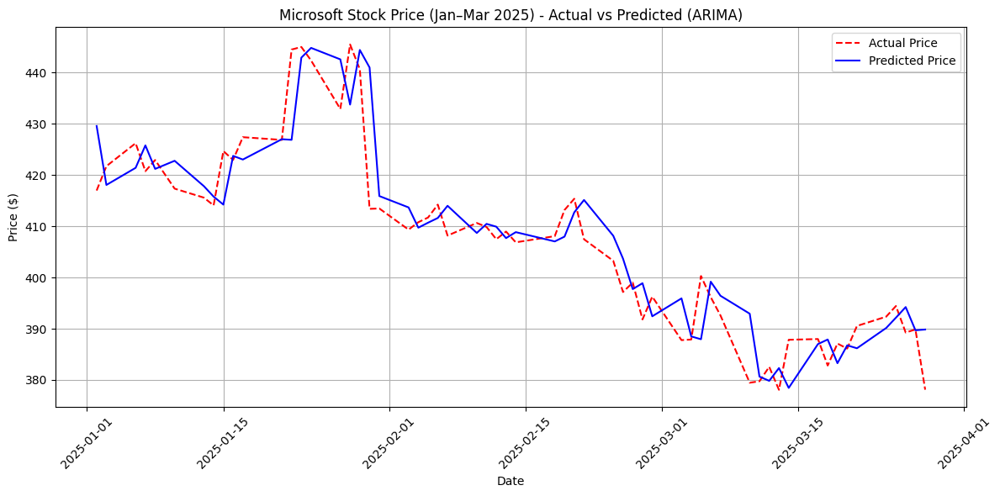

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('Microsoft Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = msft_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.38996765],
        [-0.39141431],
        [-0.39340839],
        ...,
        [-0.39305648],
        [-0.39282191],
        [-0.3915707 ]],

       [[-0.39141431],
        [-0.39340839],
        [-0.39360389],
        ...,
        [-0.39282191],
        [-0.3915707 ],
        [-0.39223538]],

       [[-0.39340839],
        [-0.39360389],
        [-0.39415124],
        ...,
        [-0.3915707 ],
        [-0.39223538],
        [-0.39141431]],

       ...,

       [[ 1.63870416],
        [ 1.66598304],
        [ 1.66873002],
        ...,
        [ 1.60834077],
        [ 1.60626839],
        [ 1.59976202]],

       [[ 1.66598304],
        [ 1.66873002],
        [ 1.65769323],
        ...,
        [ 1.60626839],
        [ 1.59976202],
        [ 1.61942569]],

       [[ 1.66873002],
        [ 1.65769323],
        [ 1.67851387],
        ...,
        [ 1.59976202],
        [ 1.61942569],
        [ 1.61354593]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


MSFT LSTM Evaluation:
R²: 0.7724 | MAE: 6.5214 | MSE: 74.1511 | RMSE: 8.6111


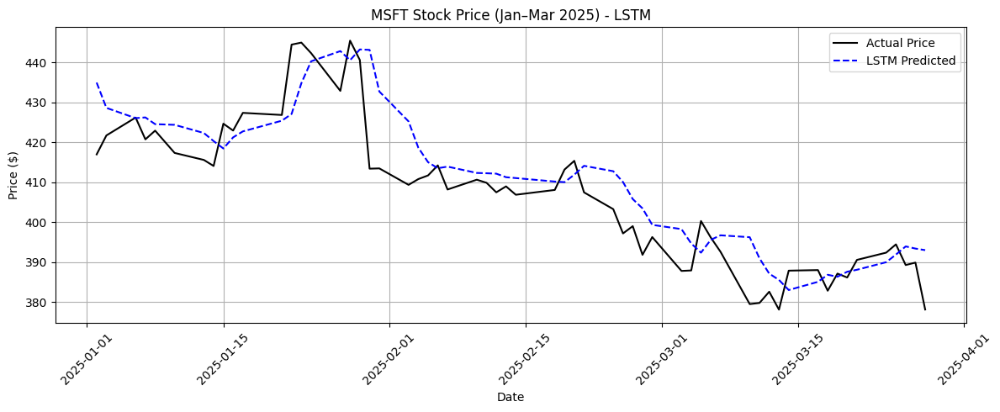


MSFT LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,416.976868,434.977234,0.000000,0.000000
1,2025-01-03,421.728607,428.636749,1.139569,-1.457661
2,2025-01-06,426.211365,426.066711,2.214631,-2.048504
3,2025-01-07,420.752350,426.246674,0.905442,-2.007133
4,2025-01-08,422.933990,424.559814,1.428646,-2.394933


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nMSFT LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('MSFT Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nMSFT LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


MSFT GRU Evaluation:
R²: 0.8416 | MAE: 5.4091 | MSE: 51.6116 | RMSE: 7.1841


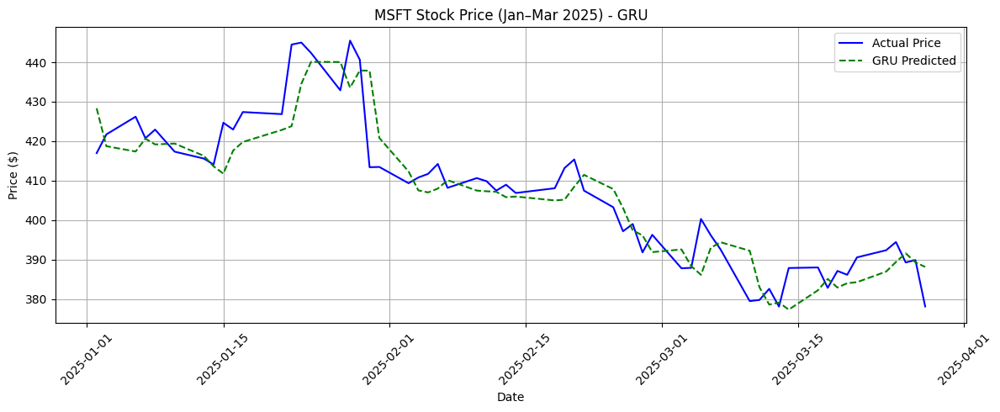


MSFT GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,416.976868,428.326996,0.000000,0.000000
1,2025-01-03,421.728607,418.727814,1.139569,-2.241087
2,2025-01-06,426.211365,417.381073,2.214631,-2.555507
3,2025-01-07,420.752350,420.641510,0.905442,-1.794302
4,2025-01-08,422.933990,419.177521,1.428646,-2.136093


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nMSFT GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('MSFT Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nMSFT GRU Model - Actual vs Predicted:")
gru_results.head()

## **4-Google Stock Predictions**

In [ ]:
googl_stock = pd.read_csv('Stocks Data/ALPHABET_stock.csv')

# Checking with Google Stock
print("Checking with Google Stock:\n")
googl_stock

Checking with Google Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,17.991446,Google
1,2013-01-03,18.001896,Google
2,2013-01-04,18.357622,Google
3,2013-01-07,18.277519,Google
4,2013-01-08,18.241453,Google
...,...,...,...
3013,2024-12-20,190.958633,Google
3014,2024-12-23,194.171036,Google
3015,2024-12-24,195.647552,Google
3016,2024-12-26,195.138748,Google


### Evaluation of Google Stock with 80% Training and 20% Testing

In [ ]:
googl_stock['Date'] = pd.to_datetime(googl_stock['Date'])
googl_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
googl_prices = googl_stock['Adj Close'].values
train_size = int(len(googl_prices) * 0.8)
train, test = googl_prices[:train_size], googl_prices[train_size:]

print(f"80% of Google Training Stocks size: {len(train)}")
print(f"20% of Google Testing Stocks  size: {len(test)}")

80% of Google Training Stocks size: 2414
20% of Google Testing Stocks  size: 604


In [ ]:
train

array([ 17.99144554,  18.0018959 ,  18.35762215, ..., 114.17524719,
       114.44364929, 117.37606049])

In [ ]:
test

array([117.48540497, 116.7696991 , 116.60070801, 115.93469238,
       118.98638916, 118.13152313, 120.95458984, 121.352211  ,
       120.97446442, 118.83729553, 119.45359802, 116.51124573,
       113.5589447 , 113.18122101, 113.01222992, 115.95458221,
       109.68219757, 108.76767731, 108.29055023, 107.57483673,
       109.08576965, 107.20703888, 106.17323303, 108.79750824,
       107.73388672, 109.99034882, 110.19909668, 103.6980896 ,
       104.37403107, 102.29650116, 102.18715668, 102.45554352,
       100.53704834,  98.68812561,  99.5430069 ,  98.15135193,
        97.58474731,  96.91873932,  99.45355225,  96.83921051,
        95.07977295,  98.05194855, 101.03405762, 100.82531738,
       100.81536865,  98.09171295,  97.2766037 ,  96.60064697,
        96.97838593,  98.46944427,  95.98434448,  99.37402344,
       100.16925049,  99.03604889,  99.37402344, 100.52709961,
       101.90881348, 103.85713959,  94.36406708,  91.67022705,
        95.71595764,  93.94657898,  89.93065643,  86.45

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -0.1150
p-value: 0.9479
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -10.2468
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

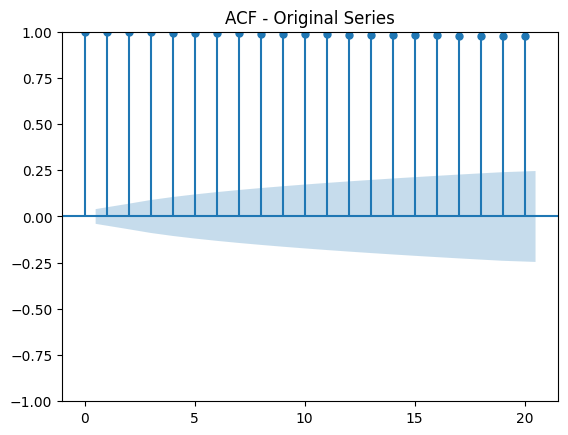

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

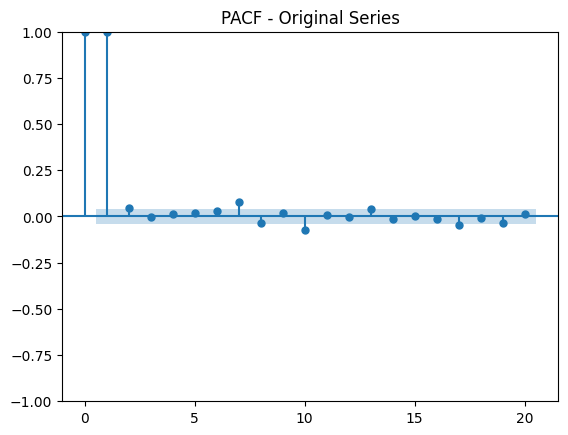

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

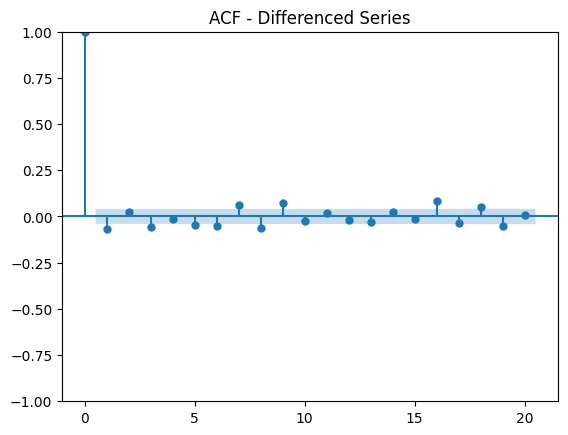

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

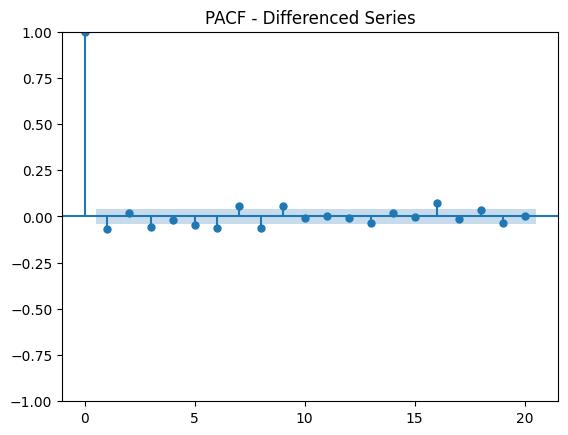

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9925| MAE: 1.8384| MSE: 6.5090| RMSE: 2.5513

Evaluating ARIMA(2, 1, 2)...
R²: 0.9925| MAE: 1.8331| MSE: 6.5084| RMSE: 2.5512

Evaluating ARIMA(0, 1, 1)...
R²: 0.9925| MAE: 1.8371| MSE: 6.5038| RMSE: 2.5503

Evaluating ARIMA(1, 1, 0)...
R²: 0.9925| MAE: 1.8374| MSE: 6.5047| RMSE: 2.5504

Evaluating ARIMA(5, 1, 0)...
R²: 0.9924| MAE: 1.8334| MSE: 6.5218| RMSE: 2.5538

Evaluating ARIMA(0, 1, 5)...
R²: 0.9924| MAE: 1.8361| MSE: 6.5331| RMSE: 2.5560

Best model: ARIMA(0, 1, 1) with R²: 0.9925


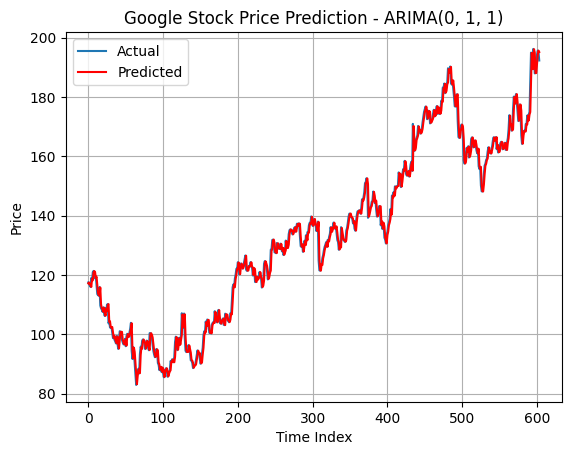

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'Google Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (0, 1, 1)
ARIMA - R² Score: 0.9925
ARIMA - MAE     : 1.8371
ARIMA - MSE     : 6.5038
ARIMA - RMSE    : 2.5503


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 117.49, Predicted = 117.18
Day 2: Actual = 116.77, Predicted = 117.47
Day 3: Actual = 116.60, Predicted = 116.82
Day 4: Actual = 115.93, Predicted = 116.61
Day 5: Actual = 118.99, Predicted = 115.98
Day 6: Actual = 118.13, Predicted = 118.79
Day 7: Actual = 120.95, Predicted = 118.18
Day 8: Actual = 121.35, Predicted = 120.77
Day 9: Actual = 120.97, Predicted = 121.31
Day 10: Actual = 118.84, Predicted = 121.00


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9884
LSTM - MAE     : 2.3367
LSTM - MSE     : 10.1701
LSTM - RMSE    : 3.1891


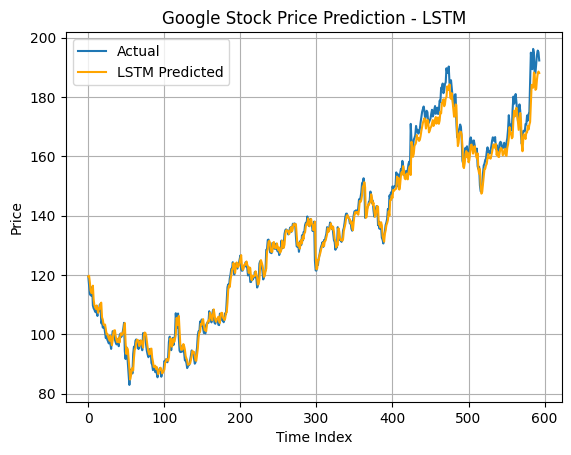


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 119.45, Predicted = 119.50
Day 2: Actual = 116.51, Predicted = 119.73
Day 3: Actual = 113.56, Predicted = 117.56
Day 4: Actual = 113.18, Predicted = 114.72
Day 5: Actual = 113.01, Predicted = 113.95
Day 6: Actual = 115.95, Predicted = 113.87
Day 7: Actual = 109.68, Predicted = 116.39
Day 8: Actual = 108.77, Predicted = 111.70
Day 9: Actual = 108.29, Predicted = 109.79
Day 10: Actual = 107.57, Predicted = 109.07


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('Google Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9919
GRU - MAE     : 1.9548
GRU - MSE     : 7.0691
GRU - RMSE    : 2.6588


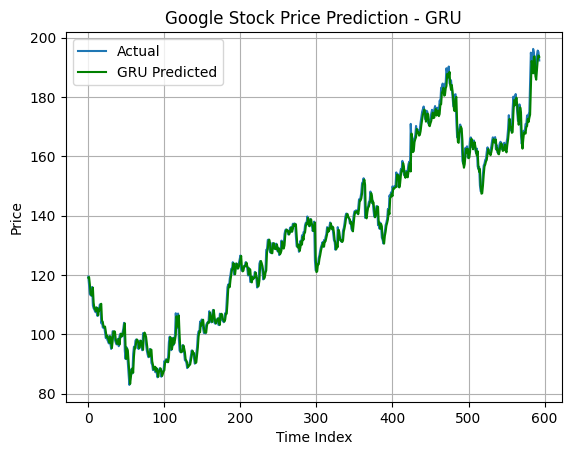


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 119.45, Predicted = 119.03
Day 2: Actual = 116.51, Predicted = 119.30
Day 3: Actual = 113.56, Predicted = 116.88
Day 4: Actual = 113.18, Predicted = 113.84
Day 5: Actual = 113.01, Predicted = 113.19
Day 6: Actual = 115.95, Predicted = 113.14
Day 7: Actual = 109.68, Predicted = 115.74
Day 8: Actual = 108.77, Predicted = 110.62
Day 9: Actual = 108.29, Predicted = 108.77
Day 10: Actual = 107.57, Predicted = 108.41


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('Google Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9925, MAE: 1.8361, RMSE: 2.5560
LSTM  → R²: 0.9884, MAE: 2.3367, RMSE: 3.1891
GRU   → R²: 0.9919, MAE: 1.9548, RMSE: 2.6588


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
googl_stock = pd.read_csv('Stocks Data/ALPHABET_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/Google3Months_Stock.csv')

print("10 years Google Stock for Training:", googl_stock.shape)
print("3 months Google Stock for Testing :", three_months_stock.shape)

10 years Google Stock for Training: (3018, 3)
3 months Google Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,188.983292,Google_3Months
1,2025-01-03,191.337738,Google_3Months
2,2025-01-06,196.405762,Google_3Months
3,2025-01-07,195.029022,Google_3Months
4,2025-01-08,193.492645,Google_3Months
5,2025-01-10,191.587143,Google_3Months
6,2025-01-13,190.559570,Google_3Months
7,2025-01-14,189.212753,Google_3Months
8,2025-01-15,195.088867,Google_3Months
9,2025-01-16,192.455093,Google_3Months


In [ ]:
# Date Conversion
googl_stock['Date'] = pd.to_datetime(googl_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
googl_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_googl = googl_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_googl

array([ 17.99144554,  18.0018959 ,  18.35762215, ..., 195.64755249,
       195.13874817, 192.30543518])

In [ ]:
three_months_test

array([188.98329163, 191.33773804, 196.40576172, 195.02902222,
       193.49264526, 191.58714294, 190.55957031, 189.2127533 ,
       195.08886719, 192.45509338, 195.53779602, 197.58297729,
       197.90222168, 197.51313782, 199.73788452, 191.35768127,
       194.83946228, 194.94920349, 200.39631653, 203.53890991,
       200.75546265, 205.89334106, 190.87882996, 191.14819336,
       184.90293884, 186.0302887 , 184.88301086, 183.17703247,
       185.70106506, 184.79319763, 183.3366394 , 184.83311462,
       184.12478638, 179.23634338, 178.82730103, 175.0063324 ,
       172.32267761, 168.10266113, 169.87844849, 166.61616516,
       170.51695251, 172.61199951, 171.943573  , 173.45002747,
       165.66943359, 163.84164429, 166.90794373, 162.5632019 ,
       165.28990173, 164.09133911, 160.47572327, 163.6918335 ,
       162.60314941, 163.79171753, 167.47724915, 170.35375977,
       164.8604126 , 162.0438385 , 154.1434021 ])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (0, 1, 1)

# Walk-forward forecast for next 3 months
history = list(train_googl)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.9185 | MAE: 3.0020 | MSE: 15.1859 | RMSE: 3.8969


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months Google Stock - Actual vs Predicted:")
results.head()

3 Months Google Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,188.983292,192.339364,0.000000,0.000000
1,2025-01-03,191.337738,189.018646,1.245849,-1.726489
2,2025-01-06,196.405762,191.310651,3.927580,-0.534843
3,2025-01-07,195.029022,196.354910,3.199082,2.087740
4,2025-01-08,193.492645,195.043532,2.386112,1.405936


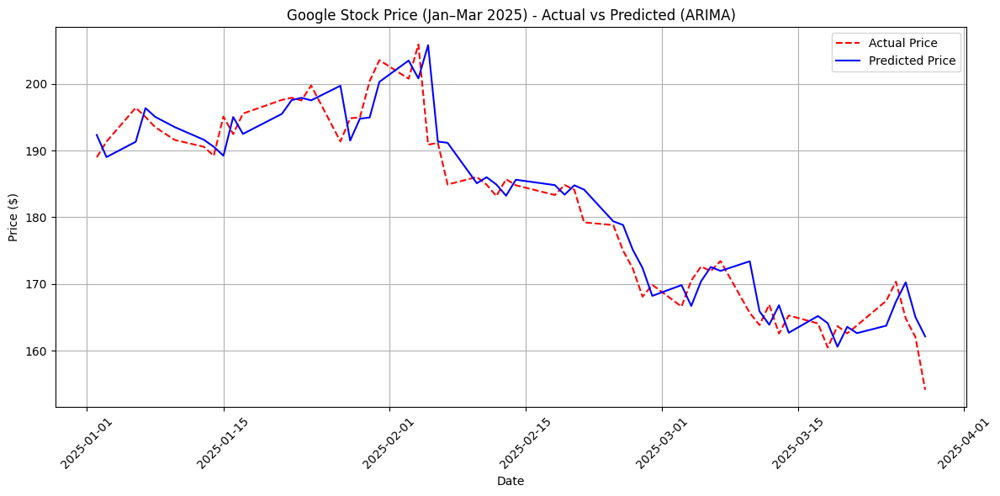

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('Google Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = googl_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.53183207],
        [-0.5316891 ],
        [-0.5268226 ],
        ...,
        [-0.52613519],
        [-0.53183207],
        [-0.53126031]],

       [[-0.5316891 ],
        [-0.5268226 ],
        [-0.52791844],
        ...,
        [-0.53183207],
        [-0.53126031],
        [-0.53457493]],

       [[-0.5268226 ],
        [-0.52791844],
        [-0.52841184],
        ...,
        [-0.53126031],
        [-0.53457493],
        [-0.53589197]],

       ...,

       [[ 1.74927699],
        [ 1.88889799],
        [ 1.84194858],
        ...,
        [ 1.79486182],
        [ 1.83444181],
        [ 1.87838901]],

       [[ 1.88889799],
        [ 1.84194858],
        [ 1.81274125],
        ...,
        [ 1.83444181],
        [ 1.87838901],
        [ 1.89858846]],

       [[ 1.84194858],
        [ 1.81274125],
        [ 1.90609503],
        ...,
        [ 1.87838901],
        [ 1.89858846],
        [ 1.89162778]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


Google LSTM Evaluation:
R²: 0.8105 | MAE: 4.7638 | MSE: 35.2972 | RMSE: 5.9411


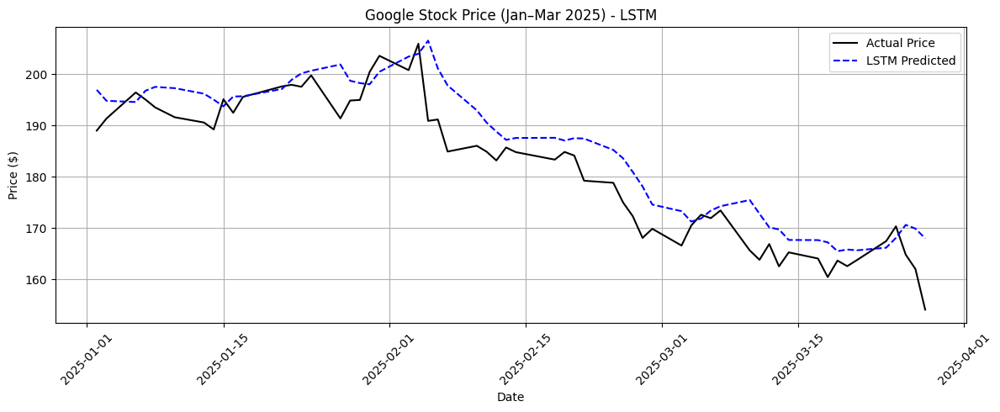


Google LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,188.983292,196.919998,0.000000,0.000000
1,2025-01-03,191.337738,194.787003,1.245849,-1.083177
2,2025-01-06,196.405762,194.546341,3.927580,-1.205391
3,2025-01-07,195.029022,196.740967,3.199082,-0.090915
4,2025-01-08,193.492645,197.498245,2.386112,0.293648


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nGoogle LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('Google Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nGoogle LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


Google GRU Evaluation:
R²: 0.9097 | MAE: 3.2937 | MSE: 16.8188 | RMSE: 4.1011


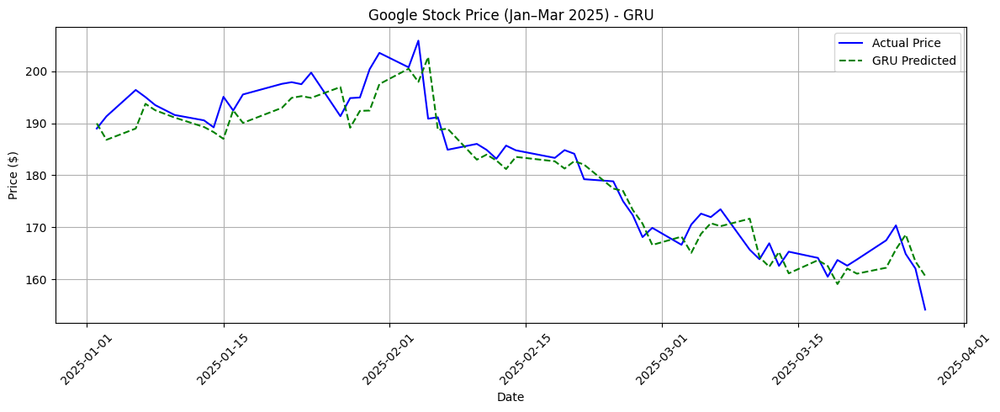


Google GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,188.983292,189.977783,0.000000,0.000000
1,2025-01-03,191.337738,186.817444,1.245849,-1.663530
2,2025-01-06,196.405762,188.986176,3.927580,-0.521958
3,2025-01-07,195.029022,193.741013,3.199082,1.980877
4,2025-01-08,193.492645,192.504318,2.386112,1.329911


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nGoogle GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('Google Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nGoogle GRU Model - Actual vs Predicted:")
gru_results.head()

## **5-XOM Stock Predictions**

In [ ]:
xom_stock = pd.read_csv('Stocks Data/EXXON_stock.csv')

# Checking with XOM Stock
print("Checking XOM Stock:\n")
xom_stock

Checking XOM Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,53.340271,XOM
1,2013-01-03,53.244072,XOM
2,2013-01-04,53.490604,XOM
3,2013-01-07,52.871269,XOM
4,2013-01-08,53.201984,XOM
...,...,...,...
3013,2024-12-20,103.973801,XOM
3014,2024-12-23,104.396103,XOM
3015,2024-12-24,104.494308,XOM
3016,2024-12-26,104.582695,XOM


### Evaluation of XOM Stock with 80% Training and 20% Testing

In [ ]:
xom_stock['Date'] = pd.to_datetime(xom_stock['Date'])
xom_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
XOM_prices = xom_stock['Adj Close'].values
train_size = int(len(XOM_prices) * 0.8)
train, test = XOM_prices[:train_size], XOM_prices[train_size:]

print(f"80% of XOM Training Stocks size: {len(train)}")
print(f"20% of XOM Testing Stocks  size: {len(test)}")

80% of XOM Training Stocks size: 2414
20% of XOM Testing Stocks  size: 604


In [ ]:
train

array([53.340271  , 53.24407196, 53.4906044 , ..., 85.24360657,
       84.87368011, 82.12186432])

In [ ]:
test

array([ 78.66628265,  79.80310822,  80.25421906,  81.73389435,
        82.50981903,  84.89665985,  85.63456726,  84.10407257,
        83.32061005,  83.99475098,  85.98075104,  85.7074585 ,
        85.64366913,  89.27859497,  89.80699158,  90.27159119,
        89.16016388,  91.20993042,  87.73899078,  87.08308411,
        85.51615143,  87.08308411,  86.50002289,  85.76210785,
        86.46360016,  87.91208649,  88.92330933,  86.84622192,
        88.97795105,  86.39070892,  84.91487122,  84.90576172,
        84.21341705,  82.85600281,  82.50981903,  78.11876678,
        76.50629425,  78.10964966,  80.95200348,  80.7880249 ,
        79.53993988,  83.73968506,  86.79154968,  90.29891205,
        92.97727203,  92.03894043,  90.04383087,  89.27859497,
        89.67032623,  92.80418396,  90.36270905,  91.66544342,
        91.82941437,  94.55332184,  94.68087006,  96.43911743,
        97.11325073,  96.45731354,  97.60520172,  97.97869873,
       100.84837341, 100.94857788, 101.95069122,  99.85

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -1.1750
p-value: 0.6842
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -9.3630
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

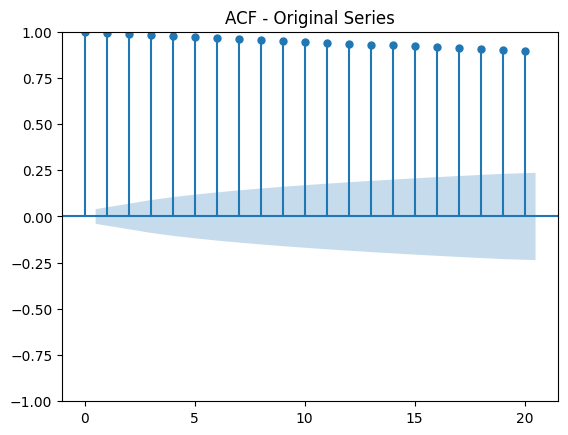

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

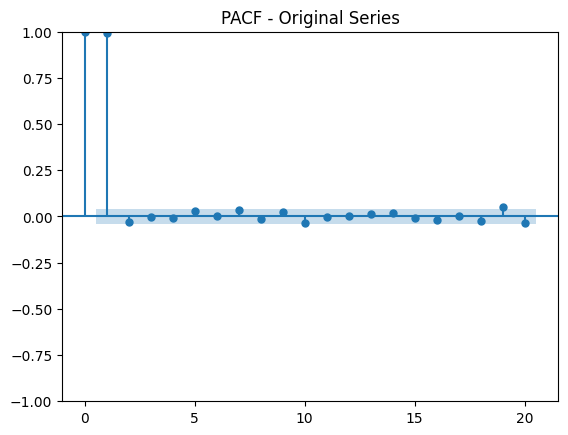

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

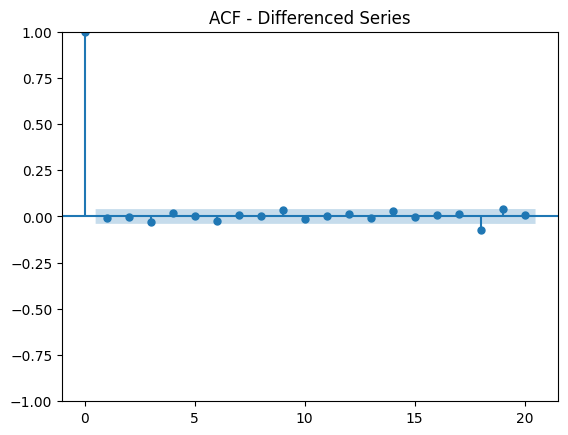

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

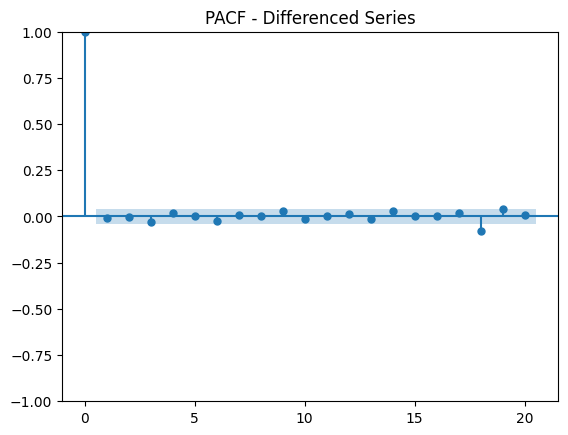

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

## ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9695| MAE: 1.1826| MSE: 2.3508| RMSE: 1.5332

Evaluating ARIMA(2, 1, 2)...
R²: 0.7503| MAE: 1.3603| MSE: 19.2155| RMSE: 4.3836

Evaluating ARIMA(0, 1, 1)...
R²: 0.9695| MAE: 1.1814| MSE: 2.3455| RMSE: 1.5315

Evaluating ARIMA(1, 1, 0)...
R²: 0.9695| MAE: 1.1814| MSE: 2.3455| RMSE: 1.5315

Evaluating ARIMA(5, 1, 0)...
R²: 0.9694| MAE: 1.1867| MSE: 2.3549| RMSE: 1.5346

Evaluating ARIMA(0, 1, 5)...
R²: 0.9695| MAE: 1.1850| MSE: 2.3492| RMSE: 1.5327

Best model: ARIMA(0, 1, 1) with R²: 0.9695


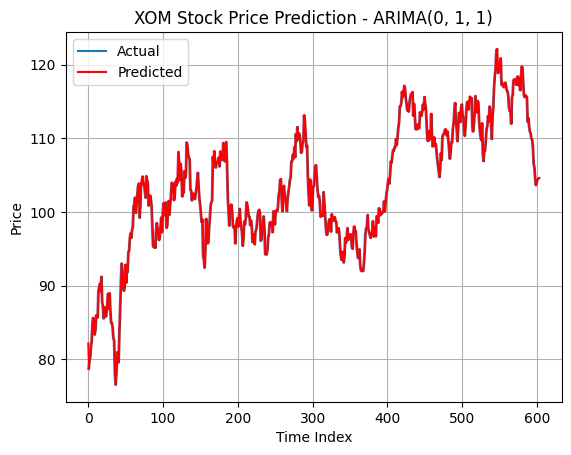

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'XOM Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (0, 1, 1)
ARIMA - R² Score: 0.9695
ARIMA - MAE     : 1.1814
ARIMA - MSE     : 2.3455
ARIMA - RMSE    : 1.5315


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 78.67, Predicted = 82.14
Day 2: Actual = 79.80, Predicted = 78.67
Day 3: Actual = 80.25, Predicted = 79.80
Day 4: Actual = 81.73, Predicted = 80.25
Day 5: Actual = 82.51, Predicted = 81.73
Day 6: Actual = 84.90, Predicted = 82.51
Day 7: Actual = 85.63, Predicted = 84.89
Day 8: Actual = 84.10, Predicted = 85.63
Day 9: Actual = 83.32, Predicted = 84.11
Day 10: Actual = 83.99, Predicted = 83.32


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.4889
LSTM - MAE     : 5.3705
LSTM - MSE     : 36.1452
LSTM - RMSE    : 6.0121


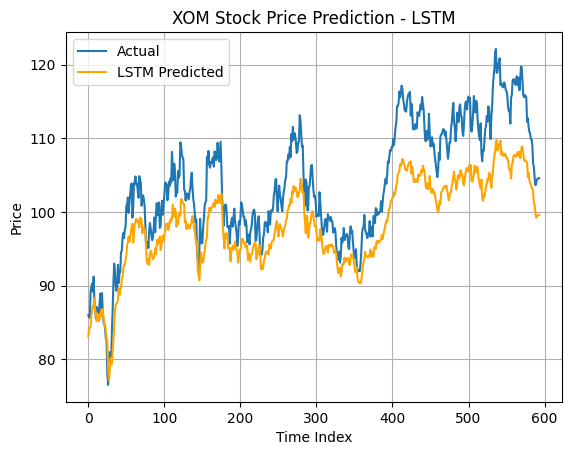


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 85.98, Predicted = 83.11
Day 2: Actual = 85.71, Predicted = 84.12
Day 3: Actual = 85.64, Predicted = 84.24
Day 4: Actual = 89.28, Predicted = 84.39
Day 5: Actual = 89.81, Predicted = 85.96
Day 6: Actual = 90.27, Predicted = 86.56
Day 7: Actual = 89.16, Predicted = 87.20
Day 8: Actual = 91.21, Predicted = 87.12
Day 9: Actual = 87.74, Predicted = 88.29
Day 10: Actual = 87.08, Predicted = 86.65


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('XOM Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9501
GRU - MAE     : 1.4999
GRU - MSE     : 3.5271
GRU - RMSE    : 1.8781


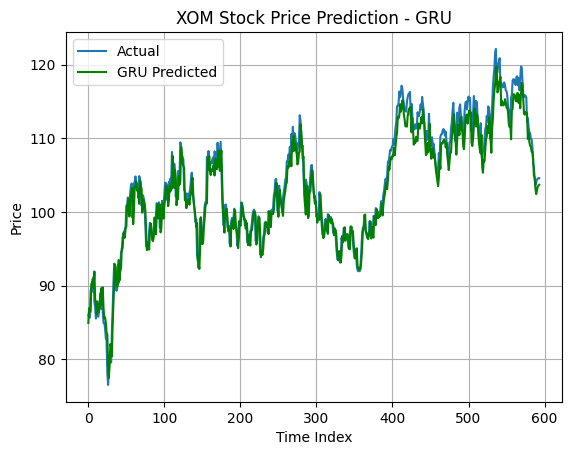


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 85.98, Predicted = 84.92
Day 2: Actual = 85.71, Predicted = 86.92
Day 3: Actual = 85.64, Predicted = 86.50
Day 4: Actual = 89.28, Predicted = 86.43
Day 5: Actual = 89.81, Predicted = 90.20
Day 6: Actual = 90.27, Predicted = 90.51
Day 7: Actual = 89.16, Predicted = 90.91
Day 8: Actual = 91.21, Predicted = 89.73
Day 9: Actual = 87.74, Predicted = 91.91
Day 10: Actual = 87.08, Predicted = 88.13


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('XOM Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9695, MAE: 1.1850, RMSE: 1.5327
LSTM  → R²: 0.4889, MAE: 5.3705, RMSE: 6.0121
GRU   → R²: 0.9501, MAE: 1.4999, RMSE: 1.8781


## **Evaluation of 10 years Stock as Training and 3 months Stock as Testing**

In [ ]:
xom_stock = pd.read_csv('Stocks Data/EXXON_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/XOM3Months_Stock.csv')

print("10 years XOM Stock for Training:", xom_stock.shape)
print("3 months XOM Stock for Testing :", three_months_stock.shape)

10 years XOM Stock for Training: (3018, 3)
3 months XOM Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,105.388008,XOM_3Months
1,2025-01-03,105.928162,XOM_3Months
2,2025-01-06,105.810303,XOM_3Months
3,2025-01-07,106.802223,XOM_3Months
4,2025-01-08,105.014816,XOM_3Months
5,2025-01-10,104.631805,XOM_3Months
6,2025-01-13,107.332550,XOM_3Months
7,2025-01-14,107.754852,XOM_3Months
8,2025-01-15,109.512794,XOM_3Months
9,2025-01-16,109.326187,XOM_3Months


In [ ]:
# Date Conversion
xom_stock['Date'] = pd.to_datetime(xom_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
xom_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_xom = xom_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_xom

array([ 53.340271  ,  53.24407196,  53.4906044 , ..., 104.49430847,
       104.58269501, 104.57288361])

In [ ]:
three_months_test

array([105.38800812, 105.92816162, 105.81030273, 106.80222321,
       105.01481628, 104.63180542, 107.33255005, 107.75485229,
       109.51279449, 109.32618713, 110.30827332, 109.47350311,
       107.56824493, 108.17714691, 106.71382904, 108.19678497,
       106.10493469, 106.7236557 , 107.60753632, 104.91661072,
       105.17195129, 107.99054718, 107.91197968, 106.48794556,
       106.93971252, 108.98246002, 109.66992188, 106.37030792,
       107.14318848, 107.25218964, 109.13484955, 109.29338837,
       110.97787476, 109.67983246, 110.25453186, 108.72859192,
       108.46105194, 109.14476013, 110.31398773, 106.77657318,
       106.55857849, 104.47774506, 106.6378479 , 108.02506256,
       110.77970123, 108.16379547, 108.13406372, 107.6782608 ,
       110.87878418, 112.72181702, 112.60290527, 114.35675812,
       114.84228516, 114.44593048, 114.74319458, 115.52597809,
       117.19065094, 116.81411743, 116.65558624])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (0, 1, 1)

# Walk-forward forecast for next 3 months
history = list(train_xom)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.7710 | MAE: 1.2019 | MSE: 2.3242 | RMSE: 1.5245


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months XOM Stock - Actual vs Predicted:")
results.head()

3 Months XOM Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,105.388008,104.572709,0.000000,0.000000
1,2025-01-03,105.928162,105.400736,0.512538,0.791819
2,2025-01-06,105.810303,105.936470,0.400705,1.304127
3,2025-01-07,106.802223,105.808318,1.341913,1.181578
4,2025-01-08,105.014816,106.817816,-0.354112,2.146934


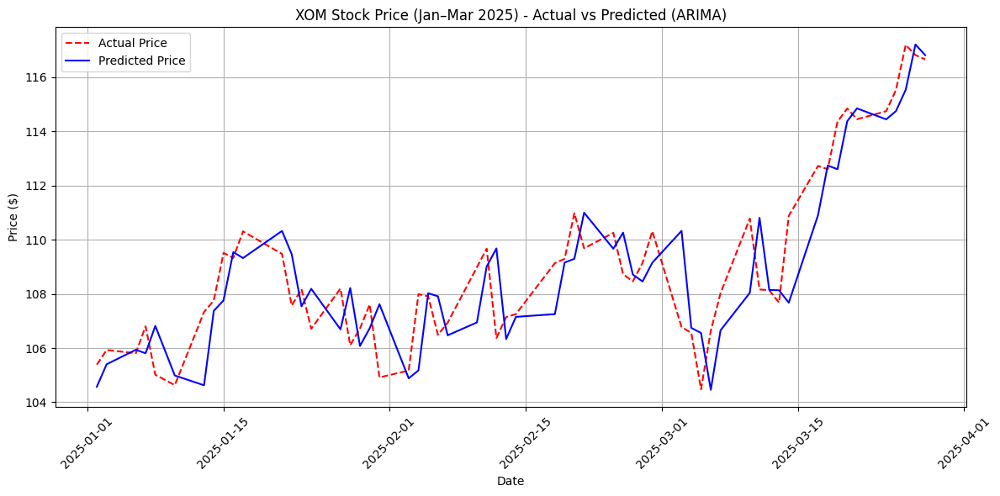

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('XOM Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = xom_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.37529283],
        [-0.38425486],
        [-0.36128758],
        ...,
        [-0.32487796],
        [-0.32655785],
        [-0.32935969]],

       [[-0.38425486],
        [-0.36128758],
        [-0.41898565],
        ...,
        [-0.32655785],
        [-0.32935969],
        [-0.33272054]],

       [[-0.36128758],
        [-0.41898565],
        [-0.38817579],
        ...,
        [-0.32935969],
        [-0.33272054],
        [-0.29182813]],

       ...,

       [[ 4.96394292],
        [ 4.89532431],
        [ 4.88617464],
        ...,
        [ 4.30885556],
        [ 4.34179309],
        [ 4.38113532]],

       [[ 4.89532431],
        [ 4.88617464],
        [ 4.796511  ],
        ...,
        [ 4.34179309],
        [ 4.38113532],
        [ 4.39028428]],

       [[ 4.88617464],
        [ 4.796511  ],
        [ 4.57967384],
        ...,
        [ 4.38113532],
        [ 4.39028428],
        [ 4.39851848]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


XOM LSTM Evaluation:
R²: 0.7464 | MAE: 1.2247 | MSE: 2.5736 | RMSE: 1.6042


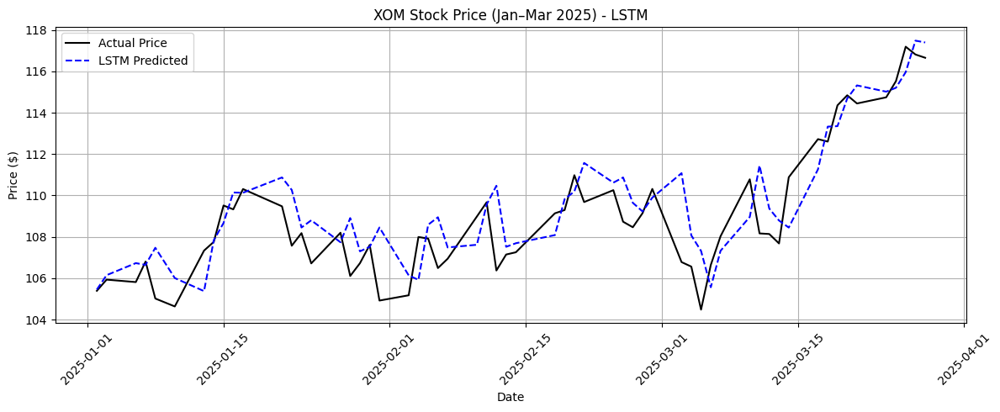


XOM LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,105.388008,105.449013,0.000000,0.000000
1,2025-01-03,105.928162,106.144127,0.512538,0.659192
2,2025-01-06,105.810303,106.726746,0.400705,1.211703
3,2025-01-07,106.802223,106.643921,1.341913,1.133168
4,2025-01-08,105.014816,107.469009,-0.354112,1.915610


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nXOM LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('XOM Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nXOM LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


XOM GRU Evaluation:
R²: 0.7570 | MAE: 1.2891 | MSE: 2.4656 | RMSE: 1.5702


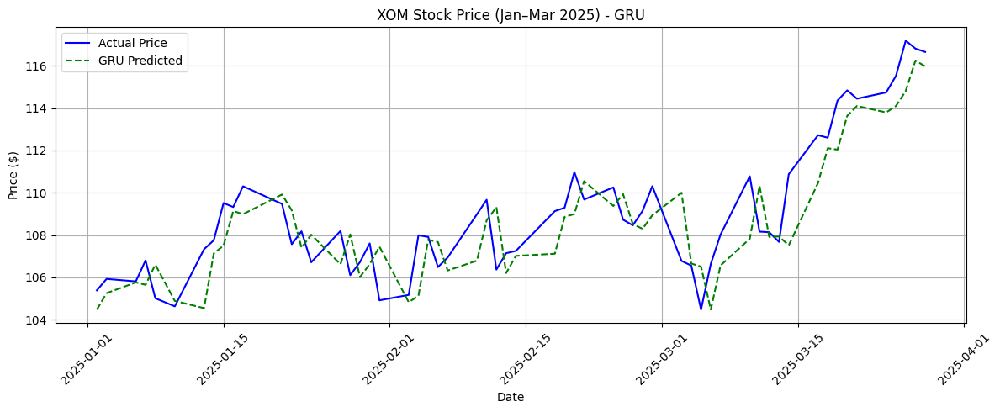


XOM GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,105.388008,104.476257,0.000000,0.000000
1,2025-01-03,105.928162,105.256622,0.512538,0.746930
2,2025-01-06,105.810303,105.763641,0.400705,1.232231
3,2025-01-07,106.802223,105.648682,1.341913,1.122189
4,2025-01-08,105.014816,106.603607,-0.354112,2.036202


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nXOM GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('XOM Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nXOM GRU Model - Actual vs Predicted:")
gru_results.head()

## **6-FANG Stock Predictions**

In [ ]:
fang_stock = pd.read_csv('Stocks Data/Diamondback_stock.csv')

# Checking with FANG Stock
print("Checking with FANG Stock:\n")
fang_stock

Checking with FANG Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,15.088324,FANG
1,2013-01-03,15.009900,FANG
2,2013-01-04,15.723536,FANG
3,2013-01-07,16.288174,FANG
4,2013-01-08,16.154861,FANG
...,...,...,...
3013,2024-12-20,152.791840,FANG
3014,2024-12-23,153.935760,FANG
3015,2024-12-24,155.582611,FANG
3016,2024-12-26,155.839005,FANG


### Evaluation of FANG Stock with 80% Training and 20% Testing

In [ ]:
fang_stock['Date'] = pd.to_datetime(fang_stock['Date'])
fang_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
fang_prices = fang_stock['Adj Close'].values
train_size = int(len(fang_prices) * 0.8)
train, test = fang_prices[:train_size], fang_prices[train_size:]

print(f"80% of FANG Training Stocks size: {len(train)}")
print(f"20% of FANG Testing Stocks  size: {len(test)}")

80% of FANG Training Stocks size: 2414
20% of FANG Testing Stocks  size: 604


In [ ]:
train

array([ 15.08832359,  15.00990009,  15.72353649, ..., 108.57028961,
       109.96707916, 104.65582275])

In [ ]:
test

array([100.40509033, 104.64720917, 106.17332458, 107.3804245 ,
       108.67375183, 114.48509979, 114.78687286, 112.88962555,
       110.82473755, 110.98355865, 114.77804565, 115.06040955,
       115.75753784, 119.23431396, 120.58444977, 120.25794983,
       118.18421173, 122.88760376, 118.30778503, 117.61064148,
       114.98101044, 118.13127136, 118.25482941, 116.10167694,
       116.64878845, 119.14608765, 121.21977997, 118.87253571,
       123.69059753, 118.80193329, 117.02825165, 115.53691864,
       115.41338348, 113.65735626, 111.66304779, 101.65625763,
        98.13536072, 100.14730835, 105.36248016, 106.69496155,
       106.29785156, 114.29270172, 120.27560425, 122.98466492,
       125.5966568 , 125.68489838, 123.81415558, 122.98466492,
       124.57306671, 128.19984436, 122.97585297, 123.06407928,
       125.17310333, 128.86166382, 129.35583496, 134.41217041,
       135.24163818, 135.32987976, 137.11242676, 135.3210907 ,
       135.73580933, 138.63902283, 139.9803009 , 136.62

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -2.1516
p-value: 0.2243
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -29.9212
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

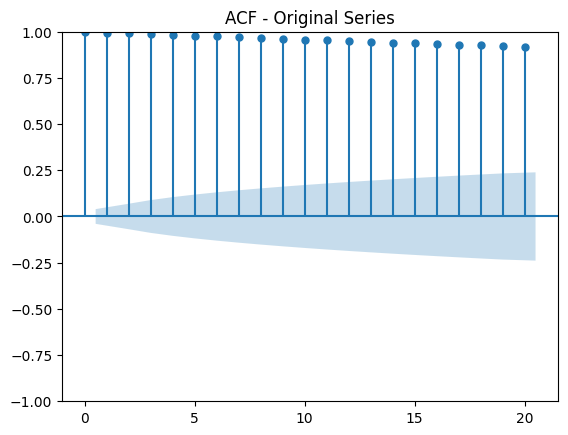

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

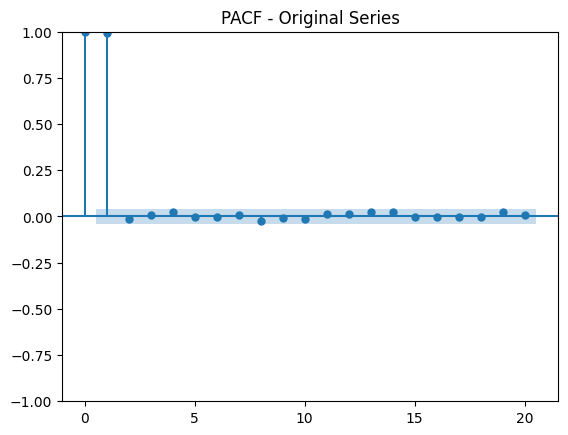

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

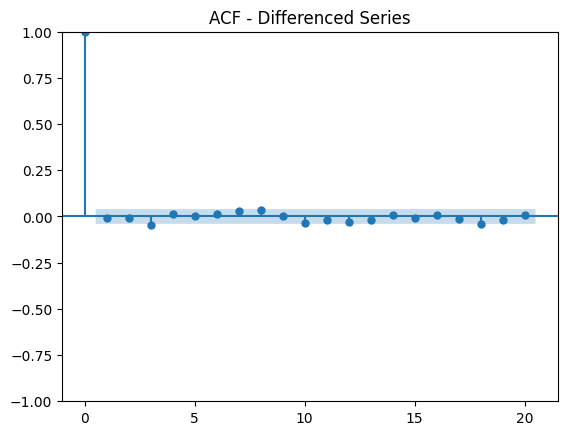

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

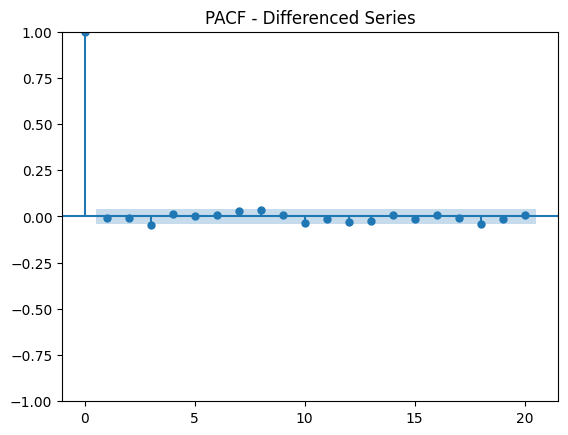

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9897| MAE: 2.1235| MSE: 7.9690| RMSE: 2.8229

Evaluating ARIMA(2, 1, 2)...
R²: 0.9896| MAE: 2.1304| MSE: 8.0309| RMSE: 2.8339

Evaluating ARIMA(0, 1, 1)...
R²: 0.9897| MAE: 2.1130| MSE: 7.9424| RMSE: 2.8182

Evaluating ARIMA(1, 1, 0)...
R²: 0.9897| MAE: 2.1130| MSE: 7.9424| RMSE: 2.8182

Evaluating ARIMA(5, 1, 0)...
R²: 0.9897| MAE: 2.1102| MSE: 7.9375| RMSE: 2.8174

Evaluating ARIMA(0, 1, 5)...
R²: 0.9897| MAE: 2.1098| MSE: 7.9364| RMSE: 2.8172

Best model: ARIMA(0, 1, 5) with R²: 0.9897


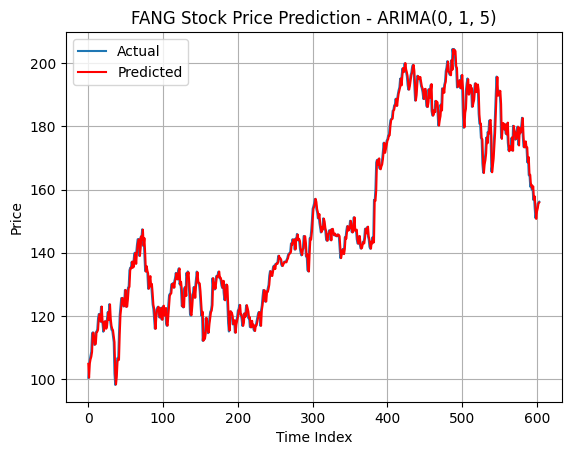

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'FANG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (0, 1, 5)
ARIMA - R² Score: 0.9897
ARIMA - MAE     : 2.1098
ARIMA - MSE     : 7.9364
ARIMA - RMSE    : 2.8172


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 100.41, Predicted = 104.81
Day 2: Actual = 104.65, Predicted = 100.41
Day 3: Actual = 106.17, Predicted = 104.91
Day 4: Actual = 107.38, Predicted = 106.27
Day 5: Actual = 108.67, Predicted = 107.06
Day 6: Actual = 114.49, Predicted = 108.61
Day 7: Actual = 114.79, Predicted = 114.42
Day 8: Actual = 112.89, Predicted = 114.67
Day 9: Actual = 110.82, Predicted = 112.65
Day 10: Actual = 110.98, Predicted = 110.92


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9343
LSTM - MAE     : 5.8016
LSTM - MSE     : 49.8068
LSTM - RMSE    : 7.0574


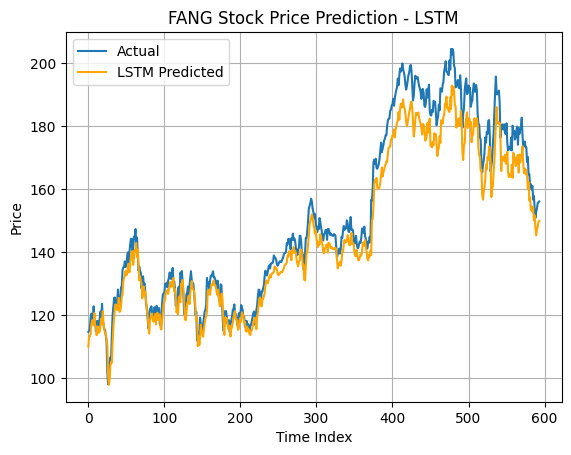


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 114.78, Predicted = 110.08
Day 2: Actual = 115.06, Predicted = 113.11
Day 3: Actual = 115.76, Predicted = 113.37
Day 4: Actual = 119.23, Predicted = 114.08
Day 5: Actual = 120.58, Predicted = 117.07
Day 6: Actual = 120.26, Predicted = 118.43
Day 7: Actual = 118.18, Predicted = 118.47
Day 8: Actual = 122.89, Predicted = 116.86
Day 9: Actual = 118.31, Predicted = 120.74
Day 10: Actual = 117.61, Predicted = 116.86


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('FANG Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9721
GRU - MAE     : 3.6204
GRU - MSE     : 21.1301
GRU - RMSE    : 4.5967


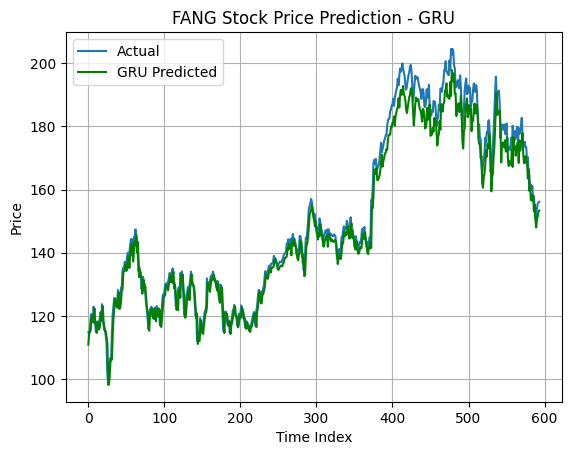


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 114.78, Predicted = 110.90
Day 2: Actual = 115.06, Predicted = 114.42
Day 3: Actual = 115.76, Predicted = 114.71
Day 4: Actual = 119.23, Predicted = 115.39
Day 5: Actual = 120.58, Predicted = 118.73
Day 6: Actual = 120.26, Predicted = 120.08
Day 7: Actual = 118.18, Predicted = 119.82
Day 8: Actual = 122.89, Predicted = 117.84
Day 9: Actual = 118.31, Predicted = 122.39
Day 10: Actual = 117.61, Predicted = 117.82


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('FANG Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9897, MAE: 2.1098, RMSE: 2.8172
LSTM  → R²: 0.9343, MAE: 5.8016, RMSE: 7.0574
GRU   → R²: 0.9721, MAE: 3.6204, RMSE: 4.5967


## Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
fang_stock = pd.read_csv('Stocks Data/Diamondback_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/FANG3Months_Stock.csv')

print("10 years FANG Stock for Training:", fang_stock.shape)
print("3 months FANG Stock for Testing :", three_months_stock.shape)

10 years FANG Stock for Training: (3018, 3)
3 months FANG Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,164.467682,FANG_3Months
1,2025-01-03,168.589737,FANG_3Months
2,2025-01-06,167.288040,FANG_3Months
3,2025-01-07,170.029495,FANG_3Months
4,2025-01-08,168.619324,FANG_3Months
5,2025-01-10,172.346924,FANG_3Months
6,2025-01-13,175.147522,FANG_3Months
7,2025-01-14,175.216553,FANG_3Months
8,2025-01-15,177.070496,FANG_3Months
9,2025-01-16,176.636597,FANG_3Months


In [ ]:
# Date Conversion
fang_stock['Date'] = pd.to_datetime(fang_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
fang_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_fang = fang_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_fang

array([ 15.08832359,  15.00990009,  15.72353649, ..., 155.58261108,
       155.83900452, 156.1446991 ])

In [ ]:
three_months_test

array([164.46768188, 168.58973694, 167.28804016, 170.02949524,
       168.61932373, 172.34692383, 175.14752197, 175.21655273,
       177.07049561, 176.63659668, 177.68190002, 174.49667358,
       175.12779236, 174.18112183, 170.85783386, 169.22085571,
       166.90344238, 168.49111938, 168.04736328, 162.08123779,
       162.1995697 , 163.99433899, 162.47569275, 157.81126404,
       155.93762207, 159.41867065, 159.76382446, 153.30464172,
       154.00479126, 154.81341553, 154.58660889, 158.03807068,
       159.8427124 , 153.95547485, 153.07780457, 149.8137207 ,
       150.31661987, 153.43281555, 156.75610352, 145.94805908,
       143.02908325, 140.72154236, 138.93395996, 139.14251709,
       139.60928345, 143.65116882, 145.53805542, 144.79322815,
       149.1628418 , 151.97331238, 153.92970276, 156.51174927,
       157.38566589, 157.40553284, 159.89819336, 160.48413086,
       161.96383667, 159.12358093, 156.4521637 ])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (0, 1, 5)

# Walk-forward forecast for next 3 months
history = list(train_fang)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.9096 | MAE: 2.3872 | MSE: 9.9139 | RMSE: 3.1486


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months FANG Stock - Actual vs Predicted:")
results.head()

3 Months FANG Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,164.467682,156.058058,0.000000,0.000000
1,2025-01-03,168.589737,164.601520,2.506301,5.474541
2,2025-01-06,167.288040,168.729996,1.714840,8.120015
3,2025-01-07,170.029495,166.884509,3.381706,6.937451
4,2025-01-08,168.619324,170.002294,2.524290,8.935288


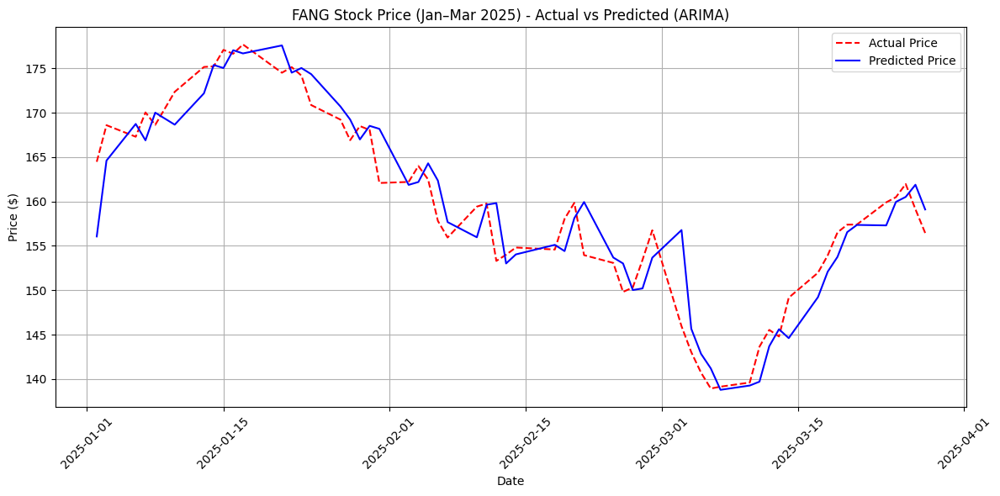

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('FANG Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = fang_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-1.23518904],
        [-1.23681844],
        [-1.2219912 ],
        ...,
        [-1.19559538],
        [-1.19347725],
        [-1.19478073]],

       [[-1.23681844],
        [-1.2219912 ],
        [-1.21025971],
        ...,
        [-1.19347725],
        [-1.19478073],
        [-1.2019499 ]],

       [[-1.2219912 ],
        [-1.21025971],
        [-1.21302955],
        ...,
        [-1.19478073],
        [-1.2019499 ],
        [-1.20455682]],

       ...,

       [[ 1.79409546],
        [ 1.80946202],
        [ 1.77524567],
        ...,
        [ 1.58736184],
        [ 1.62588127],
        [ 1.64964855]],

       [[ 1.80946202],
        [ 1.77524567],
        [ 1.79798862],
        ...,
        [ 1.62588127],
        [ 1.64964855],
        [ 1.68386522]],

       [[ 1.77524567],
        [ 1.79798862],
        [ 1.70763218],
        ...,
        [ 1.64964855],
        [ 1.68386522],
        [ 1.68919231]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


FANG LSTM Evaluation:
R²: 0.8920 | MAE: 2.6792 | MSE: 11.8472 | RMSE: 3.4420


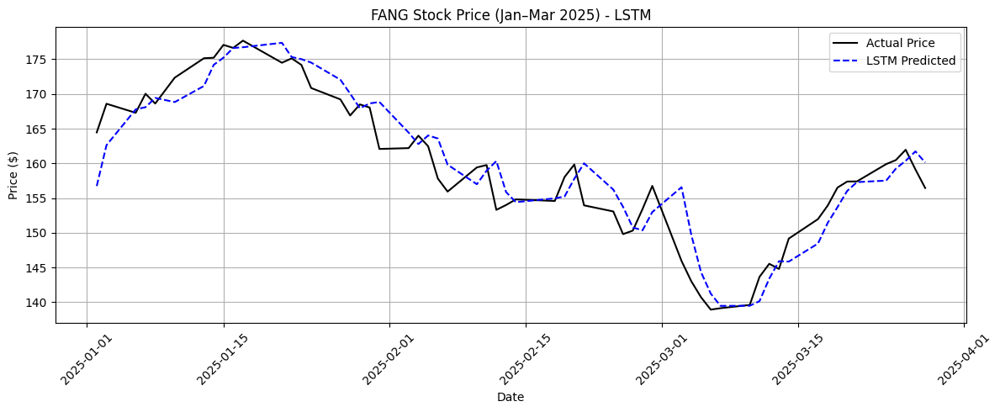


FANG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,164.467682,156.738892,0.000000,0.000000
1,2025-01-03,168.589737,162.619781,2.506301,3.752029
2,2025-01-06,167.288040,167.781830,1.714840,7.045436
3,2025-01-07,170.029495,168.093323,3.381706,7.244170
4,2025-01-08,168.619324,169.431976,2.524290,8.098232


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nFANG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('FANG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nFANG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


FANG GRU Evaluation:
R²: 0.8932 | MAE: 2.7611 | MSE: 11.7081 | RMSE: 3.4217


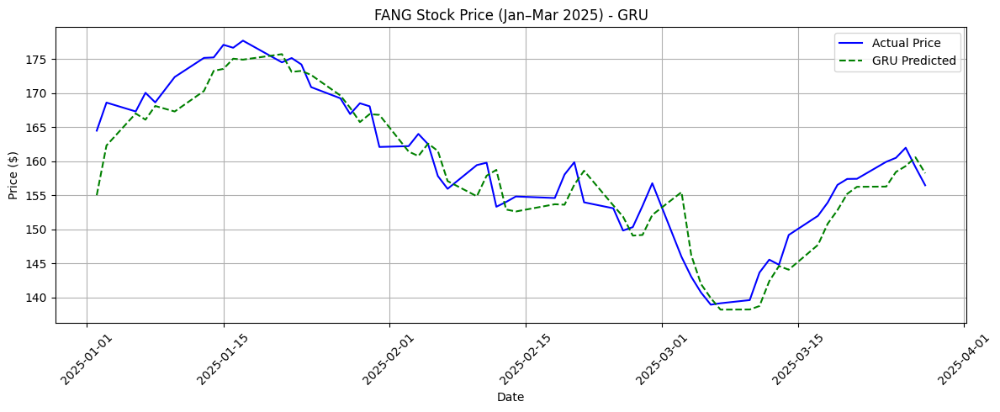


FANG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,164.467682,154.994705,0.000000,0.000000
1,2025-01-03,168.589737,162.297867,2.506301,4.711878
2,2025-01-06,167.288040,166.988342,1.714840,7.738090
3,2025-01-07,170.029495,166.079956,3.381706,7.152021
4,2025-01-08,168.619324,168.093704,2.524290,8.451260


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nFANG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('FANG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nFANG GRU Model - Actual vs Predicted:")
gru_results.head()

## **7-WMT Stock Predictions**

In [ ]:
wmt_stock = pd.read_csv('Stocks Data/Walmart_stock.csv')

# Checking with WMT Stock
print("Checking with WMT Stock:\n")
wmt_stock

Checking with WMT Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,17.898834,WMT
1,2013-01-03,17.785095,WMT
2,2013-01-04,17.852306,WMT
3,2013-01-07,17.681686,WMT
4,2013-01-08,17.730803,WMT
...,...,...,...
3013,2024-12-20,91.765518,WMT
3014,2024-12-23,89.885246,WMT
3015,2024-12-24,92.203255,WMT
3016,2024-12-26,92.312698,WMT


### Evaluation of WMT Stock with 80% Training and 20% Testing

In [ ]:
wmt_stock['Date'] = pd.to_datetime(wmt_stock['Date'])
wmt_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
wmt_prices = wmt_stock['Adj Close'].values
train_size = int(len(wmt_prices) * 0.8)
train, test = wmt_prices[:train_size], wmt_prices[train_size:]

print(f"80% of WMT Training Stocks size: {len(train)}")
print(f"20% of WMT Testing Stocks  size: {len(test)}")

80% of WMT Training Stocks size: 2414
20% of WMT Testing Stocks  size: 604


In [ ]:
train

array([17.89883423, 17.78509521, 17.85230637, ..., 42.43417358,
       42.47898865, 41.78104019])

In [ ]:
test

array([40.20264435, 40.52601242, 40.85577393, 41.25918579, 41.3456192 ,
       41.74435425, 42.51607895, 42.63827133, 44.81520844, 44.86344147,
       44.71874237, 44.05955124, 43.27173615, 43.0884552 , 43.40036774,
       43.68976212, 42.31672668, 42.72830963, 42.59968567, 42.62220001,
       43.24280167, 42.76689529, 42.55467224, 43.64795303, 43.86983109,
       44.00167465, 44.39718246, 43.48075104, 43.38428497, 42.91802979,
       42.82799149, 43.19456863, 42.94374847, 43.33605194, 42.89229965,
       41.82152176, 42.22346878, 42.10770798, 42.80226517, 42.52573013,
       41.70576859, 42.61576843, 43.16884232, 42.74117279, 42.34244537,
       41.33919144, 41.58357239, 42.66078186, 42.17844772, 42.53538132,
       41.94049835, 42.24276352, 43.13346863, 43.01127625, 43.11739731,
       43.98880768, 44.82806778, 45.04029465, 45.38436127, 45.25252533,
       45.82489395, 45.76700592, 45.56121826, 45.25895309, 45.24930954,
       45.32969284, 45.8055954 , 45.91492844, 44.84737015, 45.77

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -0.7868
p-value: 0.8230
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -16.6440
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

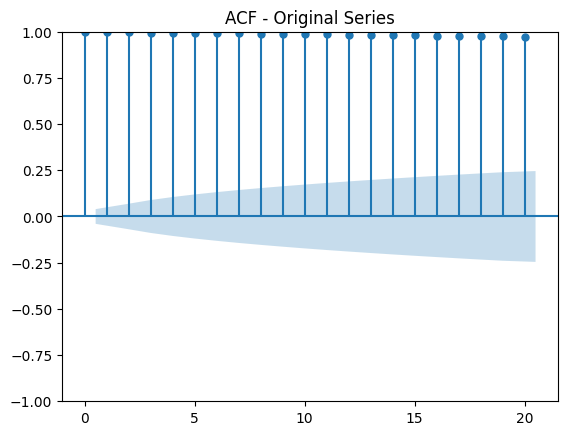

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

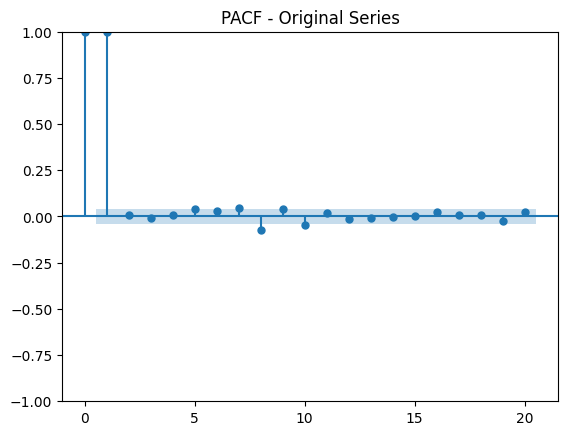

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

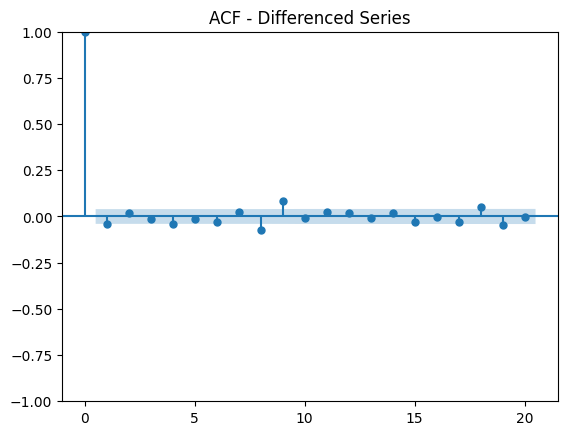

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

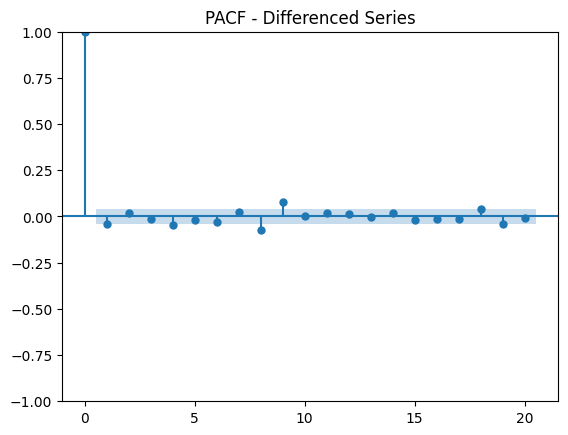

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9975| MAE: 0.4621| MSE: 0.4452| RMSE: 0.6672

Evaluating ARIMA(2, 1, 2)...
R²: 0.9975| MAE: 0.4619| MSE: 0.4444| RMSE: 0.6666

Evaluating ARIMA(0, 1, 1)...
R²: 0.9975| MAE: 0.4612| MSE: 0.4439| RMSE: 0.6663

Evaluating ARIMA(1, 1, 0)...
R²: 0.9975| MAE: 0.4612| MSE: 0.4440| RMSE: 0.6663

Evaluating ARIMA(5, 1, 0)...
R²: 0.9975| MAE: 0.4614| MSE: 0.4441| RMSE: 0.6664

Evaluating ARIMA(0, 1, 5)...
R²: 0.9975| MAE: 0.4611| MSE: 0.4434| RMSE: 0.6659

Best model: ARIMA(0, 1, 5) with R²: 0.9975


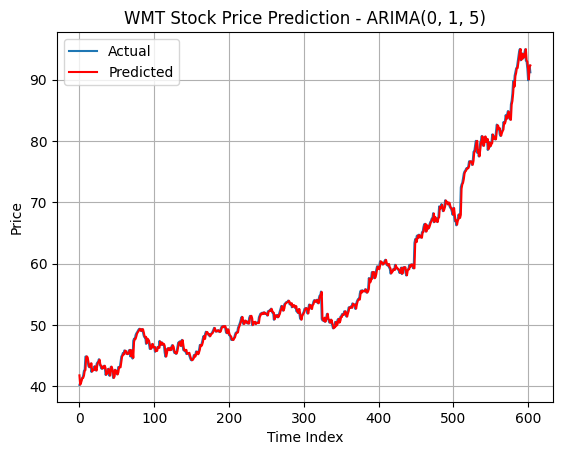

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'WMT Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (0, 1, 5)
ARIMA - R² Score: 0.9975
ARIMA - MAE     : 0.4611
ARIMA - MSE     : 0.4434
ARIMA - RMSE    : 0.6659


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 40.20, Predicted = 41.76
Day 2: Actual = 40.53, Predicted = 40.24
Day 3: Actual = 40.86, Predicted = 40.49
Day 4: Actual = 41.26, Predicted = 40.90
Day 5: Actual = 41.35, Predicted = 41.33
Day 6: Actual = 41.74, Predicted = 41.36
Day 7: Actual = 42.52, Predicted = 41.70
Day 8: Actual = 42.64, Predicted = 42.47
Day 9: Actual = 44.82, Predicted = 42.63
Day 10: Actual = 44.86, Predicted = 44.71


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9250
LSTM - MAE     : 2.2321
LSTM - MSE     : 13.0760
LSTM - RMSE    : 3.6161


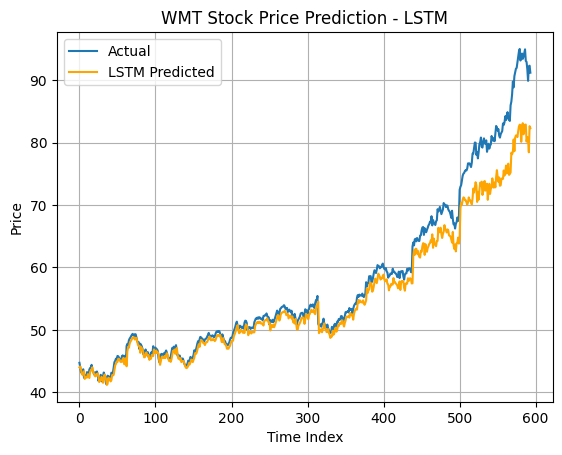


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 44.72, Predicted = 44.00
Day 2: Actual = 44.06, Predicted = 44.14
Day 3: Actual = 43.27, Predicted = 43.70
Day 4: Actual = 43.09, Predicted = 43.00
Day 5: Actual = 43.40, Predicted = 42.79
Day 6: Actual = 43.69, Predicted = 43.08
Day 7: Actual = 42.32, Predicted = 43.37
Day 8: Actual = 42.73, Predicted = 42.14
Day 9: Actual = 42.60, Predicted = 42.42
Day 10: Actual = 42.62, Predicted = 42.36


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('WMT Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9742
GRU - MAE     : 1.3895
GRU - MSE     : 4.4949
GRU - RMSE    : 2.1201


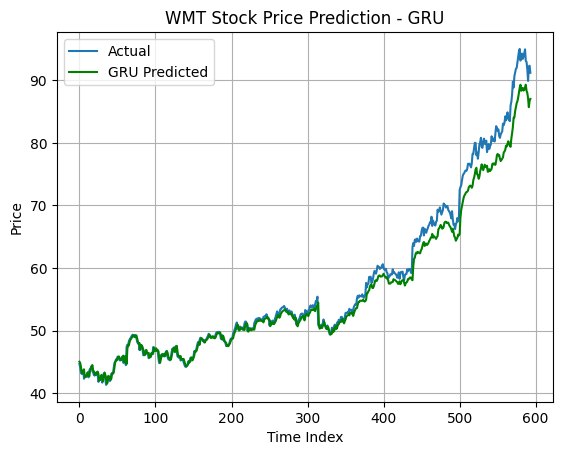


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 44.72, Predicted = 45.04
Day 2: Actual = 44.06, Predicted = 44.86
Day 3: Actual = 43.27, Predicted = 44.19
Day 4: Actual = 43.09, Predicted = 43.39
Day 5: Actual = 43.40, Predicted = 43.19
Day 6: Actual = 43.69, Predicted = 43.51
Day 7: Actual = 42.32, Predicted = 43.84
Day 8: Actual = 42.73, Predicted = 42.56
Day 9: Actual = 42.60, Predicted = 42.82
Day 10: Actual = 42.62, Predicted = 42.77


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('WMT Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9975, MAE: 0.4611, RMSE: 0.6659
LSTM  → R²: 0.9250, MAE: 2.2321, RMSE: 3.6161
GRU   → R²: 0.9742, MAE: 1.3895, RMSE: 2.1201


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
wmt_stock = pd.read_csv('Stocks Data/Walmart_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/WMT3Months_Stock.csv')

print("10 years WMT Stock for Training:", wmt_stock.shape)
print("3 months WMT Stock for Testing :", three_months_stock.shape)

10 years WMT Stock for Training: (3018, 3)
3 months WMT Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,89.537041,WMT_3Months
1,2025-01-03,90.313034,WMT_3Months
2,2025-01-06,90.959686,WMT_3Months
3,2025-01-07,90.342873,WMT_3Months
4,2025-01-08,91.327789,WMT_3Months
5,2025-01-10,92.521614,WMT_3Months
6,2025-01-13,91.059174,WMT_3Months
7,2025-01-14,90.322983,WMT_3Months
8,2025-01-15,90.870148,WMT_3Months
9,2025-01-16,90.830360,WMT_3Months


In [ ]:
# Date Conversion
wmt_stock['Date'] = pd.to_datetime(wmt_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
wmt_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_wmt = wmt_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_wmt

array([17.89883423, 17.78509521, 17.85230637, ..., 92.2032547 ,
       92.31269836, 91.18850708])

In [ ]:
three_months_test

array([ 89.53704071,  90.31303406,  90.95968628,  90.34287262,
        91.32778931,  92.52161407,  91.05917358,  90.32298279,
        90.87014771,  90.83036041,  91.4670639 ,  92.60120392,
        92.75043488,  93.32744598,  94.27256775,  96.89897919,
        96.78955078,  96.99845886,  98.14255524,  97.65507507,
        99.02796936, 100.25164795, 101.93294525, 102.32094574,
       100.62968445, 102.39058685, 101.94290161, 103.07704163,
       104.5096283 , 103.50482941, 103.24616241, 103.46502686,
        96.70995331,  94.29244995,  93.18816376,  97.18748474,
        95.70514679,  96.29212189,  98.10275269,  97.08799744,
        94.48147583,  95.48628998,  94.15317535,  91.24819946,
        87.36826324,  86.99021912,  84.76173401,  84.06533813,
        84.91095734,  87.01010895,  85.14972687,  85.88592529,
        85.36859894,  85.77262115,  87.27897644,  84.55556488,
        85.00447845,  85.42346191,  84.94462585])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (0, 1, 5)

# Walk-forward forecast for next 3 months
history = list(train_wmt)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.9164 | MAE: 1.2808 | MSE: 2.9982 | RMSE: 1.7315


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months WMT Stock - Actual vs Predicted:")
results.head()

3 Months WMT Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.385840,0.000000,0.000000
1,2025-01-03,90.313034,89.460845,0.866673,-2.106447
2,2025-01-06,90.959686,90.291776,1.588891,-1.197192
3,2025-01-07,90.342873,90.929139,0.899998,-0.499750
4,2025-01-08,91.327789,90.444500,2.000009,-1.030072


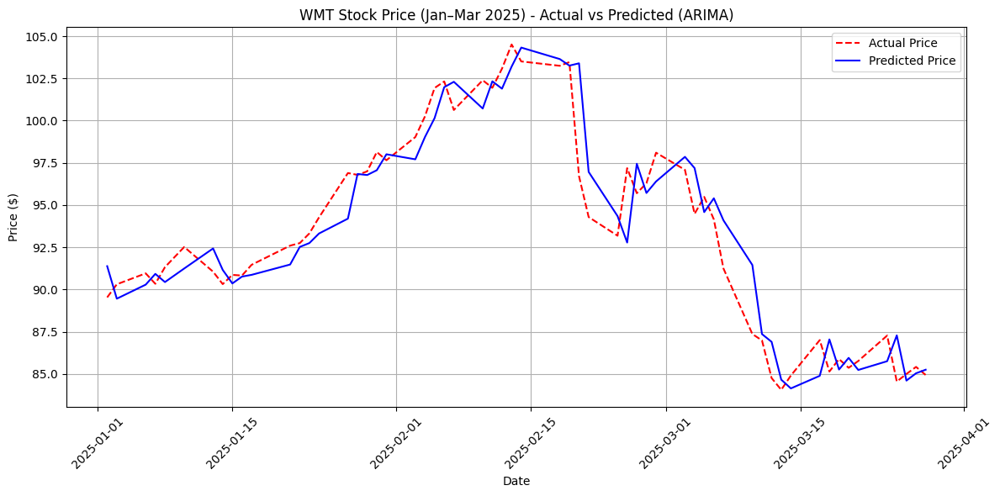

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('WMT Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = wmt_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.48210107],
        [-0.48678674],
        [-0.48401787],
        ...,
        [-0.48859722],
        [-0.49211155],
        [-0.48486995]],

       [[-0.48678674],
        [-0.48401787],
        [-0.49104684],
        ...,
        [-0.49211155],
        [-0.48486995],
        [-0.48242072]],

       [[-0.48401787],
        [-0.49104684],
        [-0.48902342],
        ...,
        [-0.48486995],
        [-0.48242072],
        [-0.48625439]],

       ...,

       [[ 2.64706809],
        [ 2.66383472],
        [ 2.62825659],
        ...,
        [ 2.60850217],
        [ 2.56095968],
        [ 2.48349875]],

       [[ 2.66383472],
        [ 2.62825659],
        [ 2.64333917],
        ...,
        [ 2.56095968],
        [ 2.48349875],
        [ 2.57899296]],

       [[ 2.62825659],
        [ 2.64333917],
        [ 2.66874983],
        ...,
        [ 2.48349875],
        [ 2.57899296],
        [ 2.58350167]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


WMT LSTM Evaluation:
R²: 0.8765 | MAE: 1.4935 | MSE: 4.4324 | RMSE: 2.1053


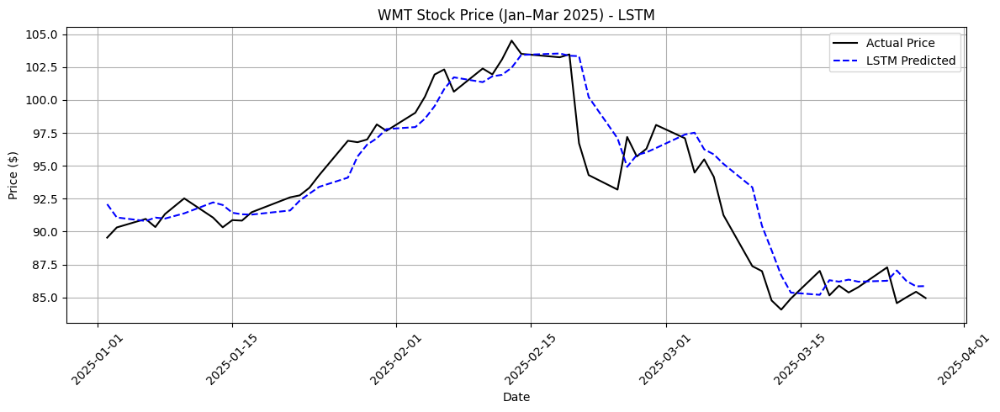


WMT LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,92.081421,0.000000,0.000000
1,2025-01-03,90.313034,91.069763,0.866673,-1.098657
2,2025-01-06,90.959686,90.802094,1.588891,-1.389343
3,2025-01-07,90.342873,91.061203,0.899998,-1.107949
4,2025-01-08,91.327789,90.985947,2.000009,-1.189679


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nWMT LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


WMT GRU Evaluation:
R²: 0.9007 | MAE: 1.5264 | MSE: 3.5618 | RMSE: 1.8873


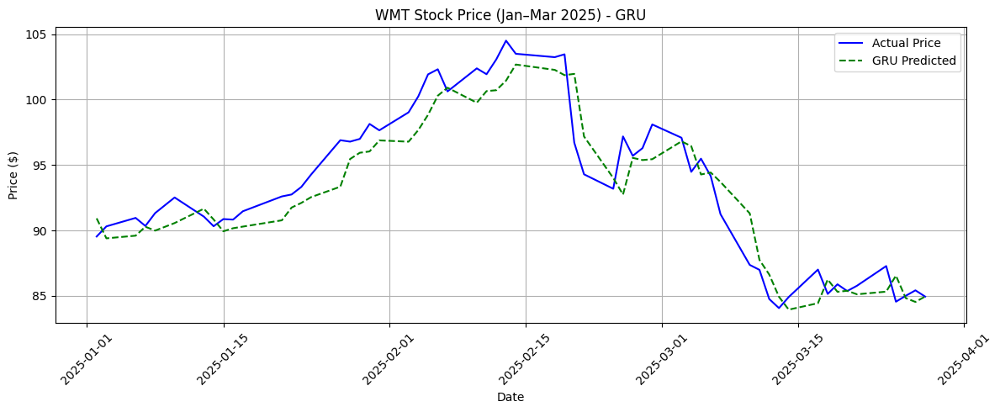


WMT GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,90.925171,0.000000,0.000000
1,2025-01-03,90.313034,89.398102,0.866673,-1.679480
2,2025-01-06,90.959686,89.601624,1.588891,-1.455647
3,2025-01-07,90.342873,90.285019,0.899998,-0.704044
4,2025-01-08,91.327789,89.988632,2.000009,-1.030010


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nWMT GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT GRU Model - Actual vs Predicted:")
gru_results.head()

## **8-DG Stock Predictions**

In [ ]:
dg_stock = pd.read_csv('Stocks Data/DG_stock.csv')

# Checking with DG Stock
print("Checking with DG Stock:\n")
dg_stock

Checking with DG Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,37.553761,DG
1,2013-01-03,37.037525,DG
2,2013-01-04,39.023708,DG
3,2013-01-07,38.253735,DG
4,2013-01-08,37.938747,DG
...,...,...,...
3013,2024-12-20,74.937576,DG
3014,2024-12-23,73.191650,DG
3015,2024-12-24,73.211266,DG
3016,2024-12-26,74.182312,DG


### Evaluation of DG Stock with 80% Training and 20% Testing

In [ ]:
dg_stock['Date'] = pd.to_datetime(dg_stock['Date'])
dg_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
dg_prices = dg_stock['Adj Close'].values
train_size = int(len(dg_prices) * 0.8)
train, test = dg_prices[:train_size], dg_prices[train_size:]

print(f"80% of DG Training Stocks size: {len(train)}")
print(f"20% of DG Testing Stocks  size: {len(test)}")

80% of DG Training Stocks size: 2414
20% of DG Testing Stocks  size: 604


In [ ]:
train

array([ 37.55376053,  37.03752518,  39.02370834, ..., 238.51737976,
       237.13597107, 238.43226624])

In [ ]:
test

array([237.76045227, 239.46360779, 241.56414795, 240.29626465,
       240.703125  , 238.31867981, 239.67176819, 239.33111572,
       242.96450806, 241.79121399, 243.79719543, 240.20162964,
       235.34761047, 234.27844238, 234.13650513, 232.84022522,
       223.60533142, 225.7910614 , 225.88568115, 224.64614868,
       229.70831299, 229.54745483, 226.907547  , 232.66044617,
       234.09867859, 233.95674133, 233.83370972, 227.39956665,
       228.0997467 , 227.89161682, 230.67341614, 232.39549255,
       232.53741455, 227.35229492, 227.27658081, 228.62016296,
       225.63020325, 223.16062927, 228.04295349, 226.58586121,
       226.9548645 , 233.75466919, 232.45542908, 230.16986084,
       229.19299316, 227.13505554, 227.23939514, 227.25834656,
       225.40901184, 229.65771484, 224.38478088, 224.19508362,
       225.32366943, 226.06340027, 224.97276306, 227.01176453,
       232.3321228 , 237.52920532, 237.64303589, 240.45018005,
       246.99397278, 241.88224792, 241.01922607, 236.78

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: 0.7229
p-value: 0.9903
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -11.8449
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

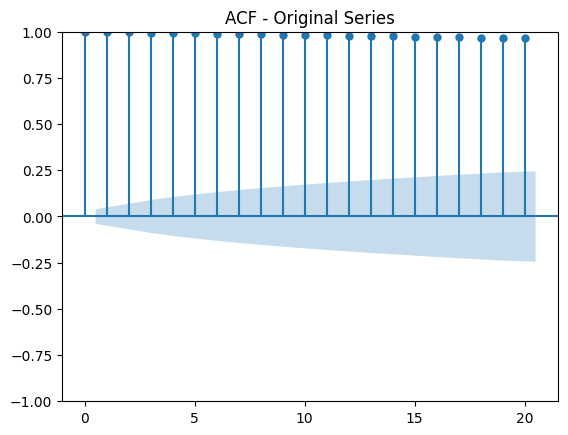

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

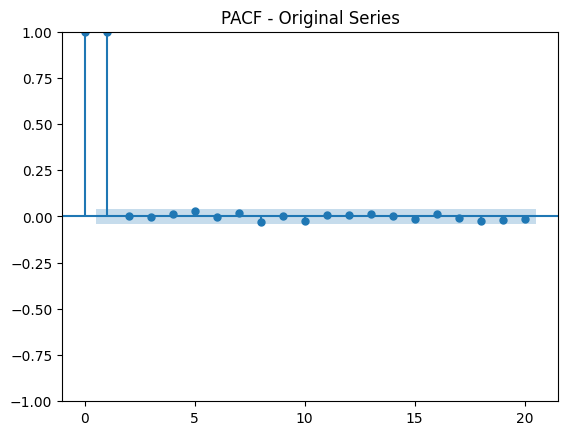

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

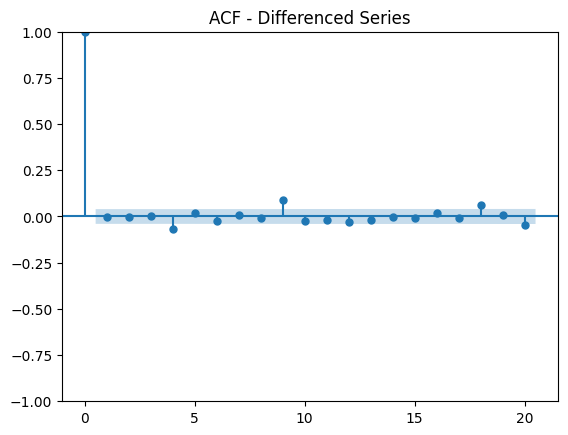

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

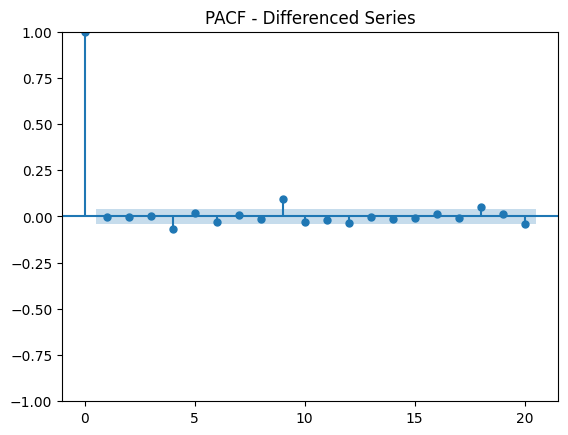

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9955| MAE: 2.0855| MSE: 12.6402| RMSE: 3.5553

Evaluating ARIMA(2, 1, 2)...
R²: -171.1174| MAE: 30.5130| MSE: 487221.8142| RMSE: 698.0128

Evaluating ARIMA(0, 1, 1)...
R²: 0.9955| MAE: 2.0863| MSE: 12.6576| RMSE: 3.5578

Evaluating ARIMA(1, 1, 0)...
R²: 0.9955| MAE: 2.0866| MSE: 12.6579| RMSE: 3.5578

Evaluating ARIMA(5, 1, 0)...
R²: 0.9955| MAE: 2.0911| MSE: 12.7029| RMSE: 3.5641

Evaluating ARIMA(0, 1, 5)...
R²: 0.9955| MAE: 2.0958| MSE: 12.7156| RMSE: 3.5659

Best model: ARIMA(1, 0, 1) with R²: 0.9955


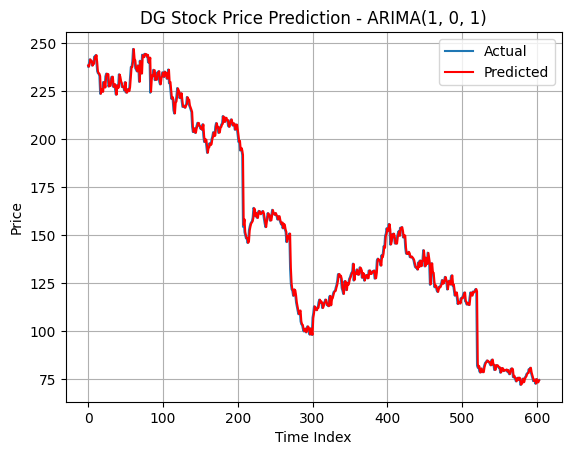

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'DG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (1, 0, 1)
ARIMA - R² Score: 0.9955
ARIMA - MAE     : 2.0855
ARIMA - MSE     : 12.6402
ARIMA - RMSE    : 3.5553


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 237.76, Predicted = 238.40
Day 2: Actual = 239.46, Predicted = 237.73
Day 3: Actual = 241.56, Predicted = 239.43
Day 4: Actual = 240.30, Predicted = 241.53
Day 5: Actual = 240.70, Predicted = 240.27
Day 6: Actual = 238.32, Predicted = 240.67
Day 7: Actual = 239.67, Predicted = 238.29
Day 8: Actual = 239.33, Predicted = 239.63
Day 9: Actual = 242.96, Predicted = 239.30
Day 10: Actual = 241.79, Predicted = 242.92


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9948
LSTM - MAE     : 2.3183
LSTM - MSE     : 14.4119
LSTM - RMSE    : 3.7963


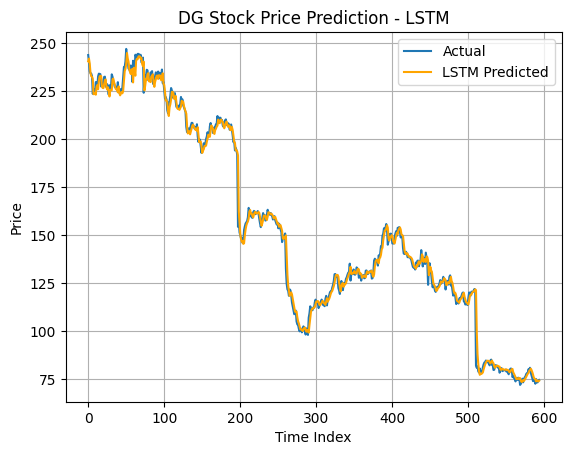


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 243.80, Predicted = 240.55
Day 2: Actual = 240.20, Predicted = 241.96
Day 3: Actual = 235.35, Predicted = 239.35
Day 4: Actual = 234.28, Predicted = 234.58
Day 5: Actual = 234.14, Predicted = 232.74
Day 6: Actual = 232.84, Predicted = 232.49
Day 7: Actual = 223.61, Predicted = 231.36
Day 8: Actual = 225.79, Predicted = 223.39
Day 9: Actual = 225.89, Predicted = 223.45
Day 10: Actual = 224.65, Predicted = 224.11


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('DG Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9953
GRU - MAE     : 2.1387
GRU - MSE     : 13.0718
GRU - RMSE    : 3.6155


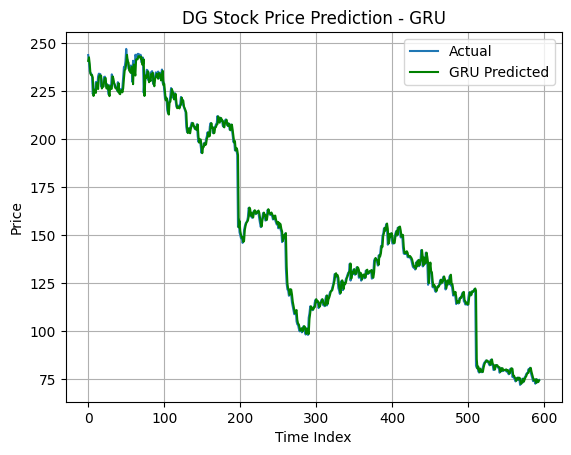


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 243.80, Predicted = 240.76
Day 2: Actual = 240.20, Predicted = 242.61
Day 3: Actual = 235.35, Predicted = 239.08
Day 4: Actual = 234.28, Predicted = 234.06
Day 5: Actual = 234.14, Predicted = 233.29
Day 6: Actual = 232.84, Predicted = 233.41
Day 7: Actual = 223.61, Predicted = 232.07
Day 8: Actual = 225.79, Predicted = 222.50
Day 9: Actual = 225.89, Predicted = 225.03
Day 10: Actual = 224.65, Predicted = 225.57


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('DG Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9955, MAE: 2.0958, RMSE: 3.5659
LSTM  → R²: 0.9948, MAE: 2.3183, RMSE: 3.7963
GRU   → R²: 0.9953, MAE: 2.1387, RMSE: 3.6155


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
dg_stock = pd.read_csv('Stocks Data/DG_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/DG3Months_Stock.csv')

print("10 years DG Stock for Training:", dg_stock.shape)
print("3 months DG Stock for Testing :", three_months_stock.shape)

10 years DG Stock for Training: (3018, 3)
3 months DG Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,74.182320,DG_3Months
1,2025-01-03,73.240685,DG_3Months
2,2025-01-06,74.398102,DG_3Months
3,2025-01-07,73.320587,DG_3Months
4,2025-01-08,70.799797,DG_3Months
5,2025-01-10,70.542770,DG_3Months
6,2025-01-13,70.770134,DG_3Months
7,2025-01-14,68.585442,DG_3Months
8,2025-01-15,67.784721,DG_3Months
9,2025-01-16,68.466820,DG_3Months


In [ ]:
# Date Conversion
dg_stock['Date'] = pd.to_datetime(dg_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
dg_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_dg = dg_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_dg

array([37.55376053, 37.03752518, 39.02370834, ..., 73.21126556,
       74.18231201, 74.43733978])

In [ ]:
three_months_test

array([74.18231964, 73.24068451, 74.39810181, 73.32058716, 70.79979706,
       70.54277039, 70.77013397, 68.58544159, 67.78472137, 68.46681976,
       67.65621185, 71.11612701, 69.91010284, 70.51311493, 70.95796204,
       72.46055603, 71.87730408, 71.21498108, 71.32372284, 70.24620819,
       70.65151215, 70.9777298 , 71.98604584, 71.77845764, 71.65982819,
       73.29093933, 73.28104401, 72.96470642, 72.0058136 , 71.72902679,
       74.17073822, 74.76387024, 75.25814056, 75.81172943, 78.12493134,
       77.68008423, 73.34036255, 73.13276672, 73.33047485, 71.0667038 ,
       72.08490753, 72.85596466, 75.36688232, 80.90274811, 81.85176086,
       77.73939514, 73.99279785, 79.03439331, 78.11504364, 78.93553925,
       80.47767639, 81.387146  , 80.73469543, 82.70191193, 82.2076416 ,
       81.63427734, 83.72999573, 86.53746796, 85.11396027])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (1, 0, 1)

# Walk-forward forecast for next 3 months
history = list(train_dg)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.8425 | MAE: 1.3133 | MSE: 3.3130 | RMSE: 1.8202


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months DG Stock - Actual vs Predicted:")
results.head()

3 Months DG Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.471676,0.000000,0.000000
1,2025-01-03,73.240685,74.227958,-1.269353,-0.327262
2,2025-01-06,74.398102,73.301826,0.290881,-1.570865
3,2025-01-07,73.320587,74.414088,-1.161641,-0.077329
4,2025-01-08,70.799797,73.384015,-4.559742,-1.460503


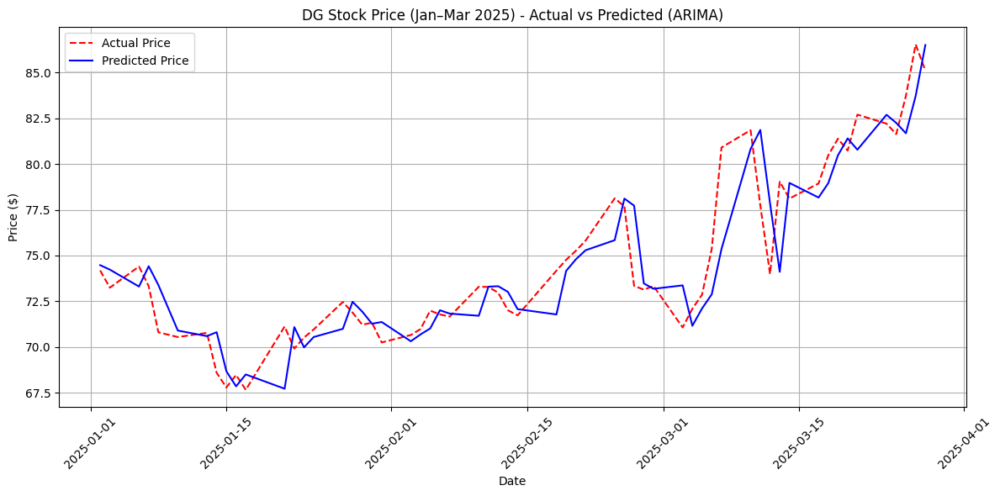

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('DG Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = dg_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.54632114],
        [-0.55117105],
        [-0.53251133],
        ...,
        [-0.54286874],
        [-0.54549919],
        [-0.53218255]],

       [[-0.55117105],
        [-0.53251133],
        [-0.53974505],
        ...,
        [-0.54549919],
        [-0.53218255],
        [-0.53226477]],

       [[-0.53251133],
        [-0.53974505],
        [-0.54270428],
        ...,
        [-0.53218255],
        [-0.53226477],
        [-0.53045634]],

       ...,

       [[-0.13991183],
        [-0.16359411],
        [-0.17649499],
        ...,
        [-0.21823857],
        [-0.19510919],
        [-0.21151174]],

       [[-0.16359411],
        [-0.17649499],
        [-0.19013313],
        ...,
        [-0.19510919],
        [-0.21151174],
        [-0.21132746]],

       [[-0.17649499],
        [-0.19013313],
        [-0.20552204],
        ...,
        [-0.21151174],
        [-0.21132746],
        [-0.20220472]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


DG LSTM Evaluation:
R²: 0.7811 | MAE: 1.6035 | MSE: 4.6048 | RMSE: 2.1459


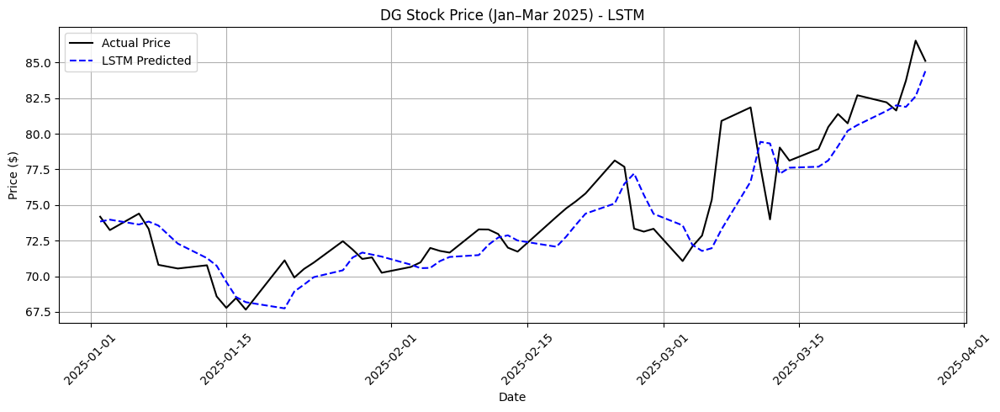


DG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,73.841202,0.000000,0.000000
1,2025-01-03,73.240685,73.971436,-1.269353,0.176370
2,2025-01-06,74.398102,73.631538,0.290881,-0.283939
3,2025-01-07,73.320587,73.837166,-1.161641,-0.005466
4,2025-01-08,70.799797,73.558350,-4.559742,-0.383055


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nDG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('DG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


DG GRU Evaluation:
R²: 0.8278 | MAE: 1.3684 | MSE: 3.6222 | RMSE: 1.9032


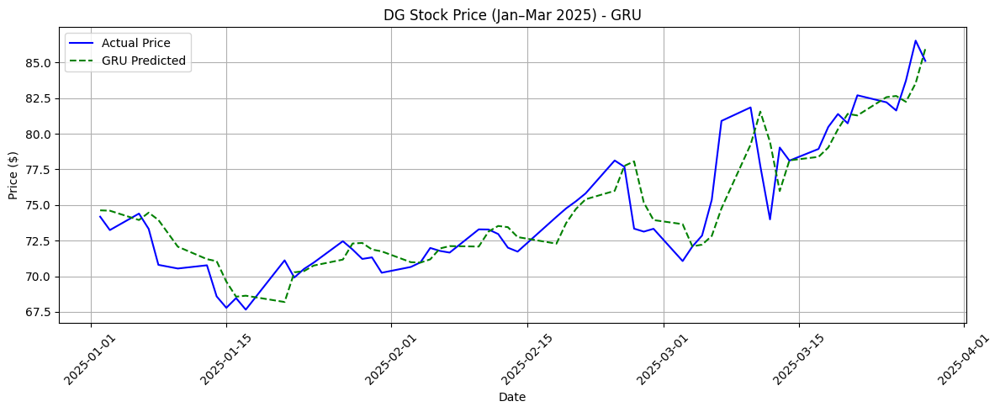


DG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.625526,0.000000,0.000000
1,2025-01-03,73.240685,74.600235,-1.269353,-0.033891
2,2025-01-06,74.398102,73.946777,0.290881,-0.909543
3,2025-01-07,73.320587,74.464272,-1.161641,-0.216085
4,2025-01-08,70.799797,73.952065,-4.559742,-0.902456


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nDG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('DG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG GRU Model - Actual vs Predicted:")
gru_results.head()

## **9-JNJ Stock Predictions**

In [ ]:
jnj_stock = pd.read_csv('Stocks Data/Johnson&Johnson_stock.csv')

# Checking with JNJ Stock
print("Checking with JNJ Stock:\n")
jnj_stock

Checking with JNJ Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,49.931343,JNJ
1,2013-01-03,49.860851,JNJ
2,2013-01-04,50.431789,JNJ
3,2013-01-07,50.326050,JNJ
4,2013-01-08,50.333092,JNJ
...,...,...,...
3013,2024-12-20,142.104507,JNJ
3014,2024-12-23,142.891418,JNJ
3015,2024-12-24,143.461914,JNJ
3016,2024-12-26,143.196320,JNJ


### Evaluation of JNJ Stock with 80% Training and 20% Testing

In [ ]:
jnj_stock['Date'] = pd.to_datetime(jnj_stock['Date'])
jnj_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
jnj_prices = jnj_stock['Adj Close'].values
train_size = int(len(jnj_prices) * 0.8)
train, test = jnj_prices[:train_size], jnj_prices[train_size:]

print(f"80% of JNJ Training Stocks size: {len(train)}")
print(f"20% of JNJ Testing Stocks  size: {len(test)}")

80% of JNJ Training Stocks size: 2414
20% of JNJ Testing Stocks  size: 604


In [ ]:
train

array([ 49.93134308,  49.86085129,  50.4317894 , ..., 158.83030701,
       157.92617798, 159.45133972])

In [ ]:
test

array([156.89413452, 156.27310181, 155.44198608, 155.42372131,
       155.87123108, 152.64735413, 150.96688843, 151.68836975,
       153.04006958, 153.04917908, 152.30941772, 154.62918091,
       154.0867157 , 152.74433899, 152.23866272, 153.66377258,
       151.03422546, 149.86656189, 149.34246826, 148.34031677,
       152.01800537, 149.6275177 , 150.03205872, 150.85035706,
       152.06396484, 152.35818481, 152.29386902, 148.33111572,
       151.39279175, 151.77896118, 154.09594727, 152.88226318,
       151.67781067, 150.12400818, 152.79031372, 153.28681946,
       152.34899902, 151.6502533 , 152.95582581, 151.27326965,
       150.19755554, 150.0504303 , 152.2754364 , 151.80653381,
       148.86436462, 147.29214478, 147.48524475, 149.61828613,
       149.58154297, 151.84333801, 151.20892334, 153.16731262,
       152.63401794, 151.4203949 , 151.80653381, 155.1164856 ,
       157.2035675 , 156.95533752, 158.33447266, 158.42640686,
       160.78015137, 159.95266724, 159.14356995, 156.69

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -0.8185
p-value: 0.8136
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -16.0829
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

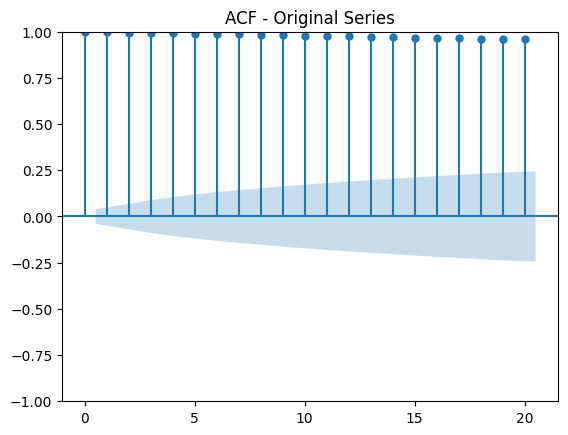

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

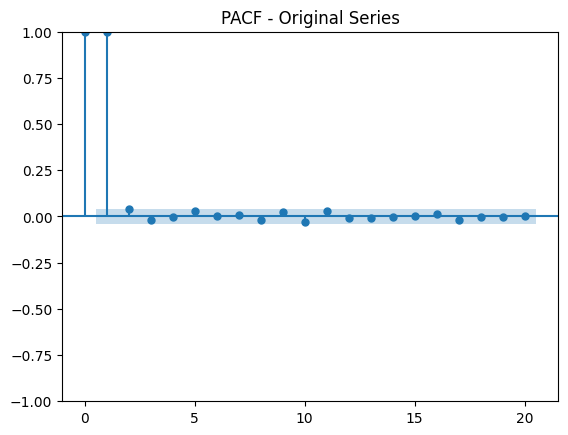

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

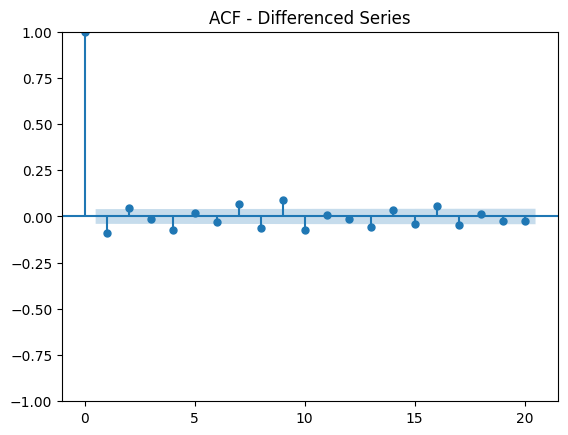

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

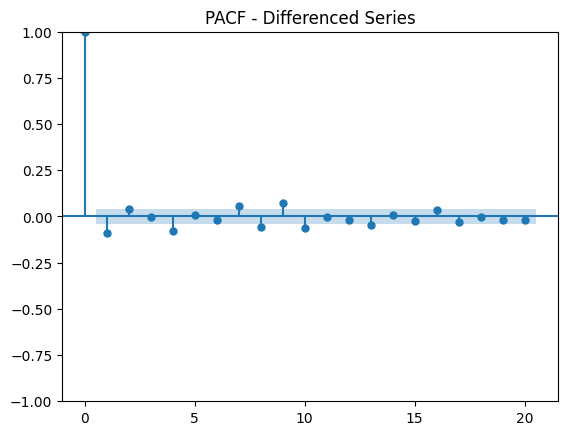

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9465| MAE: 1.1064| MSE: 2.2957| RMSE: 1.5151

Evaluating ARIMA(2, 1, 2)...
R²: 0.9464| MAE: 1.1090| MSE: 2.3010| RMSE: 1.5169

Evaluating ARIMA(0, 1, 1)...
R²: 0.9465| MAE: 1.1062| MSE: 2.2967| RMSE: 1.5155

Evaluating ARIMA(1, 1, 0)...
R²: 0.9464| MAE: 1.1077| MSE: 2.2993| RMSE: 1.5163

Evaluating ARIMA(5, 1, 0)...
R²: 0.9461| MAE: 1.1129| MSE: 2.3140| RMSE: 1.5212

Evaluating ARIMA(0, 1, 5)...
R²: 0.9461| MAE: 1.1122| MSE: 2.3128| RMSE: 1.5208

Best model: ARIMA(1, 0, 1) with R²: 0.9465


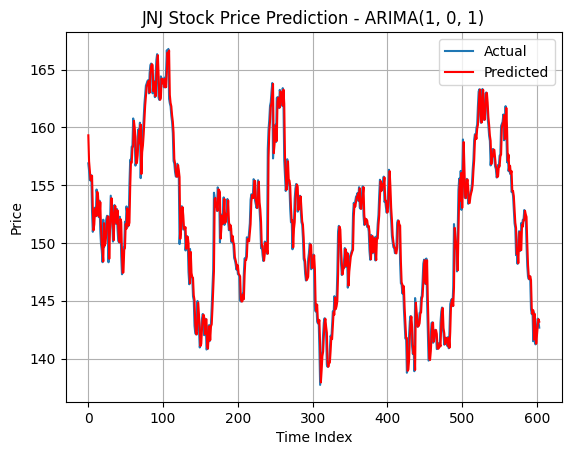

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'JNJ Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (1, 0, 1)
ARIMA - R² Score: 0.9465
ARIMA - MAE     : 1.1064
ARIMA - MSE     : 2.2957
ARIMA - RMSE    : 1.5151


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 156.89, Predicted = 159.32
Day 2: Actual = 156.27, Predicted = 157.07
Day 3: Actual = 155.44, Predicted = 156.32
Day 4: Actual = 155.42, Predicted = 155.49
Day 5: Actual = 155.87, Predicted = 155.41
Day 6: Actual = 152.65, Predicted = 155.82
Day 7: Actual = 150.97, Predicted = 152.88
Day 8: Actual = 151.69, Predicted = 151.10
Day 9: Actual = 153.04, Predicted = 151.62
Day 10: Actual = 153.05, Predicted = 152.91


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9450
LSTM - MAE     : 1.1524
LSTM - MSE     : 2.3916
LSTM - RMSE    : 1.5465


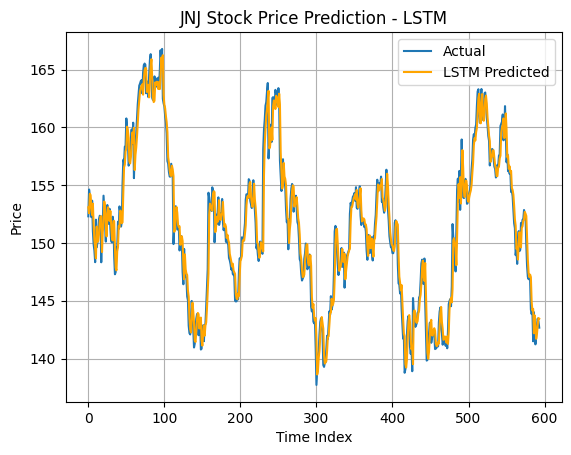


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 152.31, Predicted = 153.09
Day 2: Actual = 154.63, Predicted = 152.57
Day 3: Actual = 154.09, Predicted = 154.26
Day 4: Actual = 152.74, Predicted = 154.14
Day 5: Actual = 152.24, Predicted = 153.05
Day 6: Actual = 153.66, Predicted = 152.42
Day 7: Actual = 151.03, Predicted = 153.41
Day 8: Actual = 149.87, Predicted = 151.55
Day 9: Actual = 149.34, Predicted = 150.26
Day 10: Actual = 148.34, Predicted = 149.60


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('JNJ Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9180
GRU - MAE     : 1.5103
GRU - MSE     : 3.5615
GRU - RMSE    : 1.8872


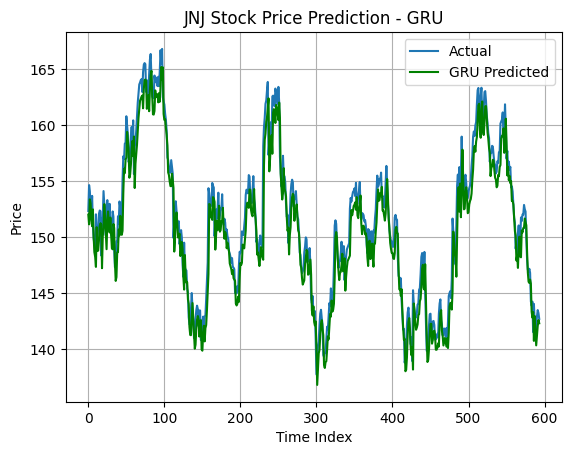


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 152.31, Predicted = 151.99
Day 2: Actual = 154.63, Predicted = 151.12
Day 3: Actual = 154.09, Predicted = 153.35
Day 4: Actual = 152.74, Predicted = 152.98
Day 5: Actual = 152.24, Predicted = 151.49
Day 6: Actual = 153.66, Predicted = 150.96
Day 7: Actual = 151.03, Predicted = 152.46
Day 8: Actual = 149.87, Predicted = 149.99
Day 9: Actual = 149.34, Predicted = 148.62
Day 10: Actual = 148.34, Predicted = 148.22


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('JNJ Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9465, MAE: 1.1122, RMSE: 1.5208
LSTM  → R²: 0.9450, MAE: 1.1524, RMSE: 1.5465
GRU   → R²: 0.9180, MAE: 1.5103, RMSE: 1.8872


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
jnj_stock = pd.read_csv('Stocks Data/Johnson&Johnson_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/JNJ3Months_Stock.csv')

print("10 years JNJ Stock for Training:", jnj_stock.shape)
print("3 months JNJ Stock for Testing :", three_months_stock.shape)

10 years JNJ Stock for Training: (3018, 3)
3 months JNJ Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,141.661880,JNJ_3Months
1,2025-01-03,141.829102,JNJ_3Months
2,2025-01-06,141.307770,JNJ_3Months
3,2025-01-07,143.835678,JNJ_3Months
4,2025-01-08,139.940536,JNJ_3Months
5,2025-01-10,139.733963,JNJ_3Months
6,2025-01-13,142.104507,JNJ_3Months
7,2025-01-14,142.379913,JNJ_3Months
8,2025-01-15,142.596329,JNJ_3Months
9,2025-01-16,145.350479,JNJ_3Months


In [ ]:
# Date Conversion
jnj_stock['Date'] = pd.to_datetime(jnj_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
jnj_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_jnj = jnj_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_jnj

array([ 49.93134308,  49.86085129,  50.4317894 , ..., 143.46191406,
       143.19631958, 142.67500305])

In [ ]:
three_months_test

array([141.66188049, 141.82910156, 141.30776978, 143.8356781 ,
       139.9405365 , 139.73396301, 142.10450745, 142.37991333,
       142.59632874, 145.35047913, 144.62258911, 145.72424316,
       142.89141846, 144.23898315, 144.41603088, 150.38664246,
       147.91773987, 148.67512512, 150.36697388, 149.65875244,
       149.3833313 , 150.9768219 , 152.15716553, 150.99647522,
       150.61286926, 151.71455383, 153.57359314, 152.71783447,
       154.67524719, 153.59326172, 153.6725769 , 156.54792786,
       158.32270813, 160.92044067, 162.34820557, 164.67822266,
       161.69381714, 162.33828735, 163.61732483, 165.85810852,
       164.01391602, 163.71646118, 164.42044067, 165.27313232,
       166.27453613, 164.45018005, 161.46577454, 161.60458374,
       161.42610168, 161.45585632, 162.85386658, 161.60458374,
       161.63432312, 162.23913574, 161.90202332, 159.65132141,
       160.34536743, 161.74339294, 162.31846619])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (1, 1, 1)

# Walk-forward forecast for next 3 months
history = list(train_jnj)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.9569 | MAE: 1.3422 | MSE: 3.0259 | RMSE: 1.7395


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months JNJ Stock - Actual vs Predicted:")
results.head()

3 Months JNJ Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,142.700863,0.000000,0.000000
1,2025-01-03,141.829102,141.716492,0.118042,-0.689815
2,2025-01-06,141.307770,141.805457,-0.249969,-0.627471
3,2025-01-07,143.835678,141.345085,1.534497,-0.950084
4,2025-01-08,139.940536,143.673316,-1.215107,0.681462


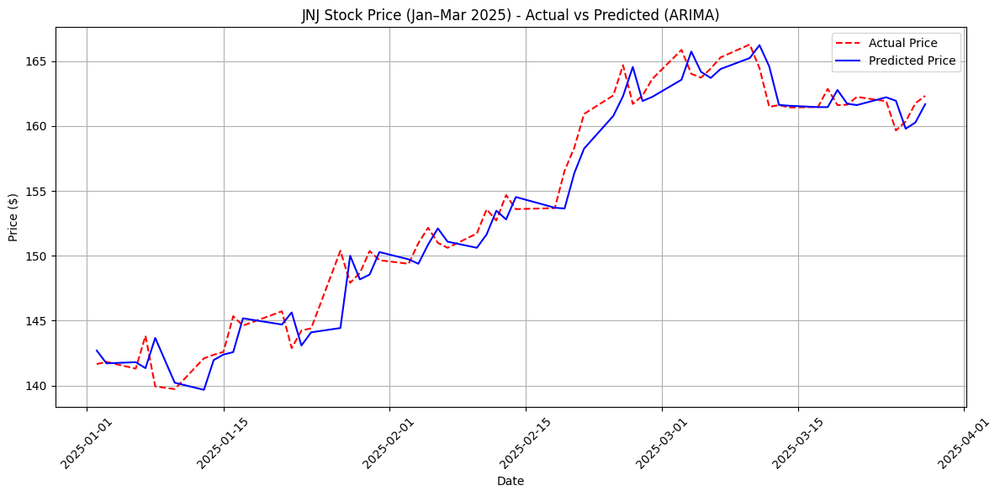

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('JNJ Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = jnj_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.94637153],
        [-0.94743559],
        [-0.9388174 ],
        ...,
        [-0.93030591],
        [-0.92807179],
        [-0.9300932 ]],

       [[-0.94743559],
        [-0.9388174 ],
        [-0.94041352],
        ...,
        [-0.92807179],
        [-0.9300932 ],
        [-0.92785879]],

       [[-0.9388174 ],
        [-0.94041352],
        [-0.94030722],
        ...,
        [-0.9300932 ],
        [-0.92785879],
        [-0.92445408]],

       ...,

       [[ 0.5156369 ],
        [ 0.47718178],
        [ 0.47124277],
        ...,
        [ 0.43174795],
        [ 0.44496234],
        [ 0.45684059]],

       [[ 0.47718178],
        [ 0.47124277],
        [ 0.47688466],
        ...,
        [ 0.44496234],
        [ 0.45684059],
        [ 0.46545209]],

       [[ 0.47124277],
        [ 0.47688466],
        [ 0.43575681],
        ...,
        [ 0.45684059],
        [ 0.46545209],
        [ 0.461443  ]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


JNJ LSTM Evaluation:
R²: 0.9567 | MAE: 1.3472 | MSE: 3.0386 | RMSE: 1.7432


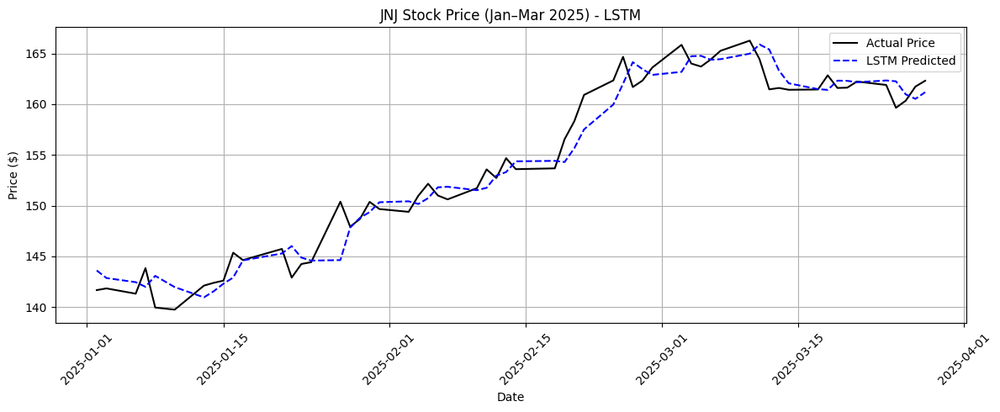


JNJ LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,143.596481,0.000000,0.000000
1,2025-01-03,141.829102,142.850189,0.118042,-0.519717
2,2025-01-06,141.307770,142.443359,-0.249969,-0.803030
3,2025-01-07,143.835678,141.987320,1.534497,-1.120615
4,2025-01-08,139.940536,143.067657,-1.215107,-0.368273


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJNJ LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('JNJ Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


JNJ GRU Evaluation:
R²: 0.9594 | MAE: 1.3044 | MSE: 2.8493 | RMSE: 1.6880


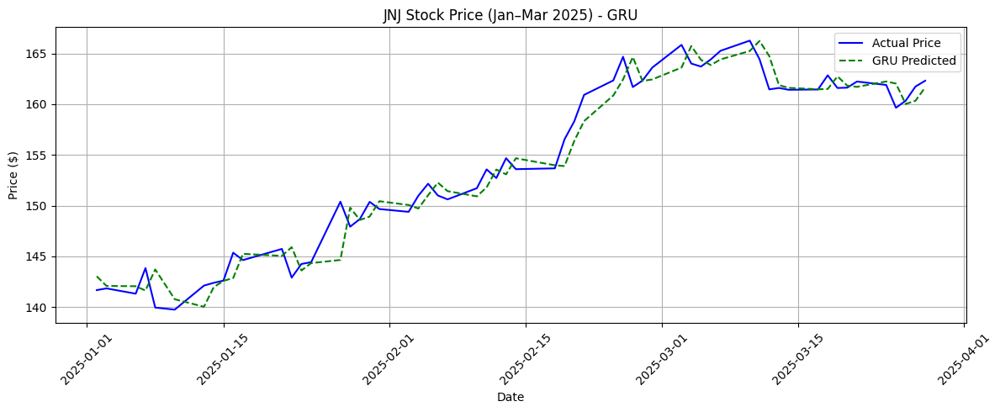


JNJ GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,143.025681,0.000000,0.000000
1,2025-01-03,141.829102,142.072113,0.118042,-0.666708
2,2025-01-06,141.307770,142.044388,-0.249969,-0.686097
3,2025-01-07,143.835678,141.617188,1.534497,-0.984782
4,2025-01-08,139.940536,143.702087,-1.215107,0.472927


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJNJ GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('JNJ Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ GRU Model - Actual vs Predicted:")
gru_results.head()

### **10-JPM Stock Predictions**

In [ ]:
jpm_stock = pd.read_csv('Stocks Data/JPMorgan_stock.csv')

# Checking with JPM Stock
print("Checking with JPM Stock:\n")
jpm_stock

Checking with JPM Stock:



,Date,Adj Close,Stock Name
0,2013-01-02,31.797243,JPM
1,2013-01-03,31.733149,JPM
2,2013-01-04,32.295635,JPM
3,2013-01-07,32.331223,JPM
4,2013-01-08,32.395309,JPM
...,...,...,...
3013,2024-12-20,233.805740,JPM
3014,2024-12-23,234.583099,JPM
3015,2024-12-24,238.440506,JPM
3016,2024-12-26,239.257263,JPM


### Evaluation of JPM Stock with 80% Training and 20% Testing

In [ ]:
jpm_stock['Date'] = pd.to_datetime(jpm_stock['Date'])
jpm_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
jpm_prices = jpm_stock['Adj Close'].values
train_size = int(len(jpm_prices) * 0.8)
train, test = jpm_prices[:train_size], jpm_prices[train_size:]

print(f"80% of JPM Training Stocks size: {len(train)}")
print(f"20% of JPM Testing Stocks  size: {len(test)}")

80% of JPM Training Stocks size: 2414
20% of JPM Testing Stocks  size: 604


In [ ]:
train

array([ 31.79724312,  31.73314857,  32.29563522, ..., 105.64265442,
       103.9961853 , 105.08766174])

In [ ]:
test

array([103.93143463, 107.07637787, 105.77214813, 106.72489929,
       109.50907898, 111.12781525, 112.96853638, 113.27378082,
       114.35601807, 113.39402771, 112.51529694, 109.73108673,
       107.91811371, 106.85437775, 107.11339569, 109.65710449,
       106.06813812, 105.80915833, 105.82765961, 105.1986618 ,
       105.92015839, 105.18015289, 105.207901  , 107.20588684,
       109.70333862, 110.23058319, 111.5348053 , 107.65914154,
       107.40938568, 109.02809906, 108.29736328, 109.2963562 ,
       107.14112091, 104.05167389, 102.86769867, 100.95297241,
        98.77925873,  97.90976715,  99.88922882,  98.19651031,
        96.66104126,  99.64875793, 104.31066895, 103.02277374,
       100.92292786,  98.90708923,  97.98314667,  95.15537262,
        96.69525909, 102.07085419, 103.76937866, 108.12770844,
       110.90883636, 108.73432922, 108.37969208, 114.07259369,
       114.21257019, 114.51121521, 115.82713318, 116.2844162 ,
       117.66565704, 117.47900391, 119.59749603, 118.49

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -1.2169
p-value: 0.6663
Critical Values:
	1%: -3.4331
	5%: -2.8627
	10%: -2.5674

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -9.5033
p-value: 0.0000
Critical Values:
	1%: -3.4331
	5%: -2.8628
	10%: -2.5674

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

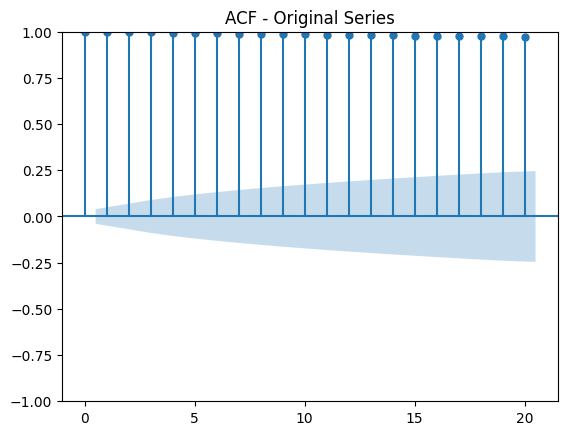

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

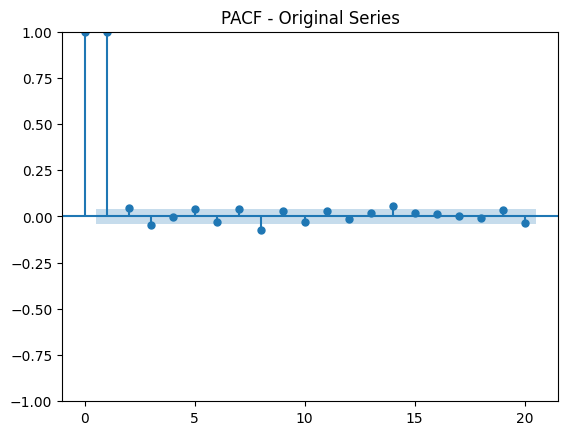

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

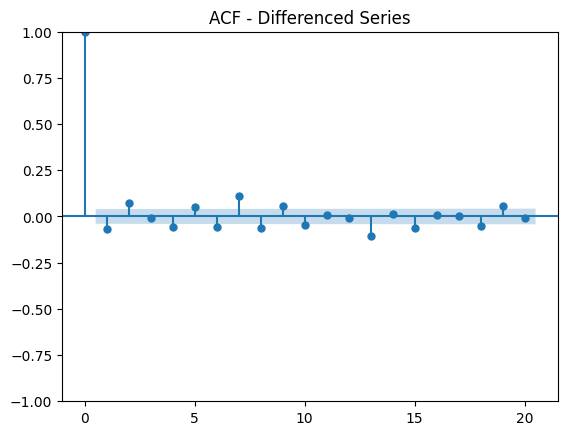

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

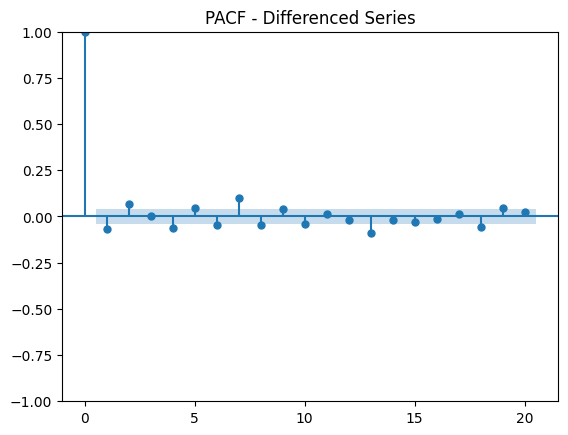

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9961| MAE: 1.5966| MSE: 5.8170| RMSE: 2.4118

Evaluating ARIMA(2, 1, 2)...
R²: 0.9961| MAE: 1.6018| MSE: 5.8457| RMSE: 2.4178

Evaluating ARIMA(0, 1, 1)...
R²: 0.9961| MAE: 1.5917| MSE: 5.8030| RMSE: 2.4089

Evaluating ARIMA(1, 1, 0)...
R²: 0.9961| MAE: 1.5924| MSE: 5.8030| RMSE: 2.4089

Evaluating ARIMA(5, 1, 0)...
R²: 0.9961| MAE: 1.5909| MSE: 5.8092| RMSE: 2.4102

Evaluating ARIMA(0, 1, 5)...
R²: 0.9961| MAE: 1.5896| MSE: 5.8043| RMSE: 2.4092

Best model: ARIMA(0, 1, 1) with R²: 0.9961


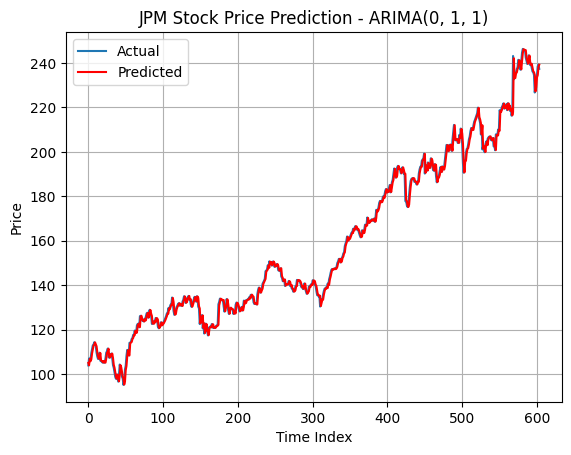

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'JPM Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (0, 1, 1)
ARIMA - R² Score: 0.9961
ARIMA - MAE     : 1.5917
ARIMA - MSE     : 5.8030
ARIMA - RMSE    : 2.4089


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 103.93, Predicted = 105.03
Day 2: Actual = 107.08, Predicted = 104.00
Day 3: Actual = 105.77, Predicted = 106.90
Day 4: Actual = 106.72, Predicted = 105.84
Day 5: Actual = 109.51, Predicted = 106.67
Day 6: Actual = 111.13, Predicted = 109.34
Day 7: Actual = 112.97, Predicted = 111.02
Day 8: Actual = 113.27, Predicted = 112.86
Day 9: Actual = 114.36, Predicted = 113.25
Day 10: Actual = 113.39, Predicted = 114.29


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9919
LSTM - MAE     : 2.5551
LSTM - MSE     : 12.0084
LSTM - RMSE    : 3.4653


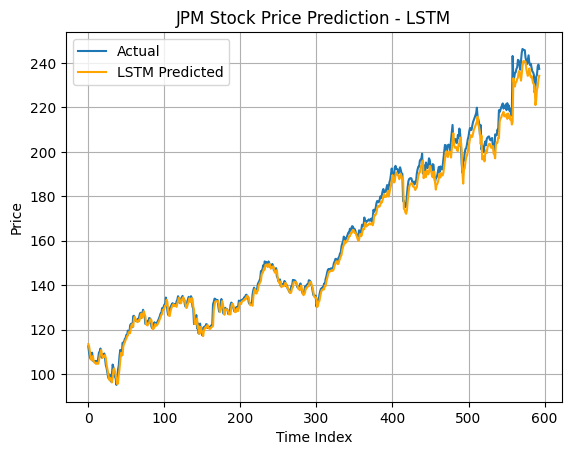


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 112.52, Predicted = 113.47
Day 2: Actual = 109.73, Predicted = 112.57
Day 3: Actual = 107.92, Predicted = 110.15
Day 4: Actual = 106.85, Predicted = 107.95
Day 5: Actual = 107.11, Predicted = 106.42
Day 6: Actual = 109.66, Predicted = 106.18
Day 7: Actual = 106.07, Predicted = 108.14
Day 8: Actual = 105.81, Predicted = 106.03
Day 9: Actual = 105.83, Predicted = 105.29
Day 10: Actual = 105.20, Predicted = 105.10


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('JPM Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9913
GRU - MAE     : 2.5290
GRU - MSE     : 12.8517
GRU - RMSE    : 3.5849


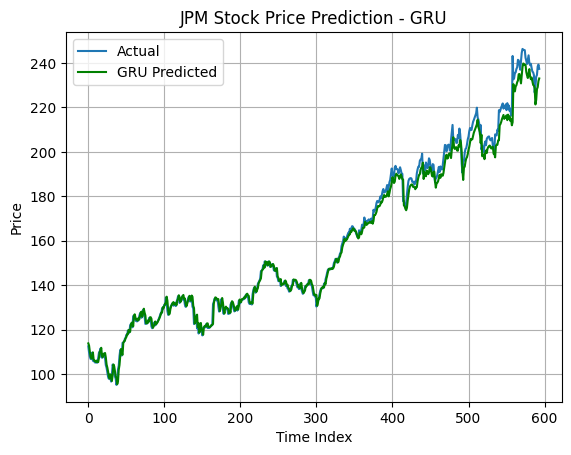


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 112.52, Predicted = 113.83
Day 2: Actual = 109.73, Predicted = 112.85
Day 3: Actual = 107.92, Predicted = 110.08
Day 4: Actual = 106.85, Predicted = 108.11
Day 5: Actual = 107.11, Predicted = 107.01
Day 6: Actual = 109.66, Predicted = 107.26
Day 7: Actual = 106.07, Predicted = 109.79
Day 8: Actual = 105.81, Predicted = 106.58
Day 9: Actual = 105.83, Predicted = 105.94
Day 10: Actual = 105.20, Predicted = 106.02


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('JPM Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9961, MAE: 1.5896, RMSE: 2.4092
LSTM  → R²: 0.9919, MAE: 2.5551, RMSE: 3.4653
GRU   → R²: 0.9913, MAE: 2.5290, RMSE: 3.5849


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
jpm_stock = pd.read_csv('Stocks Data/JPMorgan_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/JPM3Months_Stock.csv')

print("10 years JPM Stock for Training:", jpm_stock.shape)
print("3 months JPM Stock for Testing :", three_months_stock.shape)

10 years JPM Stock for Training: (3018, 3)
3 months JPM Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,236.167404,JPM_3Months
1,2025-01-03,239.395020,JPM_3Months
2,2025-01-06,238.227859,JPM_3Months
3,2025-01-07,240.522598,JPM_3Months
4,2025-01-08,240.483047,JPM_3Months
5,2025-01-10,237.258530,JPM_3Months
6,2025-01-13,241.551300,JPM_3Months
7,2025-01-14,244.775787,JPM_3Months
8,2025-01-15,249.602676,JPM_3Months
9,2025-01-16,251.501770,JPM_3Months


In [ ]:
# Date Conversion
jpm_stock['Date'] = pd.to_datetime(jpm_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
jpm_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_jpm = jpm_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_jpm

array([ 31.79724312,  31.73314857,  32.29563522, ..., 238.44050598,
       239.25726318, 237.31872559])

In [ ]:
three_months_test

array([236.16740417, 239.39501953, 238.2278595 , 240.52259827,
       240.48304749, 237.25852966, 241.55130005, 244.77578735,
       249.60267639, 251.50177002, 256.33853149, 260.16638184,
       259.97845459, 263.05459595, 261.95669556, 262.95568848,
       264.23165894, 263.67773438, 265.30978394, 264.38989258,
       263.90524292, 265.02294922, 267.48580933, 273.88537598,
       272.79736328, 268.08920288, 271.9961853 , 272.45120239,
       273.31170654, 273.57876587, 276.90219116, 276.20980835,
       263.89535522, 261.36322021, 258.49481201, 254.59768677,
       255.97254944, 256.22970581, 261.76876831, 257.78262329,
       247.52552795, 248.79159546, 243.85591125, 239.64228821,
       229.69181824, 226.64535522, 225.4188385 , 222.73835754,
       229.90942383, 231.38319397, 232.41188049, 236.50680542,
       236.40789795, 238.99937439, 245.359375  , 248.39595032,
       248.29704285, 245.41871643, 240.20610046])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (0, 1, 1)

# Walk-forward forecast for next 3 months
history = list(train_jpm)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.9267 | MAE: 2.9812 | MSE: 15.6597 | RMSE: 3.9572


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months JPM Stock - Actual vs Predicted:")
results.head()

3 Months JPM Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,237.432900,0.000000,0.000000
1,2025-01-03,239.395020,236.244165,1.366664,-0.500661
2,2025-01-06,238.227859,239.202428,0.872455,0.745275
3,2025-01-07,240.522598,238.287689,1.844113,0.360013
4,2025-01-08,240.483047,240.384854,1.827366,1.243280


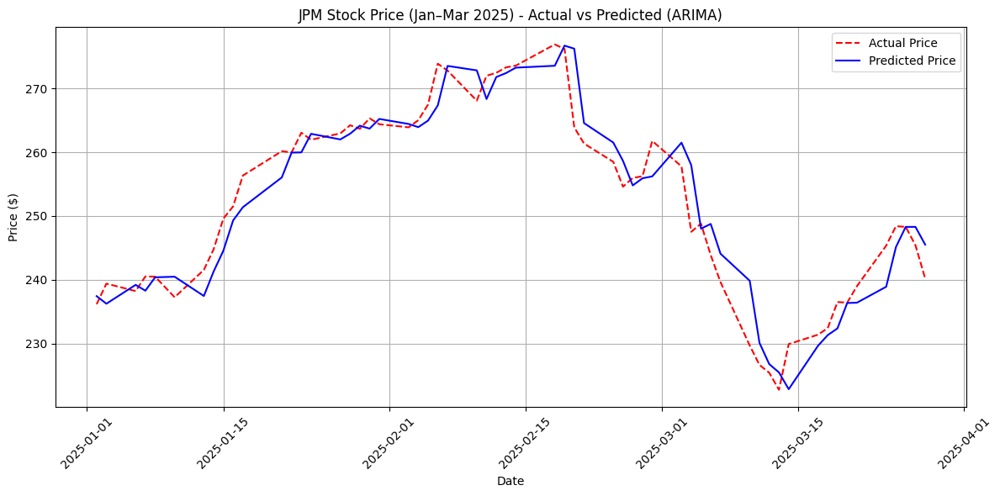

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('JPM Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = jpm_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.73389126],
        [-0.73472762],
        [-0.72738782],
        ...,
        [-0.72014138],
        [-0.72255688],
        [-0.71819035]],

       [[-0.73472762],
        [-0.72738782],
        [-0.72692345],
        ...,
        [-0.72255688],
        [-0.71819035],
        [-0.71382373]],

       [[-0.72738782],
        [-0.72692345],
        [-0.72608719],
        ...,
        [-0.71819035],
        [-0.71382373],
        [-0.71735419]],

       ...,

       [[ 1.96962755],
        [ 1.97823048],
        [ 1.95254952],
        ...,
        [ 1.84250681],
        [ 1.90208678],
        [ 1.91223042]],

       [[ 1.97823048],
        [ 1.95254952],
        [ 1.93213342],
        ...,
        [ 1.90208678],
        [ 1.91223042],
        [ 1.96256513]],

       [[ 1.95254952],
        [ 1.93213342],
        [ 1.92751089],
        ...,
        [ 1.91223042],
        [ 1.96256513],
        [ 1.97322287]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


JPM LSTM Evaluation:
R²: 0.8838 | MAE: 4.2019 | MSE: 24.8341 | RMSE: 4.9834


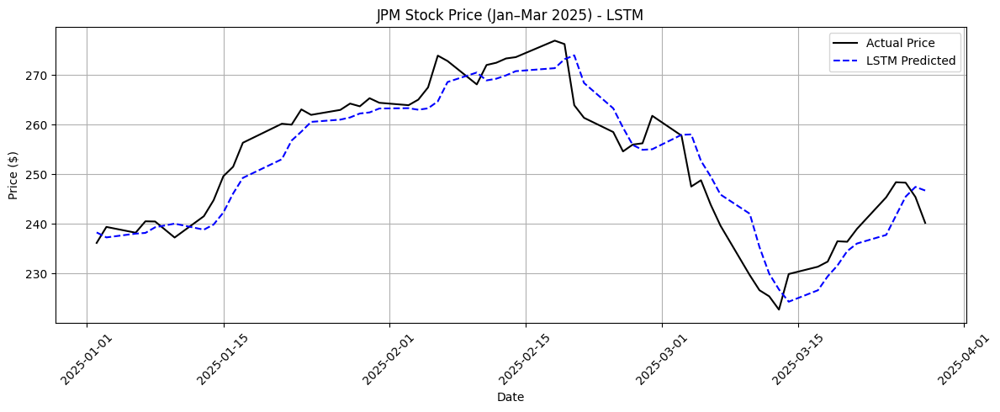


JPM LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,238.283401,0.000000,0.000000
1,2025-01-03,239.395020,237.280624,1.366664,-0.420833
2,2025-01-06,238.227859,238.039276,0.872455,-0.102454
3,2025-01-07,240.522598,238.186676,1.844113,-0.040591
4,2025-01-08,240.483047,239.320145,1.827366,0.435090


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJPM LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('JPM Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


JPM GRU Evaluation:
R²: 0.9085 | MAE: 3.7427 | MSE: 19.5687 | RMSE: 4.4237


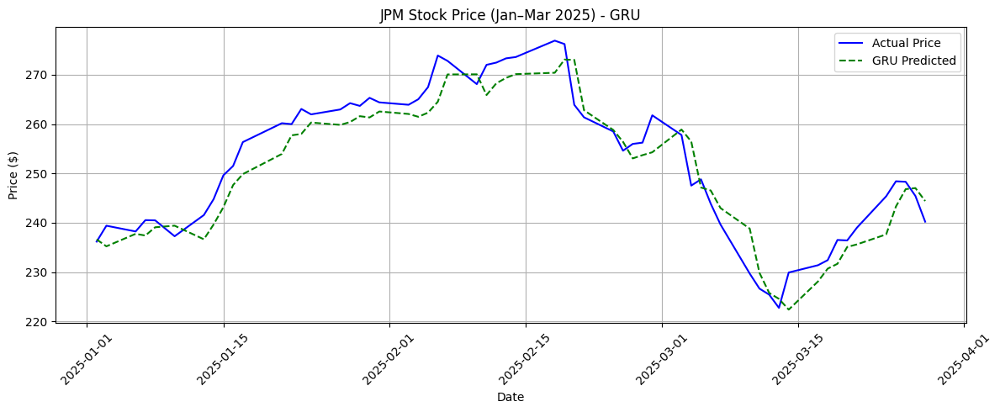


JPM GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,236.615311,0.000000,0.000000
1,2025-01-03,239.395020,235.212967,1.366664,-0.592667
2,2025-01-06,238.227859,237.743332,0.872455,0.476730
3,2025-01-07,240.522598,237.402512,1.844113,0.332689
4,2025-01-08,240.483047,239.075104,1.827366,1.039577


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJPM GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('JPM Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM GRU Model - Actual vs Predicted:")
gru_results.head()

## **11-CFG Stock Predictions**

In [ ]:
cfg_stock = pd.read_csv('Stocks Data/CitizensFinancialGroup_stock.csv')

# Checking with CFG Stock
print("Checking with CFG Stock:\n")
cfg_stock

Checking with CFG Stock:



,Date,Adj Close,Stock Name
0,2014-09-24,15.768383,CFG
1,2014-09-25,15.747890,CFG
2,2014-09-26,15.884528,CFG
3,2014-09-29,15.870865,CFG
4,2014-09-30,16.000677,CFG
...,...,...,...
2578,2024-12-20,42.223480,CFG
2579,2024-12-23,42.340096,CFG
2580,2024-12-24,42.757957,CFG
2581,2024-12-26,42.660778,CFG


### Evaluation of CFG Stock with 80% Training and 20% Testing

In [ ]:
cfg_stock['Date'] = pd.to_datetime(cfg_stock['Date'])
cfg_stock.sort_values('Date', inplace=True)

In [ ]:
# Use Adj closing price and create train-test split
cfg_prices = cfg_stock['Adj Close'].values
train_size = int(len(cfg_prices) * 0.8)
train, test = cfg_prices[:train_size], cfg_prices[train_size:]

print(f"80% of CFG Training Stocks size: {len(train)}")
print(f"20% of CFG Testing Stocks  size: {len(test)}")

80% of CFG Training Stocks size: 2066
20% of CFG Testing Stocks  size: 517


In [ ]:
train

array([15.76838303, 15.74789047, 15.88452816, ..., 36.67280197,
       34.72043228, 34.57972717])

In [ ]:
test

array([34.73802948, 34.80838013, 35.01945114, 35.55591202, 35.0898056 ,
       34.35107803, 33.70028687, 33.70908356, 33.59474945, 33.46284103,
       34.03447342, 34.2015686 , 34.2103653 , 34.48298645, 34.27192307,
       34.71164703, 34.623703  , 34.76441193, 35.74938965, 35.59108734,
       36.62003326, 36.14513397, 36.2858429 , 36.47053528, 36.78712845,
       36.69039154, 35.89889145, 35.96925354, 35.41519928, 36.2858429 ,
       37.30600357, 36.77833557, 37.59622192, 37.92161179, 38.0711174 ,
       37.55604172, 38.47074509, 38.77268982, 39.48313141, 39.46537018,
       38.87925339, 39.32328033, 38.90589523, 38.33753586, 38.29312897,
       38.60395432, 38.50626755, 38.56843185, 38.01783752, 38.34641647,
       37.25410843, 37.15641785, 37.23633957, 37.20082092, 37.07649231,
       37.08537292, 36.95215988, 35.83320999, 36.39268112, 36.20619583,
       34.35902786, 33.81731796, 31.74812889, 30.5847702 , 27.21902847,
       28.32910538, 27.98275757, 28.94186783, 27.40552521, 28.01

Stationarity Check for ARIMA Model

In [ ]:
# Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        # Perform Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

# Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -1.8351
p-value: 0.3632
Critical Values:
	1%: -3.4335
	5%: -2.8629
	10%: -2.5675

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -16.2222
p-value: 0.0000
Critical Values:
	1%: -3.4335
	5%: -2.8629
	10%: -2.5675

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


Text(0.5, 1.0, 'ACF - Original Series')

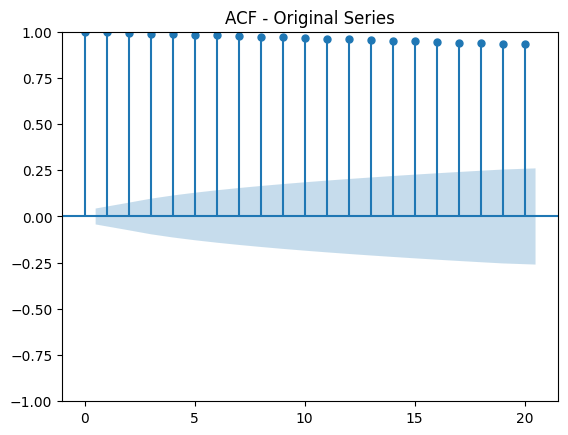

In [ ]:
# ACF and PACF plots for original series
plot_acf(train, lags=20)
plt.title('ACF - Original Series')

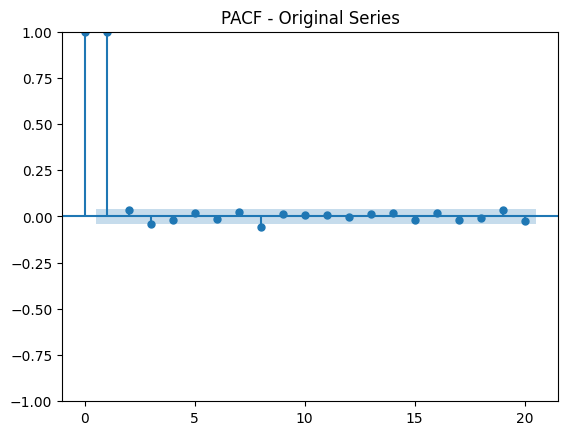

In [ ]:
plot_pacf(train, lags=20, method='ywm')
plt.title('PACF - Original Series')
plt.show()

Text(0.5, 1.0, 'ACF - Differenced Series')

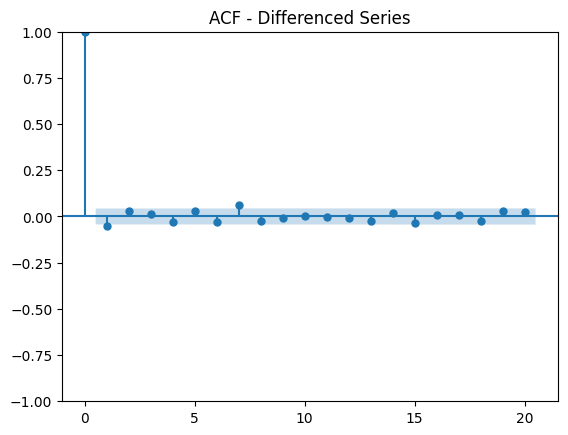

In [ ]:
plot_acf(train_stationary, lags=20)
plt.title('ACF - Differenced Series')

Text(0.5, 1.0, 'PACF - Differenced Series')

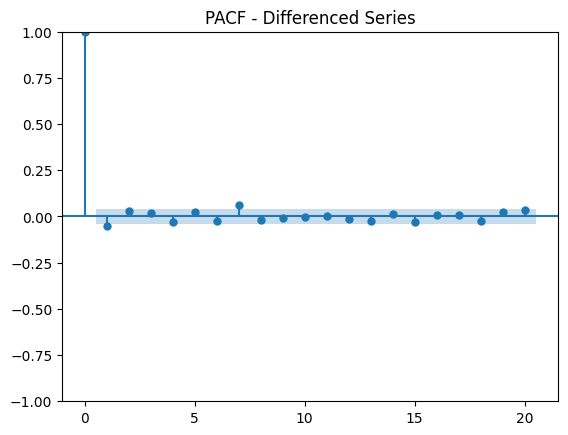

In [ ]:
plot_pacf(train_stationary, lags=20, method='ywm')
plt.title('PACF - Differenced Series')

### ARIMA Model for 80-20

In [ ]:
# Evaluate ARIMA model
def evaluate_arima_model(train, test, order):
    history = [x for x in train]
    predictions = list()

    # Walk-forward validation
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    # Performance metrics
    r2 = r2_score(test, predictions)
    mae = mean_absolute_error(test, predictions)
    mse = mean_squared_error(test, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

In [ ]:
# Try different ARIMA orders based on ACF/PACF analysis
orders_to_try = [
    (1,0,1),  # Standard starting point
    (2,1,2),  # More complex model
    (0,1,1),  # MA only
    (1,1,0),  # AR only
    (5,1,0),  # Higher AR
    (0,1,5),  # Higher MA
]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    try:
        print(f"\nEvaluating ARIMA{order}...")
        predictions, r2, mae, mse, rmse = evaluate_arima_model(train, test, order)
        print(f"R²: {r2:.4f}| MAE: {mae:.4f}| MSE: {mse:.4f}| RMSE: {rmse:.4f}")

        if r2 > best_r2:
            best_r2 = r2
            best_order = order
            best_predictions = predictions
    except:
        continue

print(f"\nBest model: ARIMA{best_order} with R²: {best_r2:.4f}")


Evaluating ARIMA(1, 0, 1)...
R²: 0.9883| MAE: 0.5013| MSE: 0.4994| RMSE: 0.7067

Evaluating ARIMA(2, 1, 2)...
R²: 0.9884| MAE: 0.4997| MSE: 0.4966| RMSE: 0.7047

Evaluating ARIMA(0, 1, 1)...
R²: 0.9883| MAE: 0.5009| MSE: 0.4989| RMSE: 0.7064

Evaluating ARIMA(1, 1, 0)...
R²: 0.9883| MAE: 0.5009| MSE: 0.4990| RMSE: 0.7064

Evaluating ARIMA(5, 1, 0)...
R²: 0.9883| MAE: 0.5031| MSE: 0.5006| RMSE: 0.7075

Evaluating ARIMA(0, 1, 5)...
R²: 0.9883| MAE: 0.5026| MSE: 0.5004| RMSE: 0.7074

Best model: ARIMA(2, 1, 2) with R²: 0.9884


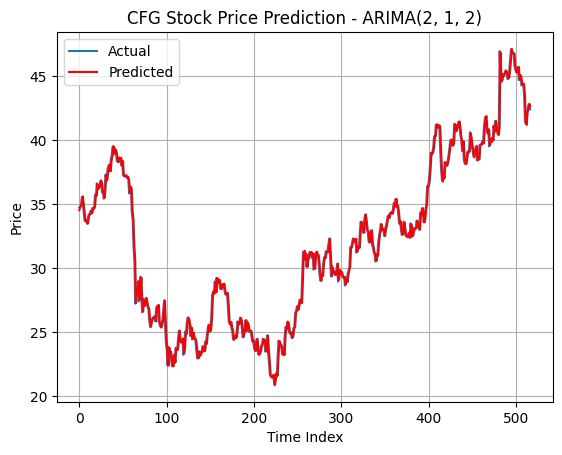

In [ ]:
# Plot best model results
plt.plot(test, label='Actual', )
plt.plot(best_predictions, color='red', label='Predicted')
plt.title(f'CFG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print metrics for best model
print("\n=== Best Model Performance ===")
print(f"ARIMA Order: {best_order}")
print(f"ARIMA - R² Score: {best_r2:.4f}")
print(f"ARIMA - MAE     : {mean_absolute_error(test, best_predictions):.4f}")
print(f"ARIMA - MSE     : {mean_squared_error(test, best_predictions):.4f}")
print(f"ARIMA - RMSE    : {np.sqrt(mean_squared_error(test, best_predictions)):.4f}")


=== Best Model Performance ===
ARIMA Order: (2, 1, 2)
ARIMA - R² Score: 0.9884
ARIMA - MAE     : 0.4997
ARIMA - MSE     : 0.4966
ARIMA - RMSE    : 0.7047


In [ ]:
def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(test)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {test[i]:.2f}, Predicted = {best_predictions[i]:.2f}")


First 10 Predictions vs Actual:
Day 1: Actual = 34.74, Predicted = 34.52
Day 2: Actual = 34.81, Predicted = 34.73
Day 3: Actual = 35.02, Predicted = 34.85
Day 4: Actual = 35.56, Predicted = 34.95
Day 5: Actual = 35.09, Predicted = 35.60
Day 6: Actual = 34.35, Predicted = 35.06
Day 7: Actual = 33.70, Predicted = 34.42
Day 8: Actual = 33.71, Predicted = 33.68
Day 9: Actual = 33.59, Predicted = 33.73
Day 10: Actual = 33.46, Predicted = 33.59


### LSTM Model for 80-20

In [ ]:
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train.reshape(-1, 1)) # Fit and transform only on train data
test_scaled = scaler.transform(test.reshape(-1, 1)) # Transform test data using the scaler fitted on train

# Create sequences
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

time_steps = 10
X_train, y_train = create_sequences(train_scaled, time_steps)
X_test, y_test = create_sequences(test_scaled, time_steps)

# Match original test length
actual_test = test[time_steps:]

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

=== LSTM Model Performance ===
LSTM - R² Score: 0.9876
LSTM - MAE     : 0.5285
LSTM - MSE     : 0.5392
LSTM - RMSE    : 0.7343


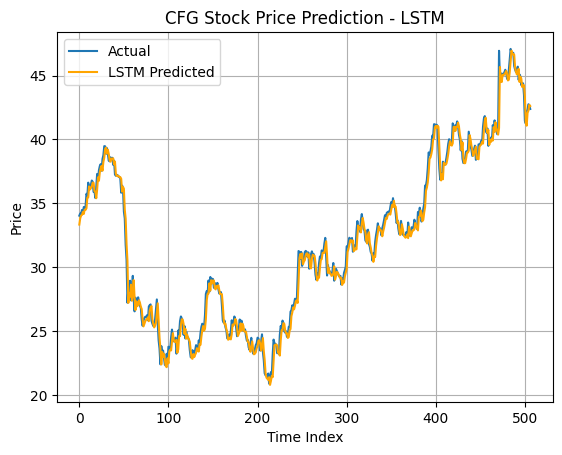


First 10 Predictions vs Actual (LSTM):
Day 1: Actual = 34.03, Predicted = 33.34
Day 2: Actual = 34.20, Predicted = 33.83
Day 3: Actual = 34.21, Predicted = 34.05
Day 4: Actual = 34.48, Predicted = 34.10
Day 5: Actual = 34.27, Predicted = 34.33
Day 6: Actual = 34.71, Predicted = 34.18
Day 7: Actual = 34.62, Predicted = 34.51
Day 8: Actual = 34.76, Predicted = 34.49
Day 9: Actual = 35.75, Predicted = 34.61
Day 10: Actual = 35.59, Predicted = 35.44


In [ ]:
# LSTM Model
lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
lstm_preds_scaled = lstm_model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)
lstm_preds = lstm_preds.flatten()

# Evaluation
r2_lstm = r2_score(actual_test, lstm_preds)
mae_lstm = mean_absolute_error(actual_test, lstm_preds)
mse_lstm = mean_squared_error(actual_test, lstm_preds)
rmse_lstm = np.sqrt(mse_lstm)

print("\n=== LSTM Model Performance ===")
print(f"LSTM - R² Score: {r2_lstm:.4f}")
print(f"LSTM - MAE     : {mae_lstm:.4f}")
print(f"LSTM - MSE     : {mse_lstm:.4f}")
print(f"LSTM - RMSE    : {rmse_lstm:.4f}")

# Cumulative return
def cumulative_return(prices):
    return (prices / prices[0]) - 1

cum_return_actual_lstm = cumulative_return(actual_test)
cum_return_pred_lstm = cumulative_return(lstm_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(lstm_preds, color='orange', label='LSTM Predicted')
plt.title('CFG Stock Price Prediction - LSTM')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (LSTM):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {lstm_preds[i]:.2f}")

### GRU Model for 80-20

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

=== GRU Model Performance ===
GRU - R² Score: 0.9870
GRU - MAE     : 0.5510
GRU - MSE     : 0.5629
GRU - RMSE    : 0.7503


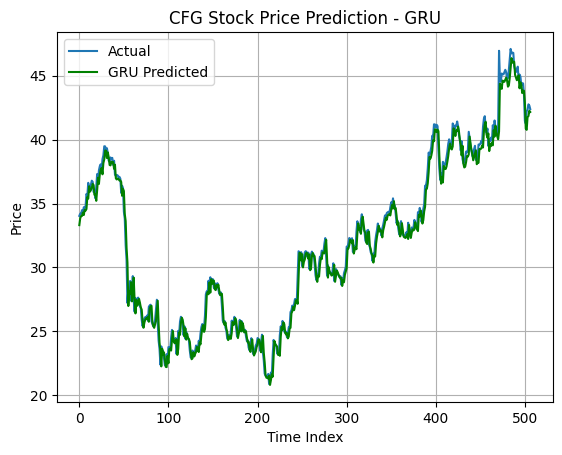


First 10 Predictions vs Actual (GRU):
Day 1: Actual = 34.03, Predicted = 33.31
Day 2: Actual = 34.20, Predicted = 33.85
Day 3: Actual = 34.21, Predicted = 34.02
Day 4: Actual = 34.48, Predicted = 34.03
Day 5: Actual = 34.27, Predicted = 34.29
Day 6: Actual = 34.71, Predicted = 34.10
Day 7: Actual = 34.62, Predicted = 34.51
Day 8: Actual = 34.76, Predicted = 34.44
Day 9: Actual = 35.75, Predicted = 34.57
Day 10: Actual = 35.59, Predicted = 35.51


In [ ]:
# GRU Model
gru_model = Sequential([
    GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=30, batch_size=16, verbose=0)

# Prediction
gru_preds_scaled = gru_model.predict(X_test)
gru_preds = scaler.inverse_transform(gru_preds_scaled)
gru_preds = gru_preds.flatten()

# Evaluation
r2_gru = r2_score(actual_test, gru_preds)
mae_gru = mean_absolute_error(actual_test, gru_preds)
mse_gru = mean_squared_error(actual_test, gru_preds)
rmse_gru = np.sqrt(mse_gru)

print("\n=== GRU Model Performance ===")
print(f"GRU - R² Score: {r2_gru:.4f}")
print(f"GRU - MAE     : {mae_gru:.4f}")
print(f"GRU - MSE     : {mse_gru:.4f}")
print(f"GRU - RMSE    : {rmse_gru:.4f}")

# Cumulative return
cum_return_actual_gru = cumulative_return(actual_test)
cum_return_pred_gru = cumulative_return(gru_preds)

# Plot
plt.plot(actual_test, label='Actual')
plt.plot(gru_preds, color='green', label='GRU Predicted')
plt.title('CFG Stock Price Prediction - GRU')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print first 10
print("\nFirst 10 Predictions vs Actual (GRU):")
for i in range(10):
    print(f"Day {i+1}: Actual = {actual_test[i]:.2f}, Predicted = {gru_preds[i]:.2f}")

In [ ]:
print("\n=== Model Comparison Summary ===")
print(f"ARIMA → R²: {best_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
print(f"LSTM  → R²: {r2_lstm:.4f}, MAE: {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}")
print(f"GRU   → R²: {r2_gru:.4f}, MAE: {mae_gru:.4f}, RMSE: {rmse_gru:.4f}")


=== Model Comparison Summary ===
ARIMA → R²: 0.9884, MAE: 0.5026, RMSE: 0.7074
LSTM  → R²: 0.9876, MAE: 0.5285, RMSE: 0.7343
GRU   → R²: 0.9870, MAE: 0.5510, RMSE: 0.7503


### Evaluation of 10 years Stock as Training and 3 months Stock as Testing

In [ ]:
cfg_stock = pd.read_csv('Stocks Data/CitizensFinancialGroup_stock.csv')
three_months_stock = pd.read_csv('Stocks Data/CFG3Months_Stock.csv')

print("10 years CFG Stock for Training:", cfg_stock.shape)
print("3 months CFG Stock for Testing :", three_months_stock.shape)

10 years CFG Stock for Training: (2583, 3)
3 months CFG Stock for Testing : (59, 3)


In [ ]:
three_months_stock

,Date,Adj Close,Stock Name
0,2025-01-02,42.369247,CFG_3Months
1,2025-01-03,43.302151,CFG_3Months
2,2025-01-06,43.535374,CFG_3Months
3,2025-01-07,43.438198,CFG_3Months
4,2025-01-08,43.515934,CFG_3Months
5,2025-01-10,42.077717,CFG_3Months
6,2025-01-13,42.913441,CFG_3Months
7,2025-01-14,44.409969,CFG_3Months
8,2025-01-15,45.751015,CFG_3Months
9,2025-01-16,45.478916,CFG_3Months


In [ ]:
# Date Conversion
cfg_stock['Date'] = pd.to_datetime(cfg_stock['Date'])
three_months_stock['Date'] = pd.to_datetime(three_months_stock['Date'])

# Sort data
cfg_stock.sort_values('Date', inplace=True)
three_months_stock.sort_values('Date', inplace=True)

# Extract series
train_cfg = cfg_stock['Adj Close'].values
three_months_test = three_months_stock['Adj Close'].values
three_months_dates = three_months_stock['Date'].values

In [ ]:
train_cfg

array([15.76838303, 15.74789047, 15.88452816, ..., 42.75795746,
       42.66077805, 42.38868332])

In [ ]:
three_months_test

array([42.36924744, 43.30215073, 43.53537369, 43.43819809, 43.51593399,
       42.07771683, 42.9134407 , 44.40996933, 45.75101471, 45.47891617,
       46.19802856, 46.94629288, 45.7024231 , 46.00366974, 46.12028503,
       46.2077446 , 46.0133934 , 46.27576828, 46.99488068, 46.63217545,
       45.45583344, 46.11262512, 46.71059799, 47.36738968, 46.9850769 ,
       46.42631531, 46.2400589 , 45.2499733 , 45.14213943, 45.43622589,
       45.87735748, 46.45572281, 45.26957703, 43.99520874, 43.49526215,
       43.53447342, 44.10303879, 44.27948761, 44.86766434, 44.1618576 ,
       42.73064041, 42.485569  , 41.53469086, 40.81908417, 39.02516556,
       39.12319183, 39.67214966, 38.9467392 , 39.89761734, 40.05445862,
       40.15248871, 40.54460526, 40.18190002, 40.37795258, 41.40725708,
       41.43666458, 41.16218567, 40.43677139, 39.45648956])

### ARIMA Model for 3 months Prediction

In [ ]:
# Use best order from earlier results
best_order = (2, 1, 2)

# Walk-forward forecast for next 3 months
history = list(train_cfg)
predictions = []

for t in range(len(three_months_test)):
    model = ARIMA(history, order=best_order)
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(three_months_test[t])  # Update with actual value (if simulating walk-forward)

# Evaluation
r2_arima = r2_score(three_months_test, predictions)
mae_arima = mean_absolute_error(three_months_test, predictions)
mse_arima = mean_squared_error(three_months_test, predictions)
rmse_arima = np.sqrt(mse_arima)

print("\nARIMA Evaluation:")
print(f"R²: {r2_arima:.4f} | MAE: {mae_arima:.4f} | MSE: {mse_arima:.4f} | RMSE: {rmse_arima:.4f}")


ARIMA Evaluation:
R²: 0.9159 | MAE: 0.5911 | MSE: 0.5414 | RMSE: 0.7358


In [ ]:
# Calculate cumulative returns
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(three_months_test)
predicted_returns = calculate_cumulative_returns(predictions)

# Results dataframe
results = pd.DataFrame({
    'Date': three_months_dates,
    'Actual Price': three_months_test,
    'Predicted Price': predictions,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

In [ ]:
# Display results
print("3 Months CFG Stock - Actual vs Predicted:")
results.head()

3 Months CFG Stock - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.333415,0.000000,0.000000
1,2025-01-03,43.302151,42.357282,2.201841,0.056379
2,2025-01-06,43.535374,43.311891,2.752294,2.311357
3,2025-01-07,43.438198,43.570804,2.522940,2.922961
4,2025-01-08,43.515934,43.449128,2.706412,2.635537


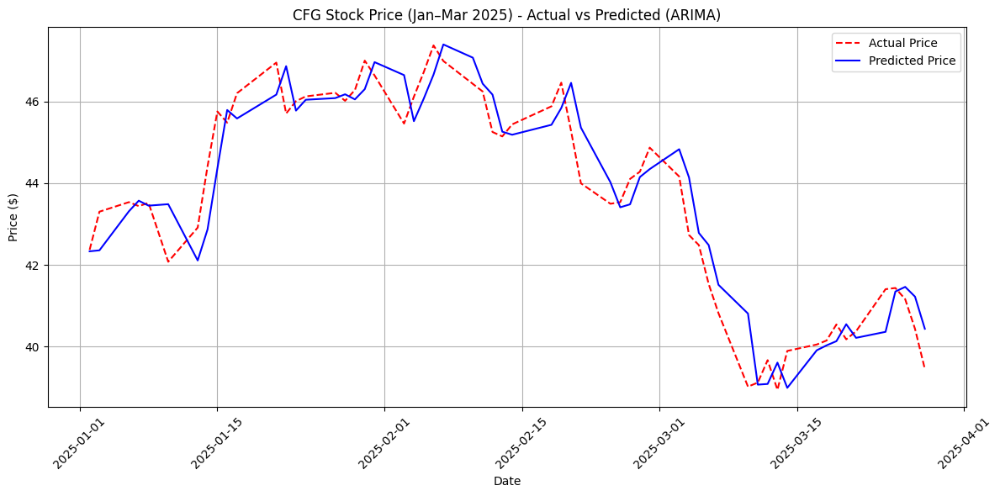

In [ ]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual Price'], 'r--', label='Actual Price')  # Dotted
plt.plot(results['Date'], results['Predicted Price'], 'b-', label='Predicted Price')
plt.title('CFG Stock Price (Jan–Mar 2025) - Actual vs Predicted (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LSTM Model for 3 months Prediction

In [ ]:
## Preparing data
full_series = cfg_stock['Adj Close'].values.reshape(-1, 1)
test_series = three_months_stock['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_stock['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.90304044],
        [-0.90469382],
        [-0.89366962],
        ...,
        [-0.894772  ],
        [-0.92729399],
        [-0.93390905]],

       [[-0.90469382],
        [-0.89366962],
        [-0.894772  ],
        ...,
        [-0.92729399],
        [-0.93390905],
        [-0.92123093]],

       [[-0.89366962],
        [-0.894772  ],
        [-0.88429849],
        ...,
        [-0.93390905],
        [-0.92123093],
        [-0.93611381]],

       ...,

       [[ 1.46270308],
        [ 1.44937386],
        [ 1.39527491],
        ...,
        [ 1.1530052 ],
        [ 1.23140932],
        [ 1.24081808]],

       [[ 1.44937386],
        [ 1.39527491],
        [ 1.4078193 ],
        ...,
        [ 1.23140932],
        [ 1.24081808],
        [ 1.27453201]],

       [[ 1.39527491],
        [ 1.4078193 ],
        [ 1.40625148],
        ...,
        [ 1.24081808],
        [ 1.27453201],
        [ 1.26669138]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


CFG LSTM Evaluation:
R²: 0.8979 | MAE: 0.6796 | MSE: 0.6571 | RMSE: 0.8106


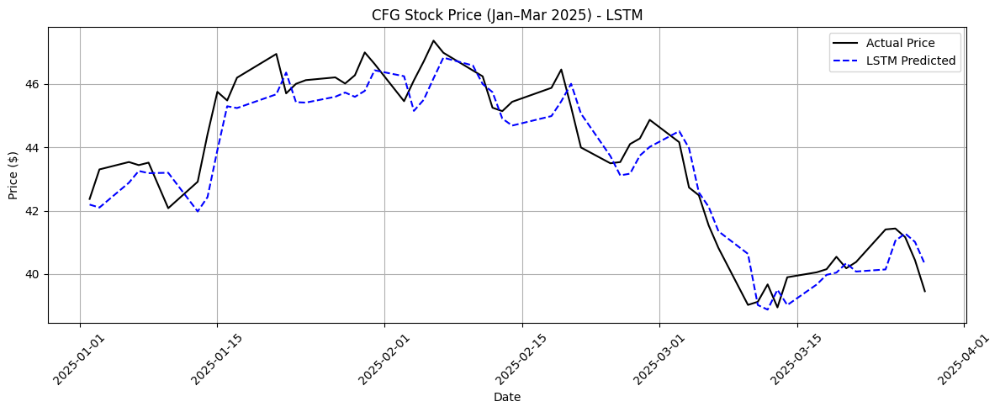


CFG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.191772,0.000000,0.000000
1,2025-01-03,43.302151,42.098671,2.201841,-0.220662
2,2025-01-06,43.535374,42.882809,2.752294,1.637840
3,2025-01-07,43.438198,43.253860,2.522940,2.517283
4,2025-01-08,43.515934,43.184189,2.706412,2.352154


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nCFG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('CFG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### GRU Model for 3 months Prediction


CFG GRU Evaluation:
R²: 0.9132 | MAE: 0.6113 | MSE: 0.5583 | RMSE: 0.7472


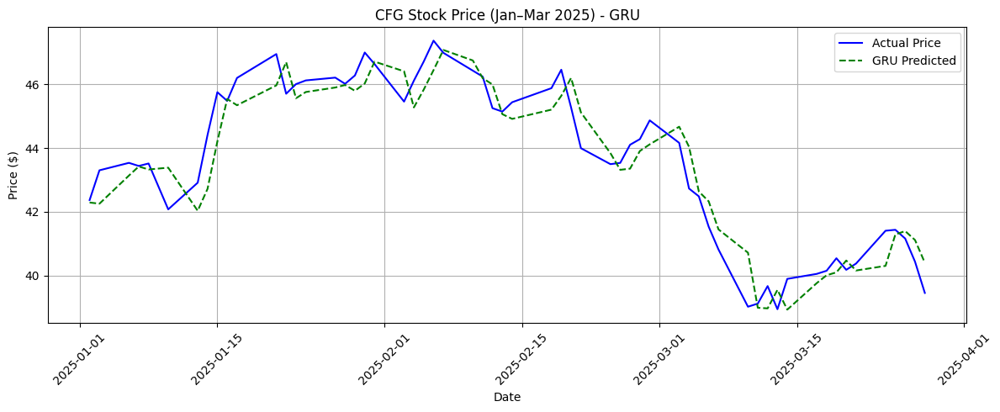


CFG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.292027,0.000000,0.000000
1,2025-01-03,43.302151,42.255497,2.201841,-0.086373
2,2025-01-06,43.535374,43.136536,2.752294,1.996851
3,2025-01-07,43.438198,43.422073,2.522940,2.672005
4,2025-01-08,43.515934,43.327911,2.706412,2.449358


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nCFG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('CFG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG GRU Model - Actual vs Predicted:")
gru_results.head()

## **12-Training with Apple and Testing with WMT, DG, JNJ, JPM & CFG**

In [ ]:
# Training
app_stock = pd.read_csv('Stocks Data/Apple_stock.csv')

# 10 year stock
wmt_stock = pd.read_csv('Stocks Data/Walmart_stock.csv')
dg_stock = pd.read_csv('Stocks Data/DG_stock.csv')
jnj_stock = pd.read_csv('Stocks Data/Johnson&Johnson_stock.csv')
jpm_stock = pd.read_csv('Stocks Data/JPMorgan_stock.csv')
cfg_stock = pd.read_csv('Stocks Data/CitizensFinancialGroup_stock.csv')

# Testing
three_months_wmt = pd.read_csv('Stocks Data/WMT3Months_Stock.csv')
three_months_dg = pd.read_csv('Stocks Data/DG3Months_Stock.csv')
three_months_jnj = pd.read_csv('Stocks Data/JNJ3Months_Stock.csv')
three_months_jpm = pd.read_csv('Stocks Data/JPM3Months_Stock.csv')
three_months_cfg = pd.read_csv('Stocks Data/CFG3Months_Stock.csv')

print("10 years Apple Stock for Training:", app_stock.shape)
print("3 months WMT Stock for Testing :", three_months_wmt.shape)
print("3 months DG Stock for Testing :", three_months_dg.shape)
print("3 months JNJ Stock for Testing :", three_months_jnj.shape)
print("3 months JPM Stock for Testing :", three_months_jpm.shape)
print("3 months CFG Stock for Testing :", three_months_cfg.shape)

10 years Apple Stock for Training: (3018, 3)
3 months WMT Stock for Testing : (59, 3)
3 months DG Stock for Testing : (59, 3)
3 months JNJ Stock for Testing : (59, 3)
3 months JPM Stock for Testing : (59, 3)
3 months CFG Stock for Testing : (59, 3)


In [ ]:
wmt_stock

,Date,Adj Close,Stock Name
0,2013-01-02,17.898834,WMT
1,2013-01-03,17.785095,WMT
2,2013-01-04,17.852306,WMT
3,2013-01-07,17.681686,WMT
4,2013-01-08,17.730803,WMT
...,...,...,...
3013,2024-12-20,91.765518,WMT
3014,2024-12-23,89.885246,WMT
3015,2024-12-24,92.203255,WMT
3016,2024-12-26,92.312698,WMT


In [ ]:
# Date Conversion
app_stock['Date'] = pd.to_datetime(app_stock['Date'])
three_months_wmt['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_dg['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jnj['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jpm['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_cfg['Date'] = pd.to_datetime(three_months_wmt['Date'])

# Sort data
app_stock.sort_values('Date', inplace=True)
three_months_wmt.sort_values('Date', inplace=True)
three_months_dg.sort_values('Date', inplace=True)
three_months_jnj.sort_values('Date', inplace=True)
three_months_jpm.sort_values('Date', inplace=True)
three_months_cfg.sort_values('Date', inplace=True)

# Extract series
train_app = app_stock['Adj Close'].values

three_months_test_wmt = three_months_wmt['Adj Close'].values
three_months_test_dg = three_months_dg['Adj Close'].values
three_months_test_jnj = three_months_jnj['Adj Close'].values
three_months_test_jpm = three_months_jpm['Adj Close'].values
three_months_test_cfg = three_months_cfg['Adj Close'].values

three_months_dates_wmt = three_months_wmt['Date'].values
three_months_dates_dg = three_months_dg['Date'].values
three_months_dates_jnj = three_months_jnj['Date'].values
three_months_dates_jpm = three_months_jpm['Date'].values
three_months_dates_cfg = three_months_cfg['Date'].values

In [ ]:
train_app

array([ 16.62831306,  16.41843414,  15.96109581, ..., 257.28668213,
       258.10372925, 254.68586731])

In [ ]:
three_months_test_wmt

array([ 89.53704071,  90.31303406,  90.95968628,  90.34287262,
        91.32778931,  92.52161407,  91.05917358,  90.32298279,
        90.87014771,  90.83036041,  91.4670639 ,  92.60120392,
        92.75043488,  93.32744598,  94.27256775,  96.89897919,
        96.78955078,  96.99845886,  98.14255524,  97.65507507,
        99.02796936, 100.25164795, 101.93294525, 102.32094574,
       100.62968445, 102.39058685, 101.94290161, 103.07704163,
       104.5096283 , 103.50482941, 103.24616241, 103.46502686,
        96.70995331,  94.29244995,  93.18816376,  97.18748474,
        95.70514679,  96.29212189,  98.10275269,  97.08799744,
        94.48147583,  95.48628998,  94.15317535,  91.24819946,
        87.36826324,  86.99021912,  84.76173401,  84.06533813,
        84.91095734,  87.01010895,  85.14972687,  85.88592529,
        85.36859894,  85.77262115,  87.27897644,  84.55556488,
        85.00447845,  85.42346191,  84.94462585])

In [ ]:
three_months_test_dg

array([74.18231964, 73.24068451, 74.39810181, 73.32058716, 70.79979706,
       70.54277039, 70.77013397, 68.58544159, 67.78472137, 68.46681976,
       67.65621185, 71.11612701, 69.91010284, 70.51311493, 70.95796204,
       72.46055603, 71.87730408, 71.21498108, 71.32372284, 70.24620819,
       70.65151215, 70.9777298 , 71.98604584, 71.77845764, 71.65982819,
       73.29093933, 73.28104401, 72.96470642, 72.0058136 , 71.72902679,
       74.17073822, 74.76387024, 75.25814056, 75.81172943, 78.12493134,
       77.68008423, 73.34036255, 73.13276672, 73.33047485, 71.0667038 ,
       72.08490753, 72.85596466, 75.36688232, 80.90274811, 81.85176086,
       77.73939514, 73.99279785, 79.03439331, 78.11504364, 78.93553925,
       80.47767639, 81.387146  , 80.73469543, 82.70191193, 82.2076416 ,
       81.63427734, 83.72999573, 86.53746796, 85.11396027])

In [ ]:
three_months_test_jnj

array([141.66188049, 141.82910156, 141.30776978, 143.8356781 ,
       139.9405365 , 139.73396301, 142.10450745, 142.37991333,
       142.59632874, 145.35047913, 144.62258911, 145.72424316,
       142.89141846, 144.23898315, 144.41603088, 150.38664246,
       147.91773987, 148.67512512, 150.36697388, 149.65875244,
       149.3833313 , 150.9768219 , 152.15716553, 150.99647522,
       150.61286926, 151.71455383, 153.57359314, 152.71783447,
       154.67524719, 153.59326172, 153.6725769 , 156.54792786,
       158.32270813, 160.92044067, 162.34820557, 164.67822266,
       161.69381714, 162.33828735, 163.61732483, 165.85810852,
       164.01391602, 163.71646118, 164.42044067, 165.27313232,
       166.27453613, 164.45018005, 161.46577454, 161.60458374,
       161.42610168, 161.45585632, 162.85386658, 161.60458374,
       161.63432312, 162.23913574, 161.90202332, 159.65132141,
       160.34536743, 161.74339294, 162.31846619])

In [ ]:
three_months_test_jpm

array([236.16740417, 239.39501953, 238.2278595 , 240.52259827,
       240.48304749, 237.25852966, 241.55130005, 244.77578735,
       249.60267639, 251.50177002, 256.33853149, 260.16638184,
       259.97845459, 263.05459595, 261.95669556, 262.95568848,
       264.23165894, 263.67773438, 265.30978394, 264.38989258,
       263.90524292, 265.02294922, 267.48580933, 273.88537598,
       272.79736328, 268.08920288, 271.9961853 , 272.45120239,
       273.31170654, 273.57876587, 276.90219116, 276.20980835,
       263.89535522, 261.36322021, 258.49481201, 254.59768677,
       255.97254944, 256.22970581, 261.76876831, 257.78262329,
       247.52552795, 248.79159546, 243.85591125, 239.64228821,
       229.69181824, 226.64535522, 225.4188385 , 222.73835754,
       229.90942383, 231.38319397, 232.41188049, 236.50680542,
       236.40789795, 238.99937439, 245.359375  , 248.39595032,
       248.29704285, 245.41871643, 240.20610046])

In [ ]:
three_months_test_cfg

array([42.36924744, 43.30215073, 43.53537369, 43.43819809, 43.51593399,
       42.07771683, 42.9134407 , 44.40996933, 45.75101471, 45.47891617,
       46.19802856, 46.94629288, 45.7024231 , 46.00366974, 46.12028503,
       46.2077446 , 46.0133934 , 46.27576828, 46.99488068, 46.63217545,
       45.45583344, 46.11262512, 46.71059799, 47.36738968, 46.9850769 ,
       46.42631531, 46.2400589 , 45.2499733 , 45.14213943, 45.43622589,
       45.87735748, 46.45572281, 45.26957703, 43.99520874, 43.49526215,
       43.53447342, 44.10303879, 44.27948761, 44.86766434, 44.1618576 ,
       42.73064041, 42.485569  , 41.53469086, 40.81908417, 39.02516556,
       39.12319183, 39.67214966, 38.9467392 , 39.89761734, 40.05445862,
       40.15248871, 40.54460526, 40.18190002, 40.37795258, 41.40725708,
       41.43666458, 41.16218567, 40.43677139, 39.45648956])

### WMT Stock Prediction

#### WMT - ARIMA

In [ ]:
## Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        ## Performing Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

## Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train_app)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: 1.4057
p-value: 0.9971
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -17.2862
p-value: 0.0000
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

## Preparing input sequence
full_series_wmt = wmt_stock['Adj Close'].values

## Using last 10 days of WMT stock before prediction start
time_steps = 10
initial_window = full_series_wmt[-(time_steps + len(three_months_test_wmt)) : -len(three_months_test_wmt)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse



WMT Evaluating ARIMA(1, 0, 1)...
R²: 0.8033 | MAE: 1.7780 | MSE: 7.0576 | RMSE: 2.6566

WMT Evaluating ARIMA(0, 1, 1)...
R²: 0.8525 | MAE: 1.5353 | MSE: 5.2910 | RMSE: 2.3002

WMT Evaluating ARIMA(1, 1, 0)...
R²: 0.8749 | MAE: 1.4302 | MSE: 4.4877 | RMSE: 2.1184

WMT Best model: ARIMA(1, 1, 0) with R²: 0.8749

First 10 Predictions vs Actual:
Day 1: Actual = 89.54, Predicted = 79.84
Day 2: Actual = 90.31, Predicted = 89.37
Day 3: Actual = 90.96, Predicted = 90.37
Day 4: Actual = 90.34, Predicted = 91.01
Day 5: Actual = 91.33, Predicted = 90.30
Day 6: Actual = 92.52, Predicted = 91.39
Day 7: Actual = 91.06, Predicted = 92.61
Day 8: Actual = 90.32, Predicted = 90.98
Day 9: Actual = 90.87, Predicted = 90.27
Day 10: Actual = 90.83, Predicted = 90.90


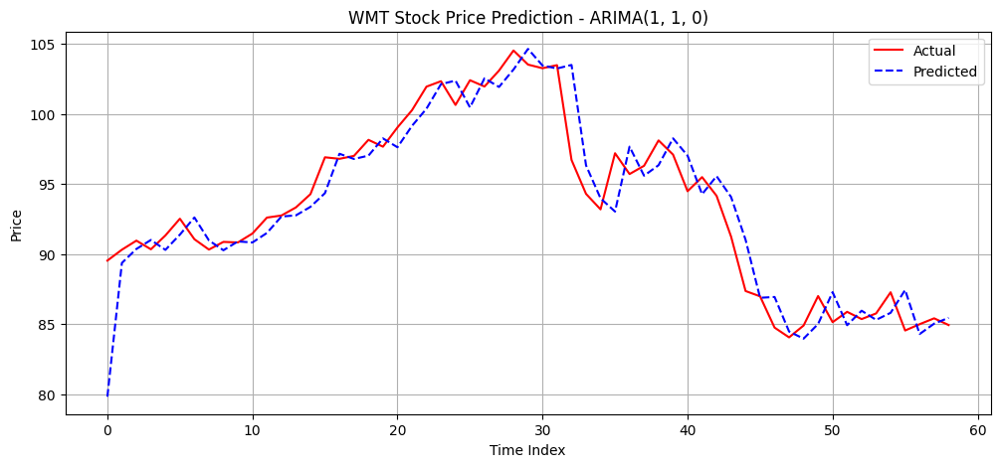

In [ ]:
orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nWMT Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_wmt, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nWMT Best model: ARIMA{best_order} with R²: {best_r2:.4f}")

def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_wmt)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_wmt[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_wmt, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'WMT Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### WMT - LSTM

In [ ]:
## Preparing data
full_series = wmt_stock['Adj Close'].values.reshape(-1, 1)
test_series_wmt = three_months_wmt['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_wmt['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.48210107],
        [-0.48678674],
        [-0.48401787],
        ...,
        [-0.48859722],
        [-0.49211155],
        [-0.48486995]],

       [[-0.48678674],
        [-0.48401787],
        [-0.49104684],
        ...,
        [-0.49211155],
        [-0.48486995],
        [-0.48242072]],

       [[-0.48401787],
        [-0.49104684],
        [-0.48902342],
        ...,
        [-0.48486995],
        [-0.48242072],
        [-0.48625439]],

       ...,

       [[ 2.64706809],
        [ 2.66383472],
        [ 2.62825659],
        ...,
        [ 2.60850217],
        [ 2.56095968],
        [ 2.48349875]],

       [[ 2.66383472],
        [ 2.62825659],
        [ 2.64333917],
        ...,
        [ 2.56095968],
        [ 2.48349875],
        [ 2.57899296]],

       [[ 2.62825659],
        [ 2.64333917],
        [ 2.66874983],
        ...,
        [ 2.48349875],
        [ 2.57899296],
        [ 2.58350167]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


WMT LSTM Evaluation:
R²: 0.8543 | MAE: 1.6609 | MSE: 5.2269 | RMSE: 2.2863


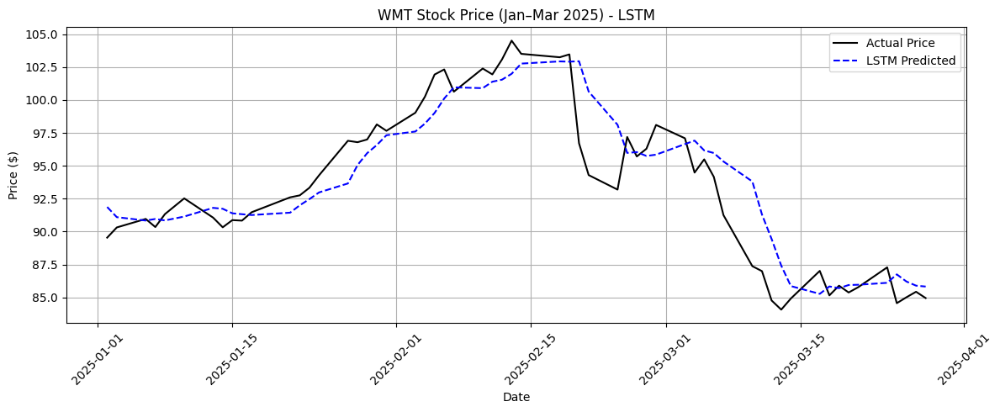


WMT LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.866707,0.000000,0.000000
1,2025-01-03,90.313034,91.093185,0.866673,-0.842005
2,2025-01-06,90.959686,90.837433,1.588891,-1.120400
3,2025-01-07,90.342873,90.954895,0.899998,-0.992537
4,2025-01-08,91.327789,90.845932,2.000009,-1.111150


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_wmt, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_wmt, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_wmt, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nWMT LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT LSTM Model - Actual vs Predicted:")
lstm_results.head()

In [ ]:
for i in range(len(test_dates)):
    date = test_dates[i]
    actual_price = test_series_wmt.flatten()[i]
    predicted_price = lstm_predicted_prices[i]
    sequence_unscaled = scaler.inverse_transform(input_sequences[i].reshape(-1, 1)).flatten()

    print(f"\nDate: {date}")
    print(f"Sequence (Walmart - Last 10 Days Before Prediction): {sequence_unscaled}")
    print(f"Input (Last Timestep Value): {sequence_unscaled[-1]:.2f}")
    print(f"Actual Price (Walmart): {actual_price:.2f}")
    print(f"Predicted Price: {predicted_price:.2f}")


Date: 2025-01-02T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.7651825  94.38199615 94.92916107 93.06878662 92.91955566 91.76551819
 89.88524628 92.2032547  92.31269836 91.18850708]
Input (Last Timestep Value): 91.19
Actual Price (Walmart): 89.54
Predicted Price: 91.87

Date: 2025-01-03T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.38199615 94.92916107 93.06878662 92.91955566 91.76551819 89.88524628
 92.2032547  92.31269836 91.18850708 89.53704071]
Input (Last Timestep Value): 89.54
Actual Price (Walmart): 90.31
Predicted Price: 91.09

Date: 2025-01-06T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.92916107 93.06878662 92.91955566 91.76551819 89.88524628 92.2032547
 92.31269836 91.18850708 89.53704071 90.31303406]
Input (Last Timestep Value): 90.31
Actual Price (Walmart): 90.96
Predicted Price: 90.84

Date: 2025-01-07T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.0687

### WMT - GRU


WMT GRU Evaluation:
R²: 0.9035 | MAE: 1.4933 | MSE: 3.4620 | RMSE: 1.8606


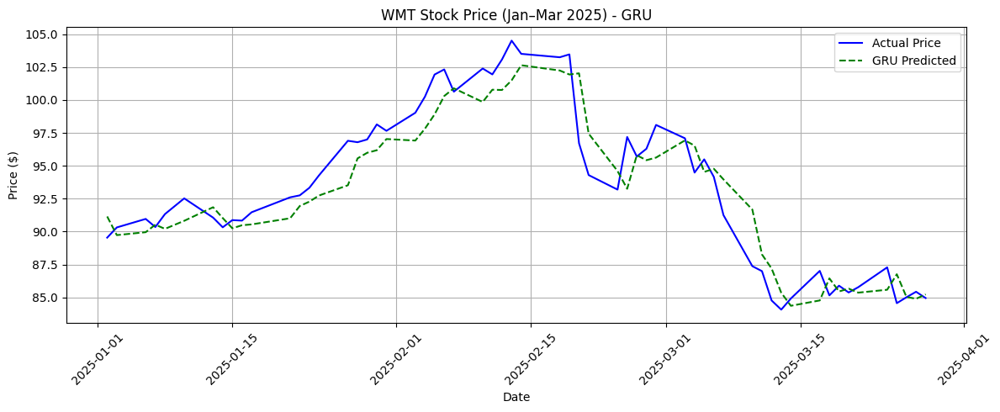


WMT GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.144836,0.000000,0.000000
1,2025-01-03,90.313034,89.729095,0.866673,-1.553285
2,2025-01-06,90.959686,89.951576,1.588891,-1.309192
3,2025-01-07,90.342873,90.522598,0.899998,-0.682694
4,2025-01-08,91.327789,90.204178,2.000009,-1.032048


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_wmt, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_wmt, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_wmt, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nWMT GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT GRU Model - Actual vs Predicted:")
gru_results.head()


## DG Stock Prediction

### DG - ARIMA


DG Evaluating ARIMA(1, 0, 1)...
R²: 0.7739 | MAE: 1.4985 | MSE: 4.7552 | RMSE: 2.1806

DG Evaluating ARIMA(0, 1, 1)...
R²: 0.8126 | MAE: 1.4177 | MSE: 3.9413 | RMSE: 1.9853

DG Evaluating ARIMA(1, 1, 0)...
R²: 0.8116 | MAE: 1.4185 | MSE: 3.9634 | RMSE: 1.9908

DG Best model: ARIMA(0, 1, 1) with R²: 0.8126

First 10 Predictions vs Actual:
Day 1: Actual = 74.18, Predicted = 79.79
Day 2: Actual = 73.24, Predicted = 74.39
Day 3: Actual = 74.40, Predicted = 73.21
Day 4: Actual = 73.32, Predicted = 74.44
Day 5: Actual = 70.80, Predicted = 73.30
Day 6: Actual = 70.54, Predicted = 70.66
Day 7: Actual = 70.77, Predicted = 70.54
Day 8: Actual = 68.59, Predicted = 70.78
Day 9: Actual = 67.78, Predicted = 68.47
Day 10: Actual = 68.47, Predicted = 67.74


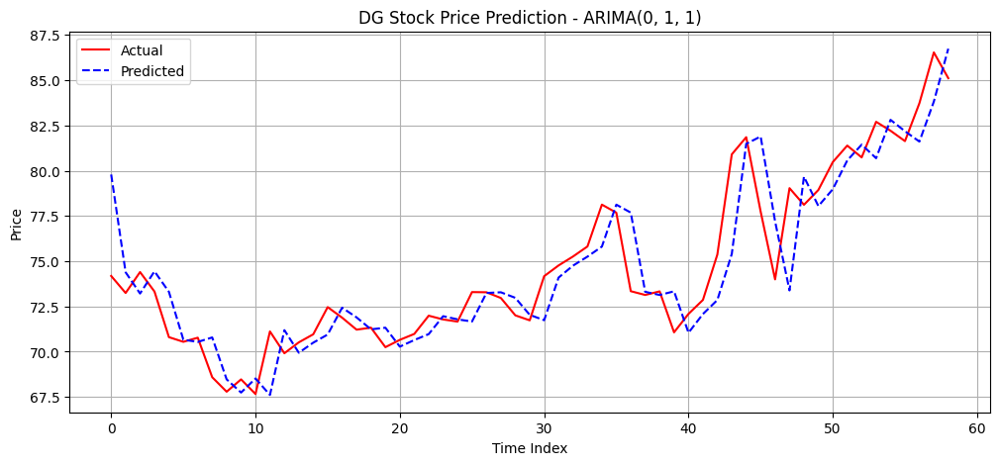

In [ ]:
## Preparing input sequence
full_series_dg = dg_stock['Adj Close'].values

## Using last 10 days of DG stock before prediction start
time_steps = 10
initial_window = full_series_dg[-(time_steps + len(three_months_test_dg)) : -len(three_months_test_dg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nDG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_dg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nDG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_dg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_dg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_dg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'DG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### DG - LSTM


DG LSTM Evaluation:
R²: 0.7871 | MAE: 1.5247 | MSE: 4.4780 | RMSE: 2.1161


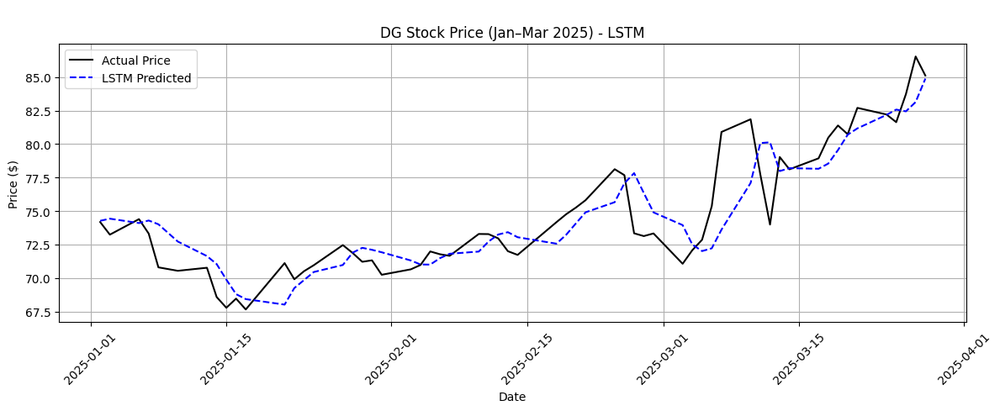


DG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.272949,0.000000,0.000000
1,2025-01-03,73.240685,74.432114,-1.269353,0.214303
2,2025-01-06,74.398102,74.105865,0.290881,-0.224960
3,2025-01-07,73.320587,74.296349,-1.161641,0.031507
4,2025-01-08,70.799797,74.014076,-4.559742,-0.348544


In [ ]:
## Preparing data
full_series = dg_stock['Adj Close'].values.reshape(-1, 1)
test_series_dg = three_months_dg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_dg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_dg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_dg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_dg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nDG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### DG Stock - GRU


DG GRU Evaluation:
R²: 0.7603 | MAE: 1.7500 | MSE: 5.0425 | RMSE: 2.2455


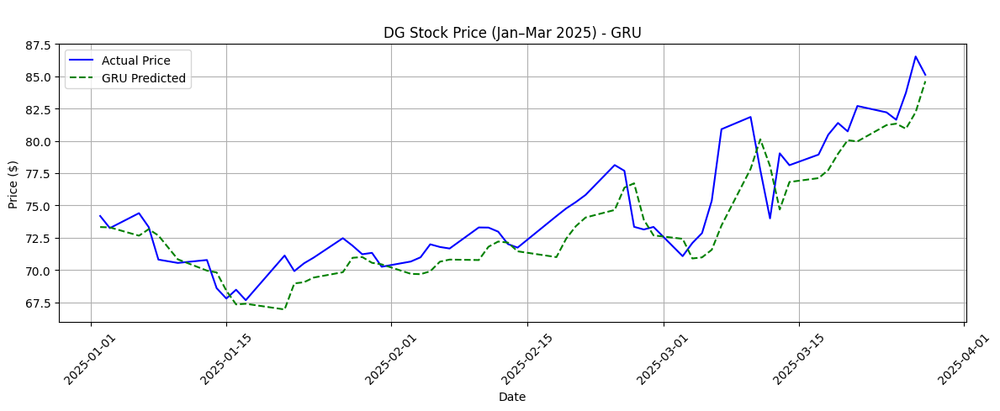


DG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,73.321777,0.000000,0.000000
1,2025-01-03,73.240685,73.295128,-1.269353,-0.036347
2,2025-01-06,74.398102,72.652512,0.290881,-0.912780
3,2025-01-07,73.320587,73.156189,-1.161641,-0.225836
4,2025-01-08,70.799797,72.666374,-4.559742,-0.893873


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_dg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_dg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_dg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nDG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG GRU Model - Actual vs Predicted:")
gru_results.head()

## JNJ Stock Predictions

### JNJ - ARIMA


JNJ Evaluating ARIMA(1, 0, 1)...
R²: 0.8482 | MAE: 1.9532 | MSE: 10.6481 | RMSE: 3.2631

JNJ Evaluating ARIMA(0, 1, 1)...
R²: 0.9005 | MAE: 1.6288 | MSE: 6.9764 | RMSE: 2.6413

JNJ Evaluating ARIMA(1, 1, 0)...
R²: 0.8967 | MAE: 1.6644 | MSE: 7.2477 | RMSE: 2.6922

JNJ Best model: ARIMA(0, 1, 1) with R²: 0.9005

First 10 Predictions vs Actual:
Day 1: Actual = 141.66, Predicted = 156.60
Day 2: Actual = 141.83, Predicted = 139.08
Day 3: Actual = 141.31, Predicted = 141.84
Day 4: Actual = 143.84, Predicted = 141.29
Day 5: Actual = 139.94, Predicted = 143.89
Day 6: Actual = 139.73, Predicted = 139.99
Day 7: Actual = 142.10, Predicted = 139.74
Day 8: Actual = 142.38, Predicted = 142.08
Day 9: Actual = 142.60, Predicted = 142.38
Day 10: Actual = 145.35, Predicted = 142.59


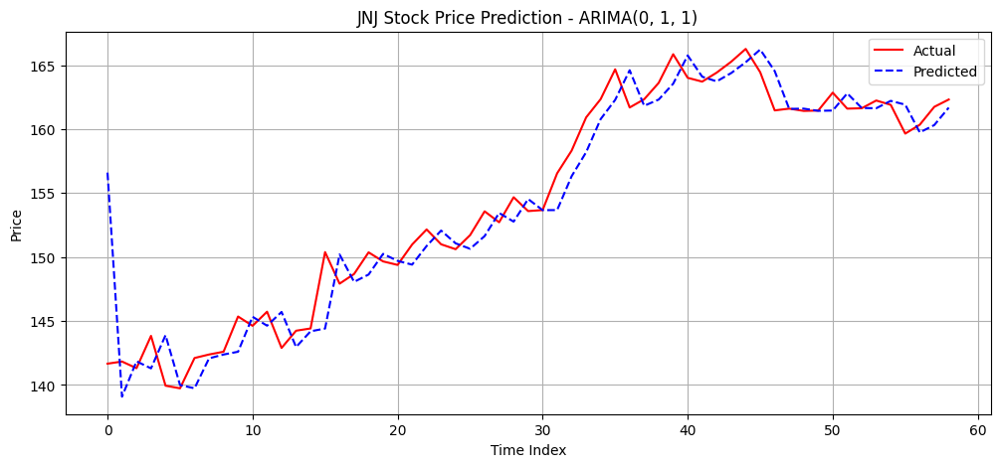

In [ ]:
## Preparing input sequence
full_series_jnj = jnj_stock['Adj Close'].values

## Using last 10 days of JNJ stock before prediction start
time_steps = 10
initial_window = full_series_jnj[-(time_steps + len(three_months_test_jnj)) : -len(three_months_test_jnj)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJNJ Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jnj, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJNJ Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jnj)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jnj[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jnj, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JNJ Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JNJ - LSTM


JNJ LSTM Evaluation:
R²: 0.9438 | MAE: 1.5228 | MSE: 3.9426 | RMSE: 1.9856


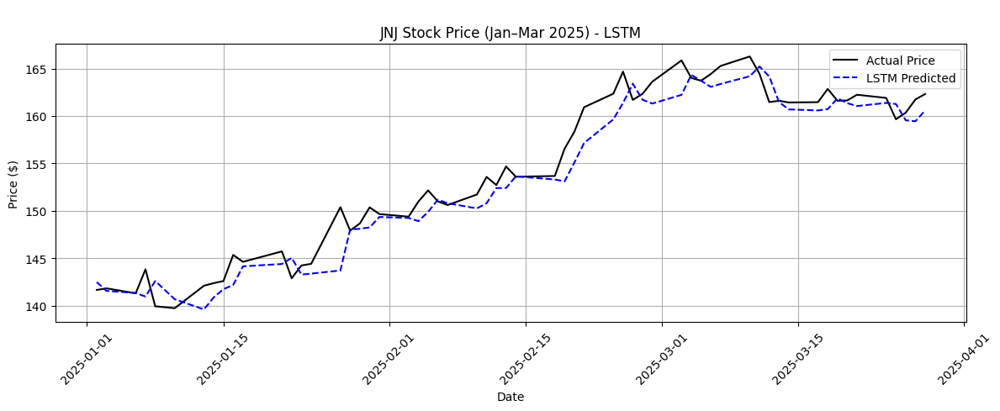


JNJ LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,142.481125,0.000000,0.000000
1,2025-01-03,141.829102,141.564743,0.118042,-0.643158
2,2025-01-06,141.307770,141.334290,-0.249969,-0.804901
3,2025-01-07,143.835678,140.966507,1.534497,-1.063031
4,2025-01-08,139.940536,142.600540,-1.215107,0.083816


In [ ]:
## Preparing data
full_series = jnj_stock['Adj Close'].values.reshape(-1, 1)
test_series_jnj = three_months_jnj['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jnj['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jnj, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jnj, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jnj, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJNJ LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JNJ - GRU


JNJ GRU Evaluation:
R²: 0.9082 | MAE: 2.1439 | MSE: 6.4356 | RMSE: 2.5368


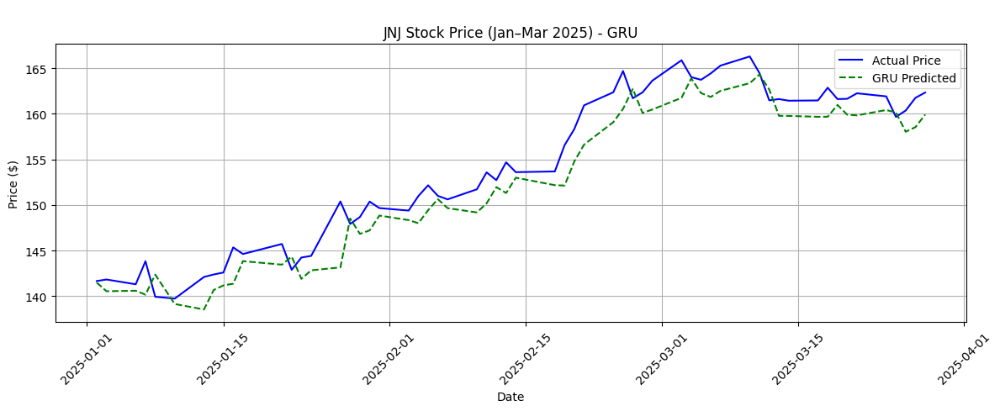


JNJ GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,141.493484,0.000000,0.000000
1,2025-01-03,141.829102,140.542221,0.118042,-0.672305
2,2025-01-06,141.307770,140.599823,-0.249969,-0.631595
3,2025-01-07,143.835678,140.166977,1.534497,-0.937504
4,2025-01-08,139.940536,142.367905,-1.215107,0.617993


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jnj, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jnj, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jnj, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJNJ GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ GRU Model - Actual vs Predicted:")
gru_results.head()

## JPM Stock Predictions

### JPM - ARIMA


JPM Evaluating ARIMA(1, 0, 1)...
R²: 0.4522 | MAE: 5.3104 | MSE: 117.0941 | RMSE: 10.8210

JPM Evaluating ARIMA(0, 1, 1)...
R²: 0.7539 | MAE: 3.9670 | MSE: 52.5983 | RMSE: 7.2525

JPM Evaluating ARIMA(1, 1, 0)...
R²: 0.8065 | MAE: 3.7403 | MSE: 41.3655 | RMSE: 6.4316

JPM Best model: ARIMA(1, 1, 0) with R²: 0.8065

First 10 Predictions vs Actual:
Day 1: Actual = 236.17, Predicted = 200.97
Day 2: Actual = 239.40, Predicted = 220.83
Day 3: Actual = 238.23, Predicted = 239.49
Day 4: Actual = 240.52, Predicted = 238.20
Day 5: Actual = 240.48, Predicted = 240.58
Day 6: Actual = 237.26, Predicted = 240.48
Day 7: Actual = 241.55, Predicted = 237.18
Day 8: Actual = 244.78, Predicted = 241.61
Day 9: Actual = 249.60, Predicted = 244.85
Day 10: Actual = 251.50, Predicted = 249.77


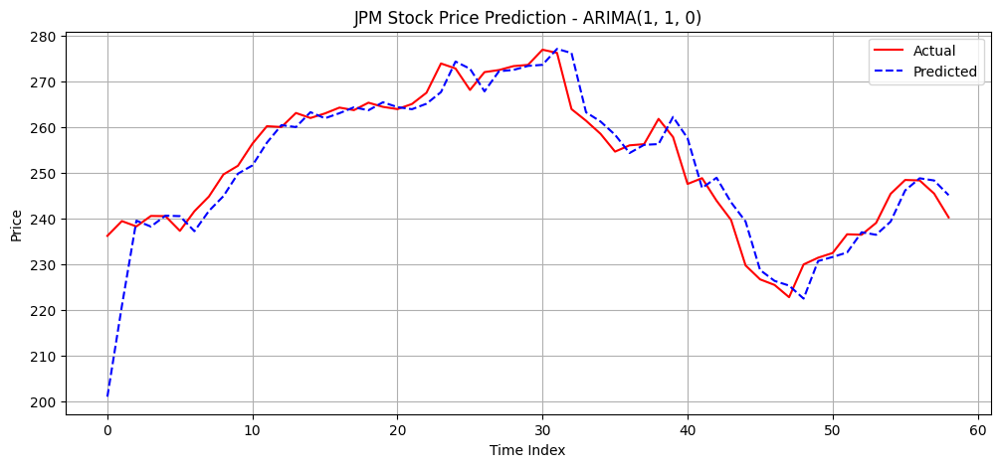

In [ ]:
## Preparing input sequence
full_series_jpm = jpm_stock['Adj Close'].values

## Using last 10 days of JPM stock before prediction start
time_steps = 10
initial_window = full_series_jpm[-(time_steps + len(three_months_test_jpm)) : -len(three_months_test_jpm)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJPM Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jpm, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJPM Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jpm)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jpm[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jpm, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JPM Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JPM - LSTM


JPM LSTM Evaluation:
R²: 0.8823 | MAE: 3.9916 | MSE: 25.1503 | RMSE: 5.0150


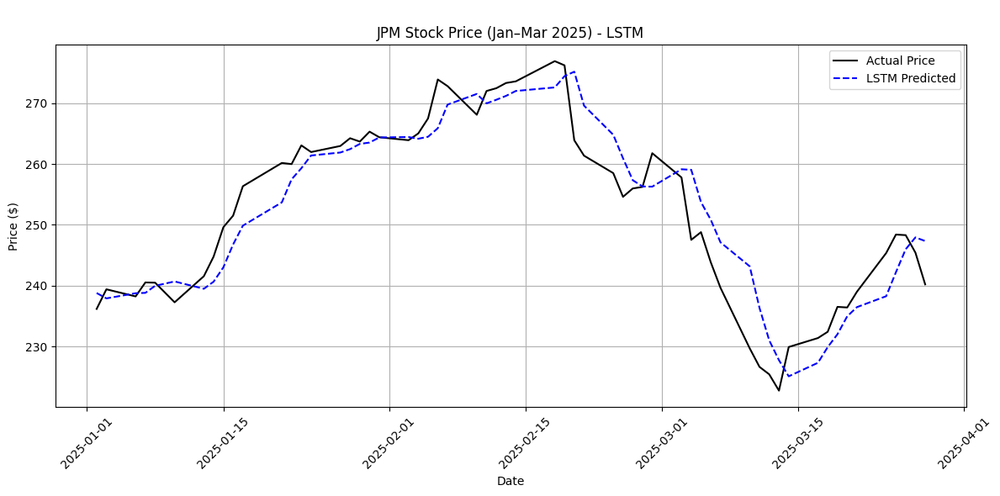


JPM LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,238.785751,0.000000,0.000000
1,2025-01-03,239.395020,237.902618,1.366664,-0.369841
2,2025-01-06,238.227859,238.748672,0.872455,-0.015527
3,2025-01-07,240.522598,238.811096,1.844113,0.010610
4,2025-01-08,240.483047,239.969498,1.827366,0.495732


In [ ]:
## Preparing data
full_series = jpm_stock['Adj Close'].values.reshape(-1, 1)
test_series_jpm = three_months_jpm['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jpm['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jpm, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jpm, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jpm, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJPM LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 6))
plt.plot(test_dates, test_series_jpm.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JPM - GRU


JPM GRU Evaluation:
R²: 0.8893 | MAE: 3.4726 | MSE: 23.6628 | RMSE: 4.8644


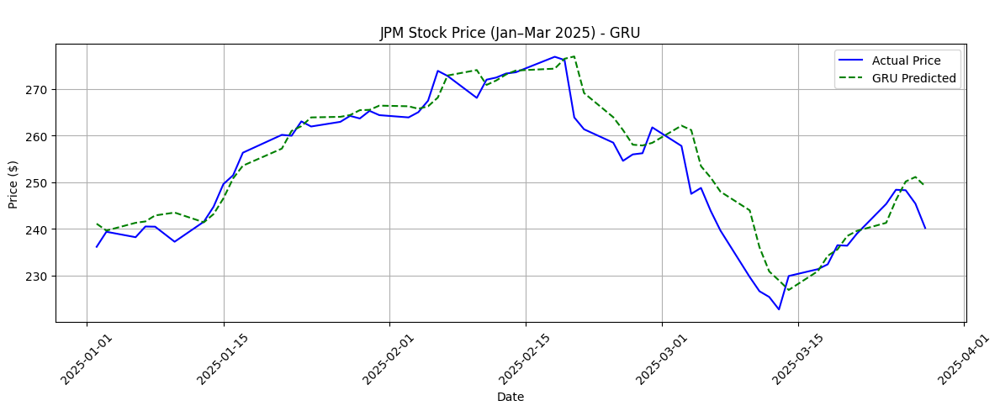


JPM GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,241.116470,0.000000,0.000000
1,2025-01-03,239.395020,239.646988,1.366664,-0.609452
2,2025-01-06,238.227859,241.316620,0.872455,0.083005
3,2025-01-07,240.522598,241.604141,1.844113,0.202250
4,2025-01-08,240.483047,242.893799,1.827366,0.737119


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jpm, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jpm, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jpm, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJPM GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jpm.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM GRU Model - Actual vs Predicted:")
gru_results.head()

## CFG Stock Predictions

### CFG - ARIMA


CFG Evaluating ARIMA(1, 0, 1)...
R²: 0.7742 | MAE: 0.7977 | MSE: 1.4529 | RMSE: 1.2054

CFG Evaluating ARIMA(0, 1, 1)...
R²: 0.8783 | MAE: 0.6540 | MSE: 0.7834 | RMSE: 0.8851

CFG Evaluating ARIMA(1, 1, 0)...
R²: 0.8776 | MAE: 0.6569 | MSE: 0.7877 | RMSE: 0.8875

CFG Best model: ARIMA(0, 1, 1) with R²: 0.8783

First 10 Predictions vs Actual:
Day 1: Actual = 42.37, Predicted = 38.51
Day 2: Actual = 43.30, Predicted = 42.16
Day 3: Actual = 43.54, Predicted = 43.35
Day 4: Actual = 43.44, Predicted = 43.56
Day 5: Actual = 43.52, Predicted = 43.42
Day 6: Actual = 42.08, Predicted = 43.53
Day 7: Actual = 42.91, Predicted = 41.86
Day 8: Actual = 44.41, Predicted = 43.00
Day 9: Actual = 45.75, Predicted = 44.62
Day 10: Actual = 45.48, Predicted = 45.96


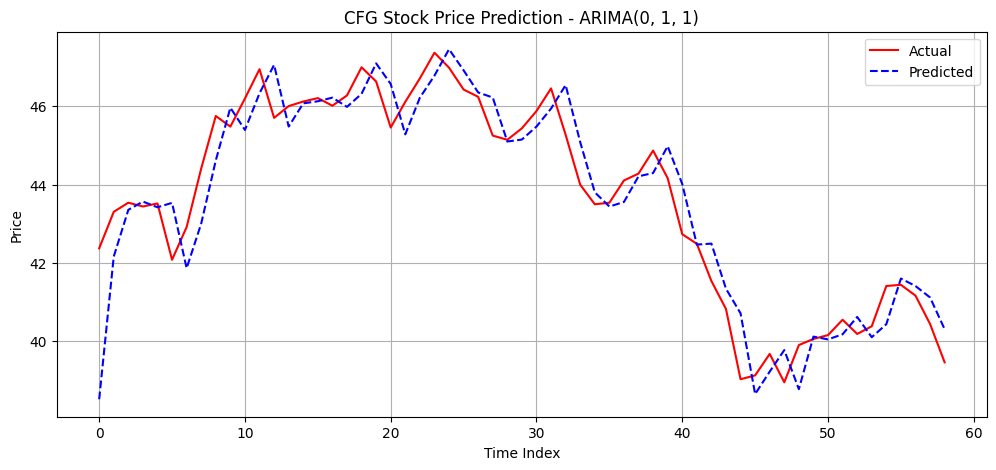

In [ ]:
## Preparing input sequence
full_series_cfg = cfg_stock['Adj Close'].values

## Using last 10 days of CFG stock before prediction start
time_steps = 10
initial_window = full_series_cfg[-(time_steps + len(three_months_test_cfg)) : -len(three_months_test_cfg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nCFG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_cfg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nCFG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_cfg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_cfg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_cfg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'CFG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### CFG - LSTM


CFG LSTM Evaluation:
R²: 0.9039 | MAE: 0.6535 | MSE: 0.6182 | RMSE: 0.7862


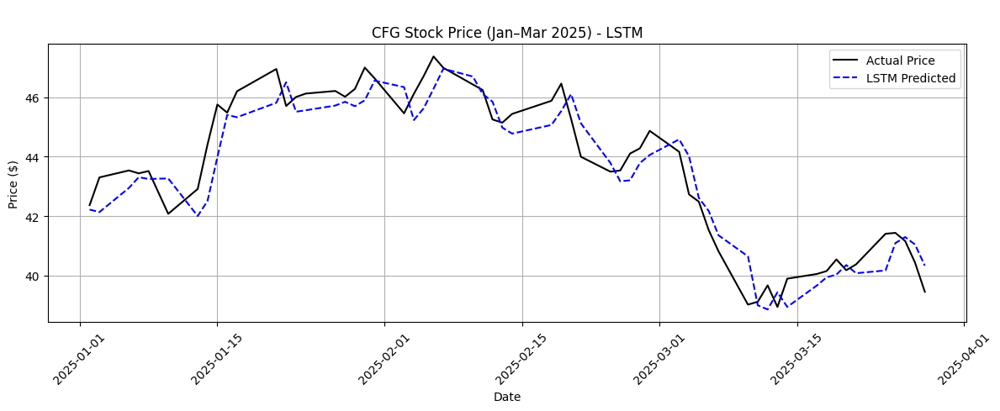


CFG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.220181,0.000000,0.000000
1,2025-01-03,43.302151,42.135750,2.201841,-0.199980
2,2025-01-06,43.535374,42.946857,2.752294,1.721156
3,2025-01-07,43.438198,43.308624,2.522940,2.578020
4,2025-01-08,43.515934,43.248466,2.706412,2.435529


In [ ]:
## Preparing data
full_series = cfg_stock['Adj Close'].values.reshape(-1, 1)
test_series_cfg = three_months_cfg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_cfg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_cfg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_cfg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_cfg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nCFG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### CFG - GRU


CFG GRU Evaluation:
R²: 0.7751 | MAE: 1.0275 | MSE: 1.4473 | RMSE: 1.2031


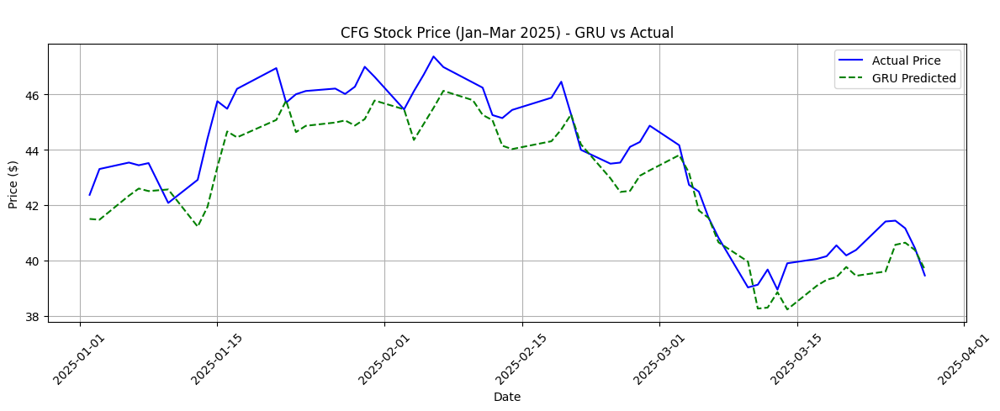


CFG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,41.499779,0.000000,0.000000
1,2025-01-03,43.302151,41.470490,2.201841,-0.070578
2,2025-01-06,43.535374,42.338844,2.752294,2.021861
3,2025-01-07,43.438198,42.597031,2.522940,2.643991
4,2025-01-08,43.515934,42.505028,2.706412,2.422297


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_cfg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_cfg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_cfg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nCFG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - GRU vs Actual')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG GRU Model - Actual vs Predicted:")
gru_results.head()

## **13-Training with Microsoft and Testing with WMT, DG, JNJ, JPM & CFG**

In [ ]:
# Training
msft_stock = pd.read_csv('Stocks Data/Microsoft_stock.csv')

# 10 year stock
wmt_stock = pd.read_csv('Stocks Data/Walmart_stock.csv')
dg_stock = pd.read_csv('Stocks Data/DG_stock.csv')
jnj_stock = pd.read_csv('Stocks Data/Johnson&Johnson_stock.csv')
jpm_stock = pd.read_csv('Stocks Data/JPMorgan_stock.csv')
cfg_stock = pd.read_csv('Stocks Data/CitizensFinancialGroup_stock.csv')

# Testing
three_months_wmt = pd.read_csv('Stocks Data/WMT3Months_Stock.csv')
three_months_dg = pd.read_csv('Stocks Data/DG3Months_Stock.csv')
three_months_jnj = pd.read_csv('Stocks Data/JNJ3Months_Stock.csv')
three_months_jpm = pd.read_csv('Stocks Data/JPM3Months_Stock.csv')
three_months_cfg = pd.read_csv('Stocks Data/CFG3Months_Stock.csv')

print("10 years Microsoft Stock for Training:", msft_stock.shape)
print("3 months WMT Stock for Testing :", three_months_wmt.shape)
print("3 months DG Stock for Testing :", three_months_dg.shape)
print("3 months JNJ Stock for Testing :", three_months_jnj.shape)
print("3 months JPM Stock for Testing :", three_months_jpm.shape)
print("3 months CFG Stock for Testing :", three_months_cfg.shape)

10 years Microsoft Stock for Training: (3018, 3)
3 months WMT Stock for Testing : (59, 3)
3 months DG Stock for Testing : (59, 3)
3 months JNJ Stock for Testing : (59, 3)
3 months JPM Stock for Testing : (59, 3)
3 months CFG Stock for Testing : (59, 3)


In [ ]:
msft_stock

,Date,Adj Close,Stock Name
0,2013-01-02,22.321144,MSFT
1,2013-01-03,22.022131,MSFT
2,2013-01-04,21.609970,MSFT
3,2013-01-07,21.569561,MSFT
4,2013-01-08,21.456429,MSFT
...,...,...,...
3013,2024-12-20,434.927856,MSFT
3014,2024-12-23,433.583038,MSFT
3015,2024-12-24,437.647369,MSFT
3016,2024-12-26,436.432068,MSFT


In [ ]:
# Date Conversion
msft_stock['Date'] = pd.to_datetime(msft_stock['Date'])
three_months_wmt['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_dg['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jnj['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jpm['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_cfg['Date'] = pd.to_datetime(three_months_wmt['Date'])

# Sort data
msft_stock.sort_values('Date', inplace=True)
three_months_wmt.sort_values('Date', inplace=True)
three_months_dg.sort_values('Date', inplace=True)
three_months_jnj.sort_values('Date', inplace=True)
three_months_jpm.sort_values('Date', inplace=True)
three_months_cfg.sort_values('Date', inplace=True)

# Extract series
train_msft = msft_stock['Adj Close'].values

three_months_test_wmt = three_months_wmt['Adj Close'].values
three_months_test_dg = three_months_dg['Adj Close'].values
three_months_test_jnj = three_months_jnj['Adj Close'].values
three_months_test_jpm = three_months_jpm['Adj Close'].values
three_months_test_cfg = three_months_cfg['Adj Close'].values

three_months_dates_wmt = three_months_wmt['Date'].values
three_months_dates_dg = three_months_dg['Date'].values
three_months_dates_jnj = three_months_jnj['Date'].values
three_months_dates_jpm = three_months_jpm['Date'].values
three_months_dates_cfg = three_months_cfg['Date'].values

In [ ]:
train_msft

array([ 22.3211441 ,  22.02213097,  21.60997009, ..., 437.64736938,
       436.43206787, 428.88110352])

In [ ]:
three_months_test_wmt

array([ 89.53704071,  90.31303406,  90.95968628,  90.34287262,
        91.32778931,  92.52161407,  91.05917358,  90.32298279,
        90.87014771,  90.83036041,  91.4670639 ,  92.60120392,
        92.75043488,  93.32744598,  94.27256775,  96.89897919,
        96.78955078,  96.99845886,  98.14255524,  97.65507507,
        99.02796936, 100.25164795, 101.93294525, 102.32094574,
       100.62968445, 102.39058685, 101.94290161, 103.07704163,
       104.5096283 , 103.50482941, 103.24616241, 103.46502686,
        96.70995331,  94.29244995,  93.18816376,  97.18748474,
        95.70514679,  96.29212189,  98.10275269,  97.08799744,
        94.48147583,  95.48628998,  94.15317535,  91.24819946,
        87.36826324,  86.99021912,  84.76173401,  84.06533813,
        84.91095734,  87.01010895,  85.14972687,  85.88592529,
        85.36859894,  85.77262115,  87.27897644,  84.55556488,
        85.00447845,  85.42346191,  84.94462585])

In [ ]:
three_months_test_dg

array([74.18231964, 73.24068451, 74.39810181, 73.32058716, 70.79979706,
       70.54277039, 70.77013397, 68.58544159, 67.78472137, 68.46681976,
       67.65621185, 71.11612701, 69.91010284, 70.51311493, 70.95796204,
       72.46055603, 71.87730408, 71.21498108, 71.32372284, 70.24620819,
       70.65151215, 70.9777298 , 71.98604584, 71.77845764, 71.65982819,
       73.29093933, 73.28104401, 72.96470642, 72.0058136 , 71.72902679,
       74.17073822, 74.76387024, 75.25814056, 75.81172943, 78.12493134,
       77.68008423, 73.34036255, 73.13276672, 73.33047485, 71.0667038 ,
       72.08490753, 72.85596466, 75.36688232, 80.90274811, 81.85176086,
       77.73939514, 73.99279785, 79.03439331, 78.11504364, 78.93553925,
       80.47767639, 81.387146  , 80.73469543, 82.70191193, 82.2076416 ,
       81.63427734, 83.72999573, 86.53746796, 85.11396027])

In [ ]:
three_months_test_jnj

array([141.66188049, 141.82910156, 141.30776978, 143.8356781 ,
       139.9405365 , 139.73396301, 142.10450745, 142.37991333,
       142.59632874, 145.35047913, 144.62258911, 145.72424316,
       142.89141846, 144.23898315, 144.41603088, 150.38664246,
       147.91773987, 148.67512512, 150.36697388, 149.65875244,
       149.3833313 , 150.9768219 , 152.15716553, 150.99647522,
       150.61286926, 151.71455383, 153.57359314, 152.71783447,
       154.67524719, 153.59326172, 153.6725769 , 156.54792786,
       158.32270813, 160.92044067, 162.34820557, 164.67822266,
       161.69381714, 162.33828735, 163.61732483, 165.85810852,
       164.01391602, 163.71646118, 164.42044067, 165.27313232,
       166.27453613, 164.45018005, 161.46577454, 161.60458374,
       161.42610168, 161.45585632, 162.85386658, 161.60458374,
       161.63432312, 162.23913574, 161.90202332, 159.65132141,
       160.34536743, 161.74339294, 162.31846619])

In [ ]:
three_months_test_jpm

array([236.16740417, 239.39501953, 238.2278595 , 240.52259827,
       240.48304749, 237.25852966, 241.55130005, 244.77578735,
       249.60267639, 251.50177002, 256.33853149, 260.16638184,
       259.97845459, 263.05459595, 261.95669556, 262.95568848,
       264.23165894, 263.67773438, 265.30978394, 264.38989258,
       263.90524292, 265.02294922, 267.48580933, 273.88537598,
       272.79736328, 268.08920288, 271.9961853 , 272.45120239,
       273.31170654, 273.57876587, 276.90219116, 276.20980835,
       263.89535522, 261.36322021, 258.49481201, 254.59768677,
       255.97254944, 256.22970581, 261.76876831, 257.78262329,
       247.52552795, 248.79159546, 243.85591125, 239.64228821,
       229.69181824, 226.64535522, 225.4188385 , 222.73835754,
       229.90942383, 231.38319397, 232.41188049, 236.50680542,
       236.40789795, 238.99937439, 245.359375  , 248.39595032,
       248.29704285, 245.41871643, 240.20610046])

In [ ]:
three_months_test_cfg

array([42.36924744, 43.30215073, 43.53537369, 43.43819809, 43.51593399,
       42.07771683, 42.9134407 , 44.40996933, 45.75101471, 45.47891617,
       46.19802856, 46.94629288, 45.7024231 , 46.00366974, 46.12028503,
       46.2077446 , 46.0133934 , 46.27576828, 46.99488068, 46.63217545,
       45.45583344, 46.11262512, 46.71059799, 47.36738968, 46.9850769 ,
       46.42631531, 46.2400589 , 45.2499733 , 45.14213943, 45.43622589,
       45.87735748, 46.45572281, 45.26957703, 43.99520874, 43.49526215,
       43.53447342, 44.10303879, 44.27948761, 44.86766434, 44.1618576 ,
       42.73064041, 42.485569  , 41.53469086, 40.81908417, 39.02516556,
       39.12319183, 39.67214966, 38.9467392 , 39.89761734, 40.05445862,
       40.15248871, 40.54460526, 40.18190002, 40.37795258, 41.40725708,
       41.43666458, 41.16218567, 40.43677139, 39.45648956])

## WMT Stock Prediction

### WMT - ARIMA

In [ ]:
## Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        ## Performing Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

## Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train_msft)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: 1.3144
p-value: 0.9967
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -12.4279
p-value: 0.0000
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

## Preparing input sequence
full_series_wmt = wmt_stock['Adj Close'].values

## Using last 10 days of WMT stock before prediction start
time_steps = 10
initial_window = full_series_wmt[-(time_steps + len(three_months_test_wmt)) : -len(three_months_test_wmt)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse


WMT Evaluating ARIMA(1, 0, 1)...
R²: 0.8033 | MAE: 1.7780 | MSE: 7.0576 | RMSE: 2.6566

WMT Evaluating ARIMA(0, 1, 1)...
R²: 0.8525 | MAE: 1.5353 | MSE: 5.2910 | RMSE: 2.3002

WMT Evaluating ARIMA(1, 1, 0)...
R²: 0.8749 | MAE: 1.4302 | MSE: 4.4877 | RMSE: 2.1184

WMT Best model: ARIMA(1, 1, 0) with R²: 0.8749

First 10 Predictions vs Actual:
Day 1: Actual = 89.54, Predicted = 79.84
Day 2: Actual = 90.31, Predicted = 89.37
Day 3: Actual = 90.96, Predicted = 90.37
Day 4: Actual = 90.34, Predicted = 91.01
Day 5: Actual = 91.33, Predicted = 90.30
Day 6: Actual = 92.52, Predicted = 91.39
Day 7: Actual = 91.06, Predicted = 92.61
Day 8: Actual = 90.32, Predicted = 90.98
Day 9: Actual = 90.87, Predicted = 90.27
Day 10: Actual = 90.83, Predicted = 90.90


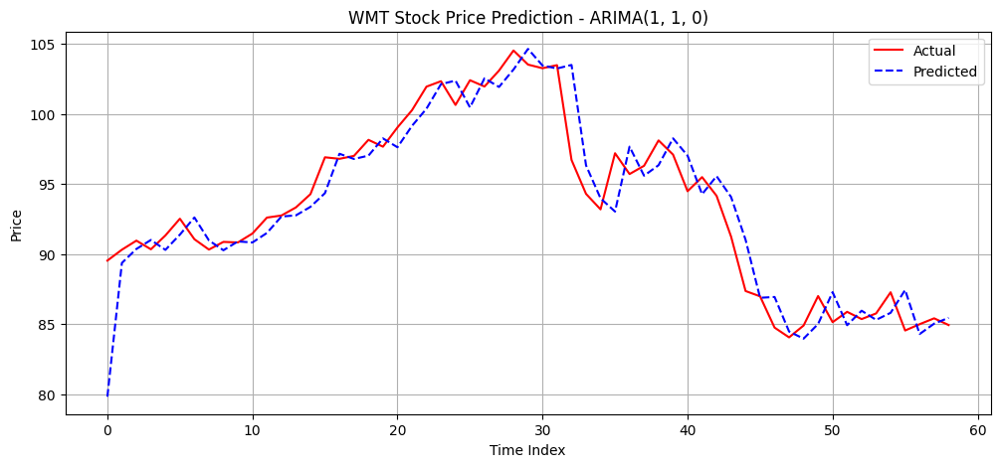

In [ ]:
orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nWMT Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_wmt, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nWMT Best model: ARIMA{best_order} with R²: {best_r2:.4f}")

def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_wmt)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_wmt[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_wmt, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'WMT Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### WMT - LSTM

In [ ]:
## Preparing data
full_series = wmt_stock['Adj Close'].values.reshape(-1, 1)
test_series_wmt = three_months_wmt['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_wmt['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Microsoft stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.48210107],
        [-0.48678674],
        [-0.48401787],
        ...,
        [-0.48859722],
        [-0.49211155],
        [-0.48486995]],

       [[-0.48678674],
        [-0.48401787],
        [-0.49104684],
        ...,
        [-0.49211155],
        [-0.48486995],
        [-0.48242072]],

       [[-0.48401787],
        [-0.49104684],
        [-0.48902342],
        ...,
        [-0.48486995],
        [-0.48242072],
        [-0.48625439]],

       ...,

       [[ 2.64706809],
        [ 2.66383472],
        [ 2.62825659],
        ...,
        [ 2.60850217],
        [ 2.56095968],
        [ 2.48349875]],

       [[ 2.66383472],
        [ 2.62825659],
        [ 2.64333917],
        ...,
        [ 2.56095968],
        [ 2.48349875],
        [ 2.57899296]],

       [[ 2.62825659],
        [ 2.64333917],
        [ 2.66874983],
        ...,
        [ 2.48349875],
        [ 2.57899296],
        [ 2.58350167]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


WMT LSTM Evaluation:
R²: 0.8406 | MAE: 2.0206 | MSE: 5.7182 | RMSE: 2.3913


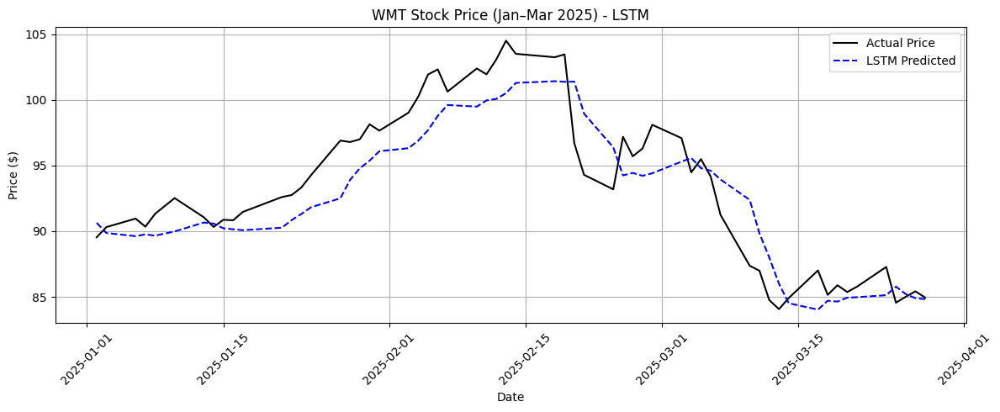


WMT LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,90.634407,0.000000,0.000000
1,2025-01-03,90.313034,89.860184,0.866673,-0.854224
2,2025-01-06,90.959686,89.621902,1.588891,-1.117128
3,2025-01-07,90.342873,89.758598,0.899998,-0.966311
4,2025-01-08,91.327789,89.660538,2.000009,-1.074505


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_wmt, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_wmt, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_wmt, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nWMT LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT LSTM Model - Actual vs Predicted:")
lstm_results.head()

In [ ]:
for i in range(len(test_dates)):
    date = test_dates[i]
    actual_price = test_series_wmt.flatten()[i]
    predicted_price = lstm_predicted_prices[i]
    sequence_unscaled = scaler.inverse_transform(input_sequences[i].reshape(-1, 1)).flatten()

    print(f"\nDate: {date}")
    print(f"Sequence (Walmart - Last 10 Days Before Prediction): {sequence_unscaled}")
    print(f"Input (Last Timestep Value): {sequence_unscaled[-1]:.2f}")
    print(f"Actual Price (Walmart): {actual_price:.2f}")
    print(f"Predicted Price: {predicted_price:.2f}")


Date: 2025-01-02T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.7651825  94.38199615 94.92916107 93.06878662 92.91955566 91.76551819
 89.88524628 92.2032547  92.31269836 91.18850708]
Input (Last Timestep Value): 91.19
Actual Price (Walmart): 89.54
Predicted Price: 90.63

Date: 2025-01-03T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.38199615 94.92916107 93.06878662 92.91955566 91.76551819 89.88524628
 92.2032547  92.31269836 91.18850708 89.53704071]
Input (Last Timestep Value): 89.54
Actual Price (Walmart): 90.31
Predicted Price: 89.86

Date: 2025-01-06T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.92916107 93.06878662 92.91955566 91.76551819 89.88524628 92.2032547
 92.31269836 91.18850708 89.53704071 90.31303406]
Input (Last Timestep Value): 90.31
Actual Price (Walmart): 90.96
Predicted Price: 89.62

Date: 2025-01-07T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.0687

### WMT - GRU


WMT GRU Evaluation:
R²: 0.8668 | MAE: 1.6186 | MSE: 4.7786 | RMSE: 2.1860


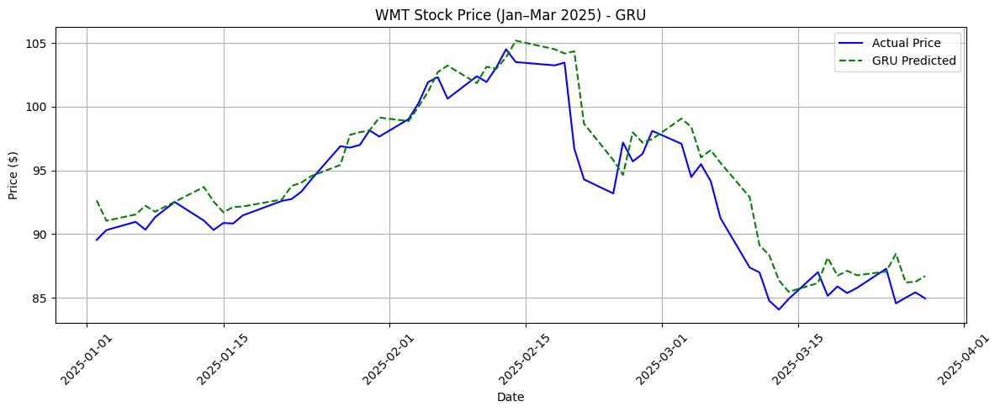


WMT GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,92.644257,0.000000,0.000000
1,2025-01-03,90.313034,91.043503,0.866673,-1.727849
2,2025-01-06,90.959686,91.538574,1.588891,-1.193470
3,2025-01-07,90.342873,92.223526,0.899998,-0.454134
4,2025-01-08,91.327789,91.753113,2.000009,-0.961900


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_wmt, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_wmt, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_wmt, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nWMT GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT GRU Model - Actual vs Predicted:")
gru_results.head()

## DG Stock Prediction

### DG - ARIMA


DG Evaluating ARIMA(1, 0, 1)...
R²: 0.7739 | MAE: 1.4985 | MSE: 4.7552 | RMSE: 2.1806

DG Evaluating ARIMA(0, 1, 1)...
R²: 0.8126 | MAE: 1.4177 | MSE: 3.9413 | RMSE: 1.9853

DG Evaluating ARIMA(1, 1, 0)...
R²: 0.8116 | MAE: 1.4185 | MSE: 3.9634 | RMSE: 1.9908

DG Best model: ARIMA(0, 1, 1) with R²: 0.8126

First 10 Predictions vs Actual:
Day 1: Actual = 74.18, Predicted = 79.79
Day 2: Actual = 73.24, Predicted = 74.39
Day 3: Actual = 74.40, Predicted = 73.21
Day 4: Actual = 73.32, Predicted = 74.44
Day 5: Actual = 70.80, Predicted = 73.30
Day 6: Actual = 70.54, Predicted = 70.66
Day 7: Actual = 70.77, Predicted = 70.54
Day 8: Actual = 68.59, Predicted = 70.78
Day 9: Actual = 67.78, Predicted = 68.47
Day 10: Actual = 68.47, Predicted = 67.74


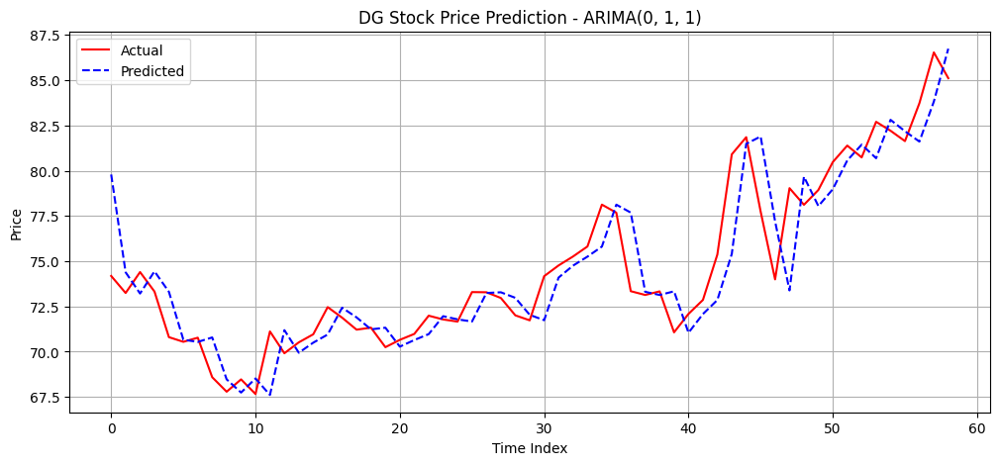

In [ ]:
## Preparing input sequence
full_series_dg = dg_stock['Adj Close'].values

## Using last 10 days of DG stock before prediction start
time_steps = 10
initial_window = full_series_dg[-(time_steps + len(three_months_test_dg)) : -len(three_months_test_dg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nDG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_dg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nDG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_dg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_dg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_dg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'DG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### DG - LSTM


DG LSTM Evaluation:
R²: 0.7894 | MAE: 1.5368 | MSE: 4.4299 | RMSE: 2.1047


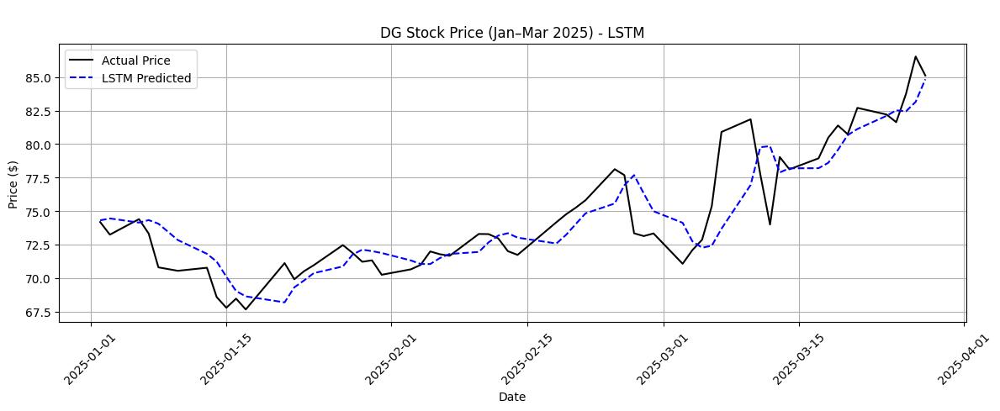


DG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.307587,0.000000,0.000000
1,2025-01-03,73.240685,74.449623,-1.269353,0.191152
2,2025-01-06,74.398102,74.139709,0.290881,-0.225919
3,2025-01-07,73.320587,74.326385,-1.161641,0.025296
4,2025-01-08,70.799797,74.058846,-4.559742,-0.334746


In [ ]:
## Preparing data
full_series = dg_stock['Adj Close'].values.reshape(-1, 1)
test_series_dg = three_months_dg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_dg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Microsoft stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_dg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_dg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_dg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nDG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### DG Stock - GRU


DG GRU Evaluation:
R²: 0.8251 | MAE: 1.3697 | MSE: 3.6790 | RMSE: 1.9181


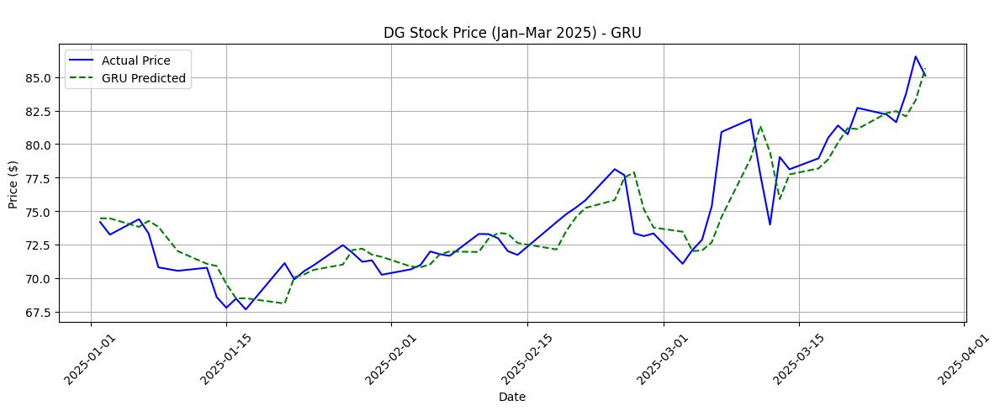


DG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.459137,0.000000,0.000000
1,2025-01-03,73.240685,74.455788,-1.269353,-0.004500
2,2025-01-06,74.398102,73.821785,0.290881,-0.855976
3,2025-01-07,73.320587,74.266373,-1.161641,-0.258887
4,2025-01-08,70.799797,73.820557,-4.559742,-0.857627


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_dg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_dg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_dg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nDG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG GRU Model - Actual vs Predicted:")
gru_results.head()

## JNJ Stock Predictions

### JNJ - ARIMA


JNJ Evaluating ARIMA(1, 0, 1)...
R²: 0.8482 | MAE: 1.9532 | MSE: 10.6481 | RMSE: 3.2631

JNJ Evaluating ARIMA(0, 1, 1)...
R²: 0.9005 | MAE: 1.6288 | MSE: 6.9764 | RMSE: 2.6413

JNJ Evaluating ARIMA(1, 1, 0)...
R²: 0.8967 | MAE: 1.6644 | MSE: 7.2477 | RMSE: 2.6922

JNJ Best model: ARIMA(0, 1, 1) with R²: 0.9005

First 10 Predictions vs Actual:
Day 1: Actual = 141.66, Predicted = 156.60
Day 2: Actual = 141.83, Predicted = 139.08
Day 3: Actual = 141.31, Predicted = 141.84
Day 4: Actual = 143.84, Predicted = 141.29
Day 5: Actual = 139.94, Predicted = 143.89
Day 6: Actual = 139.73, Predicted = 139.99
Day 7: Actual = 142.10, Predicted = 139.74
Day 8: Actual = 142.38, Predicted = 142.08
Day 9: Actual = 142.60, Predicted = 142.38
Day 10: Actual = 145.35, Predicted = 142.59


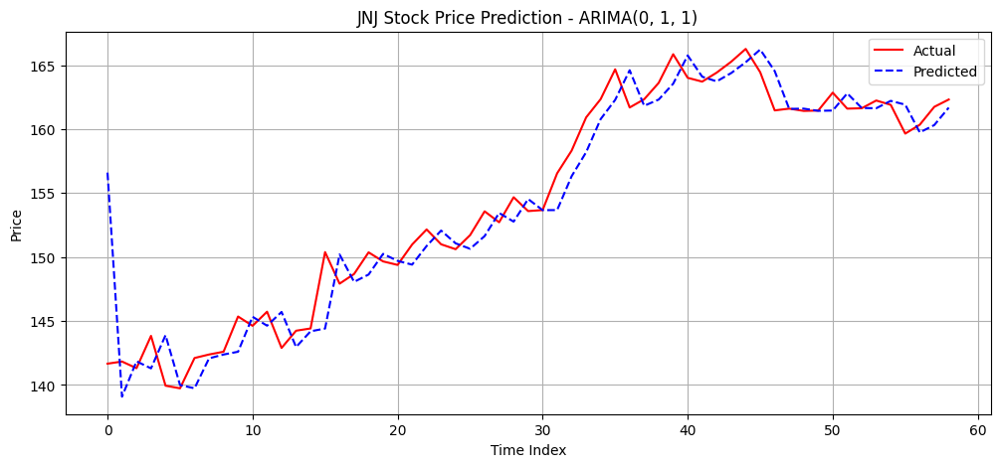

In [ ]:
## Preparing input sequence
full_series_jnj = jnj_stock['Adj Close'].values

## Using last 10 days of JNJ stock before prediction start
time_steps = 10
initial_window = full_series_jnj[-(time_steps + len(three_months_test_jnj)) : -len(three_months_test_jnj)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJNJ Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jnj, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJNJ Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jnj)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jnj[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jnj, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JNJ Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JNJ - LSTM


JNJ LSTM Evaluation:
R²: 0.9503 | MAE: 1.3990 | MSE: 3.4873 | RMSE: 1.8674


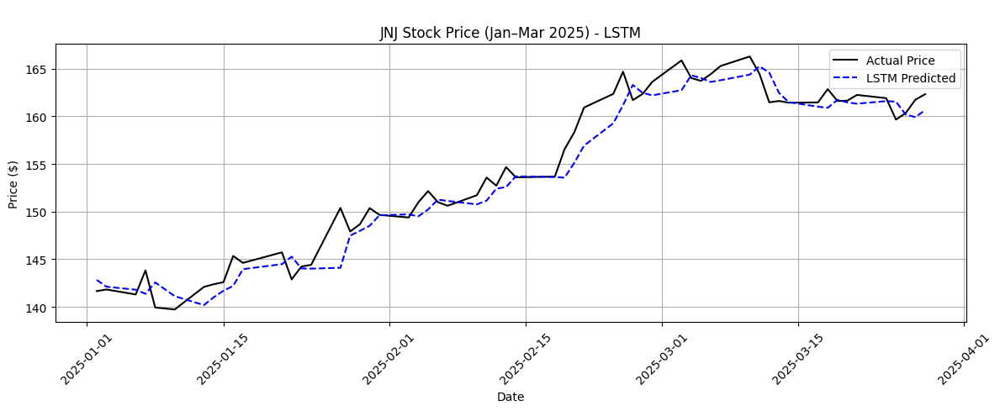


JNJ LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,142.834991,0.000000,0.000000
1,2025-01-03,141.829102,142.119217,0.118042,-0.501120
2,2025-01-06,141.307770,141.807678,-0.249969,-0.719231
3,2025-01-07,143.835678,141.379425,1.534497,-1.019055
4,2025-01-08,139.940536,142.571198,-1.215107,-0.184685


In [ ]:
## Preparing data
full_series = jnj_stock['Adj Close'].values.reshape(-1, 1)
test_series_jnj = three_months_jnj['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jnj['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jnj, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jnj, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jnj, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJNJ LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JNJ - GRU


JNJ GRU Evaluation:
R²: 0.9589 | MAE: 1.3255 | MSE: 2.8813 | RMSE: 1.6975


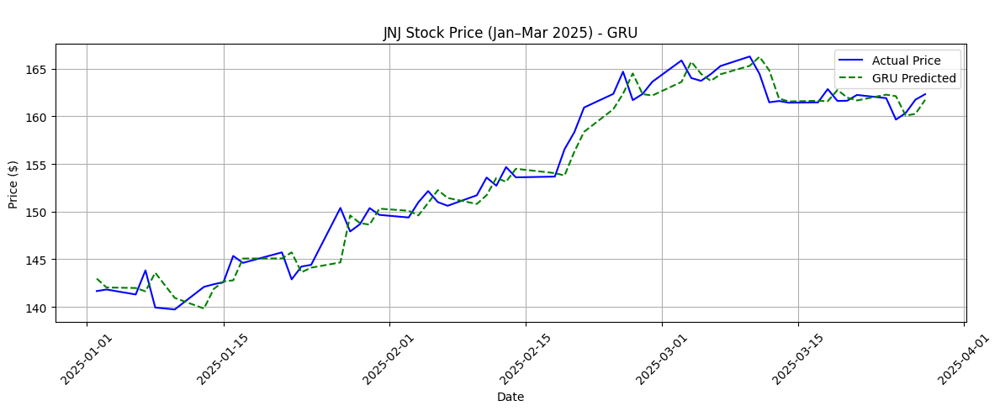


JNJ GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,142.972122,0.000000,0.000000
1,2025-01-03,141.829102,142.041595,0.118042,-0.650847
2,2025-01-06,141.307770,141.986053,-0.249969,-0.689691
3,2025-01-07,143.835678,141.636169,1.534497,-0.934416
4,2025-01-08,139.940536,143.593689,-1.215107,0.434744


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jnj, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jnj, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jnj, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJNJ GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ GRU Model - Actual vs Predicted:")
gru_results.head()

## JPM Stock Predictions

### JPM - ARIMA


JPM Evaluating ARIMA(1, 0, 1)...
R²: 0.4522 | MAE: 5.3104 | MSE: 117.0941 | RMSE: 10.8210

JPM Evaluating ARIMA(0, 1, 1)...
R²: 0.7539 | MAE: 3.9670 | MSE: 52.5983 | RMSE: 7.2525

JPM Evaluating ARIMA(1, 1, 0)...
R²: 0.8065 | MAE: 3.7403 | MSE: 41.3655 | RMSE: 6.4316

JPM Best model: ARIMA(1, 1, 0) with R²: 0.8065

First 10 Predictions vs Actual:
Day 1: Actual = 236.17, Predicted = 200.97
Day 2: Actual = 239.40, Predicted = 220.83
Day 3: Actual = 238.23, Predicted = 239.49
Day 4: Actual = 240.52, Predicted = 238.20
Day 5: Actual = 240.48, Predicted = 240.58
Day 6: Actual = 237.26, Predicted = 240.48
Day 7: Actual = 241.55, Predicted = 237.18
Day 8: Actual = 244.78, Predicted = 241.61
Day 9: Actual = 249.60, Predicted = 244.85
Day 10: Actual = 251.50, Predicted = 249.77


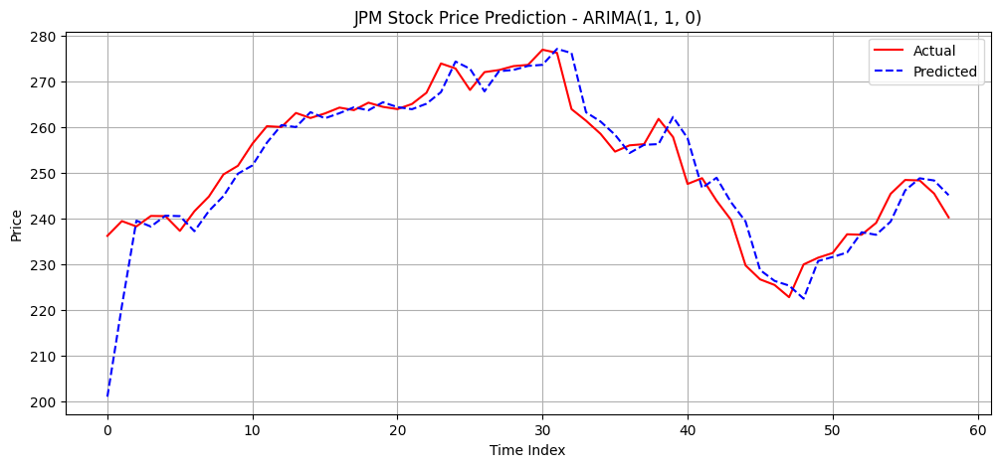

In [ ]:
## Preparing input sequence
full_series_jpm = jpm_stock['Adj Close'].values

## Using last 10 days of JPM stock before prediction start
time_steps = 10
initial_window = full_series_jpm[-(time_steps + len(three_months_test_jpm)) : -len(three_months_test_jpm)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJPM Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jpm, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJPM Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jpm)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jpm[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jpm, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JPM Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JPM - LSTM


JPM LSTM Evaluation:
R²: 0.8962 | MAE: 3.4038 | MSE: 22.1801 | RMSE: 4.7096


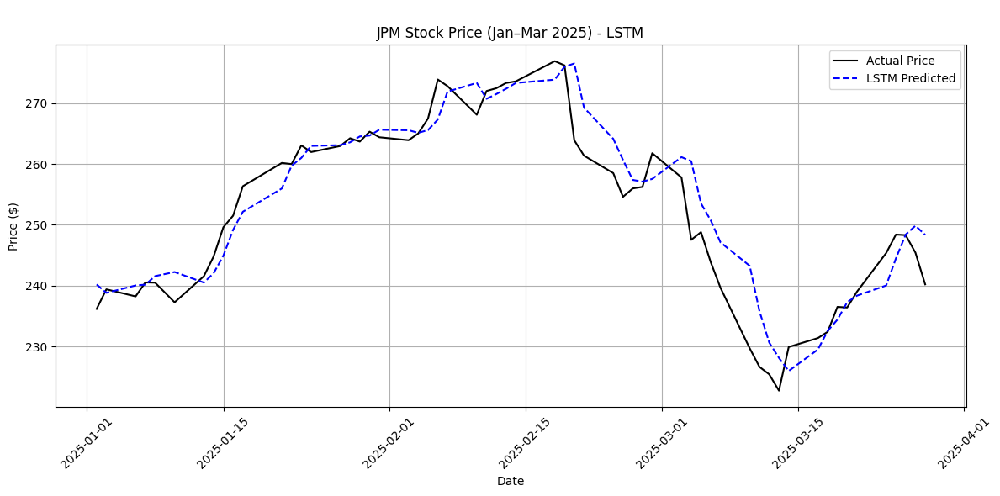


JPM LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,240.187973,0.000000,0.000000
1,2025-01-03,239.395020,238.816193,1.366664,-0.571126
2,2025-01-06,238.227859,240.027649,0.872455,-0.066751
3,2025-01-07,240.522598,240.163040,1.844113,-0.010383
4,2025-01-08,240.483047,241.562408,1.827366,0.572228


In [ ]:
## Preparing data
full_series = jpm_stock['Adj Close'].values.reshape(-1, 1)
test_series_jpm = three_months_jpm['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jpm['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jpm, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jpm, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jpm, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJPM LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 6))
plt.plot(test_dates, test_series_jpm.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JPM - GRU


JPM GRU Evaluation:
R²: 0.9225 | MAE: 3.1101 | MSE: 16.5583 | RMSE: 4.0692


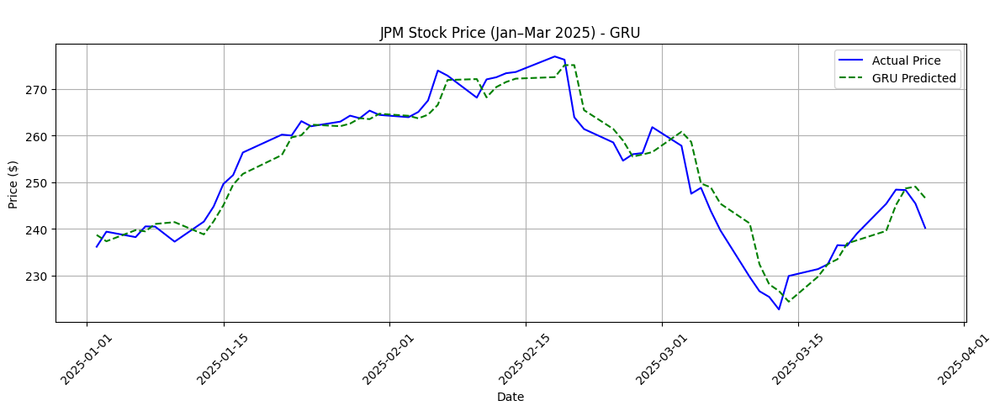


JPM GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,238.692825,0.000000,0.000000
1,2025-01-03,239.395020,237.337219,1.366664,-0.567931
2,2025-01-06,238.227859,239.723434,0.872455,0.431776
3,2025-01-07,240.522598,239.460663,1.844113,0.321686
4,2025-01-08,240.483047,241.047745,1.827366,0.986588


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jpm, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jpm, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jpm, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJPM GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jpm.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM GRU Model - Actual vs Predicted:")
gru_results.head()

## CFG Stock Predictions

### CFG - ARIMA


CFG Evaluating ARIMA(1, 0, 1)...
R²: 0.7742 | MAE: 0.7977 | MSE: 1.4529 | RMSE: 1.2054

CFG Evaluating ARIMA(0, 1, 1)...
R²: 0.8783 | MAE: 0.6540 | MSE: 0.7834 | RMSE: 0.8851

CFG Evaluating ARIMA(1, 1, 0)...
R²: 0.8776 | MAE: 0.6569 | MSE: 0.7877 | RMSE: 0.8875

CFG Best model: ARIMA(0, 1, 1) with R²: 0.8783

First 10 Predictions vs Actual:
Day 1: Actual = 42.37, Predicted = 38.51
Day 2: Actual = 43.30, Predicted = 42.16
Day 3: Actual = 43.54, Predicted = 43.35
Day 4: Actual = 43.44, Predicted = 43.56
Day 5: Actual = 43.52, Predicted = 43.42
Day 6: Actual = 42.08, Predicted = 43.53
Day 7: Actual = 42.91, Predicted = 41.86
Day 8: Actual = 44.41, Predicted = 43.00
Day 9: Actual = 45.75, Predicted = 44.62
Day 10: Actual = 45.48, Predicted = 45.96


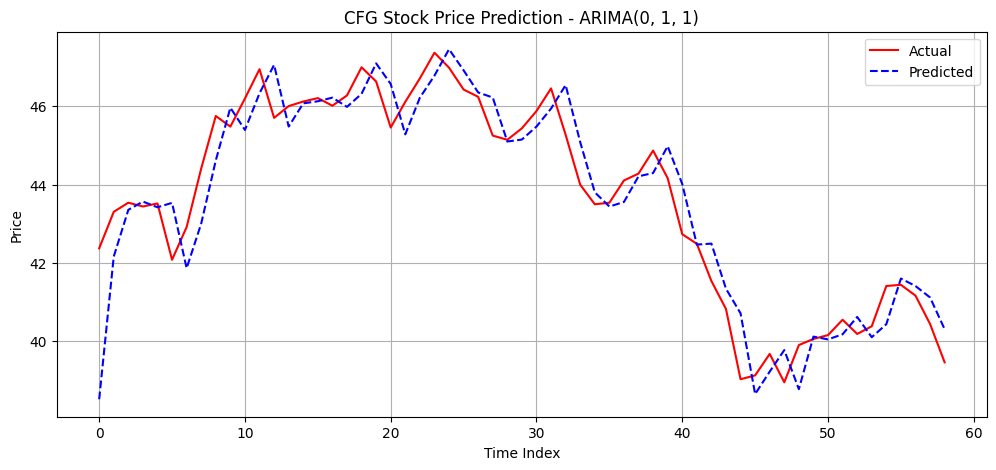

In [ ]:
## Preparing input sequence
full_series_cfg = cfg_stock['Adj Close'].values

## Using last 10 days of CFG stock before prediction start
time_steps = 10
initial_window = full_series_cfg[-(time_steps + len(three_months_test_cfg)) : -len(three_months_test_cfg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nCFG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_cfg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nCFG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_cfg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_cfg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_cfg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'CFG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### CFG - LSTM


CFG LSTM Evaluation:
R²: 0.9075 | MAE: 0.6336 | MSE: 0.5950 | RMSE: 0.7714


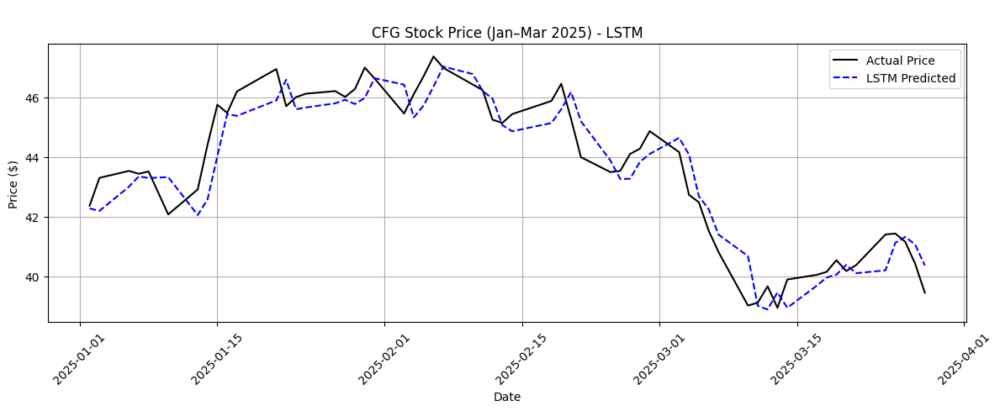


CFG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.277245,0.000000,0.000000
1,2025-01-03,43.302151,42.196308,2.201841,-0.191444
2,2025-01-06,43.535374,43.003685,2.752294,1.718283
3,2025-01-07,43.438198,43.351128,2.522940,2.540100
4,2025-01-08,43.515934,43.296692,2.706412,2.411342


In [ ]:
## Preparing data
full_series = cfg_stock['Adj Close'].values.reshape(-1, 1)
test_series_cfg = three_months_cfg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_cfg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_cfg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_cfg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_cfg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nCFG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### CFG - GRU


CFG GRU Evaluation:
R²: 0.8947 | MAE: 0.6463 | MSE: 0.6774 | RMSE: 0.8231


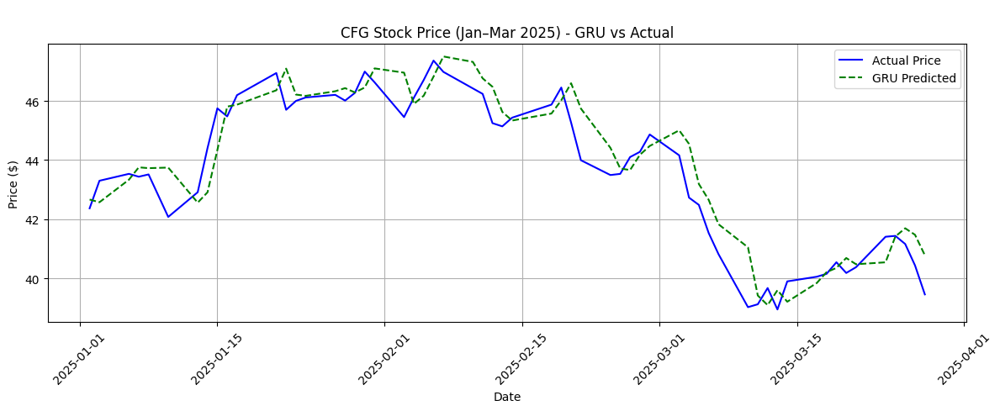


CFG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.665794,0.000000,0.000000
1,2025-01-03,43.302151,42.574421,2.201841,-0.214159
2,2025-01-06,43.535374,43.336937,2.752294,1.573026
3,2025-01-07,43.438198,43.755768,2.522940,2.554679
4,2025-01-08,43.515934,43.727852,2.706412,2.489245


In [ ]:
## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_cfg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_cfg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_cfg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nCFG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - GRU vs Actual')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG GRU Model - Actual vs Predicted:")
gru_results.head()

## 14-Training with Google and Testing with WMT, DG, JNJ, JPM & CFG

In [ ]:
# Training
googl_stock = pd.read_csv('Stocks Data/ALPHABET_stock.csv')

# 10 year stock
wmt_stock = pd.read_csv('Stocks Data/Walmart_stock.csv')
dg_stock = pd.read_csv('Stocks Data/DG_stock.csv')
jnj_stock = pd.read_csv('Stocks Data/Johnson&Johnson_stock.csv')
jpm_stock = pd.read_csv('Stocks Data/JPMorgan_stock.csv')
cfg_stock = pd.read_csv('Stocks Data/CitizensFinancialGroup_stock.csv')

# Testing
three_months_wmt = pd.read_csv('Stocks Data/WMT3Months_Stock.csv')
three_months_dg = pd.read_csv('Stocks Data/DG3Months_Stock.csv')
three_months_jnj = pd.read_csv('Stocks Data/JNJ3Months_Stock.csv')
three_months_jpm = pd.read_csv('Stocks Data/JPM3Months_Stock.csv')
three_months_cfg = pd.read_csv('Stocks Data/CFG3Months_Stock.csv')

print("10 years Google Stock for Training:", googl_stock.shape)
print("3 months WMT Stock for Testing :", three_months_wmt.shape)
print("3 months DG Stock for Testing :", three_months_dg.shape)
print("3 months JNJ Stock for Testing :", three_months_jnj.shape)
print("3 months JPM Stock for Testing :", three_months_jpm.shape)
print("3 months CFG Stock for Testing :", three_months_cfg.shape)

10 years Google Stock for Training: (3018, 3)
3 months WMT Stock for Testing : (59, 3)
3 months DG Stock for Testing : (59, 3)
3 months JNJ Stock for Testing : (59, 3)
3 months JPM Stock for Testing : (59, 3)
3 months CFG Stock for Testing : (59, 3)


In [ ]:
# Date Conversion
googl_stock['Date'] = pd.to_datetime(googl_stock['Date'])
three_months_wmt['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_dg['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jnj['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jpm['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_cfg['Date'] = pd.to_datetime(three_months_wmt['Date'])

# Sort data
googl_stock.sort_values('Date', inplace=True)
three_months_wmt.sort_values('Date', inplace=True)
three_months_dg.sort_values('Date', inplace=True)
three_months_jnj.sort_values('Date', inplace=True)
three_months_jpm.sort_values('Date', inplace=True)
three_months_cfg.sort_values('Date', inplace=True)

# Extract series
train_googl = googl_stock['Adj Close'].values

three_months_test_wmt = three_months_wmt['Adj Close'].values
three_months_test_dg = three_months_dg['Adj Close'].values
three_months_test_jnj = three_months_jnj['Adj Close'].values
three_months_test_jpm = three_months_jpm['Adj Close'].values
three_months_test_cfg = three_months_cfg['Adj Close'].values

three_months_dates_wmt = three_months_wmt['Date'].values
three_months_dates_dg = three_months_dg['Date'].values
three_months_dates_jnj = three_months_jnj['Date'].values
three_months_dates_jpm = three_months_jpm['Date'].values
three_months_dates_cfg = three_months_cfg['Date'].values

In [ ]:
train_googl

array([ 17.99144554,  18.0018959 ,  18.35762215, ..., 195.64755249,
       195.13874817, 192.30543518])

In [ ]:
three_months_test_wmt

array([ 89.53704071,  90.31303406,  90.95968628,  90.34287262,
        91.32778931,  92.52161407,  91.05917358,  90.32298279,
        90.87014771,  90.83036041,  91.4670639 ,  92.60120392,
        92.75043488,  93.32744598,  94.27256775,  96.89897919,
        96.78955078,  96.99845886,  98.14255524,  97.65507507,
        99.02796936, 100.25164795, 101.93294525, 102.32094574,
       100.62968445, 102.39058685, 101.94290161, 103.07704163,
       104.5096283 , 103.50482941, 103.24616241, 103.46502686,
        96.70995331,  94.29244995,  93.18816376,  97.18748474,
        95.70514679,  96.29212189,  98.10275269,  97.08799744,
        94.48147583,  95.48628998,  94.15317535,  91.24819946,
        87.36826324,  86.99021912,  84.76173401,  84.06533813,
        84.91095734,  87.01010895,  85.14972687,  85.88592529,
        85.36859894,  85.77262115,  87.27897644,  84.55556488,
        85.00447845,  85.42346191,  84.94462585])

In [ ]:
three_months_test_dg

array([74.18231964, 73.24068451, 74.39810181, 73.32058716, 70.79979706,
       70.54277039, 70.77013397, 68.58544159, 67.78472137, 68.46681976,
       67.65621185, 71.11612701, 69.91010284, 70.51311493, 70.95796204,
       72.46055603, 71.87730408, 71.21498108, 71.32372284, 70.24620819,
       70.65151215, 70.9777298 , 71.98604584, 71.77845764, 71.65982819,
       73.29093933, 73.28104401, 72.96470642, 72.0058136 , 71.72902679,
       74.17073822, 74.76387024, 75.25814056, 75.81172943, 78.12493134,
       77.68008423, 73.34036255, 73.13276672, 73.33047485, 71.0667038 ,
       72.08490753, 72.85596466, 75.36688232, 80.90274811, 81.85176086,
       77.73939514, 73.99279785, 79.03439331, 78.11504364, 78.93553925,
       80.47767639, 81.387146  , 80.73469543, 82.70191193, 82.2076416 ,
       81.63427734, 83.72999573, 86.53746796, 85.11396027])

In [ ]:
three_months_test_jnj

array([141.66188049, 141.82910156, 141.30776978, 143.8356781 ,
       139.9405365 , 139.73396301, 142.10450745, 142.37991333,
       142.59632874, 145.35047913, 144.62258911, 145.72424316,
       142.89141846, 144.23898315, 144.41603088, 150.38664246,
       147.91773987, 148.67512512, 150.36697388, 149.65875244,
       149.3833313 , 150.9768219 , 152.15716553, 150.99647522,
       150.61286926, 151.71455383, 153.57359314, 152.71783447,
       154.67524719, 153.59326172, 153.6725769 , 156.54792786,
       158.32270813, 160.92044067, 162.34820557, 164.67822266,
       161.69381714, 162.33828735, 163.61732483, 165.85810852,
       164.01391602, 163.71646118, 164.42044067, 165.27313232,
       166.27453613, 164.45018005, 161.46577454, 161.60458374,
       161.42610168, 161.45585632, 162.85386658, 161.60458374,
       161.63432312, 162.23913574, 161.90202332, 159.65132141,
       160.34536743, 161.74339294, 162.31846619])

In [ ]:
three_months_test_jpm

array([236.16740417, 239.39501953, 238.2278595 , 240.52259827,
       240.48304749, 237.25852966, 241.55130005, 244.77578735,
       249.60267639, 251.50177002, 256.33853149, 260.16638184,
       259.97845459, 263.05459595, 261.95669556, 262.95568848,
       264.23165894, 263.67773438, 265.30978394, 264.38989258,
       263.90524292, 265.02294922, 267.48580933, 273.88537598,
       272.79736328, 268.08920288, 271.9961853 , 272.45120239,
       273.31170654, 273.57876587, 276.90219116, 276.20980835,
       263.89535522, 261.36322021, 258.49481201, 254.59768677,
       255.97254944, 256.22970581, 261.76876831, 257.78262329,
       247.52552795, 248.79159546, 243.85591125, 239.64228821,
       229.69181824, 226.64535522, 225.4188385 , 222.73835754,
       229.90942383, 231.38319397, 232.41188049, 236.50680542,
       236.40789795, 238.99937439, 245.359375  , 248.39595032,
       248.29704285, 245.41871643, 240.20610046])

In [ ]:
three_months_test_cfg

array([42.36924744, 43.30215073, 43.53537369, 43.43819809, 43.51593399,
       42.07771683, 42.9134407 , 44.40996933, 45.75101471, 45.47891617,
       46.19802856, 46.94629288, 45.7024231 , 46.00366974, 46.12028503,
       46.2077446 , 46.0133934 , 46.27576828, 46.99488068, 46.63217545,
       45.45583344, 46.11262512, 46.71059799, 47.36738968, 46.9850769 ,
       46.42631531, 46.2400589 , 45.2499733 , 45.14213943, 45.43622589,
       45.87735748, 46.45572281, 45.26957703, 43.99520874, 43.49526215,
       43.53447342, 44.10303879, 44.27948761, 44.86766434, 44.1618576 ,
       42.73064041, 42.485569  , 41.53469086, 40.81908417, 39.02516556,
       39.12319183, 39.67214966, 38.9467392 , 39.89761734, 40.05445862,
       40.15248871, 40.54460526, 40.18190002, 40.37795258, 41.40725708,
       41.43666458, 41.16218567, 40.43677139, 39.45648956])

## WMT Stock Prediction

### WMT - ARIMA

In [ ]:
## Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        ## Performing Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

## Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train_googl)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: 1.0990
p-value: 0.9952
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -11.9109
p-value: 0.0000
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

## Preparing input sequence
full_series_wmt = wmt_stock['Adj Close'].values

## Using last 10 days of WMT stock before prediction start
time_steps = 10
initial_window = full_series_wmt[-(time_steps + len(three_months_test_wmt)) : -len(three_months_test_wmt)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse


WMT Evaluating ARIMA(1, 0, 1)...
R²: 0.8033 | MAE: 1.7780 | MSE: 7.0576 | RMSE: 2.6566

WMT Evaluating ARIMA(0, 1, 1)...
R²: 0.8525 | MAE: 1.5353 | MSE: 5.2910 | RMSE: 2.3002

WMT Evaluating ARIMA(1, 1, 0)...
R²: 0.8749 | MAE: 1.4302 | MSE: 4.4877 | RMSE: 2.1184

WMT Best model: ARIMA(1, 1, 0) with R²: 0.8749

First 10 Predictions vs Actual:
Day 1: Actual = 89.54, Predicted = 79.84
Day 2: Actual = 90.31, Predicted = 89.37
Day 3: Actual = 90.96, Predicted = 90.37
Day 4: Actual = 90.34, Predicted = 91.01
Day 5: Actual = 91.33, Predicted = 90.30
Day 6: Actual = 92.52, Predicted = 91.39
Day 7: Actual = 91.06, Predicted = 92.61
Day 8: Actual = 90.32, Predicted = 90.98
Day 9: Actual = 90.87, Predicted = 90.27
Day 10: Actual = 90.83, Predicted = 90.90


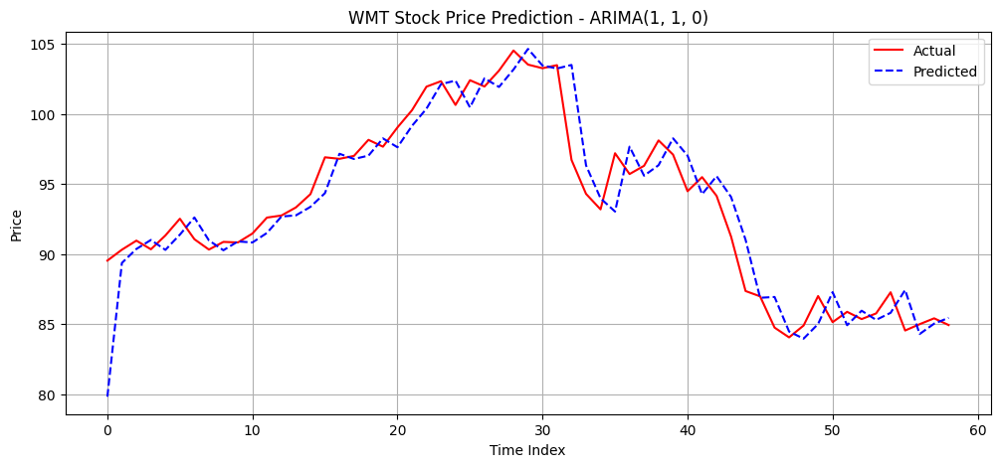

In [ ]:
orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nWMT Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_wmt, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nWMT Best model: ARIMA{best_order} with R²: {best_r2:.4f}")

def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_wmt)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_wmt[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_wmt, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'WMT Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### WMT - LSTM

In [ ]:
## Preparing data
full_series = wmt_stock['Adj Close'].values.reshape(-1, 1)
test_series_wmt = three_months_wmt['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_wmt['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Google stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.48210107],
        [-0.48678674],
        [-0.48401787],
        ...,
        [-0.48859722],
        [-0.49211155],
        [-0.48486995]],

       [[-0.48678674],
        [-0.48401787],
        [-0.49104684],
        ...,
        [-0.49211155],
        [-0.48486995],
        [-0.48242072]],

       [[-0.48401787],
        [-0.49104684],
        [-0.48902342],
        ...,
        [-0.48486995],
        [-0.48242072],
        [-0.48625439]],

       ...,

       [[ 2.64706809],
        [ 2.66383472],
        [ 2.62825659],
        ...,
        [ 2.60850217],
        [ 2.56095968],
        [ 2.48349875]],

       [[ 2.66383472],
        [ 2.62825659],
        [ 2.64333917],
        ...,
        [ 2.56095968],
        [ 2.48349875],
        [ 2.57899296]],

       [[ 2.62825659],
        [ 2.64333917],
        [ 2.66874983],
        ...,
        [ 2.48349875],
        [ 2.57899296],
        [ 2.58350167]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


WMT LSTM Evaluation:
R²: 0.8729 | MAE: 1.5849 | MSE: 4.5599 | RMSE: 2.1354


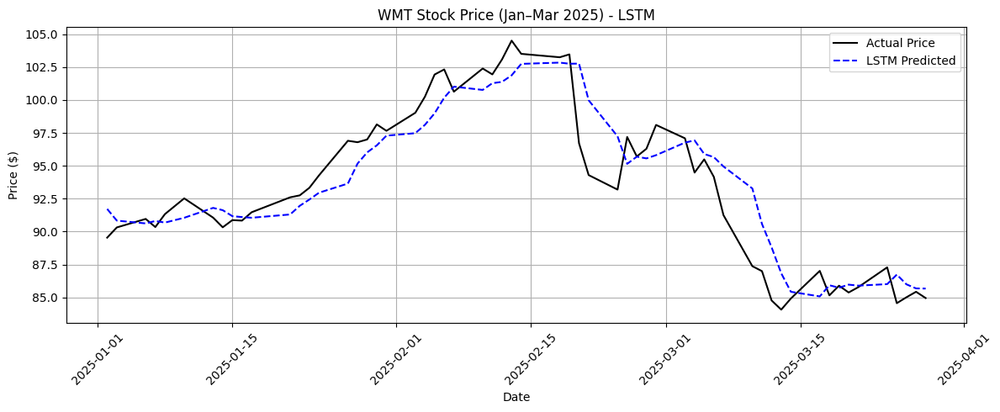


WMT LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.716728,0.000000,0.000000
1,2025-01-03,90.313034,90.831238,0.866673,-0.965464
2,2025-01-06,90.959686,90.618805,1.588891,-1.197082
3,2025-01-07,90.342873,90.803513,0.899998,-0.995690
4,2025-01-08,91.327789,90.681854,2.000009,-1.128340


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_wmt, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_wmt, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_wmt, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nWMT LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT LSTM Model - Actual vs Predicted:")
lstm_results.head()

In [ ]:
for i in range(len(test_dates)):
    date = test_dates[i]
    actual_price = test_series_wmt.flatten()[i]
    predicted_price = lstm_predicted_prices[i]
    sequence_unscaled = scaler.inverse_transform(input_sequences[i].reshape(-1, 1)).flatten()

    print(f"\nDate: {date}")
    print(f"Sequence (Walmart - Last 10 Days Before Prediction): {sequence_unscaled}")
    print(f"Input (Last Timestep Value): {sequence_unscaled[-1]:.2f}")
    print(f"Actual Price (Walmart): {actual_price:.2f}")
    print(f"Predicted Price: {predicted_price:.2f}")


Date: 2025-01-02T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.7651825  94.38199615 94.92916107 93.06878662 92.91955566 91.76551819
 89.88524628 92.2032547  92.31269836 91.18850708]
Input (Last Timestep Value): 91.19
Actual Price (Walmart): 89.54
Predicted Price: 91.72

Date: 2025-01-03T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.38199615 94.92916107 93.06878662 92.91955566 91.76551819 89.88524628
 92.2032547  92.31269836 91.18850708 89.53704071]
Input (Last Timestep Value): 89.54
Actual Price (Walmart): 90.31
Predicted Price: 90.83

Date: 2025-01-06T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.92916107 93.06878662 92.91955566 91.76551819 89.88524628 92.2032547
 92.31269836 91.18850708 89.53704071 90.31303406]
Input (Last Timestep Value): 90.31
Actual Price (Walmart): 90.96
Predicted Price: 90.62

Date: 2025-01-07T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.0687

### WMT - GRU


WMT GRU Evaluation:
R²: 0.8699 | MAE: 1.6106 | MSE: 4.6667 | RMSE: 2.1602


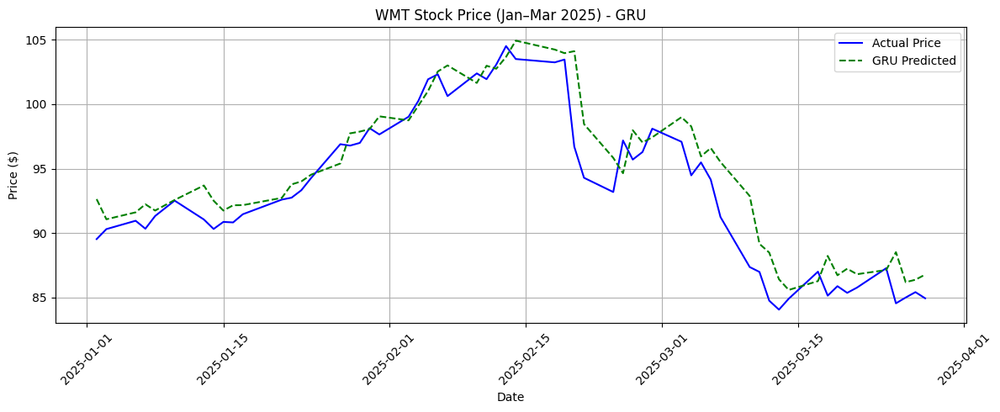


WMT GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,92.636017,0.000000,0.000000
1,2025-01-03,90.313034,91.075180,0.866673,-1.684916
2,2025-01-06,90.959686,91.613388,1.588891,-1.103920
3,2025-01-07,90.342873,92.237427,0.899998,-0.430274
4,2025-01-08,91.327789,91.751793,2.000009,-0.954515


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_wmt, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_wmt, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_wmt, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nWMT GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT GRU Model - Actual vs Predicted:")
gru_results.head()


## DG Stock Prediction

### DG - ARIMA


DG Evaluating ARIMA(1, 0, 1)...
R²: 0.7739 | MAE: 1.4985 | MSE: 4.7552 | RMSE: 2.1806

DG Evaluating ARIMA(0, 1, 1)...
R²: 0.8126 | MAE: 1.4177 | MSE: 3.9413 | RMSE: 1.9853

DG Evaluating ARIMA(1, 1, 0)...
R²: 0.8116 | MAE: 1.4185 | MSE: 3.9634 | RMSE: 1.9908

DG Best model: ARIMA(0, 1, 1) with R²: 0.8126

First 10 Predictions vs Actual:
Day 1: Actual = 74.18, Predicted = 79.79
Day 2: Actual = 73.24, Predicted = 74.39
Day 3: Actual = 74.40, Predicted = 73.21
Day 4: Actual = 73.32, Predicted = 74.44
Day 5: Actual = 70.80, Predicted = 73.30
Day 6: Actual = 70.54, Predicted = 70.66
Day 7: Actual = 70.77, Predicted = 70.54
Day 8: Actual = 68.59, Predicted = 70.78
Day 9: Actual = 67.78, Predicted = 68.47
Day 10: Actual = 68.47, Predicted = 67.74


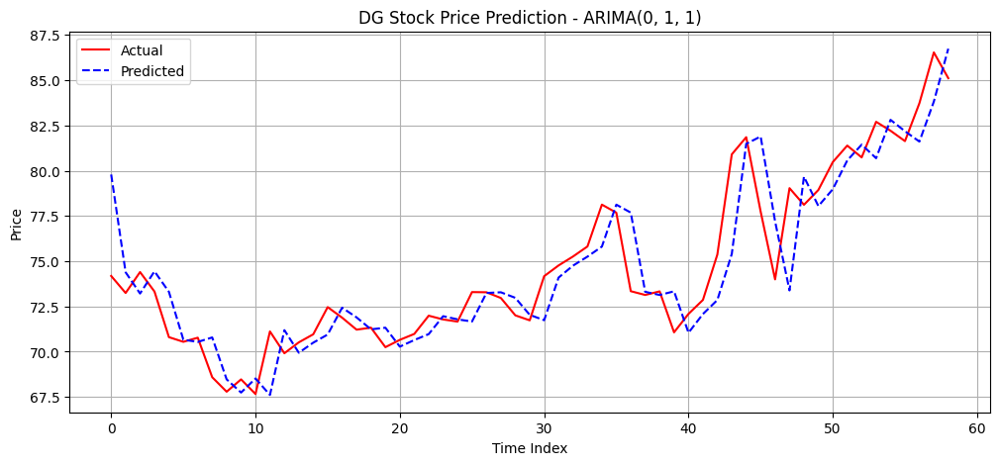

In [ ]:
## Preparing input sequence
full_series_dg = dg_stock['Adj Close'].values

## Using last 10 days of DG stock before prediction start
time_steps = 10
initial_window = full_series_dg[-(time_steps + len(three_months_test_dg)) : -len(three_months_test_dg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nDG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_dg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nDG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_dg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_dg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_dg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'DG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### DG - LSTM


DG LSTM Evaluation:
R²: 0.7672 | MAE: 1.6537 | MSE: 4.8968 | RMSE: 2.2129


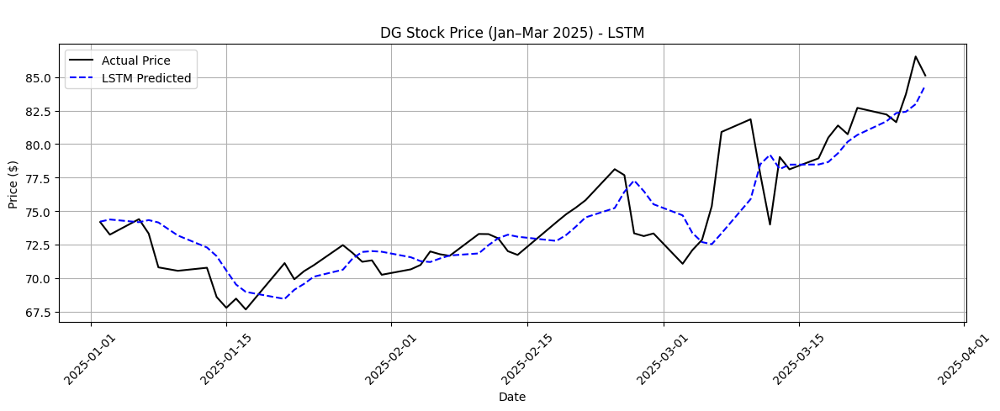


DG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.213524,0.000000,0.000000
1,2025-01-03,73.240685,74.370560,-1.269353,0.211596
2,2025-01-06,74.398102,74.170815,0.290881,-0.057548
3,2025-01-07,73.320587,74.326874,-1.161641,0.152731
4,2025-01-08,70.799797,74.149666,-4.559742,-0.086045


In [ ]:
## Preparing data
full_series = dg_stock['Adj Close'].values.reshape(-1, 1)
test_series_dg = three_months_dg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_dg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Google stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_dg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_dg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_dg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nDG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### DG Stock - GRU


DG GRU Evaluation:
R²: 0.8059 | MAE: 1.4671 | MSE: 4.0825 | RMSE: 2.0205


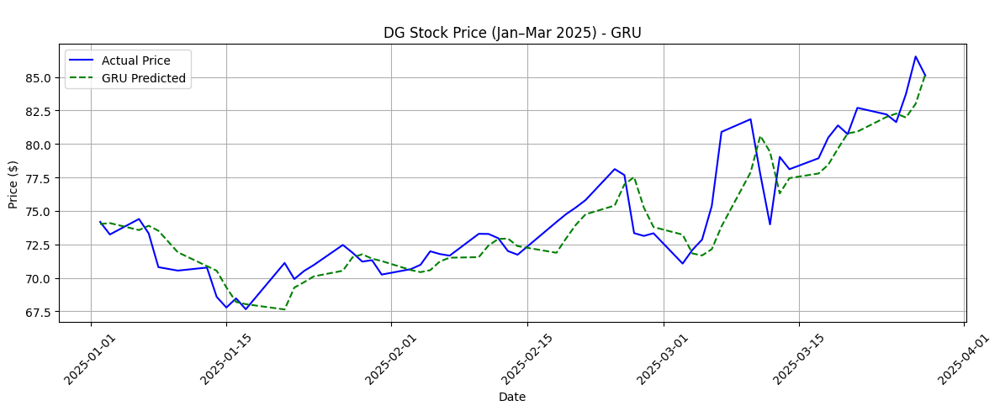


DG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.023552,0.000000,0.000000
1,2025-01-03,73.240685,74.090363,-1.269353,0.090253
2,2025-01-06,74.398102,73.570465,0.290881,-0.612086
3,2025-01-07,73.320587,73.893738,-1.161641,-0.175369
4,2025-01-08,70.799797,73.519882,-4.559742,-0.680417


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_dg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_dg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_dg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nDG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG GRU Model - Actual vs Predicted:")
gru_results.head()

## JNJ Stock Predictions

### JNJ - ARIMA


JNJ Evaluating ARIMA(1, 0, 1)...
R²: 0.8482 | MAE: 1.9532 | MSE: 10.6481 | RMSE: 3.2631

JNJ Evaluating ARIMA(0, 1, 1)...
R²: 0.9005 | MAE: 1.6288 | MSE: 6.9764 | RMSE: 2.6413

JNJ Evaluating ARIMA(1, 1, 0)...
R²: 0.8967 | MAE: 1.6644 | MSE: 7.2477 | RMSE: 2.6922

JNJ Best model: ARIMA(0, 1, 1) with R²: 0.9005

First 10 Predictions vs Actual:
Day 1: Actual = 141.66, Predicted = 156.60
Day 2: Actual = 141.83, Predicted = 139.08
Day 3: Actual = 141.31, Predicted = 141.84
Day 4: Actual = 143.84, Predicted = 141.29
Day 5: Actual = 139.94, Predicted = 143.89
Day 6: Actual = 139.73, Predicted = 139.99
Day 7: Actual = 142.10, Predicted = 139.74
Day 8: Actual = 142.38, Predicted = 142.08
Day 9: Actual = 142.60, Predicted = 142.38
Day 10: Actual = 145.35, Predicted = 142.59


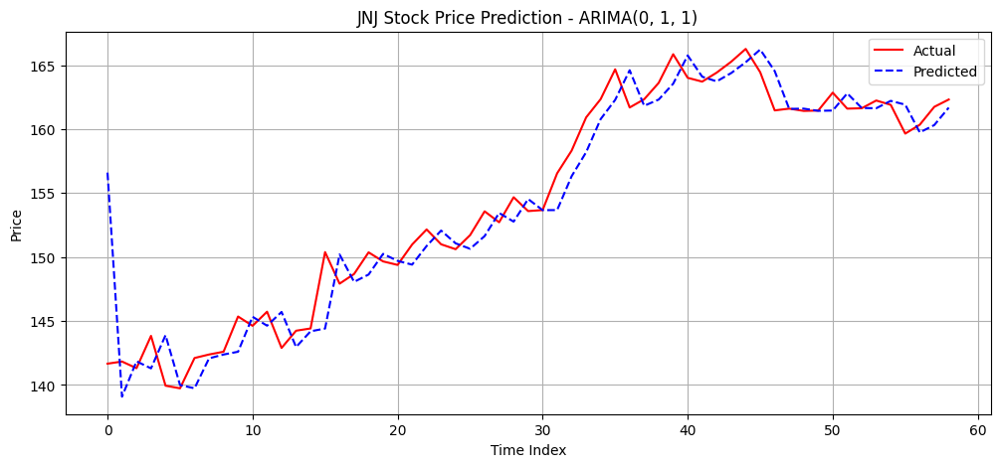

In [ ]:
## Preparing input sequence
full_series_jnj = jnj_stock['Adj Close'].values

## Using last 10 days of JNJ stock before prediction start
time_steps = 10
initial_window = full_series_jnj[-(time_steps + len(three_months_test_jnj)) : -len(three_months_test_jnj)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJNJ Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jnj, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJNJ Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jnj)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jnj[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jnj, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JNJ Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JNJ - LSTM


JNJ LSTM Evaluation:
R²: 0.9524 | MAE: 1.3899 | MSE: 3.3373 | RMSE: 1.8268


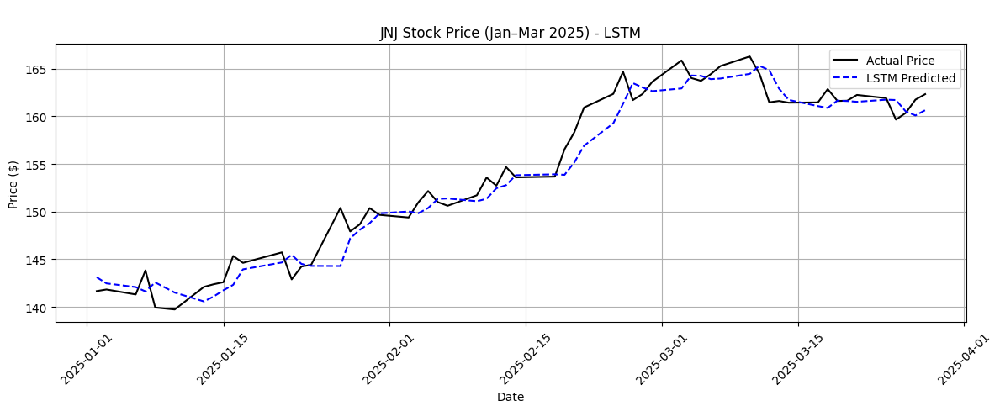


JNJ LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,143.111725,0.000000,0.000000
1,2025-01-03,141.829102,142.468933,0.118042,-0.449157
2,2025-01-06,141.307770,142.082001,-0.249969,-0.719523
3,2025-01-07,143.835678,141.626709,1.534497,-1.037663
4,2025-01-08,139.940536,142.570633,-1.215107,-0.378090


In [ ]:
## Preparing data
full_series = jnj_stock['Adj Close'].values.reshape(-1, 1)
test_series_jnj = three_months_jnj['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jnj['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Google stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jnj, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jnj, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jnj, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJNJ LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JNJ - GRU


JNJ GRU Evaluation:
R²: 0.9549 | MAE: 1.3651 | MSE: 3.1625 | RMSE: 1.7783


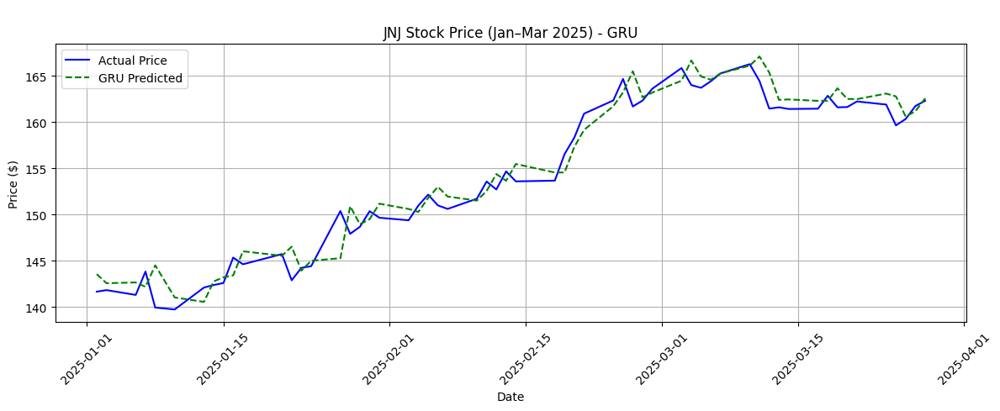


JNJ GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,143.558167,0.000000,0.000000
1,2025-01-03,141.829102,142.574051,0.118042,-0.685519
2,2025-01-06,141.307770,142.658798,-0.249969,-0.626481
3,2025-01-07,143.835678,142.184280,1.534497,-0.957024
4,2025-01-08,139.940536,144.511444,-1.215107,0.664032


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jnj, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jnj, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jnj, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJNJ GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ GRU Model - Actual vs Predicted:")
gru_results.head()

## JPM Stock Predictions

### JPM - ARIMA


JPM Evaluating ARIMA(1, 0, 1)...
R²: 0.4522 | MAE: 5.3104 | MSE: 117.0941 | RMSE: 10.8210

JPM Evaluating ARIMA(0, 1, 1)...
R²: 0.7539 | MAE: 3.9670 | MSE: 52.5983 | RMSE: 7.2525

JPM Evaluating ARIMA(1, 1, 0)...
R²: 0.8065 | MAE: 3.7403 | MSE: 41.3655 | RMSE: 6.4316

JPM Best model: ARIMA(1, 1, 0) with R²: 0.8065

First 10 Predictions vs Actual:
Day 1: Actual = 236.17, Predicted = 200.97
Day 2: Actual = 239.40, Predicted = 220.83
Day 3: Actual = 238.23, Predicted = 239.49
Day 4: Actual = 240.52, Predicted = 238.20
Day 5: Actual = 240.48, Predicted = 240.58
Day 6: Actual = 237.26, Predicted = 240.48
Day 7: Actual = 241.55, Predicted = 237.18
Day 8: Actual = 244.78, Predicted = 241.61
Day 9: Actual = 249.60, Predicted = 244.85
Day 10: Actual = 251.50, Predicted = 249.77


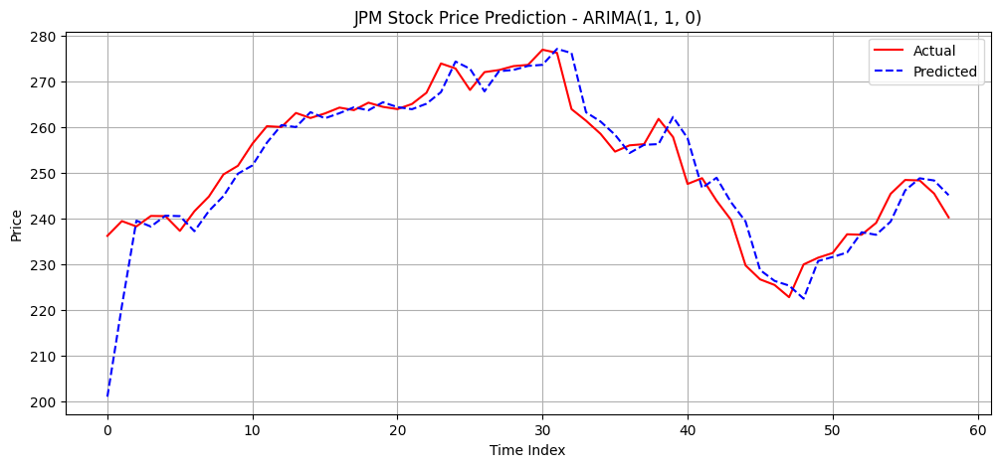

In [ ]:
## Preparing input sequence
full_series_jpm = jpm_stock['Adj Close'].values

## Using last 10 days of JPM stock before prediction start
time_steps = 10
initial_window = full_series_jpm[-(time_steps + len(three_months_test_jpm)) : -len(three_months_test_jpm)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJPM Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jpm, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJPM Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jpm)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jpm[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jpm, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JPM Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JPM - LSTM


JPM LSTM Evaluation:
R²: 0.8825 | MAE: 4.3969 | MSE: 25.1262 | RMSE: 5.0126


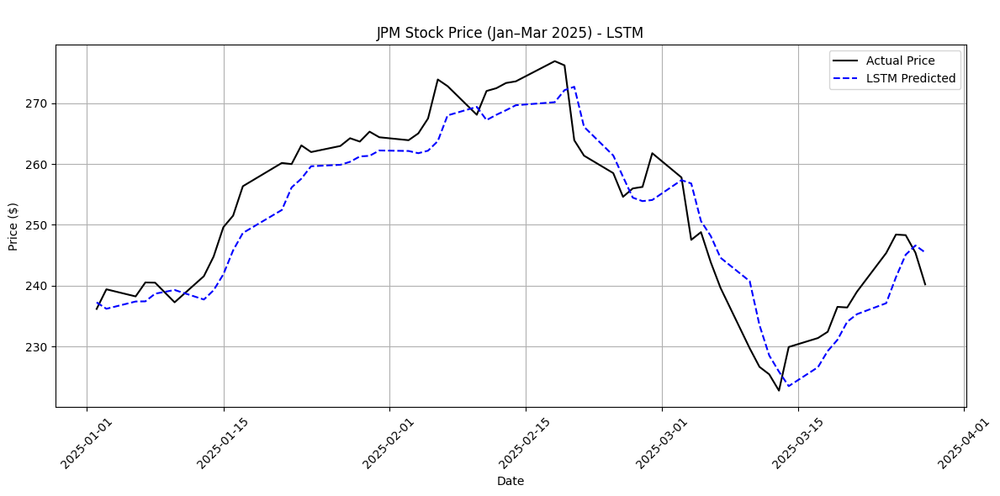


JPM LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,237.246780,0.000000,0.000000
1,2025-01-03,239.395020,236.192154,1.366664,-0.444525
2,2025-01-06,238.227859,237.390213,0.872455,0.060463
3,2025-01-07,240.522598,237.414948,1.844113,0.070882
4,2025-01-08,240.483047,238.673935,1.827366,0.601554


In [ ]:
## Preparing data
full_series = jpm_stock['Adj Close'].values.reshape(-1, 1)
test_series_jpm = three_months_jpm['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jpm['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jpm, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jpm, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jpm, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJPM LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 6))
plt.plot(test_dates, test_series_jpm.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JPM - GRU


JPM GRU Evaluation:
R²: 0.9276 | MAE: 3.1012 | MSE: 15.4811 | RMSE: 3.9346


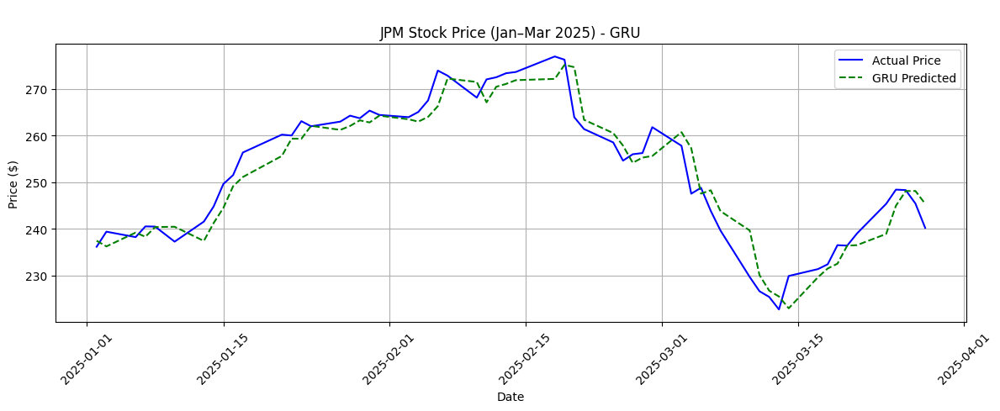


JPM GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,237.450790,0.000000,0.000000
1,2025-01-03,239.395020,236.237564,1.366664,-0.510937
2,2025-01-06,238.227859,239.194626,0.872455,0.734401
3,2025-01-07,240.522598,238.307922,1.844113,0.360978
4,2025-01-08,240.483047,240.376740,1.827366,1.232231


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jpm, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jpm, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jpm, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJPM GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jpm.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM GRU Model - Actual vs Predicted:")
gru_results.head()

## CFG Stock Predictions

### CFG - ARIMA


CFG Evaluating ARIMA(1, 0, 1)...
R²: 0.7742 | MAE: 0.7977 | MSE: 1.4529 | RMSE: 1.2054

CFG Evaluating ARIMA(0, 1, 1)...
R²: 0.8783 | MAE: 0.6540 | MSE: 0.7834 | RMSE: 0.8851

CFG Evaluating ARIMA(1, 1, 0)...
R²: 0.8776 | MAE: 0.6569 | MSE: 0.7877 | RMSE: 0.8875

CFG Best model: ARIMA(0, 1, 1) with R²: 0.8783

First 10 Predictions vs Actual:
Day 1: Actual = 42.37, Predicted = 38.51
Day 2: Actual = 43.30, Predicted = 42.16
Day 3: Actual = 43.54, Predicted = 43.35
Day 4: Actual = 43.44, Predicted = 43.56
Day 5: Actual = 43.52, Predicted = 43.42
Day 6: Actual = 42.08, Predicted = 43.53
Day 7: Actual = 42.91, Predicted = 41.86
Day 8: Actual = 44.41, Predicted = 43.00
Day 9: Actual = 45.75, Predicted = 44.62
Day 10: Actual = 45.48, Predicted = 45.96


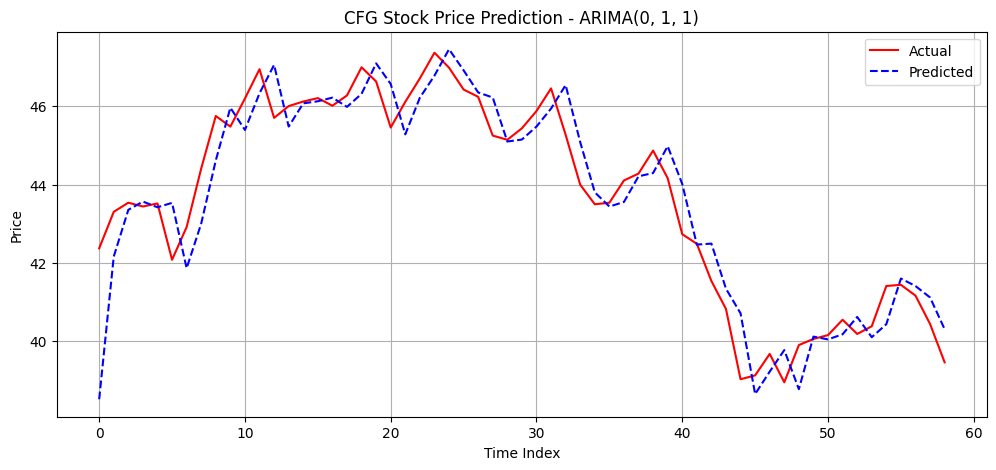

In [ ]:
## Preparing input sequence
full_series_cfg = cfg_stock['Adj Close'].values

## Using last 10 days of CFG stock before prediction start
time_steps = 10
initial_window = full_series_cfg[-(time_steps + len(three_months_test_cfg)) : -len(three_months_test_cfg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nCFG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_cfg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nCFG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_cfg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_cfg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_cfg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'CFG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### CFG - LSTM


CFG LSTM Evaluation:
R²: 0.8774 | MAE: 0.7464 | MSE: 0.7890 | RMSE: 0.8882


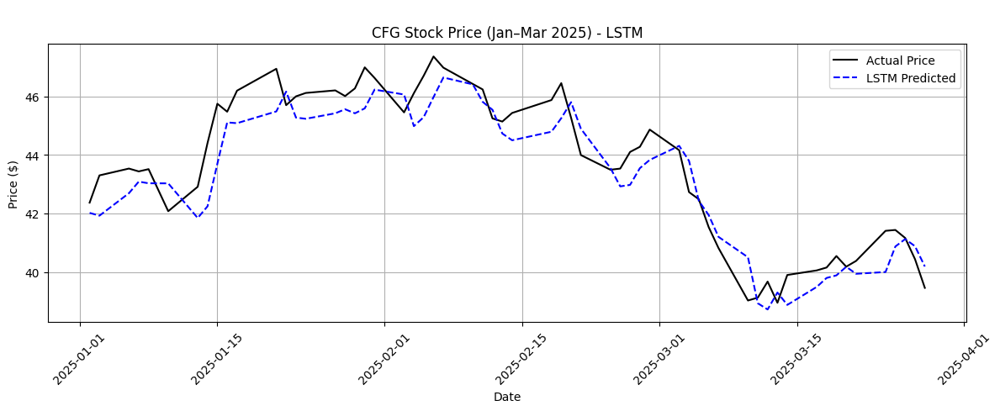


CFG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.020180,0.000000,0.000000
1,2025-01-03,43.302151,41.924809,2.201841,-0.226963
2,2025-01-06,43.535374,42.692760,2.752294,1.600611
3,2025-01-07,43.438198,43.088680,2.522940,2.542830
4,2025-01-08,43.515934,43.032242,2.706412,2.408516


In [ ]:
## Preparing data
full_series = cfg_stock['Adj Close'].values.reshape(-1, 1)
test_series_cfg = three_months_cfg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_cfg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_cfg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_cfg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_cfg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nCFG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### CFG - GRU


CFG GRU Evaluation:
R²: 0.9162 | MAE: 0.5926 | MSE: 0.5390 | RMSE: 0.7341


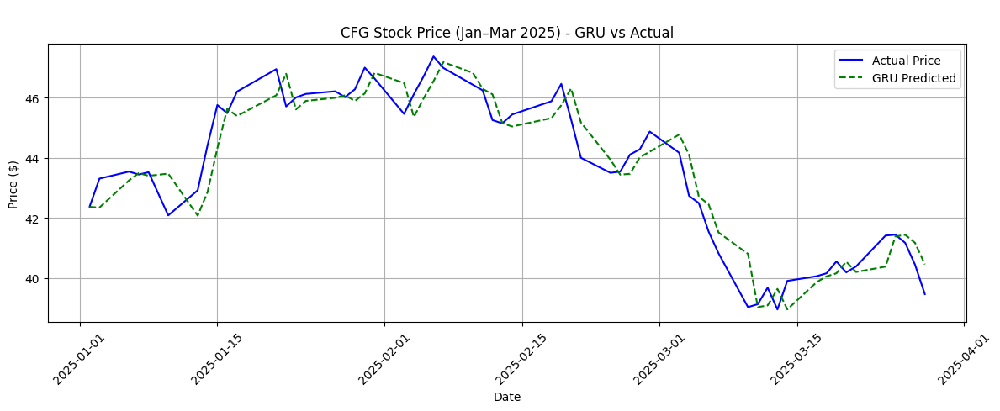


CFG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.362286,0.000000,0.000000
1,2025-01-03,43.302151,42.338276,2.201841,-0.056678
2,2025-01-06,43.535374,43.240356,2.752294,2.072763
3,2025-01-07,43.438198,43.484993,2.522940,2.650249
4,2025-01-08,43.515934,43.396049,2.706412,2.440298


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_cfg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_cfg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_cfg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nCFG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - GRU vs Actual')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG GRU Model - Actual vs Predicted:")
gru_results.head()

## 15-Training with XOM and Testing with WMT, DG, JNJ, JPM & CFG

In [ ]:
# Training
xom_stock = pd.read_csv('Stocks Data/EXXON_stock.csv')

# 10 year stock
wmt_stock = pd.read_csv('Stocks Data/Walmart_stock.csv')
dg_stock = pd.read_csv('Stocks Data/DG_stock.csv')
jnj_stock = pd.read_csv('Stocks Data/Johnson&Johnson_stock.csv')
jpm_stock = pd.read_csv('Stocks Data/JPMorgan_stock.csv')
cfg_stock = pd.read_csv('Stocks Data/CitizensFinancialGroup_stock.csv')

# Testing
three_months_wmt = pd.read_csv('Stocks Data/WMT3Months_Stock.csv')
three_months_dg = pd.read_csv('Stocks Data/DG3Months_Stock.csv')
three_months_jnj = pd.read_csv('Stocks Data/JNJ3Months_Stock.csv')
three_months_jpm = pd.read_csv('Stocks Data/JPM3Months_Stock.csv')
three_months_cfg = pd.read_csv('Stocks Data/CFG3Months_Stock.csv')

print("10 years XOM Stock for Training:", xom_stock.shape)
print("3 months WMT Stock for Testing :", three_months_wmt.shape)
print("3 months DG Stock for Testing :", three_months_dg.shape)
print("3 months JNJ Stock for Testing :", three_months_jnj.shape)
print("3 months JPM Stock for Testing :", three_months_jpm.shape)
print("3 months CFG Stock for Testing :", three_months_cfg.shape)

10 years XOM Stock for Training: (3018, 3)
3 months WMT Stock for Testing : (59, 3)
3 months DG Stock for Testing : (59, 3)
3 months JNJ Stock for Testing : (59, 3)
3 months JPM Stock for Testing : (59, 3)
3 months CFG Stock for Testing : (59, 3)


In [ ]:
xom_stock

,Date,Adj Close,Stock Name
0,2013-01-02,53.340271,XOM
1,2013-01-03,53.244072,XOM
2,2013-01-04,53.490604,XOM
3,2013-01-07,52.871269,XOM
4,2013-01-08,53.201984,XOM
...,...,...,...
3013,2024-12-20,103.973801,XOM
3014,2024-12-23,104.396103,XOM
3015,2024-12-24,104.494308,XOM
3016,2024-12-26,104.582695,XOM


In [ ]:
# Date Conversion
xom_stock['Date'] = pd.to_datetime(xom_stock['Date'])
three_months_wmt['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_dg['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jnj['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jpm['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_cfg['Date'] = pd.to_datetime(three_months_wmt['Date'])

# Sort data
xom_stock.sort_values('Date', inplace=True)
three_months_wmt.sort_values('Date', inplace=True)
three_months_dg.sort_values('Date', inplace=True)
three_months_jnj.sort_values('Date', inplace=True)
three_months_jpm.sort_values('Date', inplace=True)
three_months_cfg.sort_values('Date', inplace=True)

# Extract series
train_xom = xom_stock['Adj Close'].values

three_months_test_wmt = three_months_wmt['Adj Close'].values
three_months_test_dg = three_months_dg['Adj Close'].values
three_months_test_jnj = three_months_jnj['Adj Close'].values
three_months_test_jpm = three_months_jpm['Adj Close'].values
three_months_test_cfg = three_months_cfg['Adj Close'].values

three_months_dates_wmt = three_months_wmt['Date'].values
three_months_dates_dg = three_months_dg['Date'].values
three_months_dates_jnj = three_months_jnj['Date'].values
three_months_dates_jpm = three_months_jpm['Date'].values
three_months_dates_cfg = three_months_cfg['Date'].values

In [ ]:
train_xom

array([ 53.340271  ,  53.24407196,  53.4906044 , ..., 104.49430847,
       104.58269501, 104.57288361])

In [ ]:
three_months_test_wmt

array([ 89.53704071,  90.31303406,  90.95968628,  90.34287262,
        91.32778931,  92.52161407,  91.05917358,  90.32298279,
        90.87014771,  90.83036041,  91.4670639 ,  92.60120392,
        92.75043488,  93.32744598,  94.27256775,  96.89897919,
        96.78955078,  96.99845886,  98.14255524,  97.65507507,
        99.02796936, 100.25164795, 101.93294525, 102.32094574,
       100.62968445, 102.39058685, 101.94290161, 103.07704163,
       104.5096283 , 103.50482941, 103.24616241, 103.46502686,
        96.70995331,  94.29244995,  93.18816376,  97.18748474,
        95.70514679,  96.29212189,  98.10275269,  97.08799744,
        94.48147583,  95.48628998,  94.15317535,  91.24819946,
        87.36826324,  86.99021912,  84.76173401,  84.06533813,
        84.91095734,  87.01010895,  85.14972687,  85.88592529,
        85.36859894,  85.77262115,  87.27897644,  84.55556488,
        85.00447845,  85.42346191,  84.94462585])

In [ ]:
three_months_test_dg

array([74.18231964, 73.24068451, 74.39810181, 73.32058716, 70.79979706,
       70.54277039, 70.77013397, 68.58544159, 67.78472137, 68.46681976,
       67.65621185, 71.11612701, 69.91010284, 70.51311493, 70.95796204,
       72.46055603, 71.87730408, 71.21498108, 71.32372284, 70.24620819,
       70.65151215, 70.9777298 , 71.98604584, 71.77845764, 71.65982819,
       73.29093933, 73.28104401, 72.96470642, 72.0058136 , 71.72902679,
       74.17073822, 74.76387024, 75.25814056, 75.81172943, 78.12493134,
       77.68008423, 73.34036255, 73.13276672, 73.33047485, 71.0667038 ,
       72.08490753, 72.85596466, 75.36688232, 80.90274811, 81.85176086,
       77.73939514, 73.99279785, 79.03439331, 78.11504364, 78.93553925,
       80.47767639, 81.387146  , 80.73469543, 82.70191193, 82.2076416 ,
       81.63427734, 83.72999573, 86.53746796, 85.11396027])

In [ ]:
three_months_test_jnj

array([141.66188049, 141.82910156, 141.30776978, 143.8356781 ,
       139.9405365 , 139.73396301, 142.10450745, 142.37991333,
       142.59632874, 145.35047913, 144.62258911, 145.72424316,
       142.89141846, 144.23898315, 144.41603088, 150.38664246,
       147.91773987, 148.67512512, 150.36697388, 149.65875244,
       149.3833313 , 150.9768219 , 152.15716553, 150.99647522,
       150.61286926, 151.71455383, 153.57359314, 152.71783447,
       154.67524719, 153.59326172, 153.6725769 , 156.54792786,
       158.32270813, 160.92044067, 162.34820557, 164.67822266,
       161.69381714, 162.33828735, 163.61732483, 165.85810852,
       164.01391602, 163.71646118, 164.42044067, 165.27313232,
       166.27453613, 164.45018005, 161.46577454, 161.60458374,
       161.42610168, 161.45585632, 162.85386658, 161.60458374,
       161.63432312, 162.23913574, 161.90202332, 159.65132141,
       160.34536743, 161.74339294, 162.31846619])

In [ ]:
three_months_test_jpm

array([236.16740417, 239.39501953, 238.2278595 , 240.52259827,
       240.48304749, 237.25852966, 241.55130005, 244.77578735,
       249.60267639, 251.50177002, 256.33853149, 260.16638184,
       259.97845459, 263.05459595, 261.95669556, 262.95568848,
       264.23165894, 263.67773438, 265.30978394, 264.38989258,
       263.90524292, 265.02294922, 267.48580933, 273.88537598,
       272.79736328, 268.08920288, 271.9961853 , 272.45120239,
       273.31170654, 273.57876587, 276.90219116, 276.20980835,
       263.89535522, 261.36322021, 258.49481201, 254.59768677,
       255.97254944, 256.22970581, 261.76876831, 257.78262329,
       247.52552795, 248.79159546, 243.85591125, 239.64228821,
       229.69181824, 226.64535522, 225.4188385 , 222.73835754,
       229.90942383, 231.38319397, 232.41188049, 236.50680542,
       236.40789795, 238.99937439, 245.359375  , 248.39595032,
       248.29704285, 245.41871643, 240.20610046])

In [ ]:
three_months_test_cfg

array([42.36924744, 43.30215073, 43.53537369, 43.43819809, 43.51593399,
       42.07771683, 42.9134407 , 44.40996933, 45.75101471, 45.47891617,
       46.19802856, 46.94629288, 45.7024231 , 46.00366974, 46.12028503,
       46.2077446 , 46.0133934 , 46.27576828, 46.99488068, 46.63217545,
       45.45583344, 46.11262512, 46.71059799, 47.36738968, 46.9850769 ,
       46.42631531, 46.2400589 , 45.2499733 , 45.14213943, 45.43622589,
       45.87735748, 46.45572281, 45.26957703, 43.99520874, 43.49526215,
       43.53447342, 44.10303879, 44.27948761, 44.86766434, 44.1618576 ,
       42.73064041, 42.485569  , 41.53469086, 40.81908417, 39.02516556,
       39.12319183, 39.67214966, 38.9467392 , 39.89761734, 40.05445862,
       40.15248871, 40.54460526, 40.18190002, 40.37795258, 41.40725708,
       41.43666458, 41.16218567, 40.43677139, 39.45648956])

## WMT Stock Prediction

### WMT - ARIMA

In [ ]:
## Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        ## Performing Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

## Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train_xom)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -0.4689
p-value: 0.8980
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -10.9743
p-value: 0.0000
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

## Preparing input sequence
full_series_wmt = wmt_stock['Adj Close'].values

## Using last 10 days of WMT stock before prediction start
time_steps = 10
initial_window = full_series_wmt[-(time_steps + len(three_months_test_wmt)) : -len(three_months_test_wmt)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse



WMT Evaluating ARIMA(1, 0, 1)...
R²: 0.8033 | MAE: 1.7780 | MSE: 7.0576 | RMSE: 2.6566

WMT Evaluating ARIMA(0, 1, 1)...
R²: 0.8525 | MAE: 1.5353 | MSE: 5.2910 | RMSE: 2.3002

WMT Evaluating ARIMA(1, 1, 0)...
R²: 0.8749 | MAE: 1.4302 | MSE: 4.4877 | RMSE: 2.1184

WMT Best model: ARIMA(1, 1, 0) with R²: 0.8749

First 10 Predictions vs Actual:
Day 1: Actual = 89.54, Predicted = 79.84
Day 2: Actual = 90.31, Predicted = 89.37
Day 3: Actual = 90.96, Predicted = 90.37
Day 4: Actual = 90.34, Predicted = 91.01
Day 5: Actual = 91.33, Predicted = 90.30
Day 6: Actual = 92.52, Predicted = 91.39
Day 7: Actual = 91.06, Predicted = 92.61
Day 8: Actual = 90.32, Predicted = 90.98
Day 9: Actual = 90.87, Predicted = 90.27
Day 10: Actual = 90.83, Predicted = 90.90


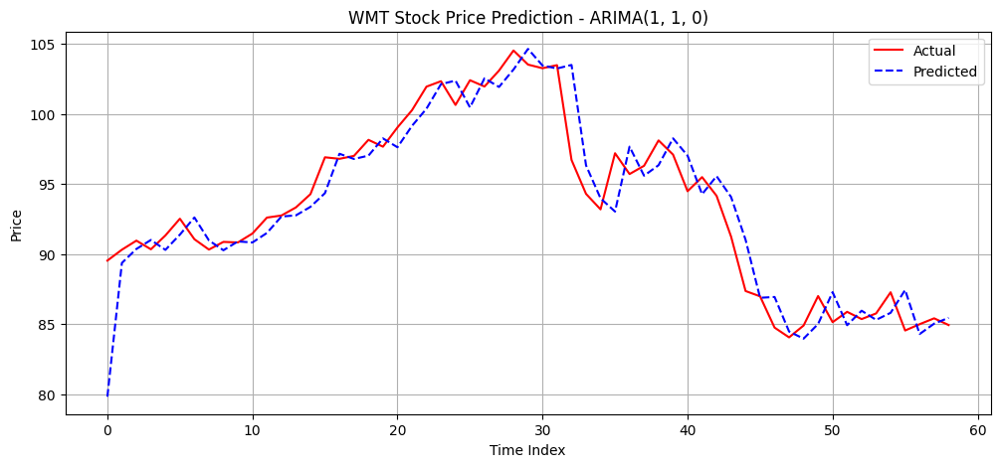

In [ ]:
orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nWMT Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_wmt, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nWMT Best model: ARIMA{best_order} with R²: {best_r2:.4f}")

def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_wmt)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_wmt[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_wmt, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'WMT Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### WMT - LSTM

In [ ]:
## Preparing data
full_series = wmt_stock['Adj Close'].values.reshape(-1, 1)
test_series_wmt = three_months_wmt['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_wmt['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Microsoft stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.48210107],
        [-0.48678674],
        [-0.48401787],
        ...,
        [-0.48859722],
        [-0.49211155],
        [-0.48486995]],

       [[-0.48678674],
        [-0.48401787],
        [-0.49104684],
        ...,
        [-0.49211155],
        [-0.48486995],
        [-0.48242072]],

       [[-0.48401787],
        [-0.49104684],
        [-0.48902342],
        ...,
        [-0.48486995],
        [-0.48242072],
        [-0.48625439]],

       ...,

       [[ 2.64706809],
        [ 2.66383472],
        [ 2.62825659],
        ...,
        [ 2.60850217],
        [ 2.56095968],
        [ 2.48349875]],

       [[ 2.66383472],
        [ 2.62825659],
        [ 2.64333917],
        ...,
        [ 2.56095968],
        [ 2.48349875],
        [ 2.57899296]],

       [[ 2.62825659],
        [ 2.64333917],
        [ 2.66874983],
        ...,
        [ 2.48349875],
        [ 2.57899296],
        [ 2.58350167]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


WMT LSTM Evaluation:
R²: 0.8720 | MAE: 1.6522 | MSE: 4.5919 | RMSE: 2.1429


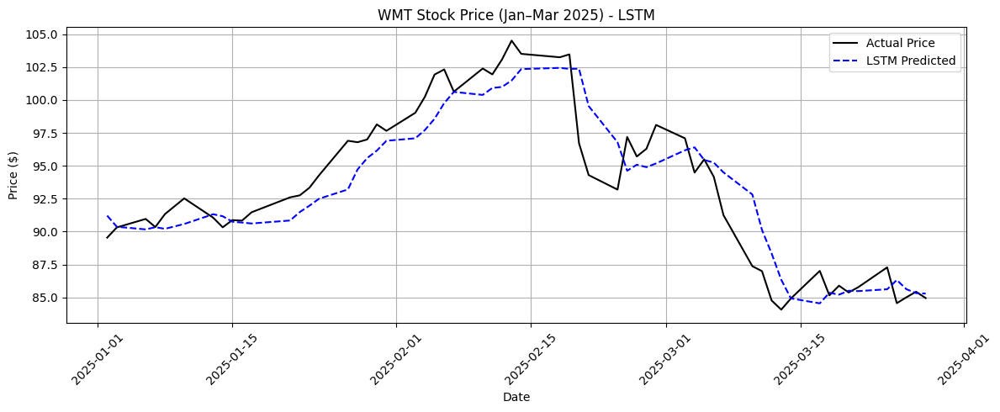


WMT LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.209732,0.000000,0.000000
1,2025-01-03,90.313034,90.365456,0.866673,-0.925642
2,2025-01-06,90.959686,90.163467,1.588891,-1.147097
3,2025-01-07,90.342873,90.330894,0.899998,-0.963533
4,2025-01-08,91.327789,90.208130,2.000009,-1.098132


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_wmt, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_wmt, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_wmt, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nWMT LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT LSTM Model - Actual vs Predicted:")
lstm_results.head()

In [ ]:
for i in range(len(test_dates)):
    date = test_dates[i]
    actual_price = test_series_wmt.flatten()[i]
    predicted_price = lstm_predicted_prices[i]
    sequence_unscaled = scaler.inverse_transform(input_sequences[i].reshape(-1, 1)).flatten()

    print(f"\nDate: {date}")
    print(f"Sequence (Walmart - Last 10 Days Before Prediction): {sequence_unscaled}")
    print(f"Input (Last Timestep Value): {sequence_unscaled[-1]:.2f}")
    print(f"Actual Price (Walmart): {actual_price:.2f}")
    print(f"Predicted Price: {predicted_price:.2f}")


Date: 2025-01-02T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.7651825  94.38199615 94.92916107 93.06878662 92.91955566 91.76551819
 89.88524628 92.2032547  92.31269836 91.18850708]
Input (Last Timestep Value): 91.19
Actual Price (Walmart): 89.54
Predicted Price: 91.21

Date: 2025-01-03T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.38199615 94.92916107 93.06878662 92.91955566 91.76551819 89.88524628
 92.2032547  92.31269836 91.18850708 89.53704071]
Input (Last Timestep Value): 89.54
Actual Price (Walmart): 90.31
Predicted Price: 90.37

Date: 2025-01-06T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.92916107 93.06878662 92.91955566 91.76551819 89.88524628 92.2032547
 92.31269836 91.18850708 89.53704071 90.31303406]
Input (Last Timestep Value): 90.31
Actual Price (Walmart): 90.96
Predicted Price: 90.16

Date: 2025-01-07T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.0687

### WMT - GRU


WMT GRU Evaluation:
R²: 0.9109 | MAE: 1.3094 | MSE: 3.1966 | RMSE: 1.7879


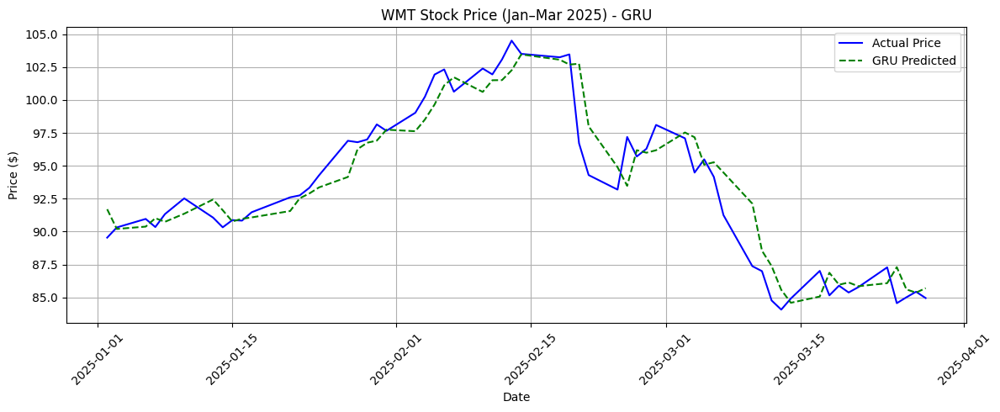


WMT GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.695374,0.000000,0.000000
1,2025-01-03,90.313034,90.197601,0.866673,-1.633424
2,2025-01-06,90.959686,90.375793,1.588891,-1.439089
3,2025-01-07,90.342873,91.015625,0.899998,-0.741309
4,2025-01-08,91.327789,90.740356,2.000009,-1.041508


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_wmt, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_wmt, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_wmt, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nWMT GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT GRU Model - Actual vs Predicted:")
gru_results.head()

## DG Stock Prediction

### DG - ARIMA


DG Evaluating ARIMA(1, 0, 1)...
R²: 0.7739 | MAE: 1.4985 | MSE: 4.7552 | RMSE: 2.1806

DG Evaluating ARIMA(0, 1, 1)...
R²: 0.8126 | MAE: 1.4177 | MSE: 3.9413 | RMSE: 1.9853

DG Evaluating ARIMA(1, 1, 0)...
R²: 0.8116 | MAE: 1.4185 | MSE: 3.9634 | RMSE: 1.9908

DG Best model: ARIMA(0, 1, 1) with R²: 0.8126

First 10 Predictions vs Actual:
Day 1: Actual = 74.18, Predicted = 79.79
Day 2: Actual = 73.24, Predicted = 74.39
Day 3: Actual = 74.40, Predicted = 73.21
Day 4: Actual = 73.32, Predicted = 74.44
Day 5: Actual = 70.80, Predicted = 73.30
Day 6: Actual = 70.54, Predicted = 70.66
Day 7: Actual = 70.77, Predicted = 70.54
Day 8: Actual = 68.59, Predicted = 70.78
Day 9: Actual = 67.78, Predicted = 68.47
Day 10: Actual = 68.47, Predicted = 67.74


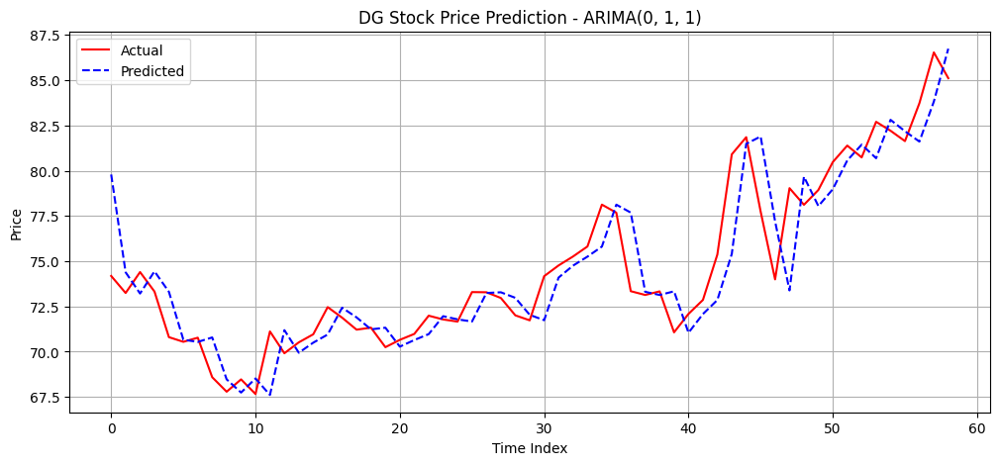

In [ ]:
## Preparing input sequence
full_series_dg = dg_stock['Adj Close'].values

## Using last 10 days of DG stock before prediction start
time_steps = 10
initial_window = full_series_dg[-(time_steps + len(three_months_test_dg)) : -len(three_months_test_dg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nDG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_dg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nDG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_dg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_dg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_dg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'DG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### DG - LSTM


DG LSTM Evaluation:
R²: 0.7676 | MAE: 1.6603 | MSE: 4.8884 | RMSE: 2.2110


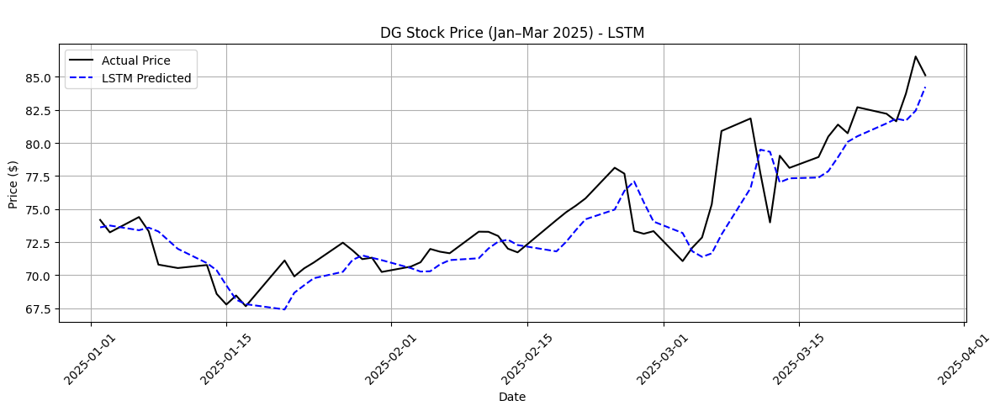


DG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,73.616608,0.000000,0.000000
1,2025-01-03,73.240685,73.755440,-1.269353,0.188589
2,2025-01-06,74.398102,73.402054,0.290881,-0.291449
3,2025-01-07,73.320587,73.595383,-1.161641,-0.028831
4,2025-01-08,70.799797,73.307014,-4.559742,-0.420547


In [ ]:
## Preparing data
full_series = dg_stock['Adj Close'].values.reshape(-1, 1)
test_series_dg = three_months_dg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_dg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Microsoft stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_dg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_dg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_dg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nDG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### DG Stock - GRU


DG GRU Evaluation:
R²: 0.8294 | MAE: 1.3767 | MSE: 3.5881 | RMSE: 1.8942


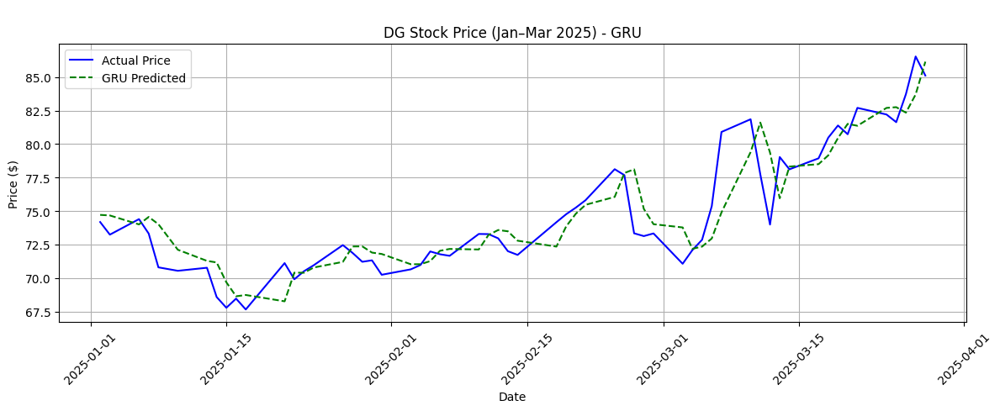


DG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.715370,0.000000,0.000000
1,2025-01-03,73.240685,74.672279,-1.269353,-0.057673
2,2025-01-06,74.398102,74.004822,0.290881,-0.951004
3,2025-01-07,73.320587,74.561974,-1.161641,-0.205308
4,2025-01-08,70.799797,74.020187,-4.559742,-0.930440


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_dg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_dg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_dg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nDG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG GRU Model - Actual vs Predicted:")
gru_results.head()

## JNJ Stock Predictions

### JNJ - ARIMA


JNJ Evaluating ARIMA(1, 0, 1)...
R²: 0.8482 | MAE: 1.9532 | MSE: 10.6481 | RMSE: 3.2631

JNJ Evaluating ARIMA(0, 1, 1)...
R²: 0.9005 | MAE: 1.6288 | MSE: 6.9764 | RMSE: 2.6413

JNJ Evaluating ARIMA(1, 1, 0)...
R²: 0.8967 | MAE: 1.6644 | MSE: 7.2477 | RMSE: 2.6922

JNJ Best model: ARIMA(0, 1, 1) with R²: 0.9005

First 10 Predictions vs Actual:
Day 1: Actual = 141.66, Predicted = 156.60
Day 2: Actual = 141.83, Predicted = 139.08
Day 3: Actual = 141.31, Predicted = 141.84
Day 4: Actual = 143.84, Predicted = 141.29
Day 5: Actual = 139.94, Predicted = 143.89
Day 6: Actual = 139.73, Predicted = 139.99
Day 7: Actual = 142.10, Predicted = 139.74
Day 8: Actual = 142.38, Predicted = 142.08
Day 9: Actual = 142.60, Predicted = 142.38
Day 10: Actual = 145.35, Predicted = 142.59


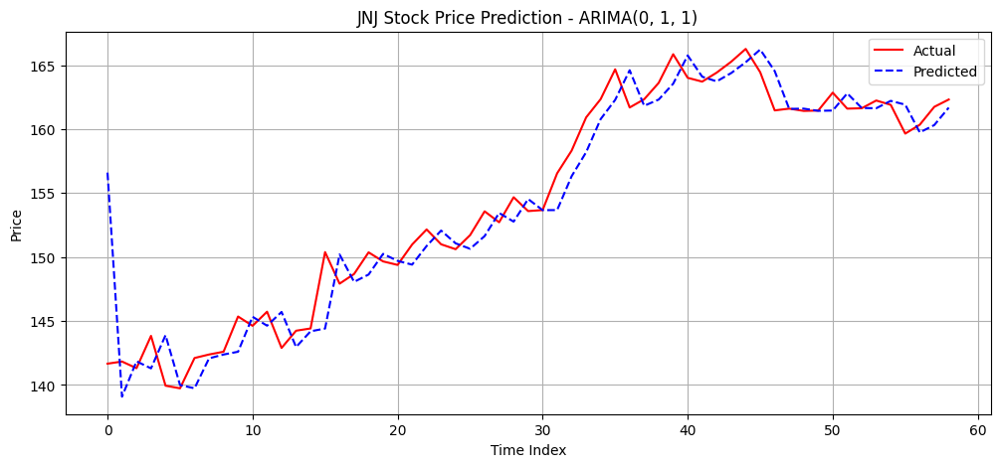

In [ ]:
## Preparing input sequence
full_series_jnj = jnj_stock['Adj Close'].values

## Using last 10 days of JNJ stock before prediction start
time_steps = 10
initial_window = full_series_jnj[-(time_steps + len(three_months_test_jnj)) : -len(three_months_test_jnj)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJNJ Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jnj, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJNJ Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jnj)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jnj[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jnj, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JNJ Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JNJ - LSTM


JNJ LSTM Evaluation:
R²: 0.9569 | MAE: 1.3771 | MSE: 3.0237 | RMSE: 1.7389


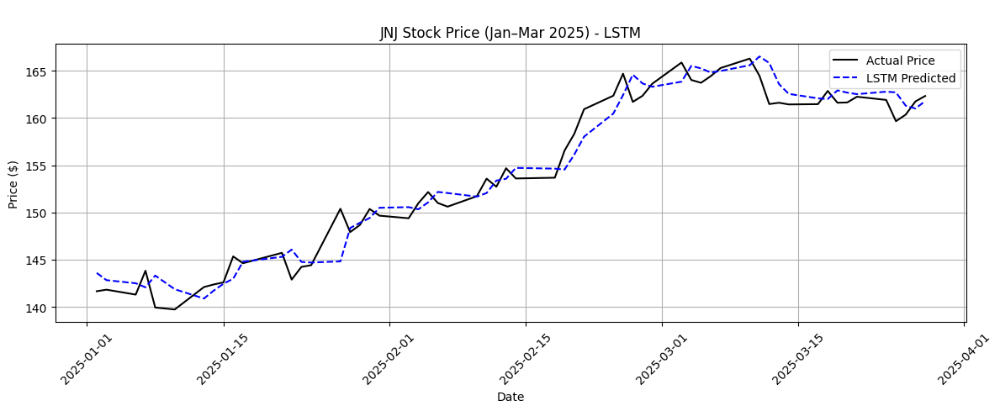


JNJ LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,143.597824,0.000000,0.000000
1,2025-01-03,141.829102,142.834137,0.118042,-0.531822
2,2025-01-06,141.307770,142.507126,-0.249969,-0.759548
3,2025-01-07,143.835678,142.075943,1.534497,-1.059824
4,2025-01-08,139.940536,143.322449,-1.215107,-0.191766


In [ ]:
## Preparing data
full_series = jnj_stock['Adj Close'].values.reshape(-1, 1)
test_series_jnj = three_months_jnj['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jnj['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jnj, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jnj, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jnj, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJNJ LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JNJ - GRU


JNJ GRU Evaluation:
R²: 0.9587 | MAE: 1.3278 | MSE: 2.8929 | RMSE: 1.7009


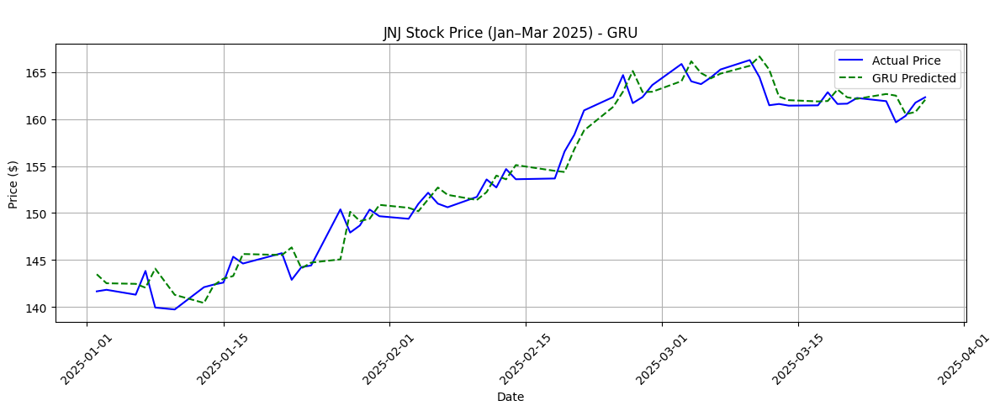


JNJ GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,143.480682,0.000000,0.000000
1,2025-01-03,141.829102,142.523773,0.118042,-0.666928
2,2025-01-06,141.307770,142.460831,-0.249969,-0.710791
3,2025-01-07,143.835678,142.050766,1.534497,-0.996590
4,2025-01-08,139.940536,144.079651,-1.215107,0.417459


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jnj, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jnj, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jnj, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJNJ GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ GRU Model - Actual vs Predicted:")
gru_results.head()

## JPM Stock Predictions

### JPM - ARIMA


JPM Evaluating ARIMA(1, 0, 1)...
R²: 0.4522 | MAE: 5.3104 | MSE: 117.0941 | RMSE: 10.8210

JPM Evaluating ARIMA(0, 1, 1)...
R²: 0.7539 | MAE: 3.9670 | MSE: 52.5983 | RMSE: 7.2525

JPM Evaluating ARIMA(1, 1, 0)...
R²: 0.8065 | MAE: 3.7403 | MSE: 41.3655 | RMSE: 6.4316

JPM Best model: ARIMA(1, 1, 0) with R²: 0.8065

First 10 Predictions vs Actual:
Day 1: Actual = 236.17, Predicted = 200.97
Day 2: Actual = 239.40, Predicted = 220.83
Day 3: Actual = 238.23, Predicted = 239.49
Day 4: Actual = 240.52, Predicted = 238.20
Day 5: Actual = 240.48, Predicted = 240.58
Day 6: Actual = 237.26, Predicted = 240.48
Day 7: Actual = 241.55, Predicted = 237.18
Day 8: Actual = 244.78, Predicted = 241.61
Day 9: Actual = 249.60, Predicted = 244.85
Day 10: Actual = 251.50, Predicted = 249.77


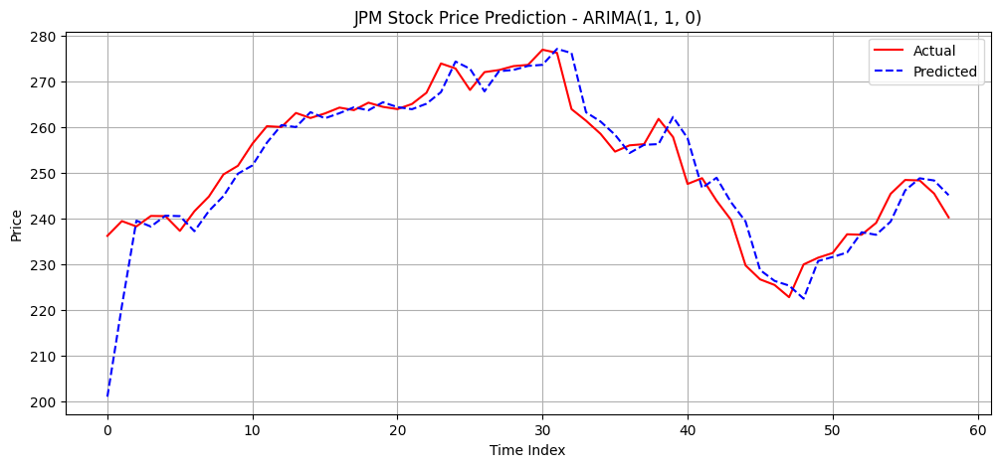

In [ ]:
## Preparing input sequence
full_series_jpm = jpm_stock['Adj Close'].values

## Using last 10 days of JPM stock before prediction start
time_steps = 10
initial_window = full_series_jpm[-(time_steps + len(three_months_test_jpm)) : -len(three_months_test_jpm)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJPM Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jpm, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJPM Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jpm)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jpm[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jpm, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JPM Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JPM - LSTM


JPM LSTM Evaluation:
R²: 0.8595 | MAE: 4.8779 | MSE: 30.0236 | RMSE: 5.4794


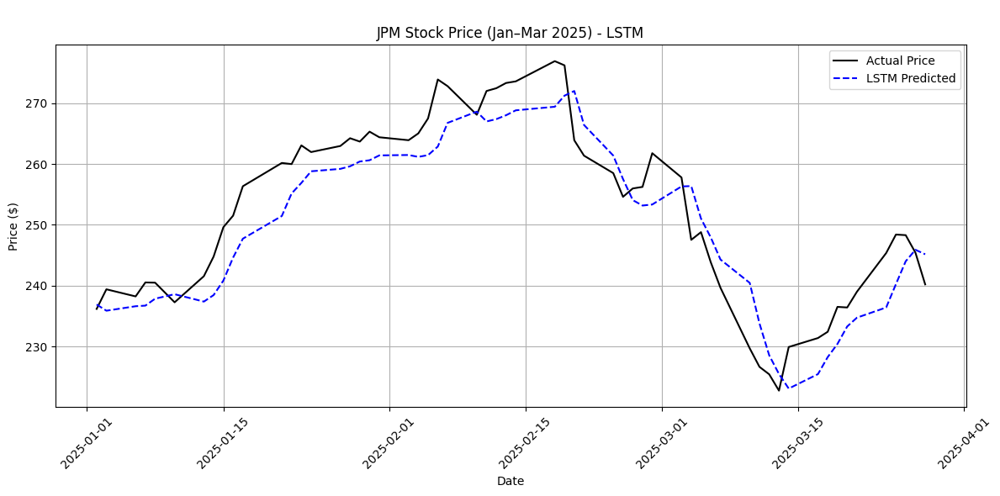


JPM LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,236.895218,0.000000,0.000000
1,2025-01-03,239.395020,235.876602,1.366664,-0.429988
2,2025-01-06,238.227859,236.612671,0.872455,-0.119269
3,2025-01-07,240.522598,236.712646,1.844113,-0.077069
4,2025-01-08,240.483047,237.853622,1.827366,0.404572


In [ ]:
## Preparing data
full_series = jpm_stock['Adj Close'].values.reshape(-1, 1)
test_series_jpm = three_months_jpm['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jpm['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jpm, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jpm, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jpm, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJPM LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 6))
plt.plot(test_dates, test_series_jpm.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JPM - GRU


JPM GRU Evaluation:
R²: 0.9104 | MAE: 3.6843 | MSE: 19.1571 | RMSE: 4.3769


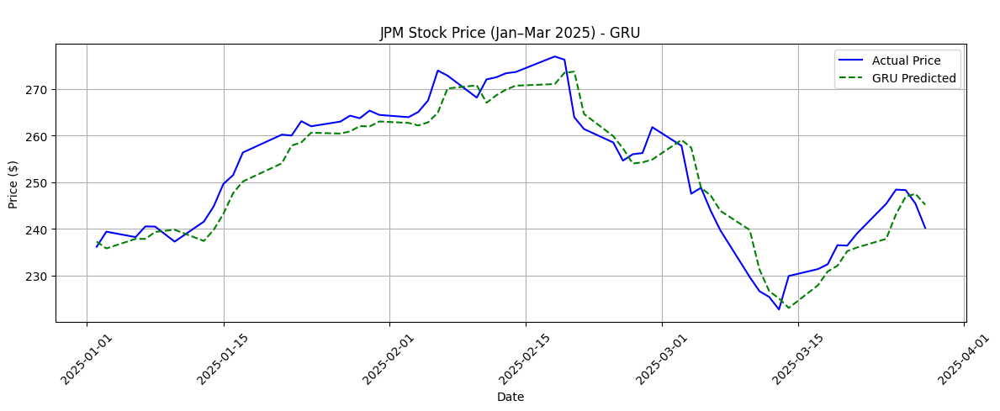


JPM GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,237.273178,0.000000,0.000000
1,2025-01-03,239.395020,235.802032,1.366664,-0.620019
2,2025-01-06,238.227859,237.859085,0.872455,0.246930
3,2025-01-07,240.522598,237.843048,1.844113,0.240171
4,2025-01-08,240.483047,239.336533,1.827366,0.869608


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jpm, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jpm, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jpm, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJPM GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jpm.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM GRU Model - Actual vs Predicted:")
gru_results.head()

## CFG Stock Predictions

### CFG - ARIMA


CFG Evaluating ARIMA(1, 0, 1)...
R²: 0.7742 | MAE: 0.7977 | MSE: 1.4529 | RMSE: 1.2054

CFG Evaluating ARIMA(0, 1, 1)...
R²: 0.8783 | MAE: 0.6540 | MSE: 0.7834 | RMSE: 0.8851

CFG Evaluating ARIMA(1, 1, 0)...
R²: 0.8776 | MAE: 0.6569 | MSE: 0.7877 | RMSE: 0.8875

CFG Best model: ARIMA(0, 1, 1) with R²: 0.8783

First 10 Predictions vs Actual:
Day 1: Actual = 42.37, Predicted = 38.51
Day 2: Actual = 43.30, Predicted = 42.16
Day 3: Actual = 43.54, Predicted = 43.35
Day 4: Actual = 43.44, Predicted = 43.56
Day 5: Actual = 43.52, Predicted = 43.42
Day 6: Actual = 42.08, Predicted = 43.53
Day 7: Actual = 42.91, Predicted = 41.86
Day 8: Actual = 44.41, Predicted = 43.00
Day 9: Actual = 45.75, Predicted = 44.62
Day 10: Actual = 45.48, Predicted = 45.96


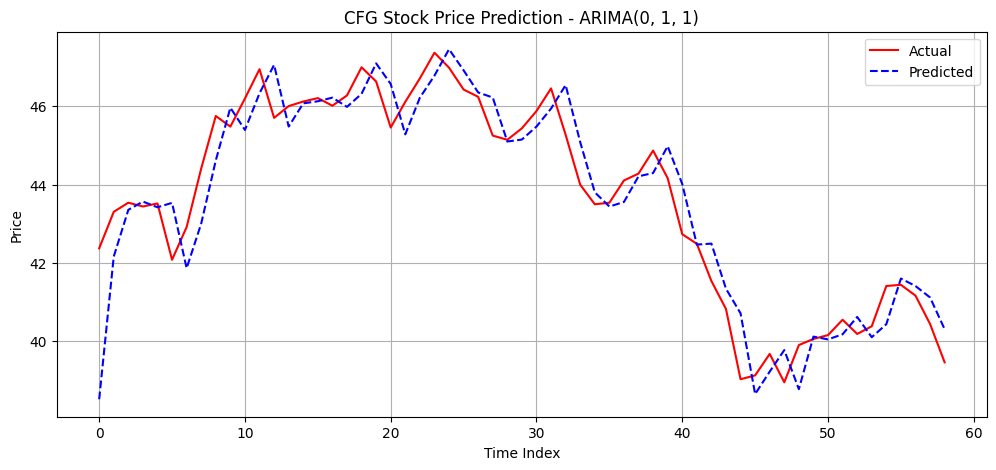

In [ ]:
## Preparing input sequence
full_series_cfg = cfg_stock['Adj Close'].values

## Using last 10 days of CFG stock before prediction start
time_steps = 10
initial_window = full_series_cfg[-(time_steps + len(three_months_test_cfg)) : -len(three_months_test_cfg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nCFG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_cfg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nCFG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_cfg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_cfg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_cfg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'CFG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### CFG - LSTM


CFG LSTM Evaluation:
R²: 0.9066 | MAE: 0.6232 | MSE: 0.6008 | RMSE: 0.7751


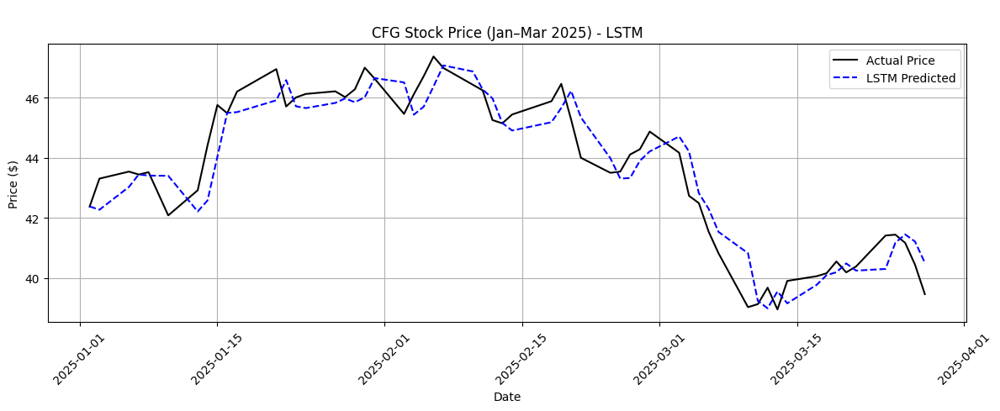


CFG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.375778,0.000000,0.000000
1,2025-01-03,43.302151,42.266098,2.201841,-0.258827
2,2025-01-06,43.535374,43.024559,2.752294,1.531017
3,2025-01-07,43.438198,43.441238,2.522940,2.514315
4,2025-01-08,43.515934,43.401775,2.706412,2.421188


In [ ]:
## Preparing data
full_series = cfg_stock['Adj Close'].values.reshape(-1, 1)
test_series_cfg = three_months_cfg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_cfg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_cfg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_cfg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_cfg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nCFG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### CFG - GRU


CFG GRU Evaluation:
R²: 0.9117 | MAE: 0.5940 | MSE: 0.5679 | RMSE: 0.7536


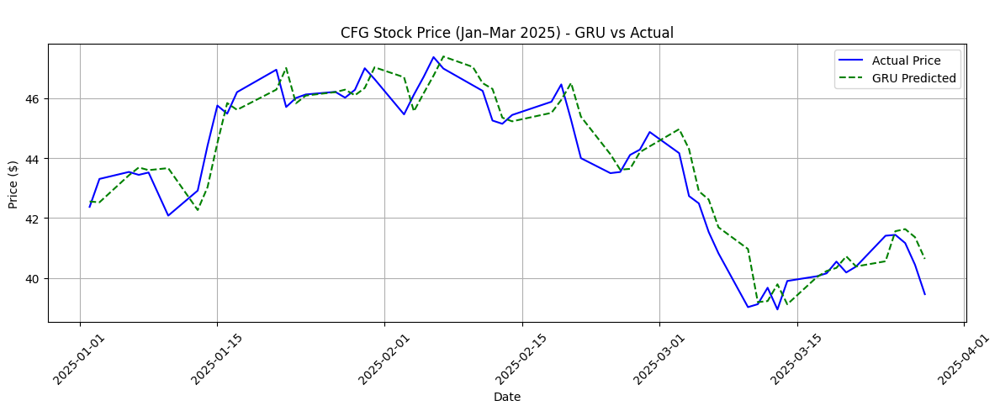


CFG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.550472,0.000000,0.000000
1,2025-01-03,43.302151,42.521816,2.201841,-0.067347
2,2025-01-06,43.535374,43.423950,2.752294,2.052808
3,2025-01-07,43.438198,43.684292,2.522940,2.664649
4,2025-01-08,43.515934,43.595619,2.706412,2.456248


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_cfg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_cfg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_cfg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nCFG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - GRU vs Actual')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG GRU Model - Actual vs Predicted:")
gru_results.head()

## 16-Training with FANG and Testing with WMT, DG, JNJ, JPM & CFG

In [ ]:
# Training
fang_stock = pd.read_csv('Stocks Data/Diamondback_stock.csv')

# 10 year stock
wmt_stock = pd.read_csv('Stocks Data/Walmart_stock.csv')
dg_stock = pd.read_csv('Stocks Data/DG_stock.csv')
jnj_stock = pd.read_csv('Stocks Data/Johnson&Johnson_stock.csv')
jpm_stock = pd.read_csv('Stocks Data/JPMorgan_stock.csv')
cfg_stock = pd.read_csv('Stocks Data/CitizensFinancialGroup_stock.csv')

# Testing
three_months_wmt = pd.read_csv('Stocks Data/WMT3Months_Stock.csv')
three_months_dg = pd.read_csv('Stocks Data/DG3Months_Stock.csv')
three_months_jnj = pd.read_csv('Stocks Data/JNJ3Months_Stock.csv')
three_months_jpm = pd.read_csv('Stocks Data/JPM3Months_Stock.csv')
three_months_cfg = pd.read_csv('Stocks Data/CFG3Months_Stock.csv')

print("10 years FANG Stock for Training:", fang_stock.shape)
print("3 months WMT Stock for Testing :", three_months_wmt.shape)
print("3 months DG Stock for Testing :", three_months_dg.shape)
print("3 months JNJ Stock for Testing :", three_months_jnj.shape)
print("3 months JPM Stock for Testing :", three_months_jpm.shape)
print("3 months CFG Stock for Testing :", three_months_cfg.shape)

10 years FANG Stock for Training: (3018, 3)
3 months WMT Stock for Testing : (59, 3)
3 months DG Stock for Testing : (59, 3)
3 months JNJ Stock for Testing : (59, 3)
3 months JPM Stock for Testing : (59, 3)
3 months CFG Stock for Testing : (59, 3)


In [ ]:
fang_stock

,Date,Adj Close,Stock Name
0,2013-01-02,15.088324,FANG
1,2013-01-03,15.009900,FANG
2,2013-01-04,15.723536,FANG
3,2013-01-07,16.288174,FANG
4,2013-01-08,16.154861,FANG
...,...,...,...
3013,2024-12-20,152.791840,FANG
3014,2024-12-23,153.935760,FANG
3015,2024-12-24,155.582611,FANG
3016,2024-12-26,155.839005,FANG


In [ ]:
# Date Conversion
fang_stock['Date'] = pd.to_datetime(fang_stock['Date'])
three_months_wmt['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_dg['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jnj['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_jpm['Date'] = pd.to_datetime(three_months_wmt['Date'])
three_months_cfg['Date'] = pd.to_datetime(three_months_wmt['Date'])

# Sort data
fang_stock.sort_values('Date', inplace=True)
three_months_wmt.sort_values('Date', inplace=True)
three_months_dg.sort_values('Date', inplace=True)
three_months_jnj.sort_values('Date', inplace=True)
three_months_jpm.sort_values('Date', inplace=True)
three_months_cfg.sort_values('Date', inplace=True)

# Extract series
train_fang = fang_stock['Adj Close'].values

three_months_test_wmt = three_months_wmt['Adj Close'].values
three_months_test_dg = three_months_dg['Adj Close'].values
three_months_test_jnj = three_months_jnj['Adj Close'].values
three_months_test_jpm = three_months_jpm['Adj Close'].values
three_months_test_cfg = three_months_cfg['Adj Close'].values

three_months_dates_wmt = three_months_wmt['Date'].values
three_months_dates_dg = three_months_dg['Date'].values
three_months_dates_jnj = three_months_jnj['Date'].values
three_months_dates_jpm = three_months_jpm['Date'].values
three_months_dates_cfg = three_months_cfg['Date'].values

In [ ]:
train_fang

array([ 15.08832359,  15.00990009,  15.72353649, ..., 155.58261108,
       155.83900452, 156.1446991 ])

In [ ]:
three_months_test_wmt

array([ 89.53704071,  90.31303406,  90.95968628,  90.34287262,
        91.32778931,  92.52161407,  91.05917358,  90.32298279,
        90.87014771,  90.83036041,  91.4670639 ,  92.60120392,
        92.75043488,  93.32744598,  94.27256775,  96.89897919,
        96.78955078,  96.99845886,  98.14255524,  97.65507507,
        99.02796936, 100.25164795, 101.93294525, 102.32094574,
       100.62968445, 102.39058685, 101.94290161, 103.07704163,
       104.5096283 , 103.50482941, 103.24616241, 103.46502686,
        96.70995331,  94.29244995,  93.18816376,  97.18748474,
        95.70514679,  96.29212189,  98.10275269,  97.08799744,
        94.48147583,  95.48628998,  94.15317535,  91.24819946,
        87.36826324,  86.99021912,  84.76173401,  84.06533813,
        84.91095734,  87.01010895,  85.14972687,  85.88592529,
        85.36859894,  85.77262115,  87.27897644,  84.55556488,
        85.00447845,  85.42346191,  84.94462585])

In [ ]:
three_months_test_dg

array([74.18231964, 73.24068451, 74.39810181, 73.32058716, 70.79979706,
       70.54277039, 70.77013397, 68.58544159, 67.78472137, 68.46681976,
       67.65621185, 71.11612701, 69.91010284, 70.51311493, 70.95796204,
       72.46055603, 71.87730408, 71.21498108, 71.32372284, 70.24620819,
       70.65151215, 70.9777298 , 71.98604584, 71.77845764, 71.65982819,
       73.29093933, 73.28104401, 72.96470642, 72.0058136 , 71.72902679,
       74.17073822, 74.76387024, 75.25814056, 75.81172943, 78.12493134,
       77.68008423, 73.34036255, 73.13276672, 73.33047485, 71.0667038 ,
       72.08490753, 72.85596466, 75.36688232, 80.90274811, 81.85176086,
       77.73939514, 73.99279785, 79.03439331, 78.11504364, 78.93553925,
       80.47767639, 81.387146  , 80.73469543, 82.70191193, 82.2076416 ,
       81.63427734, 83.72999573, 86.53746796, 85.11396027])

In [ ]:
three_months_test_jnj

array([141.66188049, 141.82910156, 141.30776978, 143.8356781 ,
       139.9405365 , 139.73396301, 142.10450745, 142.37991333,
       142.59632874, 145.35047913, 144.62258911, 145.72424316,
       142.89141846, 144.23898315, 144.41603088, 150.38664246,
       147.91773987, 148.67512512, 150.36697388, 149.65875244,
       149.3833313 , 150.9768219 , 152.15716553, 150.99647522,
       150.61286926, 151.71455383, 153.57359314, 152.71783447,
       154.67524719, 153.59326172, 153.6725769 , 156.54792786,
       158.32270813, 160.92044067, 162.34820557, 164.67822266,
       161.69381714, 162.33828735, 163.61732483, 165.85810852,
       164.01391602, 163.71646118, 164.42044067, 165.27313232,
       166.27453613, 164.45018005, 161.46577454, 161.60458374,
       161.42610168, 161.45585632, 162.85386658, 161.60458374,
       161.63432312, 162.23913574, 161.90202332, 159.65132141,
       160.34536743, 161.74339294, 162.31846619])

In [ ]:
three_months_test_jpm

array([236.16740417, 239.39501953, 238.2278595 , 240.52259827,
       240.48304749, 237.25852966, 241.55130005, 244.77578735,
       249.60267639, 251.50177002, 256.33853149, 260.16638184,
       259.97845459, 263.05459595, 261.95669556, 262.95568848,
       264.23165894, 263.67773438, 265.30978394, 264.38989258,
       263.90524292, 265.02294922, 267.48580933, 273.88537598,
       272.79736328, 268.08920288, 271.9961853 , 272.45120239,
       273.31170654, 273.57876587, 276.90219116, 276.20980835,
       263.89535522, 261.36322021, 258.49481201, 254.59768677,
       255.97254944, 256.22970581, 261.76876831, 257.78262329,
       247.52552795, 248.79159546, 243.85591125, 239.64228821,
       229.69181824, 226.64535522, 225.4188385 , 222.73835754,
       229.90942383, 231.38319397, 232.41188049, 236.50680542,
       236.40789795, 238.99937439, 245.359375  , 248.39595032,
       248.29704285, 245.41871643, 240.20610046])

In [ ]:
three_months_test_cfg

array([42.36924744, 43.30215073, 43.53537369, 43.43819809, 43.51593399,
       42.07771683, 42.9134407 , 44.40996933, 45.75101471, 45.47891617,
       46.19802856, 46.94629288, 45.7024231 , 46.00366974, 46.12028503,
       46.2077446 , 46.0133934 , 46.27576828, 46.99488068, 46.63217545,
       45.45583344, 46.11262512, 46.71059799, 47.36738968, 46.9850769 ,
       46.42631531, 46.2400589 , 45.2499733 , 45.14213943, 45.43622589,
       45.87735748, 46.45572281, 45.26957703, 43.99520874, 43.49526215,
       43.53447342, 44.10303879, 44.27948761, 44.86766434, 44.1618576 ,
       42.73064041, 42.485569  , 41.53469086, 40.81908417, 39.02516556,
       39.12319183, 39.67214966, 38.9467392 , 39.89761734, 40.05445862,
       40.15248871, 40.54460526, 40.18190002, 40.37795258, 41.40725708,
       41.43666458, 41.16218567, 40.43677139, 39.45648956])

## WMT Stock Prediction

### WMT - ARIMA

In [ ]:
## Stationarity check when the series are stationary
def make_series_stationary(series, max_diffs=2):
    current_series = series.copy()
    diffs_applied = 0

    for i in range(max_diffs + 1):
        ## Performing Dickey-Fuller test
        result = adfuller(current_series)
        p_value = result[1]

        print(f"\nTest {i+1}:")
        print(f"ADF Statistic: {result[0]:.4f}")
        print(f"p-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"\t{key}: {value:.4f}")

        if p_value <= 0.05:
            print("\nSeries is now stationary")
            return current_series, diffs_applied
        elif i < max_diffs:
            print("\nSeries is not stationary. Applying differencing...")
            current_series = np.diff(current_series)
            diffs_applied += 1

    raise ValueError(f"Series could not be made stationary after {max_diffs} differences")

## Make the training series stationary
try:
    print("Checking stationarity of original series...")
    train_stationary, diffs_needed = make_series_stationary(train_fang)

    print(f"\nSuccessfully made series stationary with {diffs_needed} difference(s)")
    print("Proceeding with next steps...")

except ValueError as e:
    print(f"\nError: {e}")
    print("Cannot proceed with analysis - series is not stationary")

Checking stationarity of original series...

Test 1:
ADF Statistic: -1.2575
p-value: 0.6484
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is not stationary. Applying differencing...

Test 2:
ADF Statistic: -32.9203
p-value: 0.0000
Critical Values:
	1%: -3.4325
	5%: -2.8625
	10%: -2.5673

Series is now stationary

Successfully made series stationary with 1 difference(s)
Proceeding with next steps...


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

## Preparing input sequence
full_series_wmt = wmt_stock['Adj Close'].values

## Using last 10 days of WMT stock before prediction start
time_steps = 10
initial_window = full_series_wmt[-(time_steps + len(three_months_test_wmt)) : -len(three_months_test_wmt)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse


WMT Evaluating ARIMA(1, 0, 1)...
R²: 0.8033 | MAE: 1.7780 | MSE: 7.0576 | RMSE: 2.6566

WMT Evaluating ARIMA(0, 1, 1)...
R²: 0.8525 | MAE: 1.5353 | MSE: 5.2910 | RMSE: 2.3002

WMT Evaluating ARIMA(1, 1, 0)...
R²: 0.8749 | MAE: 1.4302 | MSE: 4.4877 | RMSE: 2.1184

WMT Best model: ARIMA(1, 1, 0) with R²: 0.8749

First 10 Predictions vs Actual:
Day 1: Actual = 89.54, Predicted = 79.84
Day 2: Actual = 90.31, Predicted = 89.37
Day 3: Actual = 90.96, Predicted = 90.37
Day 4: Actual = 90.34, Predicted = 91.01
Day 5: Actual = 91.33, Predicted = 90.30
Day 6: Actual = 92.52, Predicted = 91.39
Day 7: Actual = 91.06, Predicted = 92.61
Day 8: Actual = 90.32, Predicted = 90.98
Day 9: Actual = 90.87, Predicted = 90.27
Day 10: Actual = 90.83, Predicted = 90.90


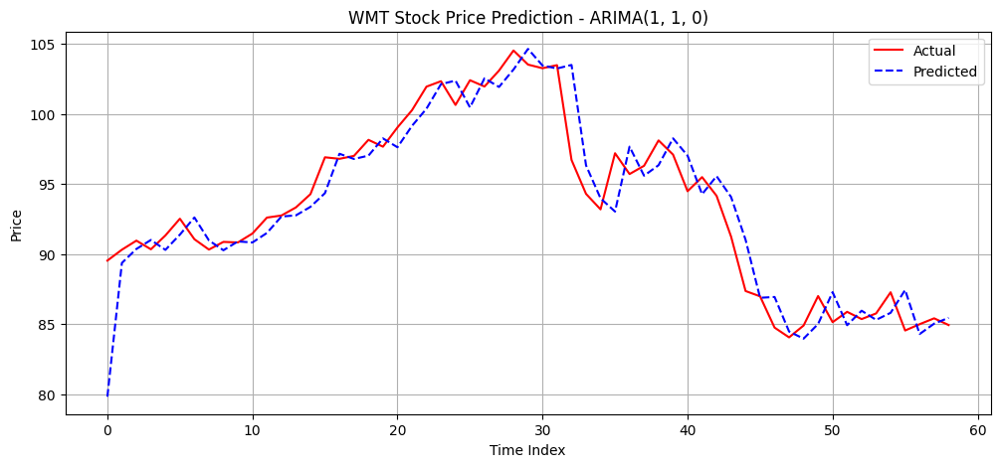

In [ ]:
orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nWMT Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_wmt, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nWMT Best model: ARIMA{best_order} with R²: {best_r2:.4f}")

def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_wmt)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_wmt[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_wmt, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'WMT Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### WMT - LSTM

In [ ]:
## Preparing data
full_series = wmt_stock['Adj Close'].values.reshape(-1, 1)
test_series_wmt = three_months_wmt['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_wmt['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Microsoft stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

In [ ]:
X_train

array([[[-0.48210107],
        [-0.48678674],
        [-0.48401787],
        ...,
        [-0.48859722],
        [-0.49211155],
        [-0.48486995]],

       [[-0.48678674],
        [-0.48401787],
        [-0.49104684],
        ...,
        [-0.49211155],
        [-0.48486995],
        [-0.48242072]],

       [[-0.48401787],
        [-0.49104684],
        [-0.48902342],
        ...,
        [-0.48486995],
        [-0.48242072],
        [-0.48625439]],

       ...,

       [[ 2.64706809],
        [ 2.66383472],
        [ 2.62825659],
        ...,
        [ 2.60850217],
        [ 2.56095968],
        [ 2.48349875]],

       [[ 2.66383472],
        [ 2.62825659],
        [ 2.64333917],
        ...,
        [ 2.56095968],
        [ 2.48349875],
        [ 2.57899296]],

       [[ 2.62825659],
        [ 2.64333917],
        [ 2.66874983],
        ...,
        [ 2.48349875],
        [ 2.57899296],
        [ 2.58350167]]])

In [ ]:
## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]


WMT LSTM Evaluation:
R²: 0.8615 | MAE: 1.6859 | MSE: 4.9697 | RMSE: 2.2293


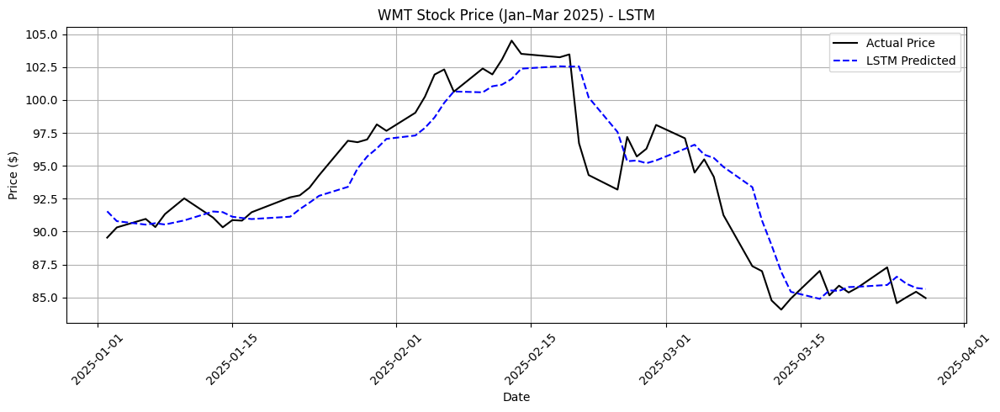


WMT LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.538620,0.000000,0.000000
1,2025-01-03,90.313034,90.790573,0.866673,-0.817192
2,2025-01-06,90.959686,90.527161,1.588891,-1.104951
3,2025-01-07,90.342873,90.634186,0.899998,-0.988036
4,2025-01-08,91.327789,90.535713,2.000009,-1.095611


In [ ]:
## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_wmt, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_wmt, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_wmt, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nWMT LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT LSTM Model - Actual vs Predicted:")
lstm_results.head()

In [ ]:
for i in range(len(test_dates)):
    date = test_dates[i]
    actual_price = test_series_wmt.flatten()[i]
    predicted_price = lstm_predicted_prices[i]
    sequence_unscaled = scaler.inverse_transform(input_sequences[i].reshape(-1, 1)).flatten()

    print(f"\nDate: {date}")
    print(f"Sequence (Walmart - Last 10 Days Before Prediction): {sequence_unscaled}")
    print(f"Input (Last Timestep Value): {sequence_unscaled[-1]:.2f}")
    print(f"Actual Price (Walmart): {actual_price:.2f}")
    print(f"Predicted Price: {predicted_price:.2f}")


Date: 2025-01-02T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.7651825  94.38199615 94.92916107 93.06878662 92.91955566 91.76551819
 89.88524628 92.2032547  92.31269836 91.18850708]
Input (Last Timestep Value): 91.19
Actual Price (Walmart): 89.54
Predicted Price: 91.54

Date: 2025-01-03T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.38199615 94.92916107 93.06878662 92.91955566 91.76551819 89.88524628
 92.2032547  92.31269836 91.18850708 89.53704071]
Input (Last Timestep Value): 89.54
Actual Price (Walmart): 90.31
Predicted Price: 90.79

Date: 2025-01-06T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [94.92916107 93.06878662 92.91955566 91.76551819 89.88524628 92.2032547
 92.31269836 91.18850708 89.53704071 90.31303406]
Input (Last Timestep Value): 90.31
Actual Price (Walmart): 90.96
Predicted Price: 90.53

Date: 2025-01-07T00:00:00.000000000
Sequence (Walmart - Last 10 Days Before Prediction): [93.0687

### WMT - GRU


WMT GRU Evaluation:
R²: 0.9025 | MAE: 1.3356 | MSE: 3.4977 | RMSE: 1.8702


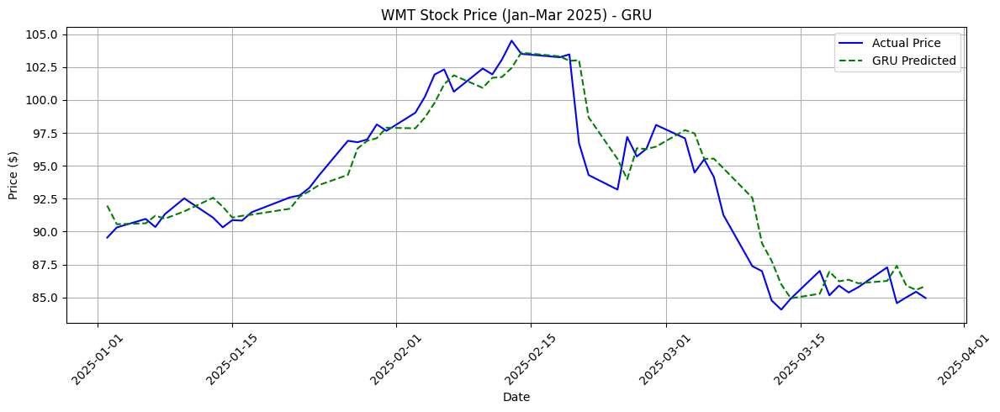


WMT GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,89.537041,91.972923,0.000000,0.000000
1,2025-01-03,90.313034,90.555878,0.866673,-1.540720
2,2025-01-06,90.959686,90.627075,1.588891,-1.463312
3,2025-01-07,90.342873,91.203568,0.899998,-0.836504
4,2025-01-08,91.327789,90.977654,2.000009,-1.082134


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_wmt)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_wmt[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_wmt, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_wmt, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_wmt, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nWMT GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_wmt.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_wmt.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_wmt.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('WMT Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nWMT GRU Model - Actual vs Predicted:")
gru_results.head()

## DG Stock Prediction

### DG - ARIMA


DG Evaluating ARIMA(1, 0, 1)...
R²: 0.7739 | MAE: 1.4985 | MSE: 4.7552 | RMSE: 2.1806

DG Evaluating ARIMA(0, 1, 1)...
R²: 0.8126 | MAE: 1.4177 | MSE: 3.9413 | RMSE: 1.9853

DG Evaluating ARIMA(1, 1, 0)...
R²: 0.8116 | MAE: 1.4185 | MSE: 3.9634 | RMSE: 1.9908

DG Best model: ARIMA(0, 1, 1) with R²: 0.8126

First 10 Predictions vs Actual:
Day 1: Actual = 74.18, Predicted = 79.79
Day 2: Actual = 73.24, Predicted = 74.39
Day 3: Actual = 74.40, Predicted = 73.21
Day 4: Actual = 73.32, Predicted = 74.44
Day 5: Actual = 70.80, Predicted = 73.30
Day 6: Actual = 70.54, Predicted = 70.66
Day 7: Actual = 70.77, Predicted = 70.54
Day 8: Actual = 68.59, Predicted = 70.78
Day 9: Actual = 67.78, Predicted = 68.47
Day 10: Actual = 68.47, Predicted = 67.74


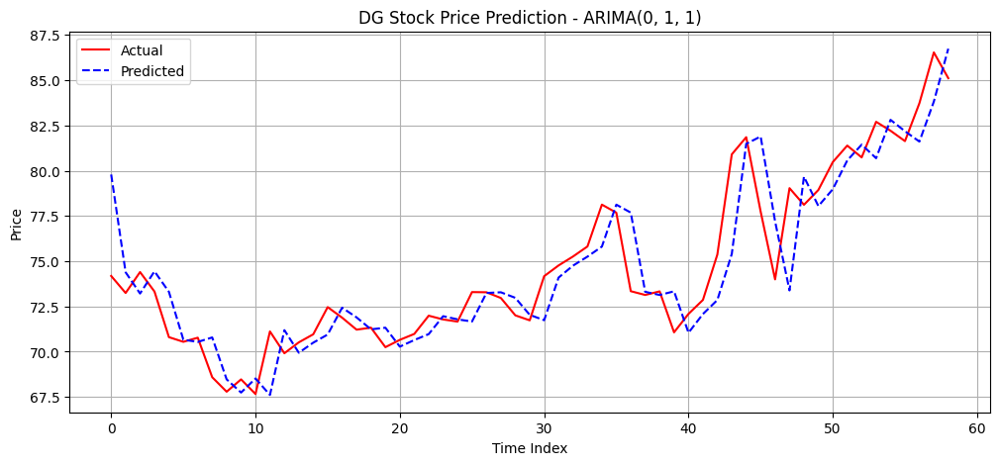

In [ ]:
## Preparing input sequence
full_series_dg = dg_stock['Adj Close'].values

## Using last 10 days of DG stock before prediction start
time_steps = 10
initial_window = full_series_dg[-(time_steps + len(three_months_test_dg)) : -len(three_months_test_dg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nDG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_dg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nDG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_dg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_dg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_dg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'DG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### DG - LSTM


DG LSTM Evaluation:
R²: 0.7823 | MAE: 1.5576 | MSE: 4.5802 | RMSE: 2.1401


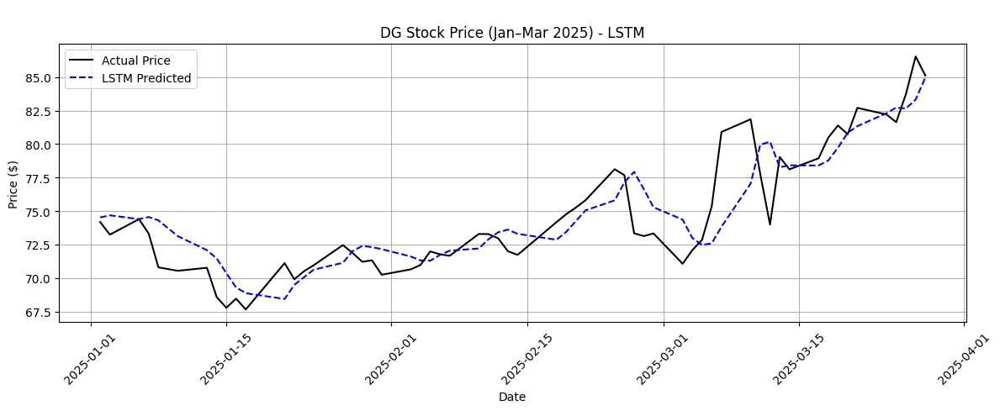


DG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.523849,0.000000,0.000000
1,2025-01-03,73.240685,74.682343,-1.269353,0.212669
2,2025-01-06,74.398102,74.396530,0.290881,-0.170845
3,2025-01-07,73.320587,74.555000,-1.161641,0.041795
4,2025-01-08,70.799797,74.307243,-4.559742,-0.290656


In [ ]:
## Preparing data
full_series = dg_stock['Adj Close'].values.reshape(-1, 1)
test_series_dg = three_months_dg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_dg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Microsoft stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_dg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_dg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_dg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nDG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### DG Stock - GRU


DG GRU Evaluation:
R²: 0.8149 | MAE: 1.4099 | MSE: 3.8935 | RMSE: 1.9732


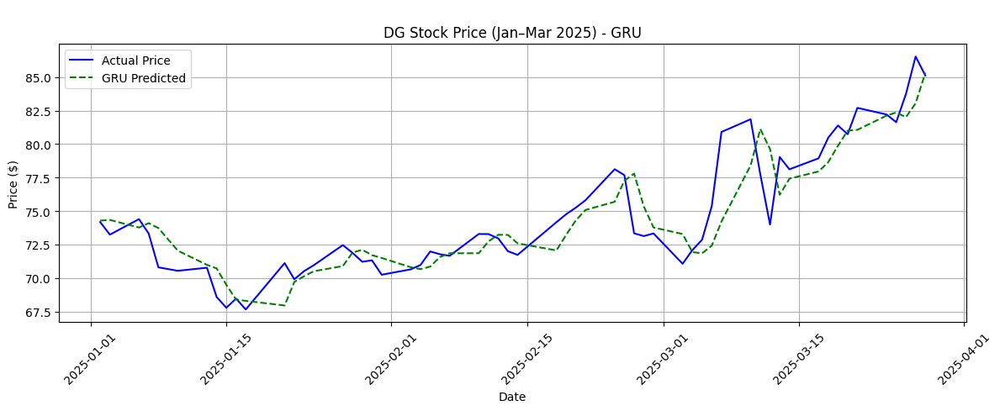


DG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,74.182320,74.286812,0.000000,0.000000
1,2025-01-03,73.240685,74.340927,-1.269353,0.072849
2,2025-01-06,74.398102,73.770554,0.290881,-0.694954
3,2025-01-07,73.320587,74.098434,-1.161641,-0.253582
4,2025-01-08,70.799797,73.729759,-4.559742,-0.749868


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_dg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_dg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_dg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_dg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_dg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nDG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_dg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_dg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_dg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nDG Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nDG GRU Model - Actual vs Predicted:")
gru_results.head()

## JNJ Stock Predictions

### JNJ - ARIMA


JNJ Evaluating ARIMA(1, 0, 1)...
R²: 0.8482 | MAE: 1.9532 | MSE: 10.6481 | RMSE: 3.2631

JNJ Evaluating ARIMA(0, 1, 1)...
R²: 0.9005 | MAE: 1.6288 | MSE: 6.9764 | RMSE: 2.6413

JNJ Evaluating ARIMA(1, 1, 0)...
R²: 0.8967 | MAE: 1.6644 | MSE: 7.2477 | RMSE: 2.6922

JNJ Best model: ARIMA(0, 1, 1) with R²: 0.9005

First 10 Predictions vs Actual:
Day 1: Actual = 141.66, Predicted = 156.60
Day 2: Actual = 141.83, Predicted = 139.08
Day 3: Actual = 141.31, Predicted = 141.84
Day 4: Actual = 143.84, Predicted = 141.29
Day 5: Actual = 139.94, Predicted = 143.89
Day 6: Actual = 139.73, Predicted = 139.99
Day 7: Actual = 142.10, Predicted = 139.74
Day 8: Actual = 142.38, Predicted = 142.08
Day 9: Actual = 142.60, Predicted = 142.38
Day 10: Actual = 145.35, Predicted = 142.59


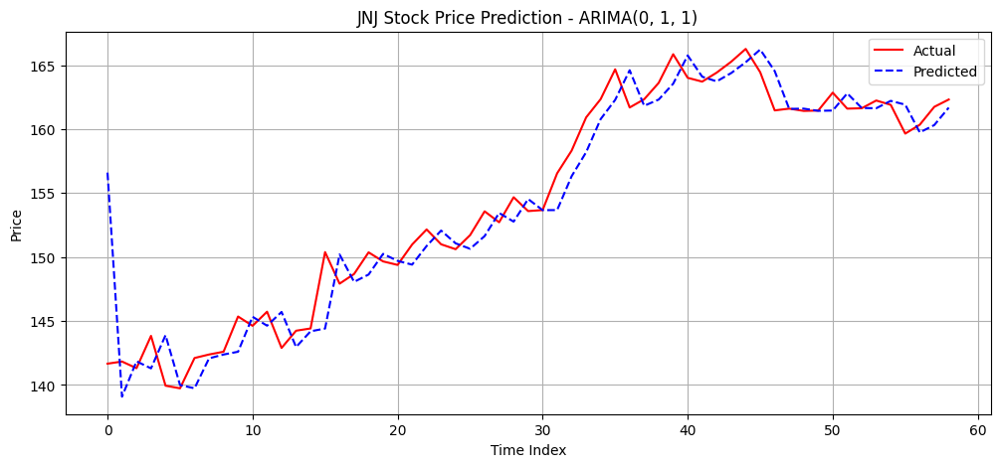

In [ ]:
## Preparing input sequence
full_series_jnj = jnj_stock['Adj Close'].values

## Using last 10 days of JNJ stock before prediction start
time_steps = 10
initial_window = full_series_jnj[-(time_steps + len(three_months_test_jnj)) : -len(three_months_test_jnj)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJNJ Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jnj, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJNJ Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jnj)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jnj[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jnj, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JNJ Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JNJ - LSTM


JNJ LSTM Evaluation:
R²: 0.9584 | MAE: 1.3272 | MSE: 2.9162 | RMSE: 1.7077


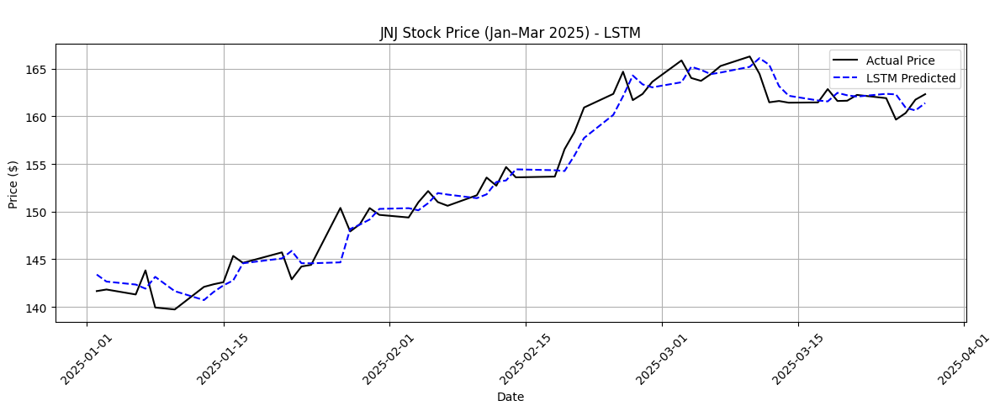


JNJ LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,143.396271,0.000000,0.000000
1,2025-01-03,141.829102,142.659134,0.118042,-0.514054
2,2025-01-06,141.307770,142.349503,-0.249969,-0.729984
3,2025-01-07,143.835678,141.918060,1.534497,-1.030856
4,2025-01-08,139.940536,143.157211,-1.215107,-0.166714


In [ ]:
## Preparing data
full_series = jnj_stock['Adj Close'].values.reshape(-1, 1)
test_series_jnj = three_months_jnj['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jnj['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jnj, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jnj, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jnj, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJNJ LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JNJ - GRU


JNJ GRU Evaluation:
R²: 0.9587 | MAE: 1.3175 | MSE: 2.8933 | RMSE: 1.7010


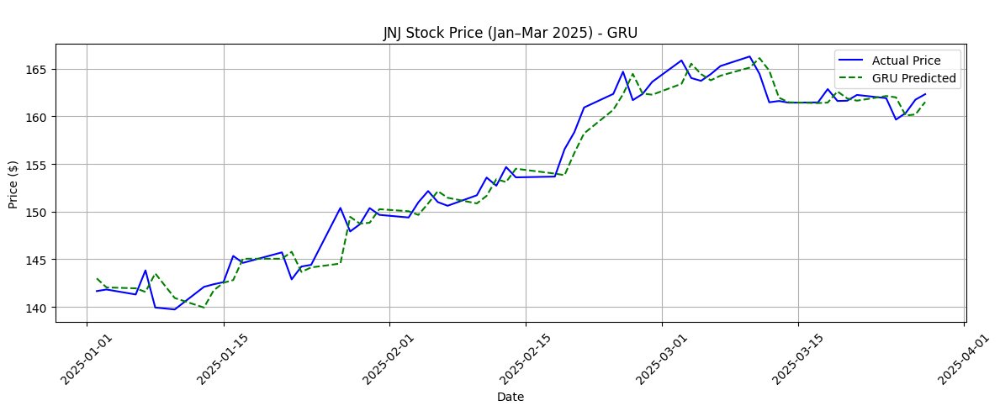


JNJ GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,141.661880,142.993866,0.000000,0.000000
1,2025-01-03,141.829102,142.046921,0.118042,-0.662225
2,2025-01-06,141.307770,141.952026,-0.249969,-0.728589
3,2025-01-07,143.835678,141.576080,1.534497,-0.991499
4,2025-01-08,139.940536,143.516937,-1.215107,0.365806


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jnj)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jnj[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jnj, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jnj, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jnj, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJNJ GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jnj.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jnj.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jnj.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJNJ Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJNJ GRU Model - Actual vs Predicted:")
gru_results.head()

## JPM Stock Predictions

### JPM - ARIMA


JPM Evaluating ARIMA(1, 0, 1)...
R²: 0.4522 | MAE: 5.3104 | MSE: 117.0941 | RMSE: 10.8210

JPM Evaluating ARIMA(0, 1, 1)...
R²: 0.7539 | MAE: 3.9670 | MSE: 52.5983 | RMSE: 7.2525

JPM Evaluating ARIMA(1, 1, 0)...
R²: 0.8065 | MAE: 3.7403 | MSE: 41.3655 | RMSE: 6.4316

JPM Best model: ARIMA(1, 1, 0) with R²: 0.8065

First 10 Predictions vs Actual:
Day 1: Actual = 236.17, Predicted = 200.97
Day 2: Actual = 239.40, Predicted = 220.83
Day 3: Actual = 238.23, Predicted = 239.49
Day 4: Actual = 240.52, Predicted = 238.20
Day 5: Actual = 240.48, Predicted = 240.58
Day 6: Actual = 237.26, Predicted = 240.48
Day 7: Actual = 241.55, Predicted = 237.18
Day 8: Actual = 244.78, Predicted = 241.61
Day 9: Actual = 249.60, Predicted = 244.85
Day 10: Actual = 251.50, Predicted = 249.77


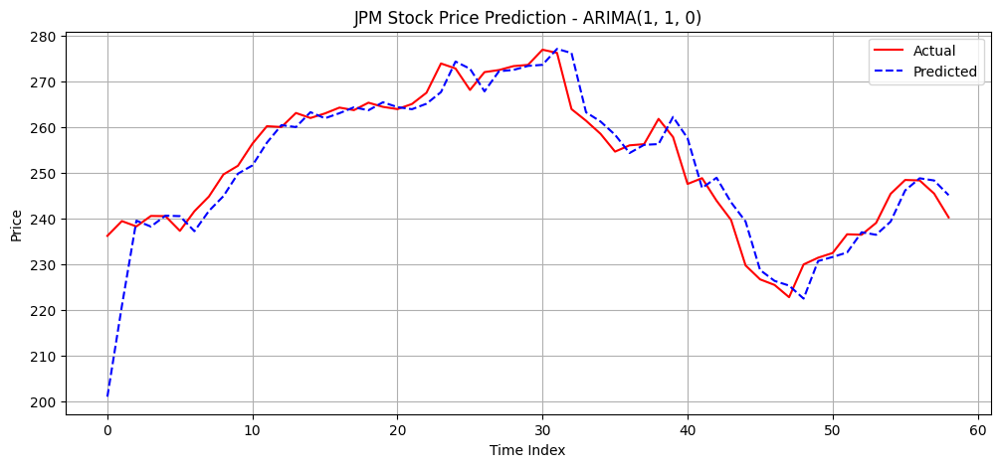

In [ ]:
## Preparing input sequence
full_series_jpm = jpm_stock['Adj Close'].values

## Using last 10 days of JPM stock before prediction start
time_steps = 10
initial_window = full_series_jpm[-(time_steps + len(three_months_test_jpm)) : -len(three_months_test_jpm)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nJPM Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_jpm, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nJPM Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_jpm)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_jpm[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_jpm, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'JPM Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### JPM - LSTM


JPM LSTM Evaluation:
R²: 0.9044 | MAE: 3.8159 | MSE: 20.4279 | RMSE: 4.5197


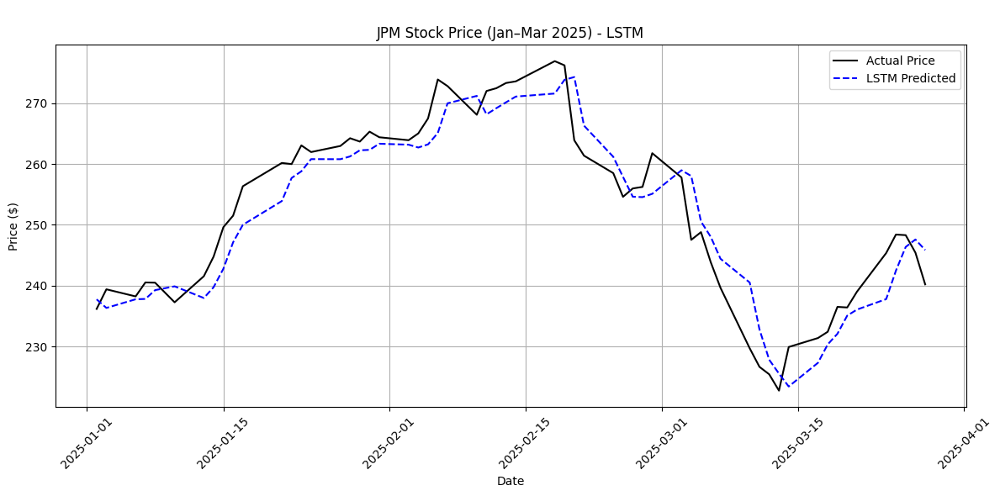


JPM LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,237.742615,0.000000,0.000000
1,2025-01-03,239.395020,236.335464,1.366664,-0.591880
2,2025-01-06,238.227859,237.755829,0.872455,0.005555
3,2025-01-07,240.522598,237.811172,1.844113,0.028837
4,2025-01-08,240.483047,239.260178,1.827366,0.638318


In [ ]:
## Preparing data
full_series = jpm_stock['Adj Close'].values.reshape(-1, 1)
test_series_jpm = three_months_jpm['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_jpm['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_jpm, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_jpm, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_jpm, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nJPM LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 6))
plt.plot(test_dates, test_series_jpm.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM LSTM Model - Actual vs Predicted:")
lstm_results.head()

### JPM - GRU


JPM GRU Evaluation:
R²: 0.9135 | MAE: 3.6102 | MSE: 18.4797 | RMSE: 4.2988


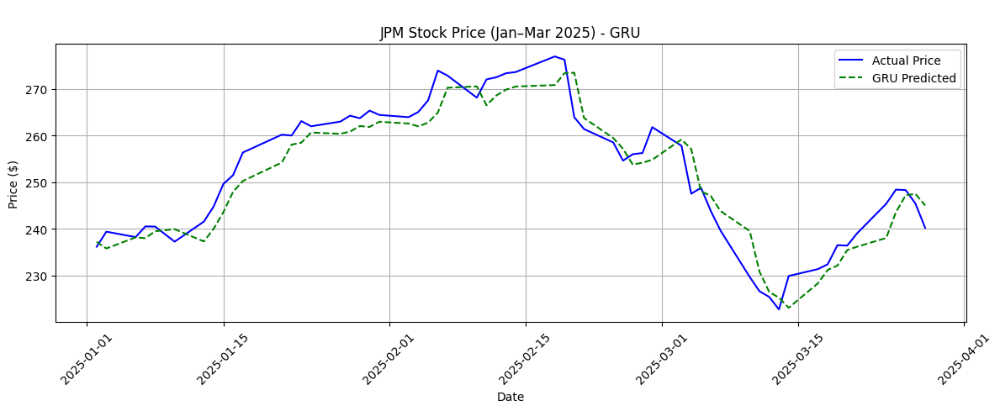


JPM GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,236.167404,237.216171,0.000000,0.000000
1,2025-01-03,239.395020,235.798111,1.366664,-0.597793
2,2025-01-06,238.227859,238.173508,0.872455,0.403571
3,2025-01-07,240.522598,238.004944,1.844113,0.332510
4,2025-01-08,240.483047,239.491226,1.827366,0.959063


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_jpm)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_jpm[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_jpm, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_jpm, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_jpm, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nJPM GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_jpm.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_jpm.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_jpm.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nJPM Stock Price (Jan–Mar 2025) - GRU')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nJPM GRU Model - Actual vs Predicted:")
gru_results.head()

## CFG Stock Predictions

### CFG - ARIMA


CFG Evaluating ARIMA(1, 0, 1)...
R²: 0.7742 | MAE: 0.7977 | MSE: 1.4529 | RMSE: 1.2054

CFG Evaluating ARIMA(0, 1, 1)...
R²: 0.8783 | MAE: 0.6540 | MSE: 0.7834 | RMSE: 0.8851

CFG Evaluating ARIMA(1, 1, 0)...
R²: 0.8776 | MAE: 0.6569 | MSE: 0.7877 | RMSE: 0.8875

CFG Best model: ARIMA(0, 1, 1) with R²: 0.8783

First 10 Predictions vs Actual:
Day 1: Actual = 42.37, Predicted = 38.51
Day 2: Actual = 43.30, Predicted = 42.16
Day 3: Actual = 43.54, Predicted = 43.35
Day 4: Actual = 43.44, Predicted = 43.56
Day 5: Actual = 43.52, Predicted = 43.42
Day 6: Actual = 42.08, Predicted = 43.53
Day 7: Actual = 42.91, Predicted = 41.86
Day 8: Actual = 44.41, Predicted = 43.00
Day 9: Actual = 45.75, Predicted = 44.62
Day 10: Actual = 45.48, Predicted = 45.96


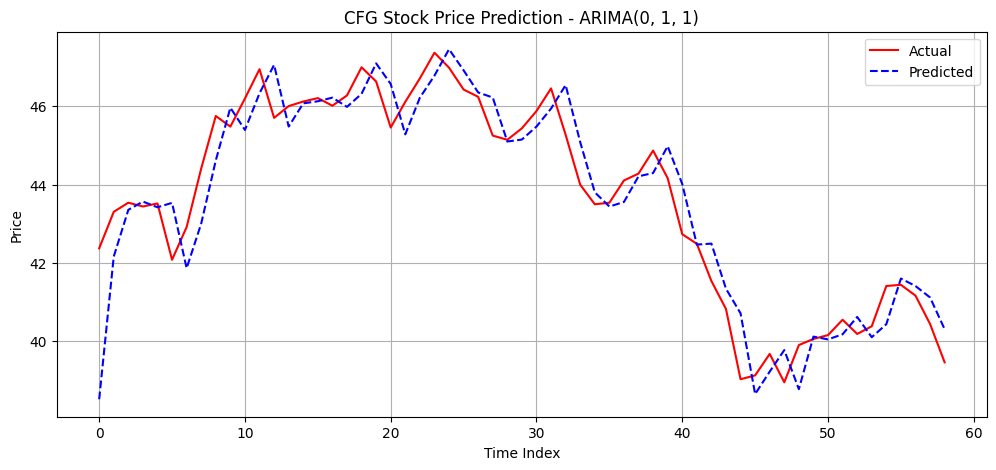

In [ ]:
## Preparing input sequence
full_series_cfg = cfg_stock['Adj Close'].values

## Using last 10 days of CFG stock before prediction start
time_steps = 10
initial_window = full_series_cfg[-(time_steps + len(three_months_test_cfg)) : -len(three_months_test_cfg)].tolist()

## ARIMA forecasting with sliding window
def evaluate_arima_model_windowed(initial_window, test_series, order):
    history = initial_window.copy()
    predictions = []

    for t in range(len(test_series)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)

        ## Updating history with actual value
        history.append(test_series[t])

    ## Regression Metrics
    r2 = r2_score(test_series, predictions)
    mae = mean_absolute_error(test_series, predictions)
    mse = mean_squared_error(test_series, predictions)
    rmse = np.sqrt(mse)

    return predictions, r2, mae, mse, rmse

orders_to_try = [(1,0,1), (0,1,1), (1,1,0)]

best_r2 = -np.inf
best_order = None
best_predictions = None

for order in orders_to_try:
    print(f"\nCFG Evaluating ARIMA{order}...")
    predictions, r2, mae, mse, rmse = evaluate_arima_model_windowed(initial_window, three_months_test_cfg, order)
    print(f"R²: {r2:.4f} | MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f}")

    if r2 > best_r2:
        best_r2 = r2
        best_order = order
        best_predictions = predictions

print(f"\nCFG Best model: ARIMA{best_order} with R²: {best_r2:.4f}")


def cumulative_return(prices):
    return (prices / prices[0]) - 1

## Convert forecast and test_series to NumPy arrays for calculating cumulative return
forecast_arima = np.array(best_predictions)
test_series_array = np.array(three_months_test_cfg)

cum_return_actual_arima = cumulative_return(test_series_array)
cum_return_pred_arima = cumulative_return(forecast_arima)

# Print first 10 predictions vs actual
print("\nFirst 10 Predictions vs Actual:")
for i in range(10):
    print(f"Day {i+1}: Actual = {three_months_test_cfg[i]:.2f}, Predicted = {best_predictions[i]:.2f}")

## best model results
plt.figure(figsize=(12, 5))
plt.plot(three_months_test_cfg, 'r-',label='Actual')
plt.plot(best_predictions, 'b--', label='Predicted')
plt.title(f'CFG Stock Price Prediction - ARIMA{best_order}')
plt.xlabel('Time Index')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### CFG - LSTM


CFG LSTM Evaluation:
R²: 0.9072 | MAE: 0.6099 | MSE: 0.5969 | RMSE: 0.7726


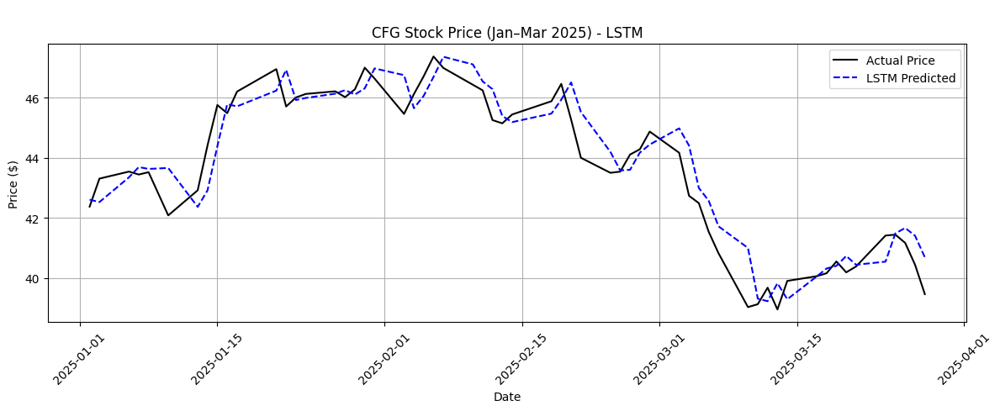


CFG LSTM Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.601364,0.000000,0.000000
1,2025-01-03,43.302151,42.521309,2.201841,-0.187916
2,2025-01-06,43.535374,43.343773,2.752294,1.742685
3,2025-01-07,43.438198,43.685726,2.522940,2.545369
4,2025-01-08,43.515934,43.624603,2.706412,2.401888


In [ ]:
## Preparing data
full_series = cfg_stock['Adj Close'].values.reshape(-1, 1)
test_series_cfg = three_months_cfg['Adj Close'].values.reshape(-1, 1)
test_dates = three_months_cfg['Date'].values

## Robust Scaling
scaler = RobustScaler()
scaled_full_series = scaler.fit_transform(full_series)

## Create sequences with timesteps = 10
def create_sequences(data, time_steps=10):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

## use all 3018 Apple stock for training
time_steps = 10
X_train, y_train = create_sequences(scaled_full_series, time_steps)

## LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='tanh', input_shape=(time_steps, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()  ## Starting input sequence from last 10 days of Walmart
input_sequences = []  ## To store each input sequence used
predictions = []      ## To store predictions

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())  ## Save current input sequence

    ## Prediction
    pred = lstm_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating input sequence with actual next price (walk-forward validation)
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
lstm_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_lstm = r2_score(three_months_test_cfg, lstm_predicted_prices)
mae_lstm = mean_absolute_error(three_months_test_cfg, lstm_predicted_prices)
mse_lstm = mean_squared_error(three_months_test_cfg, lstm_predicted_prices)
rmse_lstm = np.sqrt(mse_lstm)

print("\nCFG LSTM Evaluation:")
print(f"R²: {r2_lstm:.4f} | MAE: {mae_lstm:.4f} | MSE: {mse_lstm:.4f} | RMSE: {rmse_lstm:.4f}")

## Cumulative return calculation
def calculate_cumulative_returns(prices):
    return (prices / prices[0] - 1) * 100

actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(lstm_predicted_prices)

## Results
lstm_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': lstm_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})
plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'k-', label='Actual Price')
plt.plot(test_dates, lstm_results['Predicted Price'], 'b--', label='LSTM Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - LSTM')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG LSTM Model - Actual vs Predicted:")
lstm_results.head()

### CFG - GRU


CFG GRU Evaluation:
R²: 0.9074 | MAE: 0.6466 | MSE: 0.5960 | RMSE: 0.7720


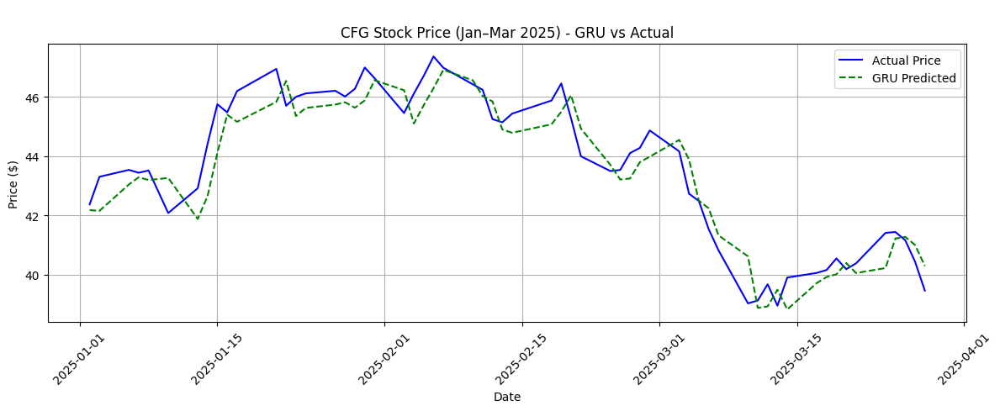


CFG GRU Model - Actual vs Predicted:


,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,42.369247,42.176003,0.000000,0.000000
1,2025-01-03,43.302151,42.150322,2.201841,-0.060886
2,2025-01-06,43.535374,43.042679,2.752294,2.054906
3,2025-01-07,43.438198,43.287041,2.522940,2.634287
4,2025-01-08,43.515934,43.192692,2.706412,2.410591


In [ ]:
## GRU model
gru_model = Sequential()
gru_model.add(GRU(50, activation='tanh', input_shape=(time_steps, 1)))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

## Forecasting next 59 points using actual next price for walk-forward
input_seq = scaled_full_series[-time_steps:].copy()
input_sequences = []
predictions = []

for i in range(len(test_series_cfg)):
    input_sequences.append(input_seq.copy())

    ## Prediction
    pred = gru_model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
    predictions.append(pred[0][0])

    ## Updating sequence with actual next price
    next_actual_scaled = scaler.transform(test_series_cfg[i].reshape(1, -1))[0][0]
    input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

## Inverse transform predictions
gru_predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

## Evaluation
r2_gru = r2_score(three_months_test_cfg, gru_predicted_prices)
mae_gru = mean_absolute_error(three_months_test_cfg, gru_predicted_prices)
mse_gru = mean_squared_error(three_months_test_cfg, gru_predicted_prices)
rmse_gru = np.sqrt(mse_gru)

print("\nCFG GRU Evaluation:")
print(f"R²: {r2_gru:.4f} | MAE: {mae_gru:.4f} | MSE: {mse_gru:.4f} | RMSE: {rmse_gru:.4f}")

## Cumulative returns
actual_returns = calculate_cumulative_returns(test_series_cfg.flatten())
predicted_returns = calculate_cumulative_returns(gru_predicted_prices)

## Results
gru_results = pd.DataFrame({
    'Date': test_dates,
    'Actual Price': test_series_cfg.flatten(),
    'Predicted Price': gru_predicted_prices,
    'Actual Returns (%)': actual_returns,
    'Predicted Returns (%)': predicted_returns
})

plt.figure(figsize=(12, 5))
plt.plot(test_dates, test_series_cfg.flatten(), 'b-', label='Actual Price')
plt.plot(test_dates, gru_results['Predicted Price'], 'g--', label='GRU Predicted')
plt.title('\nCFG Stock Price (Jan–Mar 2025) - GRU vs Actual')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

print("\nCFG GRU Model - Actual vs Predicted:")
gru_results.head()

## 17-Results of 30 Stocks with the Best Model (GRU)

In [ ]:
def process_and_display_gru(stock):
    from IPython.display import display
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from sklearn.preprocessing import RobustScaler
    from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import GRU, Dense

    # Stocks Data #
    data_dir = 'Stocks Data/'

    # Cumulative returns calculation #
    def calculate_cumulative_returns(prices):
        return (prices / prices[0] - 1) * 100

    train_csv = f'{data_dir}{stock}_Stock.csv'
    test_csv = f'{data_dir}{stock}3Months_Stock.csv'

    # Data Loading #
    df_train = pd.read_csv(train_csv)
    df_test = pd.read_csv(test_csv)

    df_train['Date'] = pd.to_datetime(df_train['Date'])
    df_test['Date'] = pd.to_datetime(df_test['Date'])

    df_train.sort_values('Date', inplace=True)
    df_test.sort_values('Date', inplace=True)

    train_series = df_train['Adj Close'].values.reshape(-1, 1)
    test_series = df_test['Adj Close'].values.reshape(-1, 1)
    test_dates = df_test['Date'].values

    scaler = RobustScaler()
    scaled_train_series = scaler.fit_transform(train_series)

    def create_sequences(data, time_steps=10):
        X, y = [], []
        for i in range(len(data) - time_steps):
            X.append(data[i:i+time_steps])
            y.append(data[i+time_steps])
        return np.array(X), np.array(y)

    time_steps = 10
    X_train, y_train = create_sequences(scaled_train_series, time_steps)

    model = Sequential([
        GRU(50, activation='tanh', input_shape=(time_steps, 1)),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

    input_seq = scaled_train_series[-time_steps:].copy()
    predictions = []

    for i in range(len(test_series)):
        pred = model.predict(input_seq.reshape(1, time_steps, 1), verbose=0)
        predictions.append(pred[0][0])
        next_actual_scaled = scaler.transform(test_series[i].reshape(1, -1))[0][0]
        input_seq = np.append(input_seq, next_actual_scaled)[-time_steps:]

    predicted_prices = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

    r2 = r2_score(test_series.flatten(), predicted_prices)
    mae = mean_absolute_error(test_series.flatten(), predicted_prices)
    mse = mean_squared_error(test_series.flatten(), predicted_prices)
    rmse = np.sqrt(mse)

    print(f"\n{stock} Stock Evaluation Results:\n")
    print(f"R² Score  : {r2:.4f}")
    print(f"MAE       : {mae:.4f}")
    print(f"MSE       : {mse:.4f}")
    print(f"RMSE      : {rmse:.4f}\n")

    actual_returns = calculate_cumulative_returns(test_series.flatten())
    predicted_returns = calculate_cumulative_returns(predicted_prices)

    results_df = pd.DataFrame({
        'Date': test_dates,
        'Actual Price': test_series.flatten(),
        'Predicted Price': predicted_prices,
        'Actual Returns (%)': actual_returns,
        'Predicted Returns (%)': predicted_returns
    })

    display(results_df.head())

    plt.figure(figsize=(12, 5))
    plt.plot(test_dates, test_series.flatten(), 'b-', label='Actual Price')
    plt.plot(test_dates, predicted_prices, 'g--', label='Predicted Price')
    plt.title(f'\n{stock} Stock Price Prediction (GRU)')
    plt.xlabel('Date')
    plt.ylabel('Price ($)')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


QS Stock Evaluation Results:

R² Score  : 0.0581
MAE       : 0.4390
MSE       : 0.2335
RMSE      : 0.4832



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,5.54,6.341659,0.000000,0.000000
1,2025-01-03,6.00,6.309787,8.303250,-0.502580
2,2025-01-06,6.58,6.344979,18.772563,0.052369
3,2025-01-07,6.29,6.635818,13.537906,4.638517
4,2025-01-08,5.72,6.784433,3.249094,6.982005


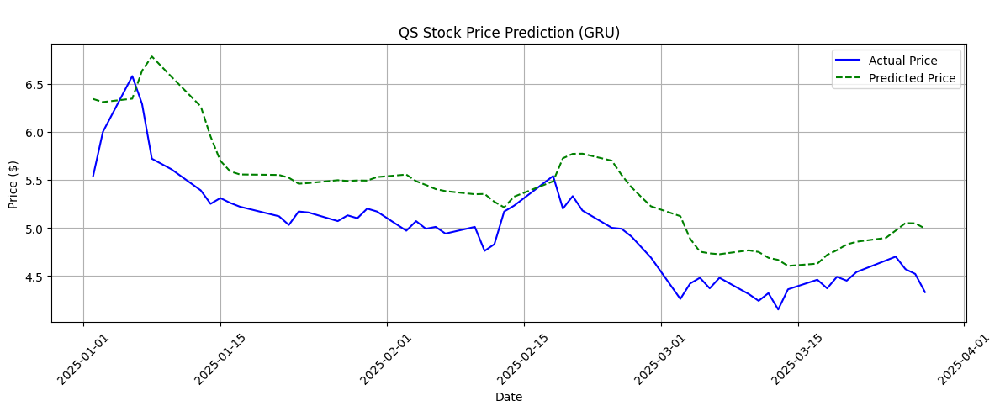

In [ ]:
process_and_display_gru('QS')


BBAI Stock Evaluation Results:

R² Score  : 0.8939
MAE       : 0.4558
MSE       : 0.3863
RMSE      : 0.6215



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,4.11,4.293849,0.000000,0.000000
1,2025-01-03,4.53,4.254979,10.218980,-0.905257
2,2025-01-06,4.30,4.450923,4.622872,3.658104
3,2025-01-07,3.96,4.410031,-3.649637,2.705765
4,2025-01-08,3.32,4.156966,-19.221415,-3.187901


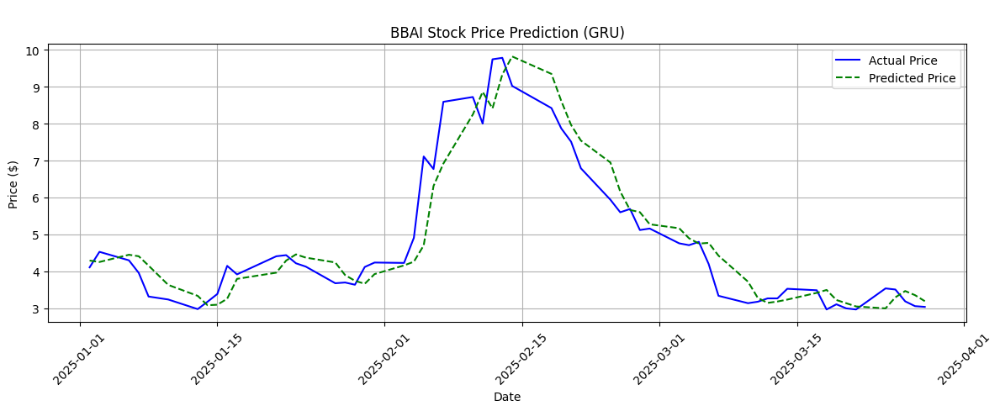

In [ ]:
process_and_display_gru('BBAI')


NU Stock Evaluation Results:

R² Score  : 0.8303
MAE       : 0.3089
MSE       : 0.2187
RMSE      : 0.4677



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,10.63,10.282024,0.000000,0.000000
1,2025-01-03,10.97,10.486353,3.198496,1.987243
2,2025-01-06,11.15,10.798122,4.891811,5.019414
3,2025-01-07,11.16,11.031390,4.985886,7.288110
4,2025-01-08,11.14,11.107512,4.797744,8.028460


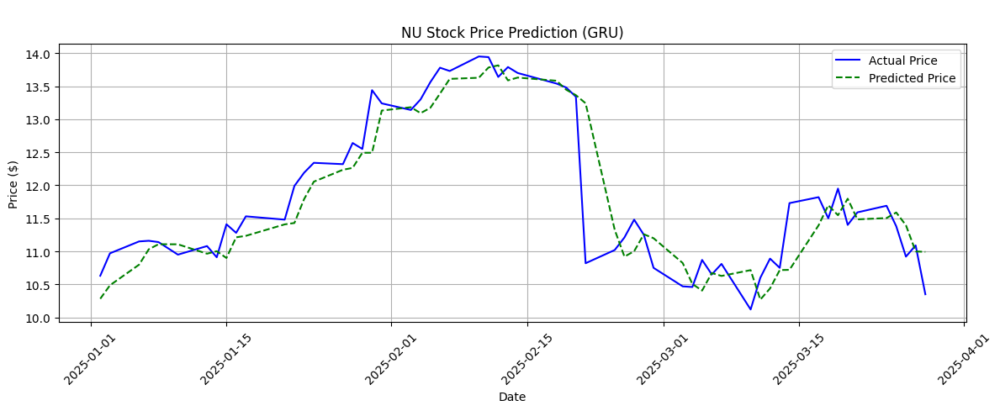

In [ ]:
process_and_display_gru('NU')


NIO Stock Evaluation Results:

R² Score  : 0.5285
MAE       : 0.2609
MSE       : 0.1169
RMSE      : 0.3419



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,5.54,4.718012,0.000000,0.000000
1,2025-01-03,6.00,5.100182,8.303250,8.100224
2,2025-01-06,6.58,5.638641,18.772563,19.513083
3,2025-01-07,6.29,6.253669,13.537906,32.548809
4,2025-01-08,5.72,6.510962,3.249094,38.002239


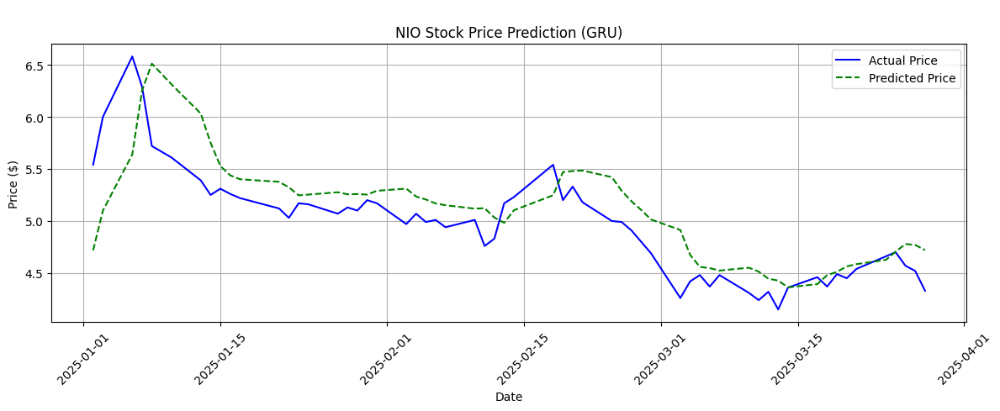

In [ ]:
process_and_display_gru('NIO')


FORD Stock Evaluation Results:

R² Score  : 0.6262
MAE       : 0.1495
MSE       : 0.0430
RMSE      : 0.2074



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,9.088185,9.499986,0.000000,0.000000
1,2025-01-03,9.304796,9.128940,2.383434,-3.905755
2,2025-01-06,9.342466,9.341797,2.797930,-1.665145
3,2025-01-07,9.191782,9.384906,1.139905,-1.211369
4,2025-01-08,9.172945,9.236024,0.932636,-2.778548


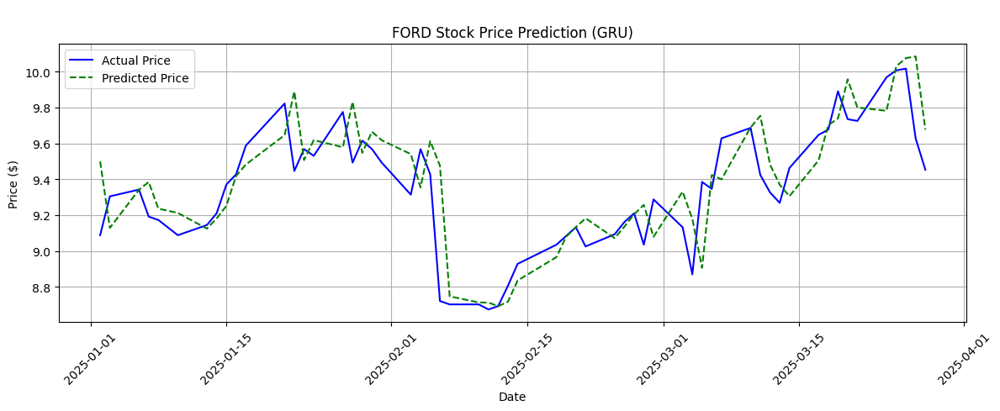

In [ ]:
process_and_display_gru('FORD')


OSCR Stock Evaluation Results:

R² Score  : 0.6583
MAE       : 0.5288
MSE       : 0.4741
RMSE      : 0.6885



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,13.55,13.966616,0.000000,0.000000
1,2025-01-03,14.35,13.731716,5.904060,-1.681864
2,2025-01-06,14.72,14.213719,8.634687,1.769245
3,2025-01-07,14.39,14.679901,6.199263,5.107069
4,2025-01-08,15.29,14.593025,12.841327,4.485047


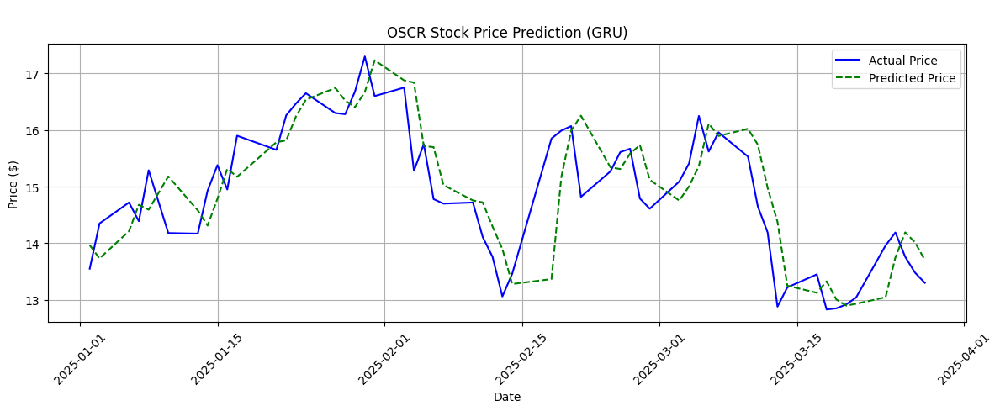

In [ ]:
process_and_display_gru('OSCR')


JOBY Stock Evaluation Results:

R² Score  : 0.8594
MAE       : 0.2839
MSE       : 0.1556
RMSE      : 0.3945



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,8.09,9.015430,0.000000,0.000000
1,2025-01-03,9.77,8.238579,20.766382,-8.616913
2,2025-01-06,9.83,9.329866,21.508031,3.487754
3,2025-01-07,10.27,9.843668,26.946851,9.186888
4,2025-01-08,9.49,10.230984,17.305310,13.483036


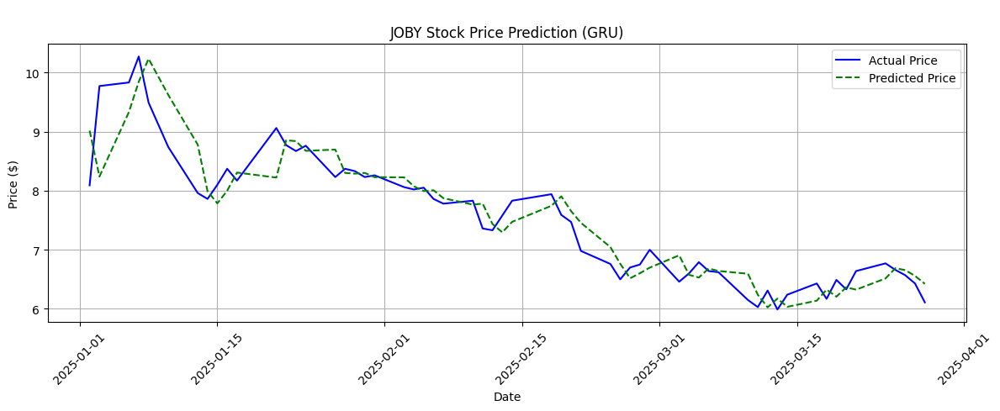

In [ ]:
process_and_display_gru('JOBY')


ACHR Stock Evaluation Results:

R² Score  : 0.6627
MAE       : 0.4513
MSE       : 0.3830
RMSE      : 0.6189



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,9.57,11.230387,0.000000,0.000000
1,2025-01-03,11.51,9.715997,20.271689,-13.484753
2,2025-01-06,11.45,11.302465,19.644725,0.641823
3,2025-01-07,11.14,11.415398,16.405441,1.647413
4,2025-01-08,10.48,11.149641,9.508881,-0.718993


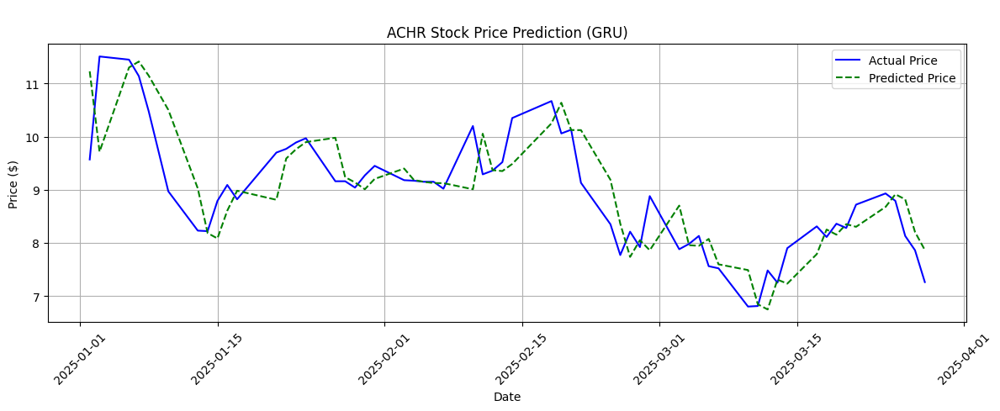

In [ ]:
process_and_display_gru('ACHR')


QBTS Stock Evaluation Results:

R² Score  : 0.6167
MAE       : 0.6734
MSE       : 1.1154
RMSE      : 1.0561



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,9.61,9.667915,0.000000,0.000000
1,2025-01-03,9.14,9.744751,-4.890732,0.794744
2,2025-01-06,10.21,9.461287,6.243501,-2.137262
3,2025-01-07,9.55,9.931149,-0.624344,2.722764
4,2025-01-08,6.10,9.740103,-36.524452,0.746667


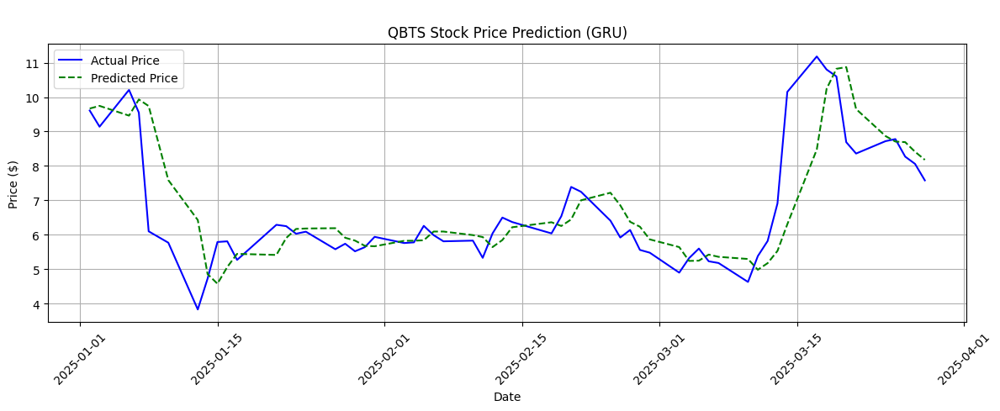

In [ ]:
process_and_display_gru('QBTS')


BAC Stock Evaluation Results:

R² Score  : 0.8750
MAE       : 0.5599
MSE       : 0.5941
RMSE      : 0.7708



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,43.754410,44.058731,0.000000,0.000000
1,2025-01-03,44.268120,43.975777,1.174076,-0.188279
2,2025-01-06,44.850983,44.460033,2.506200,0.910830
3,2025-01-07,45.522762,45.074043,4.041541,2.304447
4,2025-01-08,45.651188,45.757599,4.335056,3.855920


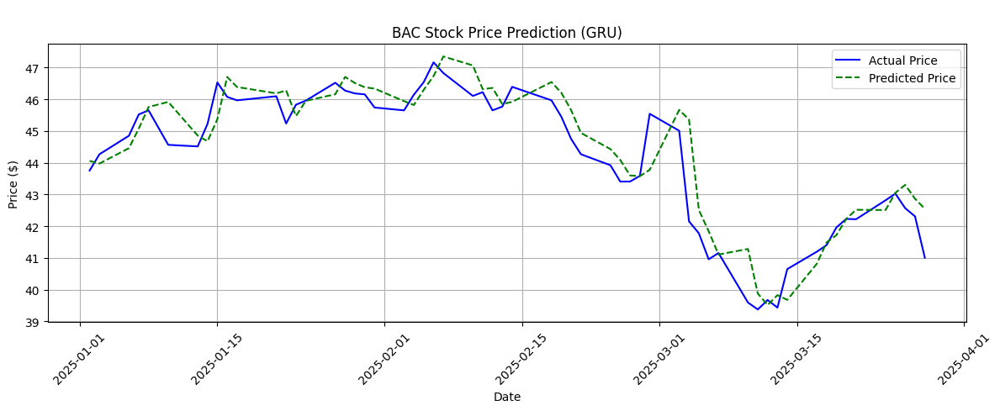

In [ ]:
process_and_display_gru('BAC')


CVX Stock Evaluation Results:

R² Score  : 0.7958
MAE       : 1.9692
MSE       : 5.5367
RMSE      : 2.3530



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,143.354492,140.589722,0.000000,0.000000
1,2025-01-03,144.468414,142.951004,0.777040,1.679552
2,2025-01-06,143.891891,144.269531,0.374874,2.617407
3,2025-01-07,146.168610,143.825516,1.963048,2.301586
4,2025-01-08,146.862381,145.709045,2.447003,3.641319


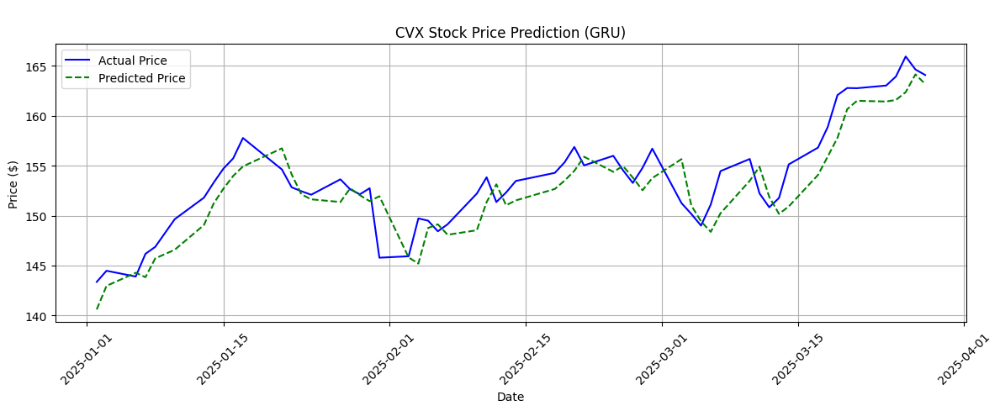

In [ ]:
process_and_display_gru('CVX')


NVDA Stock Evaluation Results:

R² Score  : 0.7725
MAE       : 3.9115
MSE       : 27.9921
RMSE      : 5.2908



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,138.287674,136.295074,0.000000,0.000000
1,2025-01-03,144.446686,136.952576,4.453768,0.482404
2,2025-01-06,149.405869,141.642532,8.039903,3.923440
3,2025-01-07,140.117371,145.646088,1.323109,6.860864
4,2025-01-08,140.087387,139.742142,1.301427,2.529120


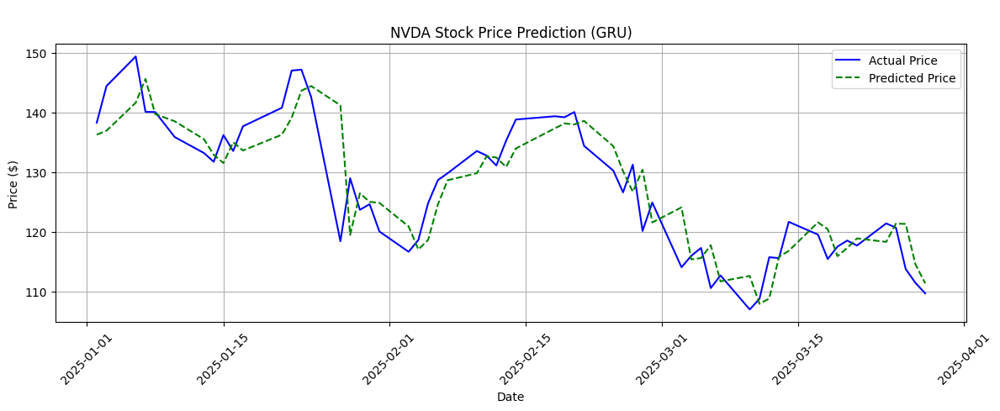

In [ ]:
process_and_display_gru('NVDA')


PFE Stock Evaluation Results:

R² Score  : 0.3876
MAE       : 0.2658
MSE       : 0.1048
RMSE      : 0.3238



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,25.251474,25.323450,0.000000,0.000000
1,2025-01-03,25.232496,25.312222,-0.075156,-0.044340
2,2025-01-06,25.517179,25.293627,1.052236,-0.117767
3,2025-01-07,25.744926,25.514685,1.954152,0.755167
4,2025-01-08,25.488712,25.769613,0.939501,1.761854


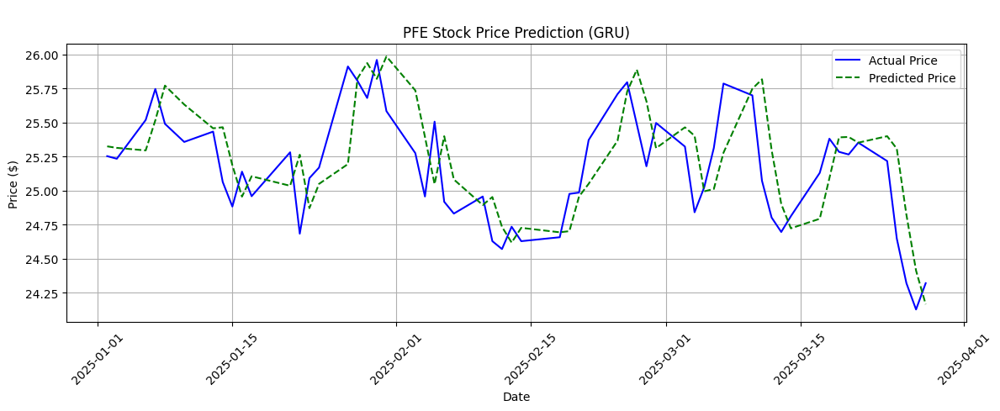

In [ ]:
process_and_display_gru('PFE')


IVZ Stock Evaluation Results:

R² Score  : 0.8905
MAE       : 0.2958
MSE       : 0.1628
RMSE      : 0.4035



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,17.219368,17.330635,0.000000,0.000000
1,2025-01-03,17.316927,17.296188,0.566565,-0.198764
2,2025-01-06,16.975468,17.390638,-1.416430,0.346231
3,2025-01-07,16.731565,17.059504,-2.832871,-1.564461
4,2025-01-08,16.702299,16.811464,-3.002833,-2.995682


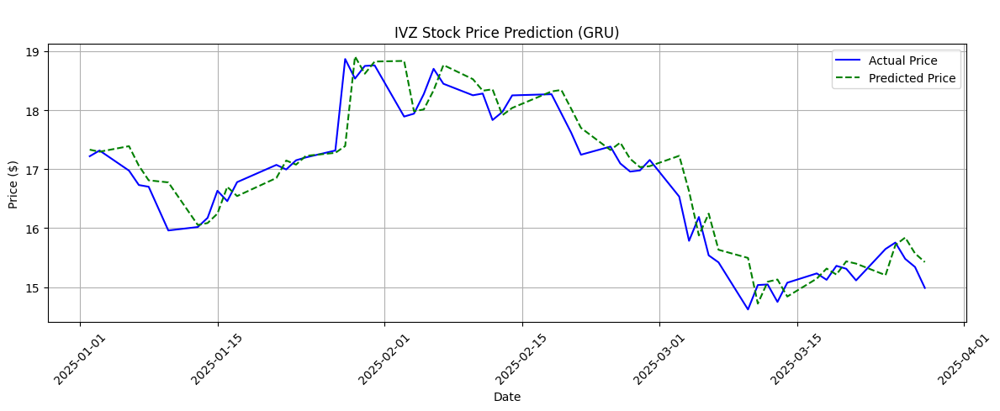

In [ ]:
process_and_display_gru('IVZ')


VALE Stock Evaluation Results:

R² Score  : 0.9350
MAE       : 0.1140
MSE       : 0.0227
RMSE      : 0.1508



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,8.545430,8.571662,0.000000,0.000000
1,2025-01-03,8.304850,8.533394,-2.815312,-0.446451
2,2025-01-06,8.295226,8.308226,-2.927929,-3.073341
3,2025-01-07,8.237488,8.281300,-3.603591,-3.387469
4,2025-01-08,8.179748,8.227829,-4.279277,-4.011273


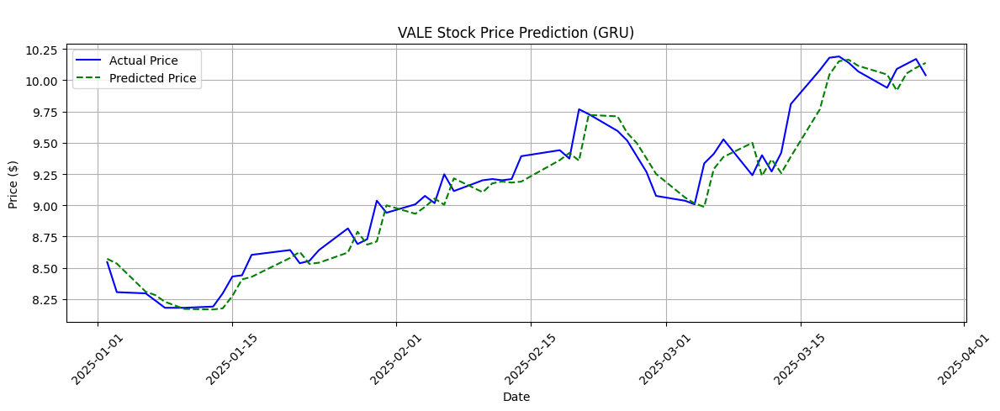

In [ ]:
process_and_display_gru('VALE')


SLB Stock Evaluation Results:

R² Score  : 0.5747
MAE       : 0.6027
MSE       : 0.6326
RMSE      : 0.7954



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,37.815872,37.137215,0.000000,0.000000
1,2025-01-03,38.002983,37.668713,0.494795,1.431179
2,2025-01-06,38.170395,37.950569,0.937497,2.190137
3,2025-01-07,38.771114,38.104874,2.526035,2.605629
4,2025-01-08,38.219635,38.647312,1.067707,4.066265


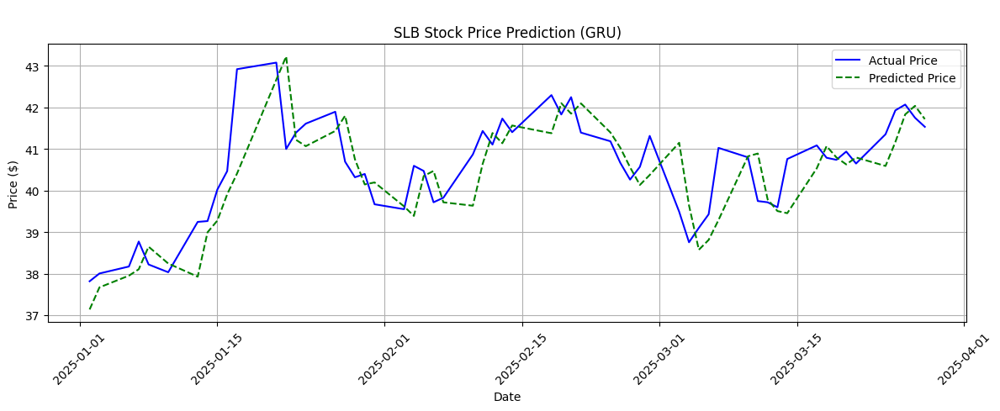

In [ ]:
process_and_display_gru('SLB')


BBD Stock Evaluation Results:

R² Score  : 0.8436
MAE       : 0.0373
MSE       : 0.0021
RMSE      : 0.0455



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,1.826484,1.799907,0.000000,0.000000
1,2025-01-03,1.767257,1.844973,-3.242665,2.503800
2,2025-01-06,1.808401,1.801807,-0.990069,0.105596
3,2025-01-07,1.865810,1.829091,2.153109,1.621437
4,2025-01-08,1.827537,1.883098,0.057650,4.622006


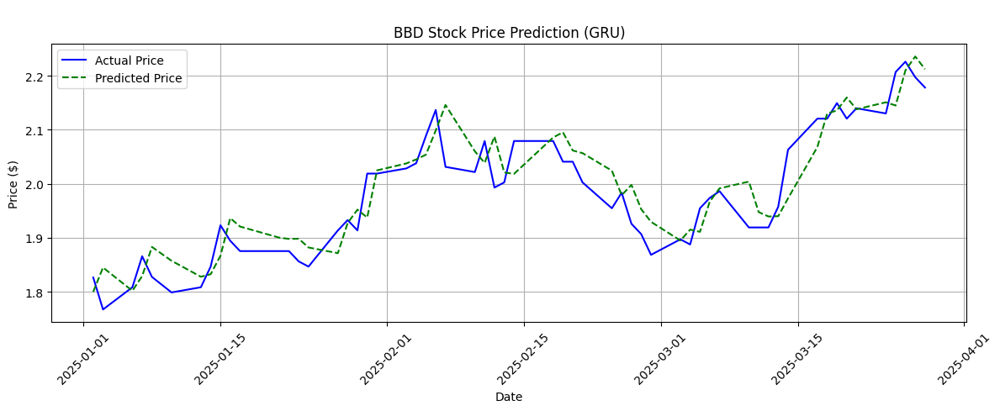

In [ ]:
process_and_display_gru('BBD')


KEY Stock Evaluation Results:

R² Score  : 0.8392
MAE       : 0.2479
MSE       : 0.0917
RMSE      : 0.3027



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,16.555264,16.714874,0.000000,0.000000
1,2025-01-03,16.857510,16.501438,1.825680,-1.276922
2,2025-01-06,16.945257,16.782227,2.355708,0.402951
3,2025-01-07,16.760012,16.878098,1.236756,0.976515
4,2025-01-08,16.682013,16.705561,0.765612,-0.055718


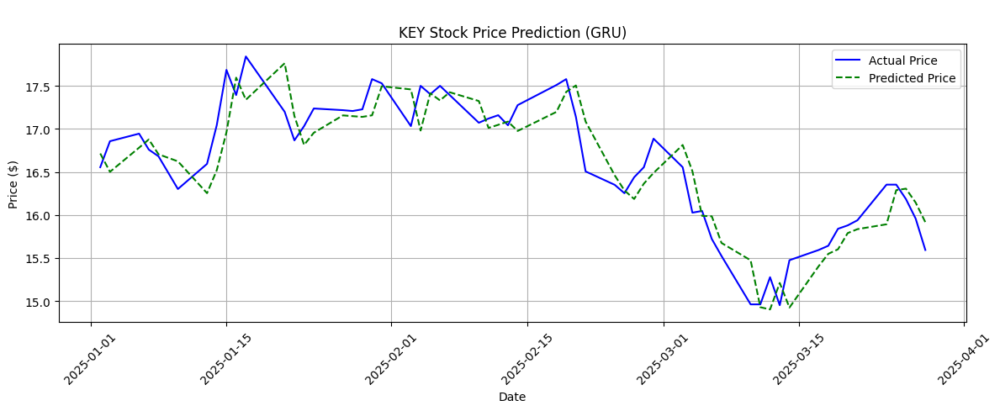

In [ ]:
process_and_display_gru('KEY')


ITUB Stock Evaluation Results:

R² Score  : 0.7428
MAE       : 0.1585
MSE       : 0.0638
RMSE      : 0.2525



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,5.54,4.253398,0.000000,0.000000
1,2025-01-03,6.00,5.471793,8.303250,28.645206
2,2025-01-06,6.58,5.914007,18.772563,39.041946
3,2025-01-07,6.29,6.481720,13.537906,52.389217
4,2025-01-08,5.72,6.191207,3.249094,45.559097


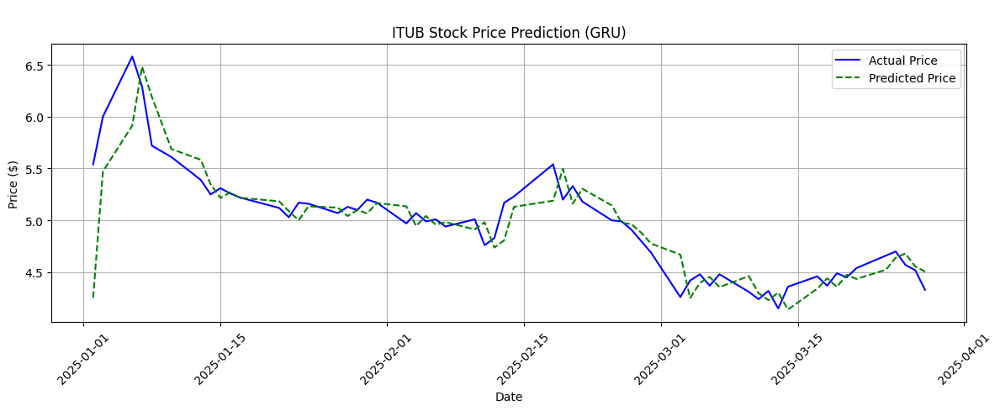

In [ ]:
process_and_display_gru('ITUB')


MP Stock Evaluation Results:

R² Score  : 0.8585
MAE       : 0.6630
MSE       : 0.8205
RMSE      : 0.9058



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,16.389999,16.695179,0.000000,0.000000
1,2025-01-03,18.200001,16.598736,11.043328,-0.577670
2,2025-01-06,20.459999,18.093349,24.832214,8.374691
3,2025-01-07,20.580000,20.275824,25.564373,21.447182
4,2025-01-08,19.379999,20.752762,18.242830,24.303925


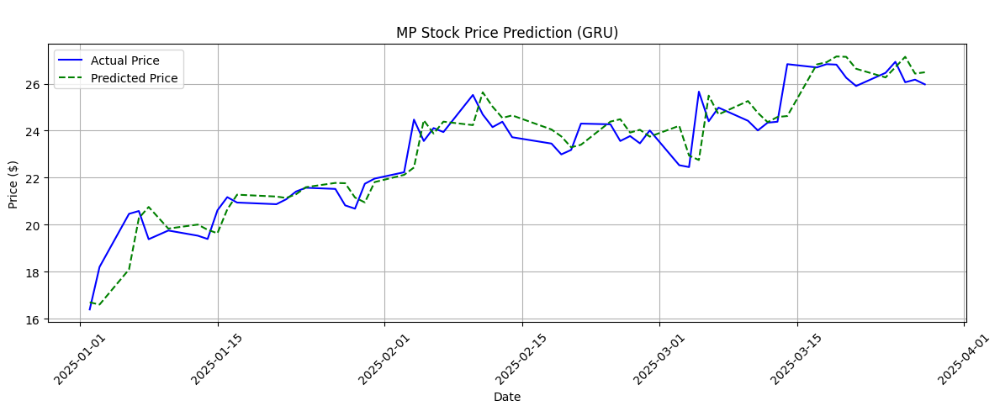

In [ ]:
process_and_display_gru('MP')


PBR Stock Evaluation Results:

R² Score  : 0.6799
MAE       : 0.2414
MSE       : 0.0944
RMSE      : 0.3072



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,12.874485,12.162872,0.000000,0.000000
1,2025-01-03,12.660560,12.719355,-1.661623,4.575253
2,2025-01-06,12.767522,12.551418,-0.830815,3.194523
3,2025-01-07,13.117583,12.636759,1.888217,3.896177
4,2025-01-08,13.030067,12.955153,1.208456,6.513929


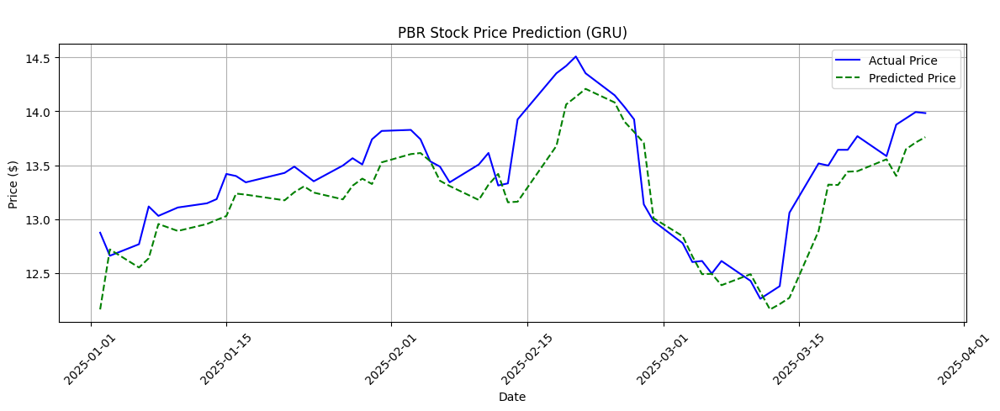

In [ ]:
process_and_display_gru('PBR')


SNAP Stock Evaluation Results:

R² Score  : 0.8758
MAE       : 0.3007
MSE       : 0.1402
RMSE      : 0.3744



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,11.24,11.111452,0.000000,0.000000
1,2025-01-03,11.97,11.211754,6.494666,0.902689
2,2025-01-06,12.57,11.739100,11.832740,5.648649
3,2025-01-07,12.55,12.367449,11.654808,11.303627
4,2025-01-08,12.04,12.597152,7.117440,13.370884


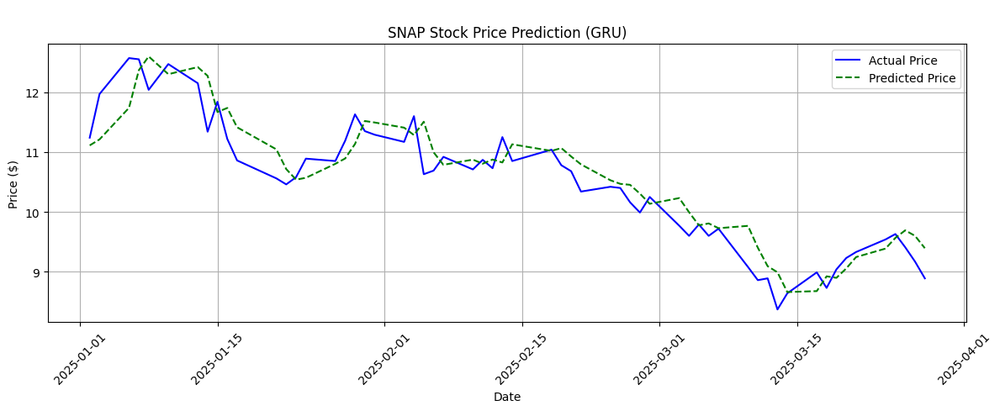

In [ ]:
process_and_display_gru('SNAP')


T Stock Evaluation Results:

R² Score  : 0.9194
MAE       : 0.4607
MSE       : 0.3089
RMSE      : 0.5557



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,22.086399,22.119820,0.000000,0.000000
1,2025-01-03,21.931610,22.085531,-0.700834,-0.155014
2,2025-01-06,21.863890,21.952566,-1.007450,-0.756127
3,2025-01-07,21.476919,21.880238,-2.759526,-1.083112
4,2025-01-08,21.457569,21.546207,-2.847137,-2.593207


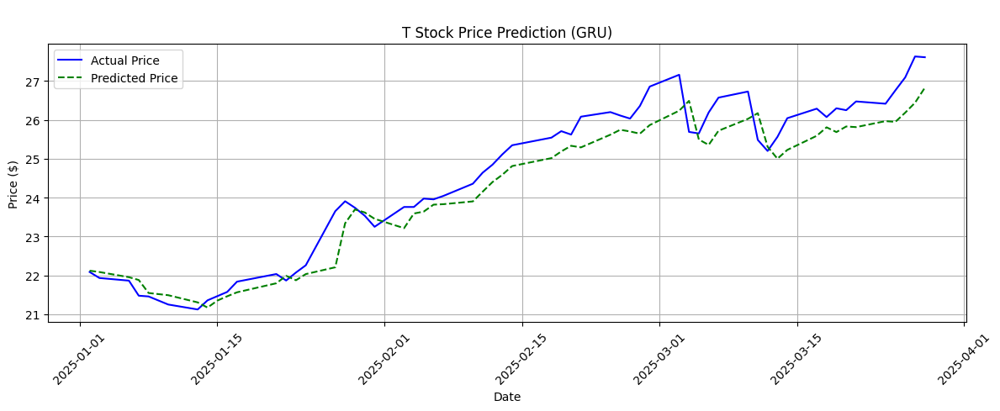

In [ ]:
process_and_display_gru('T')


IONQ Stock Evaluation Results:

R² Score  : 0.8245
MAE       : 2.6192
MSE       : 13.6913
RMSE      : 3.7002



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,43.099998,45.016640,0.000000,0.000000
1,2025-01-03,47.770000,43.865585,10.835272,-2.556956
2,2025-01-06,51.070000,46.319008,18.491883,2.893078
3,2025-01-07,49.590000,47.895660,15.058009,6.395459
4,2025-01-08,30.250000,47.499283,-29.814383,5.514944


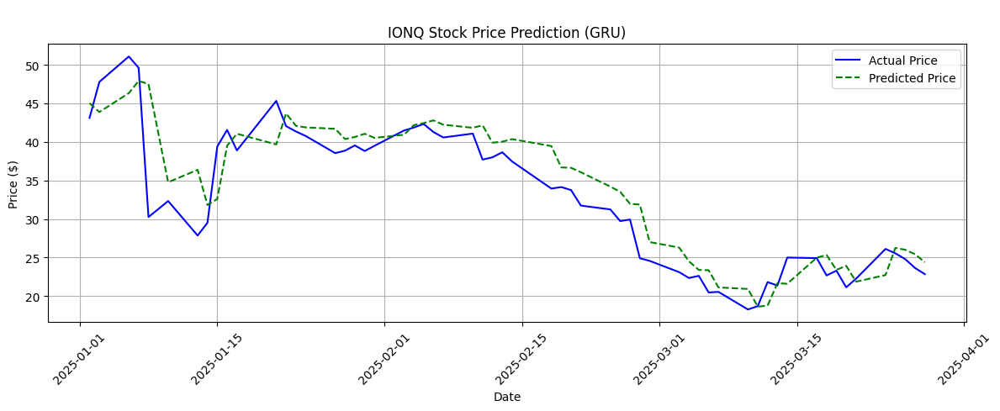

In [ ]:
process_and_display_gru('IONQ')


RIG Stock Evaluation Results:

R² Score  : 0.9092
MAE       : 0.1063
MSE       : 0.0176
RMSE      : 0.1325



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,3.95,3.572119,0.000000,0.000000
1,2025-01-03,3.96,3.844072,0.253164,7.613206
2,2025-01-06,3.98,3.957843,0.759493,10.798180
3,2025-01-07,4.16,4.007542,5.316451,12.189484
4,2025-01-08,3.99,4.139459,1.012657,15.882433


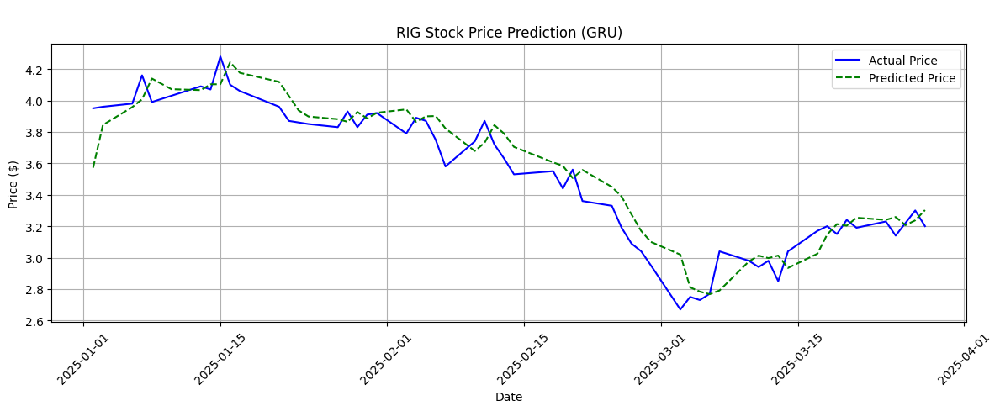

In [ ]:
process_and_display_gru('RIG')


CLF Stock Evaluation Results:

R² Score  : 0.6321
MAE       : 0.3440
MSE       : 0.2174
RMSE      : 0.4662



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,9.54,9.307648,0.000000,0.000000
1,2025-01-03,9.50,9.568997,-0.419287,2.807903
2,2025-01-06,9.90,9.566182,3.773581,2.777660
3,2025-01-07,10.05,9.924820,5.345914,6.630802
4,2025-01-08,9.75,10.100950,2.201258,8.523130


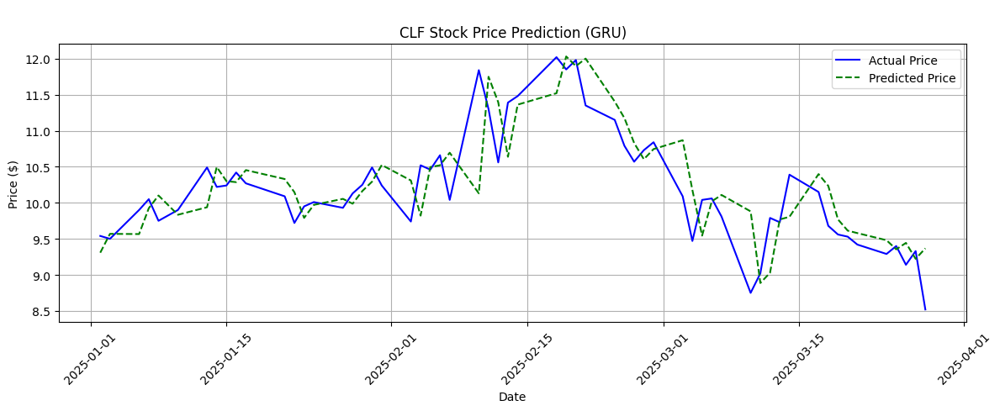

In [ ]:
process_and_display_gru('CLF')


PCG Stock Evaluation Results:

R² Score  : 0.8493
MAE       : 0.3006
MSE       : 0.2053
RMSE      : 0.4531



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,19.944868,20.013020,0.000000,0.000000
1,2025-01-03,20.333599,19.898726,1.949028,-0.571096
2,2025-01-06,19.795357,20.156483,-0.749623,0.716853
3,2025-01-07,19.914965,19.853998,-0.149930,-0.794590
4,2025-01-08,19.187342,19.811970,-3.798102,-1.004595


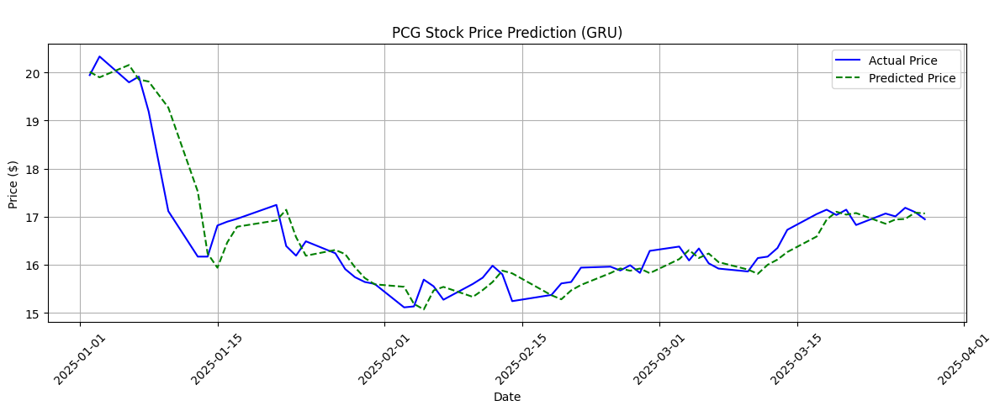

In [ ]:
process_and_display_gru('PCG')


BCS Stock Evaluation Results:

R² Score  : 0.8416
MAE       : 0.3035
MSE       : 0.1552
RMSE      : 0.3939



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,12.796194,12.914001,0.000000,0.000000
1,2025-01-03,12.961872,12.776529,1.294745,-1.064521
2,2025-01-06,13.263991,12.936153,3.655753,0.171530
3,2025-01-07,12.913143,13.221600,0.913936,2.381897
4,2025-01-08,12.854669,12.887974,0.456968,-0.201547


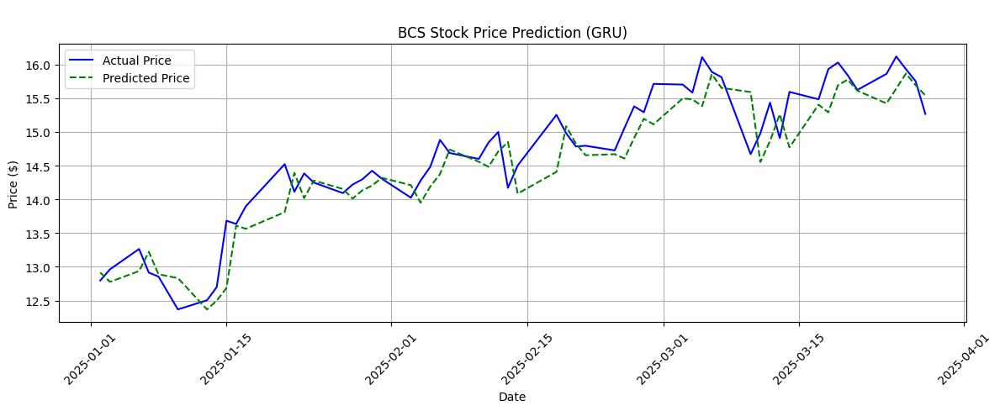

In [ ]:
process_and_display_gru('BCS')


TSLA Stock Evaluation Results:

R² Score  : 0.9474
MAE       : 11.3032
MSE       : 227.3271
RMSE      : 15.0774



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,379.279999,428.215698,0.000000,0.000000
1,2025-01-03,410.440002,381.975800,8.215567,-10.798275
2,2025-01-06,411.049988,397.569550,8.376395,-7.156706
3,2025-01-07,394.359985,405.589935,3.975951,-5.283731
4,2025-01-08,394.940002,392.374939,4.128877,-8.369791


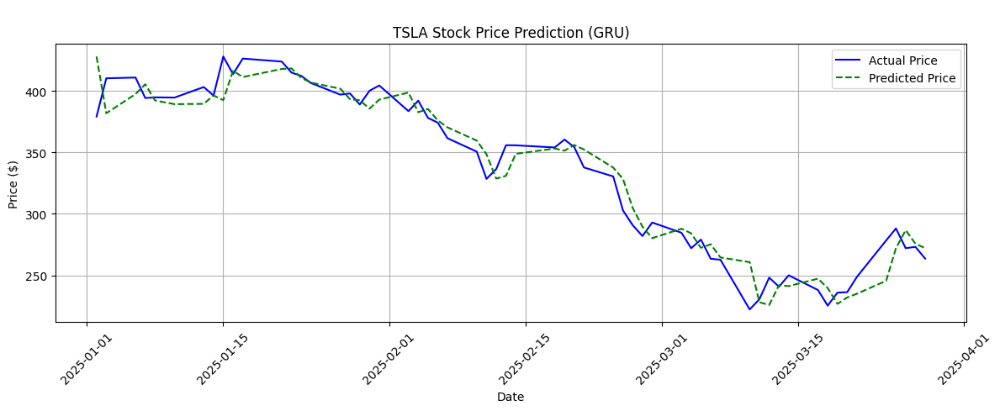

In [ ]:
process_and_display_gru('TSLA')


LCID Stock Evaluation Results:

R² Score  : 0.7280
MAE       : 0.1696
MSE       : 0.0446
RMSE      : 0.2112



,Date,Actual Price,Predicted Price,Actual Returns (%),Predicted Returns (%)
0,2025-01-02,3.03,3.063464,0.000000,0.000000
1,2025-01-03,3.29,2.999840,8.580858,-2.076864
2,2025-01-06,3.33,3.052003,9.900989,-0.374126
3,2025-01-07,3.18,3.111016,4.950498,1.552236
4,2025-01-08,2.98,3.088529,-1.650163,0.818169


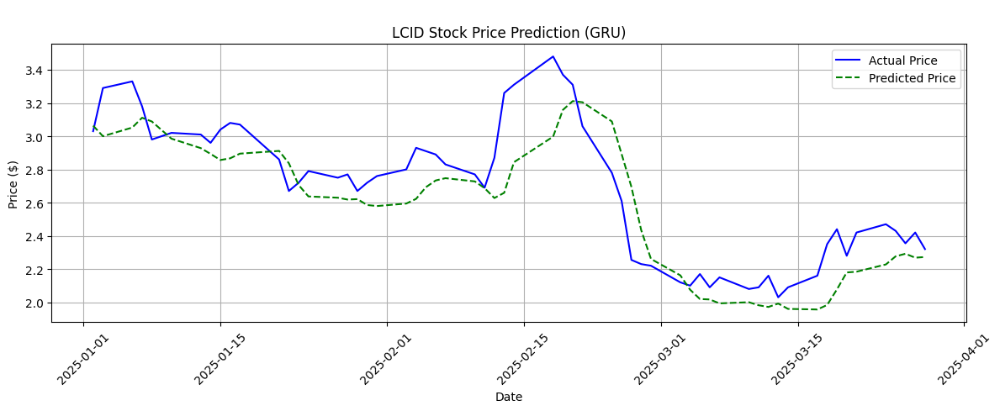

In [ ]:
process_and_display_gru('LCID')